In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F 
import torch.autograd
from torch.autograd import Variable
import torch.optim as optim
import numpy as np
import gym
from collections import deque
import random
import sys
import pandas as pd
import matplotlib.pyplot as plt
from numpy import cos, sin
from gym import spaces
from gym.error import DependencyNotInstalled
from typing import Optional
from control.matlab import ss, lsim, linspace, c2d
from functools import partial
from state_estimation import Estimator
import math
import gym
from stable_baselines3 import PPO, SAC, TD3, DDPG, DQN, A2C
from stable_baselines3.common.env_checker import check_env

In [12]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [13]:
class DCEnv(gym.Env):
    metadata = {
        "render_modes": ["human", "rgb_array"],
        "render_fps": 30,
    }

    def __init__(self, render_mode: Optional[str] = None, g=10.0):
        super(DCEnv, self).__init__()
        self.max_speed = -10
        self.max_torque = 10
        self.dt = 0.05

        self.render_mode = render_mode

        self.screen_dim = 500
        self.screen = None
        self.clock = None
        self.isopen = True
        self.center = np.array([math.pi / 2.0, 0, 0])
        self.obstacle = np.array([math.pi / 4.0, 0, 0])
        count = 0
        J = 0.01
        b = 0.1
        K = 0.01
        R = 1
        L = 0.5
        self.A = np.array([[0, 1, 0],
         [0, -b / J, K / J],
         [0, -K / L, -R / L]])
        self.A_dim = len(self.A)
        self.B = np.array([[0], [0], [1 / L]])
        self.xmeasure = 0
        self.attacked_element_idx = 0
        self.C = np.array([[1, 0, 0]])
        self.D = np.array([[0]])
        self.Q = np.eye(self.A_dim)
        self.R = np.array([[1]])
        self.dt = 0.2
        self.x_ref = np.array([[0], [0], [0]]) # 4th dim is remaining steps
        # store current trace
        self.cache1 = []
        self.cache2 = []
        self.cache3 = []
        self.x0 = np.copy(self.x_ref)
        self.u_upbound_tuned = np.array([[10]])
        # ball radius
        self.target_norm_radius = 0.5 # norm ball radius of target, tune this
        self.safe_norm_radius = 0.2 # norm ball radius of safe, tune this
        self.total_time = 120
        # step number
        self.steps = 0
        self.u_lowbound = None
        # store training traces
        self.state_array_1 = []
        self.state_array_2 = []
        self.state_array_3 = []
        self.caches = []
        self.reward_cache = [] # cache distances to target norm ball center
#         self.avoid_reward_cache = [] # cache distances to obstacles norm ball center
        self.final_reward_cache = [] # cache final reward
        # How long should this trace be, i.e. deadline
        self.step_const = random.randint(10, 50)
        # Maximum reward from each trace
        self.max_reward_list = []
        self.quality_list = []
        self.total_steps = 0
        self.step_history = []
        self.sysc = ss(self.A, self.B, self.C, self.D)
        self.sysd = c2d(self.sysc, self.dt)
        
        high = np.array(self.x_ref.flatten(), dtype=np.float32)
        self.action_space = spaces.Box(
            low=-self.max_torque, high=self.max_torque, shape=(1,), dtype=np.float32
        )
        self.observation_space = spaces.Box(low=-high, high=high, dtype=np.float32)
        self.reached = False
        self.k = 20
    def step(self, u):
        
        # simulate next step and get measurement
        self.steps += 1
        self.total_steps += 1
        terminated = False
        dt = self.dt
        u = np.clip(u, -self.max_torque, self.max_torque)[0]
        self.last_u = u 
        costs = 1
        yout, T, xout = lsim(self.sysc, self.last_u, [0, self.dt], self.xmeasure)
        self.xmeasure = xout[-1]
        
        # calculate euclidean distance and update reward cache
        dist = np.linalg.norm(self.xmeasure - self.center)
        obs_dist = np.linalg.norm(self.xmeasure - self.obstacle)
        reward = self.target_norm_radius - dist
#         obs_reward = obs_dist-self.safe_norm_radius
        
        self.reward_cache.append(reward)
#         self.avoid_reward_cache.append(obs_reward)
        # quantitative semantics
        # reach reward, encourage reaching target
        if self.steps < 10:
            reach_reward = max(self.reward_cache)
        else:
            reach_reward = max(self.reward_cache[-10:])
#         if self.steps < 10:
#             avoid_reward = min(self.avoid_reward_cache)
#         else:
#             avoid_reward = min(self.avoid_reward_cache[-10:])          
                    
#         # very strict reward, always within target
#         strict_avoid_reward = avoid_reward - 0.5 * self.safe_norm_radius # half safe norm radius
#         strict_reach_reward = reach_reward - 0.5 * self.target_norm_radius # half target norm radius
        
        # overall reward, pick one of the final_reward
#         final_reward = reach_reward
#         final_reward = approach_reward
#         final_reward = min(reach_reward, avoid_reward) # reach and avoid
#         final_reward = min(approach_reward, avoid_reward) # approach and avoid
#         final_reward = min(reach_reward, approach_reward) # reach and approach
#         deadline_reward = (self.last_dist-dist)/(self.step_const - self.steps+1) 
        final_reward = reach_reward
        # split cases: if already inside target, give very large constant reward for maintaining
        if dist <= self.target_norm_radius:
            final_reward = 10 # this gives 39/50 sucess with reach+approach+avoid
        
        self.final_reward_cache.append(final_reward)
        
        # update cached memory
        self.state = self.xmeasure
        self.state_array_1.append(self.state[0])
        self.state_array_2.append(self.state[1])
        self.state_array_3.append(self.state[2])
        self.cache1.append(self.state[0])
        self.cache2.append(self.state[1])
        self.cache3.append(self.state[2])
        self.last_dist = dist
        # If this is the last step, reset the state
        if self.steps == self.step_const or obs_dist<=self.safe_norm_radius:
            self.max_reward_list.append(max(self.final_reward_cache)) # use max final reward to measure episodes
            self.step_history.append(self.total_steps)
            self.quality_list.append(sum(self.final_reward_cache))
            terminated = True
            self.reset()
            
#         # If within target norm ball, early terminate
#         if dist <= self.target_norm_radius:
#             terminated = True
#             self.reset()
        
        # Return next state, reward, done, info
        return self._get_obs(), final_reward, terminated, {}
        
    def reset(self):
        self.state = np.array([random.random()*math.pi, random.random()*2-1, random.random()*20-10])
        self.reward_cache = []
        self.final_reward_cache = []
        self.steps=0
        self.caches.append(self.cache1)
        self.caches.append(self.cache2)
        self.caches.append(self.cache3)
        self.cache1 = []
        self.cache2 = []
        self.cache3 = []
        self.xmeasure = self.state
        # random # of steps for this trace
        self.step_const = self.k # deadline range
        self.reached = False
        return np.array(self.state) # return something matching shape
    
    def _get_obs(self):
        current_state = list(self.state)
        return np.array(current_state)
    
    def render(self):
        return
    
    def close(self):
        if self.screen is not None:
            import pygame
            pygame.display.quit()
            pygame.quit()
            self.isopen = False

In [14]:
reached = []
for k in [20,40,80,160]:
    env = DCEnv()
    env.k = k
    print('Start training with PPO ...')
    # learning_rate = 1e-3, n_steps = 1024, tune these
    model = SAC("MlpPolicy", env, verbose=1)
    model.learn(total_timesteps=300000, progress_bar=False)
    vec_env = model.get_env()
    obs = vec_env.reset()
    env = DCEnv()
    env.k = 160
    state = env.reset()
    dims0 = []
    dims1 = []
    dims2 = []
    euclids = []
    center = np.array([math.pi / 2.0, 0, 0])
    obstacle = np.array([math.pi / 4.0, 0, 0])
    num_reached = 0
    for j in range(1000):
        dim0 = []
        dim1 = []
        dim2 = []
        euclid = []
        state = env.reset()
        # Print initial state
        for i in range(30):
            action, _states = model.predict(state, deterministic=True)
            new_state, reward, done, _ = env.step(action)
            dim0.append(state[0])
            dim1.append(state[1])
            dim2.append(state[2])
            dist = np.linalg.norm(state[:3]-center)
            obs_dist = np.linalg.norm(state[:3]-obstacle)
            euclid.append(dist)
            state = new_state
            if obs_dist <= 0.2:
                break
            if dist <= 0.5: # stop
                num_reached += 1
                break
        dims0.append(dim0)
        dims1.append(dim1)
        dims2.append(dim2)
        euclids.append(euclid)
    reached.append(num_reached)
#     print("Total number reached = " + str(num_reached))

Start training with PPO ...
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -7.2     |
| time/              |          |
|    episodes        | 4        |
|    fps             | 1098     |
|    time_elapsed    | 0        |
|    total_timesteps | 80       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | -6.66    |
| time/              |          |
|    episodes        | 8        |
|    fps             | 164      |
|    time_elapsed    | 0        |
|    total_timesteps | 160      |
| train/             |          |
|    actor_loss      | -0.666   |
|    critic_loss     | 6.08     |
|    ent_coef        | 0.983    |
|    ent_coef_loss   | -0.0281  |
|    learning_rate   | 0.0003   |
|    n_updates       | 59   

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.2     |
|    ep_rew_mean     | 9.38     |
| time/              |          |
|    episodes        | 64       |
|    fps             | 72       |
|    time_elapsed    | 16       |
|    total_timesteps | 1228     |
| train/             |          |
|    actor_loss      | -5.23    |
|    critic_loss     | 5.85     |
|    ent_coef        | 0.741    |
|    ent_coef_loss   | -0.227   |
|    learning_rate   | 0.0003   |
|    n_updates       | 1127     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19       |
|    ep_rew_mean     | 8.45     |
| time/              |          |
|    episodes        | 68       |
|    fps             | 72       |
|    time_elapsed    | 17       |
|    total_timesteps | 1293     |
| train/             |          |
|    actor_loss      | -5.17    |
|    critic_loss     | 7.57     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.9     |
|    ep_rew_mean     | 31       |
| time/              |          |
|    episodes        | 124      |
|    fps             | 69       |
|    time_elapsed    | 33       |
|    total_timesteps | 2365     |
| train/             |          |
|    actor_loss      | -16      |
|    critic_loss     | 26.3     |
|    ent_coef        | 0.635    |
|    ent_coef_loss   | -0.0761  |
|    learning_rate   | 0.0003   |
|    n_updates       | 2264     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.9     |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 128      |
|    fps             | 69       |
|    time_elapsed    | 35       |
|    total_timesteps | 2445     |
| train/             |          |
|    actor_loss      | -15.5    |
|    critic_loss     | 25.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.5     |
|    ep_rew_mean     | 65.9     |
| time/              |          |
|    episodes        | 184      |
|    fps             | 68       |
|    time_elapsed    | 51       |
|    total_timesteps | 3546     |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 70.7     |
|    ent_coef        | 0.673    |
|    ent_coef_loss   | 0.191    |
|    learning_rate   | 0.0003   |
|    n_updates       | 3445     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.5     |
|    ep_rew_mean     | 70.2     |
| time/              |          |
|    episodes        | 188      |
|    fps             | 68       |
|    time_elapsed    | 52       |
|    total_timesteps | 3626     |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 70       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 96.4     |
| time/              |          |
|    episodes        | 244      |
|    fps             | 67       |
|    time_elapsed    | 69       |
|    total_timesteps | 4746     |
| train/             |          |
|    actor_loss      | -55.9    |
|    critic_loss     | 165      |
|    ent_coef        | 0.884    |
|    ent_coef_loss   | 0.0331   |
|    learning_rate   | 0.0003   |
|    n_updates       | 4645     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 94.6     |
| time/              |          |
|    episodes        | 248      |
|    fps             | 67       |
|    time_elapsed    | 71       |
|    total_timesteps | 4826     |
| train/             |          |
|    actor_loss      | -56      |
|    critic_loss     | 246      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 304      |
|    fps             | 67       |
|    time_elapsed    | 88       |
|    total_timesteps | 5946     |
| train/             |          |
|    actor_loss      | -70.3    |
|    critic_loss     | 307      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | -0.005   |
|    learning_rate   | 0.0003   |
|    n_updates       | 5845     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 308      |
|    fps             | 67       |
|    time_elapsed    | 89       |
|    total_timesteps | 6026     |
| train/             |          |
|    actor_loss      | -71      |
|    critic_loss     | 421      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.5     |
| time/              |          |
|    episodes        | 364      |
|    fps             | 67       |
|    time_elapsed    | 106      |
|    total_timesteps | 7146     |
| train/             |          |
|    actor_loss      | -80.7    |
|    critic_loss     | 344      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | 0.0246   |
|    learning_rate   | 0.0003   |
|    n_updates       | 7045     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.7     |
| time/              |          |
|    episodes        | 368      |
|    fps             | 67       |
|    time_elapsed    | 107      |
|    total_timesteps | 7226     |
| train/             |          |
|    actor_loss      | -79.8    |
|    critic_loss     | 353      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82.8     |
| time/              |          |
|    episodes        | 424      |
|    fps             | 66       |
|    time_elapsed    | 125      |
|    total_timesteps | 8346     |
| train/             |          |
|    actor_loss      | -84      |
|    critic_loss     | 407      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | 0.00545  |
|    learning_rate   | 0.0003   |
|    n_updates       | 8245     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82.9     |
| time/              |          |
|    episodes        | 428      |
|    fps             | 66       |
|    time_elapsed    | 126      |
|    total_timesteps | 8426     |
| train/             |          |
|    actor_loss      | -82.4    |
|    critic_loss     | 318      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.3     |
| time/              |          |
|    episodes        | 484      |
|    fps             | 66       |
|    time_elapsed    | 143      |
|    total_timesteps | 9546     |
| train/             |          |
|    actor_loss      | -81.6    |
|    critic_loss     | 390      |
|    ent_coef        | 0.891    |
|    ent_coef_loss   | 0.00584  |
|    learning_rate   | 0.0003   |
|    n_updates       | 9445     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.5     |
| time/              |          |
|    episodes        | 488      |
|    fps             | 66       |
|    time_elapsed    | 144      |
|    total_timesteps | 9626     |
| train/             |          |
|    actor_loss      | -80.7    |
|    critic_loss     | 313      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.8     |
| time/              |          |
|    episodes        | 544      |
|    fps             | 66       |
|    time_elapsed    | 161      |
|    total_timesteps | 10746    |
| train/             |          |
|    actor_loss      | -80.1    |
|    critic_loss     | 318      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | -0.0175  |
|    learning_rate   | 0.0003   |
|    n_updates       | 10645    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.6     |
| time/              |          |
|    episodes        | 548      |
|    fps             | 66       |
|    time_elapsed    | 162      |
|    total_timesteps | 10826    |
| train/             |          |
|    actor_loss      | -78.7    |
|    critic_loss     | 343      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.3     |
| time/              |          |
|    episodes        | 604      |
|    fps             | 66       |
|    time_elapsed    | 179      |
|    total_timesteps | 11946    |
| train/             |          |
|    actor_loss      | -77.9    |
|    critic_loss     | 300      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | -0.0165  |
|    learning_rate   | 0.0003   |
|    n_updates       | 11845    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.2     |
| time/              |          |
|    episodes        | 608      |
|    fps             | 66       |
|    time_elapsed    | 181      |
|    total_timesteps | 12026    |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 292      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.7     |
| time/              |          |
|    episodes        | 664      |
|    fps             | 66       |
|    time_elapsed    | 197      |
|    total_timesteps | 13146    |
| train/             |          |
|    actor_loss      | -75.9    |
|    critic_loss     | 215      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | -0.00401 |
|    learning_rate   | 0.0003   |
|    n_updates       | 13045    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93       |
| time/              |          |
|    episodes        | 668      |
|    fps             | 66       |
|    time_elapsed    | 199      |
|    total_timesteps | 13226    |
| train/             |          |
|    actor_loss      | -76.4    |
|    critic_loss     | 273      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 112      |
| time/              |          |
|    episodes        | 724      |
|    fps             | 66       |
|    time_elapsed    | 215      |
|    total_timesteps | 14346    |
| train/             |          |
|    actor_loss      | -76.4    |
|    critic_loss     | 277      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | 0.0187   |
|    learning_rate   | 0.0003   |
|    n_updates       | 14245    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 111      |
| time/              |          |
|    episodes        | 728      |
|    fps             | 66       |
|    time_elapsed    | 217      |
|    total_timesteps | 14426    |
| train/             |          |
|    actor_loss      | -77.4    |
|    critic_loss     | 235      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 784      |
|    fps             | 66       |
|    time_elapsed    | 234      |
|    total_timesteps | 15546    |
| train/             |          |
|    actor_loss      | -74.8    |
|    critic_loss     | 217      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | 0.009    |
|    learning_rate   | 0.0003   |
|    n_updates       | 15445    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 788      |
|    fps             | 66       |
|    time_elapsed    | 235      |
|    total_timesteps | 15626    |
| train/             |          |
|    actor_loss      | -77.4    |
|    critic_loss     | 204      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 844      |
|    fps             | 66       |
|    time_elapsed    | 252      |
|    total_timesteps | 16746    |
| train/             |          |
|    actor_loss      | -76.7    |
|    critic_loss     | 326      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | 0.0177   |
|    learning_rate   | 0.0003   |
|    n_updates       | 16645    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 110      |
| time/              |          |
|    episodes        | 848      |
|    fps             | 66       |
|    time_elapsed    | 253      |
|    total_timesteps | 16826    |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 197      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 904      |
|    fps             | 66       |
|    time_elapsed    | 270      |
|    total_timesteps | 17946    |
| train/             |          |
|    actor_loss      | -77.4    |
|    critic_loss     | 299      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | -0.0113  |
|    learning_rate   | 0.0003   |
|    n_updates       | 17845    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 908      |
|    fps             | 66       |
|    time_elapsed    | 271      |
|    total_timesteps | 18026    |
| train/             |          |
|    actor_loss      | -77.3    |
|    critic_loss     | 200      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99       |
| time/              |          |
|    episodes        | 964      |
|    fps             | 66       |
|    time_elapsed    | 288      |
|    total_timesteps | 19146    |
| train/             |          |
|    actor_loss      | -76.3    |
|    critic_loss     | 248      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.0254   |
|    learning_rate   | 0.0003   |
|    n_updates       | 19045    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.6     |
| time/              |          |
|    episodes        | 968      |
|    fps             | 66       |
|    time_elapsed    | 289      |
|    total_timesteps | 19226    |
| train/             |          |
|    actor_loss      | -76.5    |
|    critic_loss     | 289      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 96        |
| time/              |           |
|    episodes        | 1024      |
|    fps             | 66        |
|    time_elapsed    | 306       |
|    total_timesteps | 20346     |
| train/             |           |
|    actor_loss      | -78.4     |
|    critic_loss     | 244       |
|    ent_coef        | 1.03      |
|    ent_coef_loss   | -0.000978 |
|    learning_rate   | 0.0003    |
|    n_updates       | 20245     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.4     |
| time/              |          |
|    episodes        | 1028     |
|    fps             | 66       |
|    time_elapsed    | 307      |
|    total_timesteps | 20426    |
| train/             |          |
|    actor_loss      | -79.1    |
|    critic_loss     | 358     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 1084     |
|    fps             | 66       |
|    time_elapsed    | 324      |
|    total_timesteps | 21546    |
| train/             |          |
|    actor_loss      | -80.4    |
|    critic_loss     | 294      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | 0.000975 |
|    learning_rate   | 0.0003   |
|    n_updates       | 21445    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 1088     |
|    fps             | 66       |
|    time_elapsed    | 325      |
|    total_timesteps | 21626    |
| train/             |          |
|    actor_loss      | -79.4    |
|    critic_loss     | 322      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.6     |
| time/              |          |
|    episodes        | 1144     |
|    fps             | 66       |
|    time_elapsed    | 343      |
|    total_timesteps | 22746    |
| train/             |          |
|    actor_loss      | -78.6    |
|    critic_loss     | 316      |
|    ent_coef        | 0.992    |
|    ent_coef_loss   | 0.000241 |
|    learning_rate   | 0.0003   |
|    n_updates       | 22645    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.6     |
| time/              |          |
|    episodes        | 1148     |
|    fps             | 66       |
|    time_elapsed    | 344      |
|    total_timesteps | 22826    |
| train/             |          |
|    actor_loss      | -79.5    |
|    critic_loss     | 249      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 90.1      |
| time/              |           |
|    episodes        | 1204      |
|    fps             | 66        |
|    time_elapsed    | 362       |
|    total_timesteps | 23946     |
| train/             |           |
|    actor_loss      | -82       |
|    critic_loss     | 368       |
|    ent_coef        | 0.992     |
|    ent_coef_loss   | -0.000502 |
|    learning_rate   | 0.0003    |
|    n_updates       | 23845     |
----------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 89.6      |
| time/              |           |
|    episodes        | 1208      |
|    fps             | 66        |
|    time_elapsed    | 363       |
|    total_timesteps | 24026     |
| train/             |           |
|    actor_loss      | -81.5     |
|    critic_loss    

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96       |
| time/              |          |
|    episodes        | 1264     |
|    fps             | 66       |
|    time_elapsed    | 380      |
|    total_timesteps | 25146    |
| train/             |          |
|    actor_loss      | -80.8    |
|    critic_loss     | 286      |
|    ent_coef        | 0.936    |
|    ent_coef_loss   | -0.00326 |
|    learning_rate   | 0.0003   |
|    n_updates       | 25045    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.9     |
| time/              |          |
|    episodes        | 1268     |
|    fps             | 66       |
|    time_elapsed    | 381      |
|    total_timesteps | 25226    |
| train/             |          |
|    actor_loss      | -80.1    |
|    critic_loss     | 296      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.5     |
| time/              |          |
|    episodes        | 1324     |
|    fps             | 66       |
|    time_elapsed    | 398      |
|    total_timesteps | 26346    |
| train/             |          |
|    actor_loss      | -82.8    |
|    critic_loss     | 327      |
|    ent_coef        | 0.939    |
|    ent_coef_loss   | 0.0132   |
|    learning_rate   | 0.0003   |
|    n_updates       | 26245    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.8     |
| time/              |          |
|    episodes        | 1328     |
|    fps             | 66       |
|    time_elapsed    | 399      |
|    total_timesteps | 26426    |
| train/             |          |
|    actor_loss      | -82.3    |
|    critic_loss     | 313      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.2     |
| time/              |          |
|    episodes        | 1384     |
|    fps             | 66       |
|    time_elapsed    | 416      |
|    total_timesteps | 27546    |
| train/             |          |
|    actor_loss      | -81.6    |
|    critic_loss     | 414      |
|    ent_coef        | 0.963    |
|    ent_coef_loss   | 0.000358 |
|    learning_rate   | 0.0003   |
|    n_updates       | 27445    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.9     |
| time/              |          |
|    episodes        | 1388     |
|    fps             | 66       |
|    time_elapsed    | 418      |
|    total_timesteps | 27626    |
| train/             |          |
|    actor_loss      | -82.5    |
|    critic_loss     | 512      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.6     |
| time/              |          |
|    episodes        | 1444     |
|    fps             | 66       |
|    time_elapsed    | 435      |
|    total_timesteps | 28746    |
| train/             |          |
|    actor_loss      | -82.3    |
|    critic_loss     | 369      |
|    ent_coef        | 0.978    |
|    ent_coef_loss   | -0.00197 |
|    learning_rate   | 0.0003   |
|    n_updates       | 28645    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.2     |
| time/              |          |
|    episodes        | 1448     |
|    fps             | 66       |
|    time_elapsed    | 436      |
|    total_timesteps | 28826    |
| train/             |          |
|    actor_loss      | -80.7    |
|    critic_loss     | 238      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 96.9     |
| time/              |          |
|    episodes        | 1504     |
|    fps             | 66       |
|    time_elapsed    | 453      |
|    total_timesteps | 29927    |
| train/             |          |
|    actor_loss      | -80.9    |
|    critic_loss     | 250      |
|    ent_coef        | 0.956    |
|    ent_coef_loss   | 0.00272  |
|    learning_rate   | 0.0003   |
|    n_updates       | 29826    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 94.6     |
| time/              |          |
|    episodes        | 1508     |
|    fps             | 66       |
|    time_elapsed    | 454      |
|    total_timesteps | 30007    |
| train/             |          |
|    actor_loss      | -81.5    |
|    critic_loss     | 214      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.5     |
| time/              |          |
|    episodes        | 1564     |
|    fps             | 66       |
|    time_elapsed    | 471      |
|    total_timesteps | 31127    |
| train/             |          |
|    actor_loss      | -82.7    |
|    critic_loss     | 365      |
|    ent_coef        | 0.965    |
|    ent_coef_loss   | -0.00294 |
|    learning_rate   | 0.0003   |
|    n_updates       | 31026    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.3     |
| time/              |          |
|    episodes        | 1568     |
|    fps             | 66       |
|    time_elapsed    | 472      |
|    total_timesteps | 31207    |
| train/             |          |
|    actor_loss      | -82.7    |
|    critic_loss     | 314      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.3     |
| time/              |          |
|    episodes        | 1624     |
|    fps             | 66       |
|    time_elapsed    | 489      |
|    total_timesteps | 32327    |
| train/             |          |
|    actor_loss      | -81.9    |
|    critic_loss     | 354      |
|    ent_coef        | 0.938    |
|    ent_coef_loss   | 0.000336 |
|    learning_rate   | 0.0003   |
|    n_updates       | 32226    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.3     |
| time/              |          |
|    episodes        | 1628     |
|    fps             | 66       |
|    time_elapsed    | 490      |
|    total_timesteps | 32407    |
| train/             |          |
|    actor_loss      | -81.7    |
|    critic_loss     | 297      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 85.3     |
| time/              |          |
|    episodes        | 1684     |
|    fps             | 66       |
|    time_elapsed    | 507      |
|    total_timesteps | 33508    |
| train/             |          |
|    actor_loss      | -81.2    |
|    critic_loss     | 316      |
|    ent_coef        | 0.939    |
|    ent_coef_loss   | -0.00193 |
|    learning_rate   | 0.0003   |
|    n_updates       | 33407    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 86       |
| time/              |          |
|    episodes        | 1688     |
|    fps             | 66       |
|    time_elapsed    | 508      |
|    total_timesteps | 33588    |
| train/             |          |
|    actor_loss      | -80.2    |
|    critic_loss     | 191      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 83.3     |
| time/              |          |
|    episodes        | 1744     |
|    fps             | 65       |
|    time_elapsed    | 527      |
|    total_timesteps | 34708    |
| train/             |          |
|    actor_loss      | -80.7    |
|    critic_loss     | 302      |
|    ent_coef        | 0.915    |
|    ent_coef_loss   | 0.00912  |
|    learning_rate   | 0.0003   |
|    n_updates       | 34607    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 84.1     |
| time/              |          |
|    episodes        | 1748     |
|    fps             | 65       |
|    time_elapsed    | 528      |
|    total_timesteps | 34788    |
| train/             |          |
|    actor_loss      | -81      |
|    critic_loss     | 270      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.1     |
| time/              |          |
|    episodes        | 1804     |
|    fps             | 65       |
|    time_elapsed    | 545      |
|    total_timesteps | 35908    |
| train/             |          |
|    actor_loss      | -79.4    |
|    critic_loss     | 364      |
|    ent_coef        | 0.938    |
|    ent_coef_loss   | -0.00387 |
|    learning_rate   | 0.0003   |
|    n_updates       | 35807    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.1     |
| time/              |          |
|    episodes        | 1808     |
|    fps             | 65       |
|    time_elapsed    | 547      |
|    total_timesteps | 35988    |
| train/             |          |
|    actor_loss      | -79.3    |
|    critic_loss     | 289      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 76.3     |
| time/              |          |
|    episodes        | 1864     |
|    fps             | 65       |
|    time_elapsed    | 563      |
|    total_timesteps | 37089    |
| train/             |          |
|    actor_loss      | -79.1    |
|    critic_loss     | 304      |
|    ent_coef        | 0.965    |
|    ent_coef_loss   | 0.00417  |
|    learning_rate   | 0.0003   |
|    n_updates       | 36988    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 19.8      |
|    ep_rew_mean     | 77.6      |
| time/              |           |
|    episodes        | 1868      |
|    fps             | 65        |
|    time_elapsed    | 565       |
|    total_timesteps | 37169     |
| train/             |           |
|    actor_loss      | -78.5     |
|    critic_loss     | 342       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 89.7     |
| time/              |          |
|    episodes        | 1924     |
|    fps             | 65       |
|    time_elapsed    | 582      |
|    total_timesteps | 38289    |
| train/             |          |
|    actor_loss      | -77.6    |
|    critic_loss     | 152      |
|    ent_coef        | 1.01     |
|    ent_coef_loss   | -0.00166 |
|    learning_rate   | 0.0003   |
|    n_updates       | 38188    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 93.1     |
| time/              |          |
|    episodes        | 1928     |
|    fps             | 65       |
|    time_elapsed    | 583      |
|    total_timesteps | 38369    |
| train/             |          |
|    actor_loss      | -79.7    |
|    critic_loss     | 215      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.9     |
| time/              |          |
|    episodes        | 1984     |
|    fps             | 65       |
|    time_elapsed    | 600      |
|    total_timesteps | 39489    |
| train/             |          |
|    actor_loss      | -77.4    |
|    critic_loss     | 217      |
|    ent_coef        | 0.952    |
|    ent_coef_loss   | 0.0102   |
|    learning_rate   | 0.0003   |
|    n_updates       | 39388    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 88.7     |
| time/              |          |
|    episodes        | 1988     |
|    fps             | 65       |
|    time_elapsed    | 601      |
|    total_timesteps | 39550    |
| train/             |          |
|    actor_loss      | -77.1    |
|    critic_loss     | 244      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 92.8     |
| time/              |          |
|    episodes        | 2044     |
|    fps             | 65       |
|    time_elapsed    | 618      |
|    total_timesteps | 40670    |
| train/             |          |
|    actor_loss      | -75.5    |
|    critic_loss     | 179      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | 0.0018   |
|    learning_rate   | 0.0003   |
|    n_updates       | 40569    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 95       |
| time/              |          |
|    episodes        | 2048     |
|    fps             | 65       |
|    time_elapsed    | 619      |
|    total_timesteps | 40750    |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 270      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 97.5      |
| time/              |           |
|    episodes        | 2100      |
|    fps             | 65        |
|    time_elapsed    | 635       |
|    total_timesteps | 41790     |
| train/             |           |
|    actor_loss      | -73.9     |
|    critic_loss     | 378       |
|    ent_coef        | 0.999     |
|    ent_coef_loss   | -0.000141 |
|    learning_rate   | 0.0003    |
|    n_updates       | 41689     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.4     |
| time/              |          |
|    episodes        | 2104     |
|    fps             | 65       |
|    time_elapsed    | 636      |
|    total_timesteps | 41870    |
| train/             |          |
|    actor_loss      | -75.8    |
|    critic_loss     | 223     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.2     |
| time/              |          |
|    episodes        | 2156     |
|    fps             | 65       |
|    time_elapsed    | 652      |
|    total_timesteps | 42910    |
| train/             |          |
|    actor_loss      | -75.6    |
|    critic_loss     | 283      |
|    ent_coef        | 0.995    |
|    ent_coef_loss   | 0.000106 |
|    learning_rate   | 0.0003   |
|    n_updates       | 42809    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89       |
| time/              |          |
|    episodes        | 2160     |
|    fps             | 65       |
|    time_elapsed    | 653      |
|    total_timesteps | 42990    |
| train/             |          |
|    actor_loss      | -74.4    |
|    critic_loss     | 331      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.3     |
| time/              |          |
|    episodes        | 2212     |
|    fps             | 65       |
|    time_elapsed    | 669      |
|    total_timesteps | 44030    |
| train/             |          |
|    actor_loss      | -75.9    |
|    critic_loss     | 205      |
|    ent_coef        | 1.02     |
|    ent_coef_loss   | 0.00147  |
|    learning_rate   | 0.0003   |
|    n_updates       | 43929    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 97.6     |
| time/              |          |
|    episodes        | 2216     |
|    fps             | 65       |
|    time_elapsed    | 670      |
|    total_timesteps | 44091    |
| train/             |          |
|    actor_loss      | -75.1    |
|    critic_loss     | 232      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 2272     |
|    fps             | 65       |
|    time_elapsed    | 687      |
|    total_timesteps | 45211    |
| train/             |          |
|    actor_loss      | -74.5    |
|    critic_loss     | 264      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | -0.00327 |
|    learning_rate   | 0.0003   |
|    n_updates       | 45110    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 2276     |
|    fps             | 65       |
|    time_elapsed    | 688      |
|    total_timesteps | 45291    |
| train/             |          |
|    actor_loss      | -74      |
|    critic_loss     | 196      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 2332     |
|    fps             | 65       |
|    time_elapsed    | 705      |
|    total_timesteps | 46411    |
| train/             |          |
|    actor_loss      | -75.7    |
|    critic_loss     | 191      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | 0.00481  |
|    learning_rate   | 0.0003   |
|    n_updates       | 46310    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 2336     |
|    fps             | 65       |
|    time_elapsed    | 706      |
|    total_timesteps | 46491    |
| train/             |          |
|    actor_loss      | -74.9    |
|    critic_loss     | 302      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 91       |
| time/              |          |
|    episodes        | 2392     |
|    fps             | 65       |
|    time_elapsed    | 724      |
|    total_timesteps | 47599    |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 314      |
|    ent_coef        | 1.02     |
|    ent_coef_loss   | 0.00241  |
|    learning_rate   | 0.0003   |
|    n_updates       | 47498    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 89.7     |
| time/              |          |
|    episodes        | 2396     |
|    fps             | 65       |
|    time_elapsed    | 725      |
|    total_timesteps | 47679    |
| train/             |          |
|    actor_loss      | -75      |
|    critic_loss     | 284      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 19.8      |
|    ep_rew_mean     | 84.1      |
| time/              |           |
|    episodes        | 2452      |
|    fps             | 65        |
|    time_elapsed    | 742       |
|    total_timesteps | 48781     |
| train/             |           |
|    actor_loss      | -73.7     |
|    critic_loss     | 229       |
|    ent_coef        | 0.996     |
|    ent_coef_loss   | -0.000158 |
|    learning_rate   | 0.0003    |
|    n_updates       | 48680     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 82.6     |
| time/              |          |
|    episodes        | 2456     |
|    fps             | 65       |
|    time_elapsed    | 743      |
|    total_timesteps | 48861    |
| train/             |          |
|    actor_loss      | -73.3    |
|    critic_loss     | 308     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 96.9     |
| time/              |          |
|    episodes        | 2512     |
|    fps             | 65       |
|    time_elapsed    | 760      |
|    total_timesteps | 49981    |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 201      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | -0.00138 |
|    learning_rate   | 0.0003   |
|    n_updates       | 49880    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 19.8      |
|    ep_rew_mean     | 98.1      |
| time/              |           |
|    episodes        | 2516      |
|    fps             | 65        |
|    time_elapsed    | 761       |
|    total_timesteps | 50061     |
| train/             |           |
|    actor_loss      | -72.8     |
|    critic_loss     | 237       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 2572     |
|    fps             | 65       |
|    time_elapsed    | 778      |
|    total_timesteps | 51181    |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 300      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.013    |
|    learning_rate   | 0.0003   |
|    n_updates       | 51080    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 2576     |
|    fps             | 65       |
|    time_elapsed    | 779      |
|    total_timesteps | 51261    |
| train/             |          |
|    actor_loss      | -74      |
|    critic_loss     | 306      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.4     |
| time/              |          |
|    episodes        | 2632     |
|    fps             | 65       |
|    time_elapsed    | 797      |
|    total_timesteps | 52381    |
| train/             |          |
|    actor_loss      | -72      |
|    critic_loss     | 218      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.0205   |
|    learning_rate   | 0.0003   |
|    n_updates       | 52280    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.9     |
| time/              |          |
|    episodes        | 2636     |
|    fps             | 65       |
|    time_elapsed    | 798      |
|    total_timesteps | 52461    |
| train/             |          |
|    actor_loss      | -73.2    |
|    critic_loss     | 236      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 94.6     |
| time/              |          |
|    episodes        | 2692     |
|    fps             | 65       |
|    time_elapsed    | 815      |
|    total_timesteps | 53562    |
| train/             |          |
|    actor_loss      | -71      |
|    critic_loss     | 283      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | -0.00195 |
|    learning_rate   | 0.0003   |
|    n_updates       | 53461    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 91.7     |
| time/              |          |
|    episodes        | 2696     |
|    fps             | 65       |
|    time_elapsed    | 816      |
|    total_timesteps | 53642    |
| train/             |          |
|    actor_loss      | -72.3    |
|    critic_loss     | 269      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 83.9     |
| time/              |          |
|    episodes        | 2752     |
|    fps             | 65       |
|    time_elapsed    | 833      |
|    total_timesteps | 54762    |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 312      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | 0.00563  |
|    learning_rate   | 0.0003   |
|    n_updates       | 54661    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 86       |
| time/              |          |
|    episodes        | 2756     |
|    fps             | 65       |
|    time_elapsed    | 835      |
|    total_timesteps | 54842    |
| train/             |          |
|    actor_loss      | -72.1    |
|    critic_loss     | 266      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.8     |
| time/              |          |
|    episodes        | 2812     |
|    fps             | 65       |
|    time_elapsed    | 852      |
|    total_timesteps | 55962    |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 260      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | -0.00578 |
|    learning_rate   | 0.0003   |
|    n_updates       | 55861    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.6     |
| time/              |          |
|    episodes        | 2816     |
|    fps             | 65       |
|    time_elapsed    | 853      |
|    total_timesteps | 56042    |
| train/             |          |
|    actor_loss      | -71.7    |
|    critic_loss     | 153      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 97        |
| time/              |           |
|    episodes        | 2872      |
|    fps             | 65        |
|    time_elapsed    | 870       |
|    total_timesteps | 57162     |
| train/             |           |
|    actor_loss      | -72.2     |
|    critic_loss     | 289       |
|    ent_coef        | 1.03      |
|    ent_coef_loss   | -9.04e-05 |
|    learning_rate   | 0.0003    |
|    n_updates       | 57061     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.3     |
| time/              |          |
|    episodes        | 2876     |
|    fps             | 65       |
|    time_elapsed    | 871      |
|    total_timesteps | 57242    |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 217     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.5     |
| time/              |          |
|    episodes        | 2932     |
|    fps             | 65       |
|    time_elapsed    | 889      |
|    total_timesteps | 58362    |
| train/             |          |
|    actor_loss      | -73.4    |
|    critic_loss     | 239      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | -0.00615 |
|    learning_rate   | 0.0003   |
|    n_updates       | 58261    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.9     |
| time/              |          |
|    episodes        | 2936     |
|    fps             | 65       |
|    time_elapsed    | 890      |
|    total_timesteps | 58442    |
| train/             |          |
|    actor_loss      | -73.4    |
|    critic_loss     | 258      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.8     |
| time/              |          |
|    episodes        | 2992     |
|    fps             | 65       |
|    time_elapsed    | 907      |
|    total_timesteps | 59562    |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 222      |
|    ent_coef        | 1.01     |
|    ent_coef_loss   | 0.00142  |
|    learning_rate   | 0.0003   |
|    n_updates       | 59461    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93       |
| time/              |          |
|    episodes        | 2996     |
|    fps             | 65       |
|    time_elapsed    | 908      |
|    total_timesteps | 59642    |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 179      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.3     |
| time/              |          |
|    episodes        | 3052     |
|    fps             | 65       |
|    time_elapsed    | 926      |
|    total_timesteps | 60762    |
| train/             |          |
|    actor_loss      | -73.3    |
|    critic_loss     | 231      |
|    ent_coef        | 0.829    |
|    ent_coef_loss   | -0.0335  |
|    learning_rate   | 0.0003   |
|    n_updates       | 60661    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.8     |
| time/              |          |
|    episodes        | 3056     |
|    fps             | 65       |
|    time_elapsed    | 927      |
|    total_timesteps | 60842    |
| train/             |          |
|    actor_loss      | -72.8    |
|    critic_loss     | 324      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 94.3      |
| time/              |           |
|    episodes        | 3112      |
|    fps             | 65        |
|    time_elapsed    | 944       |
|    total_timesteps | 61962     |
| train/             |           |
|    actor_loss      | -71.5     |
|    critic_loss     | 256       |
|    ent_coef        | 0.989     |
|    ent_coef_loss   | -0.000581 |
|    learning_rate   | 0.0003    |
|    n_updates       | 61861     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.8     |
| time/              |          |
|    episodes        | 3116     |
|    fps             | 65       |
|    time_elapsed    | 946      |
|    total_timesteps | 62042    |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 247     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.8     |
| time/              |          |
|    episodes        | 3172     |
|    fps             | 65       |
|    time_elapsed    | 963      |
|    total_timesteps | 63162    |
| train/             |          |
|    actor_loss      | -73.3    |
|    critic_loss     | 393      |
|    ent_coef        | 0.875    |
|    ent_coef_loss   | -0.00309 |
|    learning_rate   | 0.0003   |
|    n_updates       | 63061    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.6     |
| time/              |          |
|    episodes        | 3176     |
|    fps             | 65       |
|    time_elapsed    | 964      |
|    total_timesteps | 63242    |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 238      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.7     |
| time/              |          |
|    episodes        | 3232     |
|    fps             | 65       |
|    time_elapsed    | 982      |
|    total_timesteps | 64362    |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 218      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | -0.00141 |
|    learning_rate   | 0.0003   |
|    n_updates       | 64261    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.3     |
| time/              |          |
|    episodes        | 3236     |
|    fps             | 65       |
|    time_elapsed    | 983      |
|    total_timesteps | 64442    |
| train/             |          |
|    actor_loss      | -72.9    |
|    critic_loss     | 197      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 3292     |
|    fps             | 65       |
|    time_elapsed    | 1000     |
|    total_timesteps | 65543    |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 301      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | -0.00301 |
|    learning_rate   | 0.0003   |
|    n_updates       | 65442    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 3296     |
|    fps             | 65       |
|    time_elapsed    | 1002     |
|    total_timesteps | 65623    |
| train/             |          |
|    actor_loss      | -71.9    |
|    critic_loss     | 197      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.7     |
| time/              |          |
|    episodes        | 3352     |
|    fps             | 65       |
|    time_elapsed    | 1019     |
|    total_timesteps | 66743    |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 343      |
|    ent_coef        | 0.992    |
|    ent_coef_loss   | 0.000443 |
|    learning_rate   | 0.0003   |
|    n_updates       | 66642    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.8     |
| time/              |          |
|    episodes        | 3356     |
|    fps             | 65       |
|    time_elapsed    | 1020     |
|    total_timesteps | 66823    |
| train/             |          |
|    actor_loss      | -71      |
|    critic_loss     | 216      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 93.9     |
| time/              |          |
|    episodes        | 3412     |
|    fps             | 65       |
|    time_elapsed    | 1038     |
|    total_timesteps | 67924    |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 272      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | 0.00732  |
|    learning_rate   | 0.0003   |
|    n_updates       | 67823    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 19.8      |
|    ep_rew_mean     | 93.7      |
| time/              |           |
|    episodes        | 3416      |
|    fps             | 65        |
|    time_elapsed    | 1039      |
|    total_timesteps | 68004     |
| train/             |           |
|    actor_loss      | -70.9     |
|    critic_loss     | 247       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.2     |
| time/              |          |
|    episodes        | 3472     |
|    fps             | 65       |
|    time_elapsed    | 1057     |
|    total_timesteps | 69124    |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 266      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | 0.00423  |
|    learning_rate   | 0.0003   |
|    n_updates       | 69023    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 98.3      |
| time/              |           |
|    episodes        | 3476      |
|    fps             | 65        |
|    time_elapsed    | 1058      |
|    total_timesteps | 69204     |
| train/             |           |
|    actor_loss      | -70.8     |
|    critic_loss     | 311       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 3532     |
|    fps             | 65       |
|    time_elapsed    | 1076     |
|    total_timesteps | 70324    |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 166      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | 0.0101   |
|    learning_rate   | 0.0003   |
|    n_updates       | 70223    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 98.8      |
| time/              |           |
|    episodes        | 3536      |
|    fps             | 65        |
|    time_elapsed    | 1077      |
|    total_timesteps | 70404     |
| train/             |           |
|    actor_loss      | -68.8     |
|    critic_loss     | 165       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.7     |
| time/              |          |
|    episodes        | 3592     |
|    fps             | 65       |
|    time_elapsed    | 1095     |
|    total_timesteps | 71524    |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 228      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | -0.00774 |
|    learning_rate   | 0.0003   |
|    n_updates       | 71423    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91       |
| time/              |          |
|    episodes        | 3596     |
|    fps             | 65       |
|    time_elapsed    | 1096     |
|    total_timesteps | 71604    |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 318      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.9     |
| time/              |          |
|    episodes        | 3652     |
|    fps             | 65       |
|    time_elapsed    | 1114     |
|    total_timesteps | 72724    |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 231      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | -0.00305 |
|    learning_rate   | 0.0003   |
|    n_updates       | 72623    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.4     |
| time/              |          |
|    episodes        | 3656     |
|    fps             | 65       |
|    time_elapsed    | 1115     |
|    total_timesteps | 72804    |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 324      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.9     |
| time/              |          |
|    episodes        | 3712     |
|    fps             | 65       |
|    time_elapsed    | 1133     |
|    total_timesteps | 73924    |
| train/             |          |
|    actor_loss      | -69.7    |
|    critic_loss     | 176      |
|    ent_coef        | 0.996    |
|    ent_coef_loss   | 2.69e-05 |
|    learning_rate   | 0.0003   |
|    n_updates       | 73823    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 99.4      |
| time/              |           |
|    episodes        | 3716      |
|    fps             | 65        |
|    time_elapsed    | 1135      |
|    total_timesteps | 74004     |
| train/             |           |
|    actor_loss      | -70.6     |
|    critic_loss     | 304       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.9     |
| time/              |          |
|    episodes        | 3768     |
|    fps             | 65       |
|    time_elapsed    | 1151     |
|    total_timesteps | 75044    |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 292      |
|    ent_coef        | 1.01     |
|    ent_coef_loss   | -0.00125 |
|    learning_rate   | 0.0003   |
|    n_updates       | 74943    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.7     |
| time/              |          |
|    episodes        | 3772     |
|    fps             | 65       |
|    time_elapsed    | 1152     |
|    total_timesteps | 75124    |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 189      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.7     |
| time/              |          |
|    episodes        | 3828     |
|    fps             | 65       |
|    time_elapsed    | 1170     |
|    total_timesteps | 76244    |
| train/             |          |
|    actor_loss      | -71      |
|    critic_loss     | 256      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | 0.00148  |
|    learning_rate   | 0.0003   |
|    n_updates       | 76143    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.2     |
| time/              |          |
|    episodes        | 3832     |
|    fps             | 65       |
|    time_elapsed    | 1171     |
|    total_timesteps | 76324    |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 247      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 94.7     |
| time/              |          |
|    episodes        | 3888     |
|    fps             | 65       |
|    time_elapsed    | 1189     |
|    total_timesteps | 77430    |
| train/             |          |
|    actor_loss      | -69.7    |
|    critic_loss     | 178      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | -0.00828 |
|    learning_rate   | 0.0003   |
|    n_updates       | 77329    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 92.6     |
| time/              |          |
|    episodes        | 3892     |
|    fps             | 65       |
|    time_elapsed    | 1190     |
|    total_timesteps | 77510    |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 181      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 19.9      |
|    ep_rew_mean     | 92        |
| time/              |           |
|    episodes        | 3948      |
|    fps             | 65        |
|    time_elapsed    | 1208      |
|    total_timesteps | 78630     |
| train/             |           |
|    actor_loss      | -69.7     |
|    critic_loss     | 129       |
|    ent_coef        | 1.02      |
|    ent_coef_loss   | -0.000199 |
|    learning_rate   | 0.0003    |
|    n_updates       | 78529     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 89.9     |
| time/              |          |
|    episodes        | 3952     |
|    fps             | 65       |
|    time_elapsed    | 1210     |
|    total_timesteps | 78710    |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 192     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.7     |
| time/              |          |
|    episodes        | 4008     |
|    fps             | 65       |
|    time_elapsed    | 1227     |
|    total_timesteps | 79830    |
| train/             |          |
|    actor_loss      | -69.1    |
|    critic_loss     | 328      |
|    ent_coef        | 1.03     |
|    ent_coef_loss   | -0.00184 |
|    learning_rate   | 0.0003   |
|    n_updates       | 79729    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.3     |
| time/              |          |
|    episodes        | 4012     |
|    fps             | 65       |
|    time_elapsed    | 1229     |
|    total_timesteps | 79910    |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 289      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 102       |
| time/              |           |
|    episodes        | 4068      |
|    fps             | 64        |
|    time_elapsed    | 1247      |
|    total_timesteps | 81030     |
| train/             |           |
|    actor_loss      | -68.5     |
|    critic_loss     | 281       |
|    ent_coef        | 1.03      |
|    ent_coef_loss   | -0.000832 |
|    learning_rate   | 0.0003    |
|    n_updates       | 80929     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99       |
| time/              |          |
|    episodes        | 4072     |
|    fps             | 64       |
|    time_elapsed    | 1248     |
|    total_timesteps | 81110    |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 267     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 4128     |
|    fps             | 64       |
|    time_elapsed    | 1266     |
|    total_timesteps | 82211    |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 246      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | 0.00396  |
|    learning_rate   | 0.0003   |
|    n_updates       | 82110    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 4132     |
|    fps             | 64       |
|    time_elapsed    | 1267     |
|    total_timesteps | 82291    |
| train/             |          |
|    actor_loss      | -69.7    |
|    critic_loss     | 283      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 4188     |
|    fps             | 64       |
|    time_elapsed    | 1285     |
|    total_timesteps | 83411    |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 183      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | 0.00761  |
|    learning_rate   | 0.0003   |
|    n_updates       | 83310    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 4192     |
|    fps             | 64       |
|    time_elapsed    | 1286     |
|    total_timesteps | 83491    |
| train/             |          |
|    actor_loss      | -67.5    |
|    critic_loss     | 295      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 89.2     |
| time/              |          |
|    episodes        | 4248     |
|    fps             | 64       |
|    time_elapsed    | 1304     |
|    total_timesteps | 84592    |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 262      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | -0.00447 |
|    learning_rate   | 0.0003   |
|    n_updates       | 84491    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 88.7     |
| time/              |          |
|    episodes        | 4252     |
|    fps             | 64       |
|    time_elapsed    | 1305     |
|    total_timesteps | 84672    |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 88.5     |
| time/              |          |
|    episodes        | 4308     |
|    fps             | 64       |
|    time_elapsed    | 1324     |
|    total_timesteps | 85792    |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 238      |
|    ent_coef        | 0.989    |
|    ent_coef_loss   | 0.000149 |
|    learning_rate   | 0.0003   |
|    n_updates       | 85691    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 90.3      |
| time/              |           |
|    episodes        | 4312      |
|    fps             | 64        |
|    time_elapsed    | 1326      |
|    total_timesteps | 85872     |
| train/             |           |
|    actor_loss      | -71       |
|    critic_loss     | 271       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.2     |
| time/              |          |
|    episodes        | 4368     |
|    fps             | 64       |
|    time_elapsed    | 1345     |
|    total_timesteps | 86992    |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 174      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | -0.00545 |
|    learning_rate   | 0.0003   |
|    n_updates       | 86891    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.6     |
| time/              |          |
|    episodes        | 4372     |
|    fps             | 64       |
|    time_elapsed    | 1346     |
|    total_timesteps | 87072    |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 181      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.3     |
| time/              |          |
|    episodes        | 4428     |
|    fps             | 64       |
|    time_elapsed    | 1364     |
|    total_timesteps | 88191    |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 272      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | 0.00471  |
|    learning_rate   | 0.0003   |
|    n_updates       | 88090    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90       |
| time/              |          |
|    episodes        | 4432     |
|    fps             | 64       |
|    time_elapsed    | 1366     |
|    total_timesteps | 88271    |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 268      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.4     |
| time/              |          |
|    episodes        | 4488     |
|    fps             | 64       |
|    time_elapsed    | 1384     |
|    total_timesteps | 89391    |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 254      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | 0.00502  |
|    learning_rate   | 0.0003   |
|    n_updates       | 89290    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92       |
| time/              |          |
|    episodes        | 4492     |
|    fps             | 64       |
|    time_elapsed    | 1385     |
|    total_timesteps | 89471    |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 274      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.2     |
| time/              |          |
|    episodes        | 4548     |
|    fps             | 64       |
|    time_elapsed    | 1403     |
|    total_timesteps | 90591    |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 170      |
|    ent_coef        | 0.989    |
|    ent_coef_loss   | -0.00148 |
|    learning_rate   | 0.0003   |
|    n_updates       | 90490    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.7     |
| time/              |          |
|    episodes        | 4552     |
|    fps             | 64       |
|    time_elapsed    | 1404     |
|    total_timesteps | 90671    |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 328      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.4     |
| time/              |          |
|    episodes        | 4608     |
|    fps             | 64       |
|    time_elapsed    | 1423     |
|    total_timesteps | 91791    |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 285      |
|    ent_coef        | 1.02     |
|    ent_coef_loss   | 0.000395 |
|    learning_rate   | 0.0003   |
|    n_updates       | 91690    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 4612     |
|    fps             | 64       |
|    time_elapsed    | 1424     |
|    total_timesteps | 91871    |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 221      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 4668     |
|    fps             | 64       |
|    time_elapsed    | 1444     |
|    total_timesteps | 92991    |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 307      |
|    ent_coef        | 1.01     |
|    ent_coef_loss   | -0.00138 |
|    learning_rate   | 0.0003   |
|    n_updates       | 92890    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 4672     |
|    fps             | 64       |
|    time_elapsed    | 1446     |
|    total_timesteps | 93071    |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 366      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.5     |
| time/              |          |
|    episodes        | 4728     |
|    fps             | 64       |
|    time_elapsed    | 1464     |
|    total_timesteps | 94191    |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 211      |
|    ent_coef        | 1.02     |
|    ent_coef_loss   | -0.00164 |
|    learning_rate   | 0.0003   |
|    n_updates       | 94090    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.6     |
| time/              |          |
|    episodes        | 4732     |
|    fps             | 64       |
|    time_elapsed    | 1465     |
|    total_timesteps | 94271    |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 240      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.7     |
| time/              |          |
|    episodes        | 4788     |
|    fps             | 64       |
|    time_elapsed    | 1483     |
|    total_timesteps | 95391    |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 180      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | 0.000474 |
|    learning_rate   | 0.0003   |
|    n_updates       | 95290    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.8     |
| time/              |          |
|    episodes        | 4792     |
|    fps             | 64       |
|    time_elapsed    | 1484     |
|    total_timesteps | 95471    |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 281      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.9     |
| time/              |          |
|    episodes        | 4848     |
|    fps             | 64       |
|    time_elapsed    | 1502     |
|    total_timesteps | 96591    |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 245      |
|    ent_coef        | 0.994    |
|    ent_coef_loss   | 0.000569 |
|    learning_rate   | 0.0003   |
|    n_updates       | 96490    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 93.8      |
| time/              |           |
|    episodes        | 4852      |
|    fps             | 64        |
|    time_elapsed    | 1504      |
|    total_timesteps | 96671     |
| train/             |           |
|    actor_loss      | -70       |
|    critic_loss     | 227       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.6     |
| time/              |          |
|    episodes        | 4908     |
|    fps             | 64       |
|    time_elapsed    | 1522     |
|    total_timesteps | 97791    |
| train/             |          |
|    actor_loss      | -70.6    |
|    critic_loss     | 306      |
|    ent_coef        | 0.991    |
|    ent_coef_loss   | 0.000375 |
|    learning_rate   | 0.0003   |
|    n_updates       | 97690    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.8     |
| time/              |          |
|    episodes        | 4912     |
|    fps             | 64       |
|    time_elapsed    | 1523     |
|    total_timesteps | 97871    |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 197      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 4968     |
|    fps             | 64       |
|    time_elapsed    | 1541     |
|    total_timesteps | 98991    |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 224      |
|    ent_coef        | 1.02     |
|    ent_coef_loss   | -0.00107 |
|    learning_rate   | 0.0003   |
|    n_updates       | 98890    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 4972     |
|    fps             | 64       |
|    time_elapsed    | 1543     |
|    total_timesteps | 99071    |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 205      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 5028     |
|    fps             | 64       |
|    time_elapsed    | 1561     |
|    total_timesteps | 100191   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 241      |
|    ent_coef        | 0.977    |
|    ent_coef_loss   | 0.000285 |
|    learning_rate   | 0.0003   |
|    n_updates       | 100090   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 103       |
| time/              |           |
|    episodes        | 5032      |
|    fps             | 64        |
|    time_elapsed    | 1562      |
|    total_timesteps | 100271    |
| train/             |           |
|    actor_loss      | -70.1     |
|    critic_loss     | 125       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.3     |
| time/              |          |
|    episodes        | 5088     |
|    fps             | 64       |
|    time_elapsed    | 1581     |
|    total_timesteps | 101391   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 137      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | 0.00422  |
|    learning_rate   | 0.0003   |
|    n_updates       | 101290   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 5092     |
|    fps             | 64       |
|    time_elapsed    | 1582     |
|    total_timesteps | 101471   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 296      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 5148     |
|    fps             | 64       |
|    time_elapsed    | 1600     |
|    total_timesteps | 102572   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 353      |
|    ent_coef        | 1.02     |
|    ent_coef_loss   | 0.0026   |
|    learning_rate   | 0.0003   |
|    n_updates       | 102471   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 5152     |
|    fps             | 64       |
|    time_elapsed    | 1601     |
|    total_timesteps | 102652   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 177      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 90.1      |
| time/              |           |
|    episodes        | 5208      |
|    fps             | 64        |
|    time_elapsed    | 1620      |
|    total_timesteps | 103772    |
| train/             |           |
|    actor_loss      | -70.4     |
|    critic_loss     | 262       |
|    ent_coef        | 1.04      |
|    ent_coef_loss   | -0.000583 |
|    learning_rate   | 0.0003    |
|    n_updates       | 103671    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.6     |
| time/              |          |
|    episodes        | 5212     |
|    fps             | 64       |
|    time_elapsed    | 1621     |
|    total_timesteps | 103852   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 196     

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 85.8      |
| time/              |           |
|    episodes        | 5264      |
|    fps             | 64        |
|    time_elapsed    | 1638      |
|    total_timesteps | 104892    |
| train/             |           |
|    actor_loss      | -70.7     |
|    critic_loss     | 163       |
|    ent_coef        | 1         |
|    ent_coef_loss   | -0.000455 |
|    learning_rate   | 0.0003    |
|    n_updates       | 104791    |
----------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 89.7      |
| time/              |           |
|    episodes        | 5268      |
|    fps             | 64        |
|    time_elapsed    | 1640      |
|    total_timesteps | 104972    |
| train/             |           |
|    actor_loss      | -69       |
|    critic_loss    

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.2     |
| time/              |          |
|    episodes        | 5320     |
|    fps             | 63       |
|    time_elapsed    | 1657     |
|    total_timesteps | 106012   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 341      |
|    ent_coef        | 0.985    |
|    ent_coef_loss   | -0.00138 |
|    learning_rate   | 0.0003   |
|    n_updates       | 105911   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.7     |
| time/              |          |
|    episodes        | 5324     |
|    fps             | 63       |
|    time_elapsed    | 1658     |
|    total_timesteps | 106092   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 182      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.5     |
| time/              |          |
|    episodes        | 5380     |
|    fps             | 63       |
|    time_elapsed    | 1676     |
|    total_timesteps | 107212   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 208      |
|    ent_coef        | 0.965    |
|    ent_coef_loss   | 0.00139  |
|    learning_rate   | 0.0003   |
|    n_updates       | 107111   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91       |
| time/              |          |
|    episodes        | 5384     |
|    fps             | 63       |
|    time_elapsed    | 1678     |
|    total_timesteps | 107292   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 209      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 91.2     |
| time/              |          |
|    episodes        | 5440     |
|    fps             | 63       |
|    time_elapsed    | 1696     |
|    total_timesteps | 108393   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 273      |
|    ent_coef        | 0.974    |
|    ent_coef_loss   | 0.00341  |
|    learning_rate   | 0.0003   |
|    n_updates       | 108292   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 88       |
| time/              |          |
|    episodes        | 5444     |
|    fps             | 63       |
|    time_elapsed    | 1697     |
|    total_timesteps | 108473   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 272      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 93.2     |
| time/              |          |
|    episodes        | 5500     |
|    fps             | 63       |
|    time_elapsed    | 1717     |
|    total_timesteps | 109593   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 185      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | -0.00293 |
|    learning_rate   | 0.0003   |
|    n_updates       | 109492   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 92.9     |
| time/              |          |
|    episodes        | 5504     |
|    fps             | 63       |
|    time_elapsed    | 1718     |
|    total_timesteps | 109673   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 182      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.5     |
| time/              |          |
|    episodes        | 5560     |
|    fps             | 63       |
|    time_elapsed    | 1738     |
|    total_timesteps | 110793   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 165      |
|    ent_coef        | 0.991    |
|    ent_coef_loss   | -0.00105 |
|    learning_rate   | 0.0003   |
|    n_updates       | 110692   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 97.2      |
| time/              |           |
|    episodes        | 5564      |
|    fps             | 63        |
|    time_elapsed    | 1739      |
|    total_timesteps | 110873    |
| train/             |           |
|    actor_loss      | -68       |
|    critic_loss     | 175       |
| 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 19.8      |
|    ep_rew_mean     | 100       |
| time/              |           |
|    episodes        | 5620      |
|    fps             | 63        |
|    time_elapsed    | 1757      |
|    total_timesteps | 111974    |
| train/             |           |
|    actor_loss      | -67       |
|    critic_loss     | 205       |
|    ent_coef        | 0.962     |
|    ent_coef_loss   | -0.000641 |
|    learning_rate   | 0.0003    |
|    n_updates       | 111873    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 99.3     |
| time/              |          |
|    episodes        | 5624     |
|    fps             | 63       |
|    time_elapsed    | 1758     |
|    total_timesteps | 112054   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 296     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 5680     |
|    fps             | 63       |
|    time_elapsed    | 1777     |
|    total_timesteps | 113174   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 177      |
|    ent_coef        | 1.01     |
|    ent_coef_loss   | -0.00115 |
|    learning_rate   | 0.0003   |
|    n_updates       | 113073   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 5684     |
|    fps             | 63       |
|    time_elapsed    | 1778     |
|    total_timesteps | 113254   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 270      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 5740     |
|    fps             | 63       |
|    time_elapsed    | 1796     |
|    total_timesteps | 114374   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 127      |
|    ent_coef        | 1.06     |
|    ent_coef_loss   | 5.49e-05 |
|    learning_rate   | 0.0003   |
|    n_updates       | 114273   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 5744     |
|    fps             | 63       |
|    time_elapsed    | 1798     |
|    total_timesteps | 114454   |
| train/             |          |
|    actor_loss      | -68.3    |
|    critic_loss     | 219      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 5800     |
|    fps             | 63       |
|    time_elapsed    | 1816     |
|    total_timesteps | 115574   |
| train/             |          |
|    actor_loss      | -70.8    |
|    critic_loss     | 238      |
|    ent_coef        | 0.978    |
|    ent_coef_loss   | 0.000577 |
|    learning_rate   | 0.0003   |
|    n_updates       | 115473   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 5804     |
|    fps             | 63       |
|    time_elapsed    | 1817     |
|    total_timesteps | 115654   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 393      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.1     |
| time/              |          |
|    episodes        | 5860     |
|    fps             | 63       |
|    time_elapsed    | 1836     |
|    total_timesteps | 116774   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 284      |
|    ent_coef        | 0.952    |
|    ent_coef_loss   | 0.000362 |
|    learning_rate   | 0.0003   |
|    n_updates       | 116673   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93       |
| time/              |          |
|    episodes        | 5864     |
|    fps             | 63       |
|    time_elapsed    | 1837     |
|    total_timesteps | 116854   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 240      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 90.5     |
| time/              |          |
|    episodes        | 5920     |
|    fps             | 63       |
|    time_elapsed    | 1855     |
|    total_timesteps | 117940   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 258      |
|    ent_coef        | 0.966    |
|    ent_coef_loss   | -0.00142 |
|    learning_rate   | 0.0003   |
|    n_updates       | 117839   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 90.5     |
| time/              |          |
|    episodes        | 5924     |
|    fps             | 63       |
|    time_elapsed    | 1856     |
|    total_timesteps | 118020   |
| train/             |          |
|    actor_loss      | -70.8    |
|    critic_loss     | 301      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 5976     |
|    fps             | 63       |
|    time_elapsed    | 1873     |
|    total_timesteps | 119041   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 215      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | -0.00203 |
|    learning_rate   | 0.0003   |
|    n_updates       | 118940   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 5980     |
|    fps             | 63       |
|    time_elapsed    | 1874     |
|    total_timesteps | 119121   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 334      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 6036     |
|    fps             | 63       |
|    time_elapsed    | 1892     |
|    total_timesteps | 120226   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 158      |
|    ent_coef        | 1.06     |
|    ent_coef_loss   | 0.00224  |
|    learning_rate   | 0.0003   |
|    n_updates       | 120125   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 6040     |
|    fps             | 63       |
|    time_elapsed    | 1893     |
|    total_timesteps | 120306   |
| train/             |          |
|    actor_loss      | -68.3    |
|    critic_loss     | 293      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.6     |
| time/              |          |
|    episodes        | 6096     |
|    fps             | 63       |
|    time_elapsed    | 1912     |
|    total_timesteps | 121426   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 206      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | 0.0012   |
|    learning_rate   | 0.0003   |
|    n_updates       | 121325   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.7     |
| time/              |          |
|    episodes        | 6100     |
|    fps             | 63       |
|    time_elapsed    | 1913     |
|    total_timesteps | 121506   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 246      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 81.1     |
| time/              |          |
|    episodes        | 6156     |
|    fps             | 63       |
|    time_elapsed    | 1932     |
|    total_timesteps | 122607   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 191      |
|    ent_coef        | 0.994    |
|    ent_coef_loss   | 0.000343 |
|    learning_rate   | 0.0003   |
|    n_updates       | 122506   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 80.1     |
| time/              |          |
|    episodes        | 6160     |
|    fps             | 63       |
|    time_elapsed    | 1933     |
|    total_timesteps | 122687   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 209      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 94.6     |
| time/              |          |
|    episodes        | 6216     |
|    fps             | 63       |
|    time_elapsed    | 1951     |
|    total_timesteps | 123807   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 192      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | -0.0104  |
|    learning_rate   | 0.0003   |
|    n_updates       | 123706   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 94.6     |
| time/              |          |
|    episodes        | 6220     |
|    fps             | 63       |
|    time_elapsed    | 1953     |
|    total_timesteps | 123887   |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 265      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 6276     |
|    fps             | 63       |
|    time_elapsed    | 1971     |
|    total_timesteps | 125007   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 130      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | 0.00584  |
|    learning_rate   | 0.0003   |
|    n_updates       | 124906   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 6280     |
|    fps             | 63       |
|    time_elapsed    | 1972     |
|    total_timesteps | 125087   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 261      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 6336     |
|    fps             | 63       |
|    time_elapsed    | 1991     |
|    total_timesteps | 126207   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 229      |
|    ent_coef        | 1.26     |
|    ent_coef_loss   | 0.0172   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126106   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 6340     |
|    fps             | 63       |
|    time_elapsed    | 1992     |
|    total_timesteps | 126287   |
| train/             |          |
|    actor_loss      | -66.5    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.6     |
| time/              |          |
|    episodes        | 6396     |
|    fps             | 63       |
|    time_elapsed    | 2010     |
|    total_timesteps | 127407   |
| train/             |          |
|    actor_loss      | -65.8    |
|    critic_loss     | 179      |
|    ent_coef        | 1.27     |
|    ent_coef_loss   | 0.0165   |
|    learning_rate   | 0.0003   |
|    n_updates       | 127306   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.1     |
| time/              |          |
|    episodes        | 6400     |
|    fps             | 63       |
|    time_elapsed    | 2011     |
|    total_timesteps | 127487   |
| train/             |          |
|    actor_loss      | -65.9    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.4     |
| time/              |          |
|    episodes        | 6456     |
|    fps             | 63       |
|    time_elapsed    | 2030     |
|    total_timesteps | 128607   |
| train/             |          |
|    actor_loss      | -65.9    |
|    critic_loss     | 169      |
|    ent_coef        | 1.27     |
|    ent_coef_loss   | 0.0155   |
|    learning_rate   | 0.0003   |
|    n_updates       | 128506   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.8     |
| time/              |          |
|    episodes        | 6460     |
|    fps             | 63       |
|    time_elapsed    | 2031     |
|    total_timesteps | 128687   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 206      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.7     |
| time/              |          |
|    episodes        | 6516     |
|    fps             | 63       |
|    time_elapsed    | 2049     |
|    total_timesteps | 129807   |
| train/             |          |
|    actor_loss      | -65.7    |
|    critic_loss     | 210      |
|    ent_coef        | 1.34     |
|    ent_coef_loss   | -0.0383  |
|    learning_rate   | 0.0003   |
|    n_updates       | 129706   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.4     |
| time/              |          |
|    episodes        | 6520     |
|    fps             | 63       |
|    time_elapsed    | 2051     |
|    total_timesteps | 129887   |
| train/             |          |
|    actor_loss      | -65.4    |
|    critic_loss     | 260      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.9     |
| time/              |          |
|    episodes        | 6576     |
|    fps             | 63       |
|    time_elapsed    | 2069     |
|    total_timesteps | 131007   |
| train/             |          |
|    actor_loss      | -65.4    |
|    critic_loss     | 122      |
|    ent_coef        | 1.32     |
|    ent_coef_loss   | 0.0152   |
|    learning_rate   | 0.0003   |
|    n_updates       | 130906   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.4     |
| time/              |          |
|    episodes        | 6580     |
|    fps             | 63       |
|    time_elapsed    | 2070     |
|    total_timesteps | 131087   |
| train/             |          |
|    actor_loss      | -65.2    |
|    critic_loss     | 251      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.4     |
| time/              |          |
|    episodes        | 6636     |
|    fps             | 63       |
|    time_elapsed    | 2089     |
|    total_timesteps | 132207   |
| train/             |          |
|    actor_loss      | -65.9    |
|    critic_loss     | 109      |
|    ent_coef        | 1.29     |
|    ent_coef_loss   | -0.00925 |
|    learning_rate   | 0.0003   |
|    n_updates       | 132106   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.8     |
| time/              |          |
|    episodes        | 6640     |
|    fps             | 63       |
|    time_elapsed    | 2090     |
|    total_timesteps | 132287   |
| train/             |          |
|    actor_loss      | -65.4    |
|    critic_loss     | 194      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 6696     |
|    fps             | 63       |
|    time_elapsed    | 2108     |
|    total_timesteps | 133407   |
| train/             |          |
|    actor_loss      | -64      |
|    critic_loss     | 127      |
|    ent_coef        | 1.26     |
|    ent_coef_loss   | -0.00707 |
|    learning_rate   | 0.0003   |
|    n_updates       | 133306   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 6700     |
|    fps             | 63       |
|    time_elapsed    | 2109     |
|    total_timesteps | 133487   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 215      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 6756     |
|    fps             | 63       |
|    time_elapsed    | 2128     |
|    total_timesteps | 134607   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 291      |
|    ent_coef        | 1.27     |
|    ent_coef_loss   | -0.00292 |
|    learning_rate   | 0.0003   |
|    n_updates       | 134506   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 6760     |
|    fps             | 63       |
|    time_elapsed    | 2129     |
|    total_timesteps | 134687   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 191      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.6     |
| time/              |          |
|    episodes        | 6816     |
|    fps             | 63       |
|    time_elapsed    | 2147     |
|    total_timesteps | 135807   |
| train/             |          |
|    actor_loss      | -64.9    |
|    critic_loss     | 195      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | 0.0364   |
|    learning_rate   | 0.0003   |
|    n_updates       | 135706   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97       |
| time/              |          |
|    episodes        | 6820     |
|    fps             | 63       |
|    time_elapsed    | 2149     |
|    total_timesteps | 135887   |
| train/             |          |
|    actor_loss      | -66.4    |
|    critic_loss     | 213      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.9     |
| time/              |          |
|    episodes        | 6876     |
|    fps             | 63       |
|    time_elapsed    | 2168     |
|    total_timesteps | 137007   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 157      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | 0.0117   |
|    learning_rate   | 0.0003   |
|    n_updates       | 136906   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.1     |
| time/              |          |
|    episodes        | 6880     |
|    fps             | 63       |
|    time_elapsed    | 2170     |
|    total_timesteps | 137087   |
| train/             |          |
|    actor_loss      | -65.9    |
|    critic_loss     | 253      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.5     |
| time/              |          |
|    episodes        | 6936     |
|    fps             | 63       |
|    time_elapsed    | 2189     |
|    total_timesteps | 138207   |
| train/             |          |
|    actor_loss      | -65.1    |
|    critic_loss     | 180      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | -0.022   |
|    learning_rate   | 0.0003   |
|    n_updates       | 138106   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.1     |
| time/              |          |
|    episodes        | 6940     |
|    fps             | 63       |
|    time_elapsed    | 2190     |
|    total_timesteps | 138287   |
| train/             |          |
|    actor_loss      | -65.6    |
|    critic_loss     | 204      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 92.3     |
| time/              |          |
|    episodes        | 6996     |
|    fps             | 63       |
|    time_elapsed    | 2208     |
|    total_timesteps | 139388   |
| train/             |          |
|    actor_loss      | -65.9    |
|    critic_loss     | 124      |
|    ent_coef        | 1.27     |
|    ent_coef_loss   | 0.00228  |
|    learning_rate   | 0.0003   |
|    n_updates       | 139287   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 91.5     |
| time/              |          |
|    episodes        | 7000     |
|    fps             | 63       |
|    time_elapsed    | 2210     |
|    total_timesteps | 139468   |
| train/             |          |
|    actor_loss      | -66.1    |
|    critic_loss     | 245      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.5     |
| time/              |          |
|    episodes        | 7056     |
|    fps             | 63       |
|    time_elapsed    | 2228     |
|    total_timesteps | 140588   |
| train/             |          |
|    actor_loss      | -66.3    |
|    critic_loss     | 163      |
|    ent_coef        | 1.25     |
|    ent_coef_loss   | 0.0359   |
|    learning_rate   | 0.0003   |
|    n_updates       | 140487   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.2     |
| time/              |          |
|    episodes        | 7060     |
|    fps             | 63       |
|    time_elapsed    | 2229     |
|    total_timesteps | 140668   |
| train/             |          |
|    actor_loss      | -65.8    |
|    critic_loss     | 280      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.3     |
| time/              |          |
|    episodes        | 7116     |
|    fps             | 63       |
|    time_elapsed    | 2248     |
|    total_timesteps | 141788   |
| train/             |          |
|    actor_loss      | -64.5    |
|    critic_loss     | 168      |
|    ent_coef        | 1.25     |
|    ent_coef_loss   | 0.012    |
|    learning_rate   | 0.0003   |
|    n_updates       | 141687   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.7     |
| time/              |          |
|    episodes        | 7120     |
|    fps             | 63       |
|    time_elapsed    | 2249     |
|    total_timesteps | 141868   |
| train/             |          |
|    actor_loss      | -65.5    |
|    critic_loss     | 341      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.2     |
| time/              |          |
|    episodes        | 7176     |
|    fps             | 63       |
|    time_elapsed    | 2268     |
|    total_timesteps | 142988   |
| train/             |          |
|    actor_loss      | -65.9    |
|    critic_loss     | 259      |
|    ent_coef        | 1.23     |
|    ent_coef_loss   | -0.0125  |
|    learning_rate   | 0.0003   |
|    n_updates       | 142887   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.8     |
| time/              |          |
|    episodes        | 7180     |
|    fps             | 63       |
|    time_elapsed    | 2269     |
|    total_timesteps | 143068   |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 7236     |
|    fps             | 63       |
|    time_elapsed    | 2287     |
|    total_timesteps | 144188   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 229      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | 0.0233   |
|    learning_rate   | 0.0003   |
|    n_updates       | 144087   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 7240     |
|    fps             | 63       |
|    time_elapsed    | 2289     |
|    total_timesteps | 144268   |
| train/             |          |
|    actor_loss      | -65.6    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.4     |
| time/              |          |
|    episodes        | 7296     |
|    fps             | 62       |
|    time_elapsed    | 2307     |
|    total_timesteps | 145388   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 221      |
|    ent_coef        | 1.26     |
|    ent_coef_loss   | 0.0103   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145287   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97       |
| time/              |          |
|    episodes        | 7300     |
|    fps             | 62       |
|    time_elapsed    | 2309     |
|    total_timesteps | 145468   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 193      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.3     |
| time/              |          |
|    episodes        | 7356     |
|    fps             | 62       |
|    time_elapsed    | 2329     |
|    total_timesteps | 146588   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 239      |
|    ent_coef        | 1.26     |
|    ent_coef_loss   | -0.0595  |
|    learning_rate   | 0.0003   |
|    n_updates       | 146487   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.5     |
| time/              |          |
|    episodes        | 7360     |
|    fps             | 62       |
|    time_elapsed    | 2331     |
|    total_timesteps | 146668   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 258      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.2     |
| time/              |          |
|    episodes        | 7416     |
|    fps             | 62       |
|    time_elapsed    | 2349     |
|    total_timesteps | 147788   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 231      |
|    ent_coef        | 1.28     |
|    ent_coef_loss   | -0.0152  |
|    learning_rate   | 0.0003   |
|    n_updates       | 147687   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.7     |
| time/              |          |
|    episodes        | 7420     |
|    fps             | 62       |
|    time_elapsed    | 2351     |
|    total_timesteps | 147868   |
| train/             |          |
|    actor_loss      | -66      |
|    critic_loss     | 187      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 7476     |
|    fps             | 62       |
|    time_elapsed    | 2369     |
|    total_timesteps | 148988   |
| train/             |          |
|    actor_loss      | -66.9    |
|    critic_loss     | 163      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | 0.0108   |
|    learning_rate   | 0.0003   |
|    n_updates       | 148887   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 7480     |
|    fps             | 62       |
|    time_elapsed    | 2371     |
|    total_timesteps | 149068   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 148      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 87.2      |
| time/              |           |
|    episodes        | 7536      |
|    fps             | 62        |
|    time_elapsed    | 2389      |
|    total_timesteps | 150188    |
| train/             |           |
|    actor_loss      | -67.9     |
|    critic_loss     | 149       |
|    ent_coef        | 1.23      |
|    ent_coef_loss   | -0.000386 |
|    learning_rate   | 0.0003    |
|    n_updates       | 150087    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.1     |
| time/              |          |
|    episodes        | 7540     |
|    fps             | 62       |
|    time_elapsed    | 2391     |
|    total_timesteps | 150268   |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 119     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 85.3     |
| time/              |          |
|    episodes        | 7596     |
|    fps             | 62       |
|    time_elapsed    | 2409     |
|    total_timesteps | 151388   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 271      |
|    ent_coef        | 1.21     |
|    ent_coef_loss   | -0.0208  |
|    learning_rate   | 0.0003   |
|    n_updates       | 151287   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.2     |
| time/              |          |
|    episodes        | 7600     |
|    fps             | 62       |
|    time_elapsed    | 2411     |
|    total_timesteps | 151468   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 167      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 94.7     |
| time/              |          |
|    episodes        | 7656     |
|    fps             | 62       |
|    time_elapsed    | 2429     |
|    total_timesteps | 152573   |
| train/             |          |
|    actor_loss      | -67.1    |
|    critic_loss     | 120      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | -0.0277  |
|    learning_rate   | 0.0003   |
|    n_updates       | 152472   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 97       |
| time/              |          |
|    episodes        | 7660     |
|    fps             | 62       |
|    time_elapsed    | 2430     |
|    total_timesteps | 152653   |
| train/             |          |
|    actor_loss      | -66.1    |
|    critic_loss     | 234      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 93.7     |
| time/              |          |
|    episodes        | 7716     |
|    fps             | 62       |
|    time_elapsed    | 2449     |
|    total_timesteps | 153773   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 217      |
|    ent_coef        | 1.25     |
|    ent_coef_loss   | 0.011    |
|    learning_rate   | 0.0003   |
|    n_updates       | 153672   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.9     |
| time/              |          |
|    episodes        | 7720     |
|    fps             | 62       |
|    time_elapsed    | 2450     |
|    total_timesteps | 153853   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 259      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.8     |
| time/              |          |
|    episodes        | 7776     |
|    fps             | 62       |
|    time_elapsed    | 2469     |
|    total_timesteps | 154973   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 230      |
|    ent_coef        | 1.24     |
|    ent_coef_loss   | -0.00603 |
|    learning_rate   | 0.0003   |
|    n_updates       | 154872   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.3     |
| time/              |          |
|    episodes        | 7780     |
|    fps             | 62       |
|    time_elapsed    | 2470     |
|    total_timesteps | 155053   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 246      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81.8     |
| time/              |          |
|    episodes        | 7836     |
|    fps             | 62       |
|    time_elapsed    | 2489     |
|    total_timesteps | 156173   |
| train/             |          |
|    actor_loss      | -66.9    |
|    critic_loss     | 188      |
|    ent_coef        | 1.24     |
|    ent_coef_loss   | 0.0198   |
|    learning_rate   | 0.0003   |
|    n_updates       | 156072   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.6     |
| time/              |          |
|    episodes        | 7840     |
|    fps             | 62       |
|    time_elapsed    | 2490     |
|    total_timesteps | 156253   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 243      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.5     |
| time/              |          |
|    episodes        | 7896     |
|    fps             | 62       |
|    time_elapsed    | 2509     |
|    total_timesteps | 157373   |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 183      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | 0.00817  |
|    learning_rate   | 0.0003   |
|    n_updates       | 157272   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.6     |
| time/              |          |
|    episodes        | 7900     |
|    fps             | 62       |
|    time_elapsed    | 2510     |
|    total_timesteps | 157453   |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 216      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.9     |
| time/              |          |
|    episodes        | 7956     |
|    fps             | 62       |
|    time_elapsed    | 2530     |
|    total_timesteps | 158573   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 242      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | 0.0278   |
|    learning_rate   | 0.0003   |
|    n_updates       | 158472   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.9     |
| time/              |          |
|    episodes        | 7960     |
|    fps             | 62       |
|    time_elapsed    | 2531     |
|    total_timesteps | 158653   |
| train/             |          |
|    actor_loss      | -66.9    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.1     |
| time/              |          |
|    episodes        | 8016     |
|    fps             | 62       |
|    time_elapsed    | 2549     |
|    total_timesteps | 159773   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 269      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | 0.014    |
|    learning_rate   | 0.0003   |
|    n_updates       | 159672   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93       |
| time/              |          |
|    episodes        | 8020     |
|    fps             | 62       |
|    time_elapsed    | 2551     |
|    total_timesteps | 159853   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 163      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.2     |
| time/              |          |
|    episodes        | 8076     |
|    fps             | 62       |
|    time_elapsed    | 2569     |
|    total_timesteps | 160973   |
| train/             |          |
|    actor_loss      | -66.9    |
|    critic_loss     | 146      |
|    ent_coef        | 1.18     |
|    ent_coef_loss   | -0.0249  |
|    learning_rate   | 0.0003   |
|    n_updates       | 160872   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.7     |
| time/              |          |
|    episodes        | 8080     |
|    fps             | 62       |
|    time_elapsed    | 2571     |
|    total_timesteps | 161053   |
| train/             |          |
|    actor_loss      | -67.1    |
|    critic_loss     | 204      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 8136     |
|    fps             | 62       |
|    time_elapsed    | 2589     |
|    total_timesteps | 162173   |
| train/             |          |
|    actor_loss      | -65.9    |
|    critic_loss     | 134      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | 0.02     |
|    learning_rate   | 0.0003   |
|    n_updates       | 162072   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 8140     |
|    fps             | 62       |
|    time_elapsed    | 2590     |
|    total_timesteps | 162253   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 186      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.7     |
| time/              |          |
|    episodes        | 8196     |
|    fps             | 62       |
|    time_elapsed    | 2609     |
|    total_timesteps | 163373   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 203      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | 0.00742  |
|    learning_rate   | 0.0003   |
|    n_updates       | 163272   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.9     |
| time/              |          |
|    episodes        | 8200     |
|    fps             | 62       |
|    time_elapsed    | 2610     |
|    total_timesteps | 163453   |
| train/             |          |
|    actor_loss      | -67.1    |
|    critic_loss     | 207      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 8256     |
|    fps             | 62       |
|    time_elapsed    | 2629     |
|    total_timesteps | 164573   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 235      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | -0.0138  |
|    learning_rate   | 0.0003   |
|    n_updates       | 164472   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.4     |
| time/              |          |
|    episodes        | 8260     |
|    fps             | 62       |
|    time_elapsed    | 2630     |
|    total_timesteps | 164653   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 215      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 8316     |
|    fps             | 62       |
|    time_elapsed    | 2649     |
|    total_timesteps | 165773   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 203      |
|    ent_coef        | 1.21     |
|    ent_coef_loss   | -0.0128  |
|    learning_rate   | 0.0003   |
|    n_updates       | 165672   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 8320     |
|    fps             | 62       |
|    time_elapsed    | 2650     |
|    total_timesteps | 165853   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 278      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 81.7     |
| time/              |          |
|    episodes        | 8376     |
|    fps             | 62       |
|    time_elapsed    | 2668     |
|    total_timesteps | 166954   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 161      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | -0.016   |
|    learning_rate   | 0.0003   |
|    n_updates       | 166853   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 82.7     |
| time/              |          |
|    episodes        | 8380     |
|    fps             | 62       |
|    time_elapsed    | 2669     |
|    total_timesteps | 167034   |
| train/             |          |
|    actor_loss      | -67.1    |
|    critic_loss     | 178      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 92.5     |
| time/              |          |
|    episodes        | 8436     |
|    fps             | 62       |
|    time_elapsed    | 2688     |
|    total_timesteps | 168154   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 211      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | 0.0102   |
|    learning_rate   | 0.0003   |
|    n_updates       | 168053   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 90.2     |
| time/              |          |
|    episodes        | 8440     |
|    fps             | 62       |
|    time_elapsed    | 2689     |
|    total_timesteps | 168234   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 237      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.8     |
| time/              |          |
|    episodes        | 8496     |
|    fps             | 62       |
|    time_elapsed    | 2708     |
|    total_timesteps | 169354   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 137      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | 0.0181   |
|    learning_rate   | 0.0003   |
|    n_updates       | 169253   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.3     |
| time/              |          |
|    episodes        | 8500     |
|    fps             | 62       |
|    time_elapsed    | 2709     |
|    total_timesteps | 169434   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.3     |
| time/              |          |
|    episodes        | 8556     |
|    fps             | 62       |
|    time_elapsed    | 2728     |
|    total_timesteps | 170554   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 244      |
|    ent_coef        | 1.2      |
|    ent_coef_loss   | 0.0275   |
|    learning_rate   | 0.0003   |
|    n_updates       | 170453   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.2     |
| time/              |          |
|    episodes        | 8560     |
|    fps             | 62       |
|    time_elapsed    | 2729     |
|    total_timesteps | 170634   |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 221      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98       |
| time/              |          |
|    episodes        | 8616     |
|    fps             | 62       |
|    time_elapsed    | 2748     |
|    total_timesteps | 171754   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 276      |
|    ent_coef        | 1.19     |
|    ent_coef_loss   | -0.00375 |
|    learning_rate   | 0.0003   |
|    n_updates       | 171653   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.1     |
| time/              |          |
|    episodes        | 8620     |
|    fps             | 62       |
|    time_elapsed    | 2749     |
|    total_timesteps | 171834   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 171      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.8     |
| time/              |          |
|    episodes        | 8676     |
|    fps             | 62       |
|    time_elapsed    | 2768     |
|    total_timesteps | 172954   |
| train/             |          |
|    actor_loss      | -66.1    |
|    critic_loss     | 124      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | 0.0182   |
|    learning_rate   | 0.0003   |
|    n_updates       | 172853   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.5     |
| time/              |          |
|    episodes        | 8680     |
|    fps             | 62       |
|    time_elapsed    | 2769     |
|    total_timesteps | 173034   |
| train/             |          |
|    actor_loss      | -66.5    |
|    critic_loss     | 164      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.4     |
| time/              |          |
|    episodes        | 8736     |
|    fps             | 62       |
|    time_elapsed    | 2788     |
|    total_timesteps | 174154   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 223      |
|    ent_coef        | 1.24     |
|    ent_coef_loss   | -0.0307  |
|    learning_rate   | 0.0003   |
|    n_updates       | 174053   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.8     |
| time/              |          |
|    episodes        | 8740     |
|    fps             | 62       |
|    time_elapsed    | 2789     |
|    total_timesteps | 174234   |
| train/             |          |
|    actor_loss      | -65.8    |
|    critic_loss     | 264      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96       |
| time/              |          |
|    episodes        | 8796     |
|    fps             | 62       |
|    time_elapsed    | 2808     |
|    total_timesteps | 175354   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 236      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | -0.00852 |
|    learning_rate   | 0.0003   |
|    n_updates       | 175253   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.4     |
| time/              |          |
|    episodes        | 8800     |
|    fps             | 62       |
|    time_elapsed    | 2809     |
|    total_timesteps | 175434   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.5     |
| time/              |          |
|    episodes        | 8856     |
|    fps             | 62       |
|    time_elapsed    | 2828     |
|    total_timesteps | 176554   |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 157      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | -0.00976 |
|    learning_rate   | 0.0003   |
|    n_updates       | 176453   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.9     |
| time/              |          |
|    episodes        | 8860     |
|    fps             | 62       |
|    time_elapsed    | 2829     |
|    total_timesteps | 176634   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 195      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 8916     |
|    fps             | 62       |
|    time_elapsed    | 2848     |
|    total_timesteps | 177754   |
| train/             |          |
|    actor_loss      | -67.1    |
|    critic_loss     | 133      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | -0.0103  |
|    learning_rate   | 0.0003   |
|    n_updates       | 177653   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 8920     |
|    fps             | 62       |
|    time_elapsed    | 2849     |
|    total_timesteps | 177834   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 157      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.3     |
| time/              |          |
|    episodes        | 8976     |
|    fps             | 62       |
|    time_elapsed    | 2868     |
|    total_timesteps | 178954   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 155      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | 0.00977  |
|    learning_rate   | 0.0003   |
|    n_updates       | 178853   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.9     |
| time/              |          |
|    episodes        | 8980     |
|    fps             | 62       |
|    time_elapsed    | 2869     |
|    total_timesteps | 179034   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 186      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.1     |
| time/              |          |
|    episodes        | 9036     |
|    fps             | 62       |
|    time_elapsed    | 2888     |
|    total_timesteps | 180154   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 311      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | 0.000128 |
|    learning_rate   | 0.0003   |
|    n_updates       | 180053   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.9     |
| time/              |          |
|    episodes        | 9040     |
|    fps             | 62       |
|    time_elapsed    | 2889     |
|    total_timesteps | 180234   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 219      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.5     |
| time/              |          |
|    episodes        | 9096     |
|    fps             | 62       |
|    time_elapsed    | 2908     |
|    total_timesteps | 181354   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 176      |
|    ent_coef        | 1.19     |
|    ent_coef_loss   | -0.0113  |
|    learning_rate   | 0.0003   |
|    n_updates       | 181253   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.9     |
| time/              |          |
|    episodes        | 9100     |
|    fps             | 62       |
|    time_elapsed    | 2909     |
|    total_timesteps | 181434   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 179      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.6     |
| time/              |          |
|    episodes        | 9156     |
|    fps             | 62       |
|    time_elapsed    | 2928     |
|    total_timesteps | 182554   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 218      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | -0.0015  |
|    learning_rate   | 0.0003   |
|    n_updates       | 182453   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.5     |
| time/              |          |
|    episodes        | 9160     |
|    fps             | 62       |
|    time_elapsed    | 2929     |
|    total_timesteps | 182634   |
| train/             |          |
|    actor_loss      | -66      |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.9     |
| time/              |          |
|    episodes        | 9216     |
|    fps             | 62       |
|    time_elapsed    | 2948     |
|    total_timesteps | 183754   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 213      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | 0.0044   |
|    learning_rate   | 0.0003   |
|    n_updates       | 183653   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.9     |
| time/              |          |
|    episodes        | 9220     |
|    fps             | 62       |
|    time_elapsed    | 2949     |
|    total_timesteps | 183834   |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 178      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.8     |
| time/              |          |
|    episodes        | 9276     |
|    fps             | 62       |
|    time_elapsed    | 2968     |
|    total_timesteps | 184954   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 326      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | -0.00255 |
|    learning_rate   | 0.0003   |
|    n_updates       | 184853   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.3     |
| time/              |          |
|    episodes        | 9280     |
|    fps             | 62       |
|    time_elapsed    | 2969     |
|    total_timesteps | 185034   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 245      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.3     |
| time/              |          |
|    episodes        | 9336     |
|    fps             | 62       |
|    time_elapsed    | 2988     |
|    total_timesteps | 186154   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 86.5     |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | -0.00318 |
|    learning_rate   | 0.0003   |
|    n_updates       | 186053   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.2     |
| time/              |          |
|    episodes        | 9340     |
|    fps             | 62       |
|    time_elapsed    | 2989     |
|    total_timesteps | 186234   |
| train/             |          |
|    actor_loss      | -66.3    |
|    critic_loss     | 322      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.9     |
| time/              |          |
|    episodes        | 9396     |
|    fps             | 62       |
|    time_elapsed    | 3008     |
|    total_timesteps | 187354   |
| train/             |          |
|    actor_loss      | -67      |
|    critic_loss     | 154      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | -0.0071  |
|    learning_rate   | 0.0003   |
|    n_updates       | 187253   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.2     |
| time/              |          |
|    episodes        | 9400     |
|    fps             | 62       |
|    time_elapsed    | 3009     |
|    total_timesteps | 187434   |
| train/             |          |
|    actor_loss      | -67.5    |
|    critic_loss     | 284      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.5     |
| time/              |          |
|    episodes        | 9456     |
|    fps             | 62       |
|    time_elapsed    | 3028     |
|    total_timesteps | 188554   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 295      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | 0.0127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 188453   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.9     |
| time/              |          |
|    episodes        | 9460     |
|    fps             | 62       |
|    time_elapsed    | 3030     |
|    total_timesteps | 188634   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 214      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.4     |
| time/              |          |
|    episodes        | 9516     |
|    fps             | 62       |
|    time_elapsed    | 3048     |
|    total_timesteps | 189754   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 154      |
|    ent_coef        | 1.2      |
|    ent_coef_loss   | 0.0163   |
|    learning_rate   | 0.0003   |
|    n_updates       | 189653   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 98.3      |
| time/              |           |
|    episodes        | 9520      |
|    fps             | 62        |
|    time_elapsed    | 3050      |
|    total_timesteps | 189834    |
| train/             |           |
|    actor_loss      | -67.6     |
|    critic_loss     | 214       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.1     |
| time/              |          |
|    episodes        | 9576     |
|    fps             | 62       |
|    time_elapsed    | 3069     |
|    total_timesteps | 190954   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 188      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | 0.00318  |
|    learning_rate   | 0.0003   |
|    n_updates       | 190853   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.1     |
| time/              |          |
|    episodes        | 9580     |
|    fps             | 62       |
|    time_elapsed    | 3070     |
|    total_timesteps | 191034   |
| train/             |          |
|    actor_loss      | -67.1    |
|    critic_loss     | 214      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.4     |
| time/              |          |
|    episodes        | 9636     |
|    fps             | 62       |
|    time_elapsed    | 3089     |
|    total_timesteps | 192154   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 149      |
|    ent_coef        | 1.2      |
|    ent_coef_loss   | 0.0276   |
|    learning_rate   | 0.0003   |
|    n_updates       | 192053   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.6     |
| time/              |          |
|    episodes        | 9640     |
|    fps             | 62       |
|    time_elapsed    | 3090     |
|    total_timesteps | 192234   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 168      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96       |
| time/              |          |
|    episodes        | 9696     |
|    fps             | 62       |
|    time_elapsed    | 3109     |
|    total_timesteps | 193354   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 230      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | 0.00534  |
|    learning_rate   | 0.0003   |
|    n_updates       | 193253   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98       |
| time/              |          |
|    episodes        | 9700     |
|    fps             | 62       |
|    time_elapsed    | 3111     |
|    total_timesteps | 193434   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 171      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.1     |
| time/              |          |
|    episodes        | 9756     |
|    fps             | 62       |
|    time_elapsed    | 3130     |
|    total_timesteps | 194554   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 238      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | -0.0284  |
|    learning_rate   | 0.0003   |
|    n_updates       | 194453   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.8     |
| time/              |          |
|    episodes        | 9760     |
|    fps             | 62       |
|    time_elapsed    | 3132     |
|    total_timesteps | 194634   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 227      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 19.8      |
|    ep_rew_mean     | 88.3      |
| time/              |           |
|    episodes        | 9816      |
|    fps             | 62        |
|    time_elapsed    | 3150      |
|    total_timesteps | 195736    |
| train/             |           |
|    actor_loss      | -68.3     |
|    critic_loss     | 191       |
|    ent_coef        | 1.04      |
|    ent_coef_loss   | -0.000949 |
|    learning_rate   | 0.0003    |
|    n_updates       | 195635    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 90.7     |
| time/              |          |
|    episodes        | 9820     |
|    fps             | 62       |
|    time_elapsed    | 3152     |
|    total_timesteps | 195816   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 190     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.4     |
| time/              |          |
|    episodes        | 9876     |
|    fps             | 62       |
|    time_elapsed    | 3171     |
|    total_timesteps | 196936   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 170      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | 0.000564 |
|    learning_rate   | 0.0003   |
|    n_updates       | 196835   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.8     |
| time/              |          |
|    episodes        | 9880     |
|    fps             | 62       |
|    time_elapsed    | 3172     |
|    total_timesteps | 197016   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 237      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.3     |
| time/              |          |
|    episodes        | 9936     |
|    fps             | 62       |
|    time_elapsed    | 3191     |
|    total_timesteps | 198136   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 251      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | -0.0028  |
|    learning_rate   | 0.0003   |
|    n_updates       | 198035   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.1     |
| time/              |          |
|    episodes        | 9940     |
|    fps             | 62       |
|    time_elapsed    | 3192     |
|    total_timesteps | 198216   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.4     |
| time/              |          |
|    episodes        | 9996     |
|    fps             | 62       |
|    time_elapsed    | 3211     |
|    total_timesteps | 199336   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 157      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | 0.00761  |
|    learning_rate   | 0.0003   |
|    n_updates       | 199235   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.8     |
| time/              |          |
|    episodes        | 10000    |
|    fps             | 62       |
|    time_elapsed    | 3212     |
|    total_timesteps | 199416   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 92       |
| time/              |          |
|    episodes        | 10056    |
|    fps             | 62       |
|    time_elapsed    | 3234     |
|    total_timesteps | 200518   |
| train/             |          |
|    actor_loss      | -68.3    |
|    critic_loss     | 246      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | -0.0109  |
|    learning_rate   | 0.0003   |
|    n_updates       | 200417   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 94.5     |
| time/              |          |
|    episodes        | 10060    |
|    fps             | 61       |
|    time_elapsed    | 3235     |
|    total_timesteps | 200598   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 282      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 89.6     |
| time/              |          |
|    episodes        | 10116    |
|    fps             | 61       |
|    time_elapsed    | 3254     |
|    total_timesteps | 201718   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 291      |
|    ent_coef        | 1.06     |
|    ent_coef_loss   | 0.000539 |
|    learning_rate   | 0.0003   |
|    n_updates       | 201617   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.6     |
| time/              |          |
|    episodes        | 10120    |
|    fps             | 61       |
|    time_elapsed    | 3255     |
|    total_timesteps | 201798   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 240      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.2     |
| time/              |          |
|    episodes        | 10176    |
|    fps             | 61       |
|    time_elapsed    | 3274     |
|    total_timesteps | 202918   |
| train/             |          |
|    actor_loss      | -68.3    |
|    critic_loss     | 239      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | 0.00377  |
|    learning_rate   | 0.0003   |
|    n_updates       | 202817   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.1     |
| time/              |          |
|    episodes        | 10180    |
|    fps             | 61       |
|    time_elapsed    | 3275     |
|    total_timesteps | 202998   |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 170      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 10236    |
|    fps             | 61       |
|    time_elapsed    | 3294     |
|    total_timesteps | 204118   |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 204      |
|    ent_coef        | 1.26     |
|    ent_coef_loss   | 0.0116   |
|    learning_rate   | 0.0003   |
|    n_updates       | 204017   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 10240    |
|    fps             | 61       |
|    time_elapsed    | 3295     |
|    total_timesteps | 204198   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 212      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 10296    |
|    fps             | 61       |
|    time_elapsed    | 3314     |
|    total_timesteps | 205318   |
| train/             |          |
|    actor_loss      | -67.5    |
|    critic_loss     | 218      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | 0.0042   |
|    learning_rate   | 0.0003   |
|    n_updates       | 205217   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 10300    |
|    fps             | 61       |
|    time_elapsed    | 3315     |
|    total_timesteps | 205398   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 200      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.1     |
| time/              |          |
|    episodes        | 10356    |
|    fps             | 61       |
|    time_elapsed    | 3334     |
|    total_timesteps | 206518   |
| train/             |          |
|    actor_loss      | -67      |
|    critic_loss     | 244      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | 0.00264  |
|    learning_rate   | 0.0003   |
|    n_updates       | 206417   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 10360    |
|    fps             | 61       |
|    time_elapsed    | 3336     |
|    total_timesteps | 206598   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.9     |
| time/              |          |
|    episodes        | 10416    |
|    fps             | 61       |
|    time_elapsed    | 3355     |
|    total_timesteps | 207718   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 206      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | 0.00707  |
|    learning_rate   | 0.0003   |
|    n_updates       | 207617   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.1     |
| time/              |          |
|    episodes        | 10420    |
|    fps             | 61       |
|    time_elapsed    | 3356     |
|    total_timesteps | 207798   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 248      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.5     |
| time/              |          |
|    episodes        | 10476    |
|    fps             | 61       |
|    time_elapsed    | 3375     |
|    total_timesteps | 208918   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 194      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | 0.0195   |
|    learning_rate   | 0.0003   |
|    n_updates       | 208817   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.1     |
| time/              |          |
|    episodes        | 10480    |
|    fps             | 61       |
|    time_elapsed    | 3376     |
|    total_timesteps | 208998   |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 196      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.1     |
| time/              |          |
|    episodes        | 10536    |
|    fps             | 61       |
|    time_elapsed    | 3395     |
|    total_timesteps | 210118   |
| train/             |          |
|    actor_loss      | -67.5    |
|    critic_loss     | 185      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | -0.0178  |
|    learning_rate   | 0.0003   |
|    n_updates       | 210017   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.2     |
| time/              |          |
|    episodes        | 10540    |
|    fps             | 61       |
|    time_elapsed    | 3396     |
|    total_timesteps | 210198   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 249      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.8     |
| time/              |          |
|    episodes        | 10596    |
|    fps             | 61       |
|    time_elapsed    | 3415     |
|    total_timesteps | 211318   |
| train/             |          |
|    actor_loss      | -69.1    |
|    critic_loss     | 129      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | 0.00344  |
|    learning_rate   | 0.0003   |
|    n_updates       | 211217   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.2     |
| time/              |          |
|    episodes        | 10600    |
|    fps             | 61       |
|    time_elapsed    | 3416     |
|    total_timesteps | 211398   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 10656    |
|    fps             | 61       |
|    time_elapsed    | 3435     |
|    total_timesteps | 212518   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 189      |
|    ent_coef        | 1.06     |
|    ent_coef_loss   | 0.000594 |
|    learning_rate   | 0.0003   |
|    n_updates       | 212417   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 10660    |
|    fps             | 61       |
|    time_elapsed    | 3436     |
|    total_timesteps | 212598   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 239      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 10716    |
|    fps             | 61       |
|    time_elapsed    | 3455     |
|    total_timesteps | 213718   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 266      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | 0.0147   |
|    learning_rate   | 0.0003   |
|    n_updates       | 213617   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 10720    |
|    fps             | 61       |
|    time_elapsed    | 3457     |
|    total_timesteps | 213798   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 269      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 111      |
| time/              |          |
|    episodes        | 10776    |
|    fps             | 61       |
|    time_elapsed    | 3476     |
|    total_timesteps | 214918   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 379      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | 0.00412  |
|    learning_rate   | 0.0003   |
|    n_updates       | 214817   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 110       |
| time/              |           |
|    episodes        | 10780     |
|    fps             | 61        |
|    time_elapsed    | 3477      |
|    total_timesteps | 214998    |
| train/             |           |
|    actor_loss      | -68.7     |
|    critic_loss     | 237       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.4     |
| time/              |          |
|    episodes        | 10836    |
|    fps             | 61       |
|    time_elapsed    | 3496     |
|    total_timesteps | 216118   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 152      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | -0.025   |
|    learning_rate   | 0.0003   |
|    n_updates       | 216017   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 98.6      |
| time/              |           |
|    episodes        | 10840     |
|    fps             | 61        |
|    time_elapsed    | 3497      |
|    total_timesteps | 216198    |
| train/             |           |
|    actor_loss      | -69.1     |
|    critic_loss     | 268       |
| 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 89        |
| time/              |           |
|    episodes        | 10896     |
|    fps             | 61        |
|    time_elapsed    | 3516      |
|    total_timesteps | 217318    |
| train/             |           |
|    actor_loss      | -66.6     |
|    critic_loss     | 254       |
|    ent_coef        | 1.16      |
|    ent_coef_loss   | -0.000222 |
|    learning_rate   | 0.0003    |
|    n_updates       | 217217    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89       |
| time/              |          |
|    episodes        | 10900    |
|    fps             | 61       |
|    time_elapsed    | 3517     |
|    total_timesteps | 217398   |
| train/             |          |
|    actor_loss      | -67.5    |
|    critic_loss     | 172     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.8     |
| time/              |          |
|    episodes        | 10956    |
|    fps             | 61       |
|    time_elapsed    | 3536     |
|    total_timesteps | 218518   |
| train/             |          |
|    actor_loss      | -66.5    |
|    critic_loss     | 265      |
|    ent_coef        | 1.23     |
|    ent_coef_loss   | 0.0005   |
|    learning_rate   | 0.0003   |
|    n_updates       | 218417   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91       |
| time/              |          |
|    episodes        | 10960    |
|    fps             | 61       |
|    time_elapsed    | 3537     |
|    total_timesteps | 218598   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 94.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.6     |
| time/              |          |
|    episodes        | 11016    |
|    fps             | 61       |
|    time_elapsed    | 3556     |
|    total_timesteps | 219718   |
| train/             |          |
|    actor_loss      | -66.4    |
|    critic_loss     | 154      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | -0.00738 |
|    learning_rate   | 0.0003   |
|    n_updates       | 219617   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.2     |
| time/              |          |
|    episodes        | 11020    |
|    fps             | 61       |
|    time_elapsed    | 3557     |
|    total_timesteps | 219798   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 218      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 11076    |
|    fps             | 61       |
|    time_elapsed    | 3576     |
|    total_timesteps | 220918   |
| train/             |          |
|    actor_loss      | -66.9    |
|    critic_loss     | 234      |
|    ent_coef        | 1.26     |
|    ent_coef_loss   | -0.0226  |
|    learning_rate   | 0.0003   |
|    n_updates       | 220817   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.3     |
| time/              |          |
|    episodes        | 11080    |
|    fps             | 61       |
|    time_elapsed    | 3577     |
|    total_timesteps | 220998   |
| train/             |          |
|    actor_loss      | -65.5    |
|    critic_loss     | 216      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 97.1     |
| time/              |          |
|    episodes        | 11136    |
|    fps             | 61       |
|    time_elapsed    | 3596     |
|    total_timesteps | 222110   |
| train/             |          |
|    actor_loss      | -65.4    |
|    critic_loss     | 116      |
|    ent_coef        | 1.24     |
|    ent_coef_loss   | 0.00786  |
|    learning_rate   | 0.0003   |
|    n_updates       | 222009   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 98.1     |
| time/              |          |
|    episodes        | 11140    |
|    fps             | 61       |
|    time_elapsed    | 3598     |
|    total_timesteps | 222190   |
| train/             |          |
|    actor_loss      | -66.3    |
|    critic_loss     | 166      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 19.9      |
|    ep_rew_mean     | 93.2      |
| time/              |           |
|    episodes        | 11196     |
|    fps             | 61        |
|    time_elapsed    | 3616      |
|    total_timesteps | 223310    |
| train/             |           |
|    actor_loss      | -66.9     |
|    critic_loss     | 161       |
|    ent_coef        | 1.23      |
|    ent_coef_loss   | -0.000513 |
|    learning_rate   | 0.0003    |
|    n_updates       | 223209    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 95.7     |
| time/              |          |
|    episodes        | 11200    |
|    fps             | 61       |
|    time_elapsed    | 3618     |
|    total_timesteps | 223390   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 136     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.6     |
| time/              |          |
|    episodes        | 11256    |
|    fps             | 61       |
|    time_elapsed    | 3637     |
|    total_timesteps | 224510   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 194      |
|    ent_coef        | 1.21     |
|    ent_coef_loss   | 0.00298  |
|    learning_rate   | 0.0003   |
|    n_updates       | 224409   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96       |
| time/              |          |
|    episodes        | 11260    |
|    fps             | 61       |
|    time_elapsed    | 3638     |
|    total_timesteps | 224590   |
| train/             |          |
|    actor_loss      | -64.3    |
|    critic_loss     | 189      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.8     |
| time/              |          |
|    episodes        | 11316    |
|    fps             | 61       |
|    time_elapsed    | 3657     |
|    total_timesteps | 225710   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 211      |
|    ent_coef        | 1.25     |
|    ent_coef_loss   | 0.0211   |
|    learning_rate   | 0.0003   |
|    n_updates       | 225609   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.2     |
| time/              |          |
|    episodes        | 11320    |
|    fps             | 61       |
|    time_elapsed    | 3658     |
|    total_timesteps | 225790   |
| train/             |          |
|    actor_loss      | -64.6    |
|    critic_loss     | 188      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98       |
| time/              |          |
|    episodes        | 11376    |
|    fps             | 61       |
|    time_elapsed    | 3677     |
|    total_timesteps | 226910   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 194      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | -0.0361  |
|    learning_rate   | 0.0003   |
|    n_updates       | 226809   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.6     |
| time/              |          |
|    episodes        | 11380    |
|    fps             | 61       |
|    time_elapsed    | 3678     |
|    total_timesteps | 226990   |
| train/             |          |
|    actor_loss      | -65.9    |
|    critic_loss     | 228      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 93.4     |
| time/              |          |
|    episodes        | 11436    |
|    fps             | 61       |
|    time_elapsed    | 3697     |
|    total_timesteps | 228091   |
| train/             |          |
|    actor_loss      | -65.4    |
|    critic_loss     | 173      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | 0.00493  |
|    learning_rate   | 0.0003   |
|    n_updates       | 227990   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 92.6     |
| time/              |          |
|    episodes        | 11440    |
|    fps             | 61       |
|    time_elapsed    | 3698     |
|    total_timesteps | 228171   |
| train/             |          |
|    actor_loss      | -66.3    |
|    critic_loss     | 203      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 99.2     |
| time/              |          |
|    episodes        | 11496    |
|    fps             | 61       |
|    time_elapsed    | 3717     |
|    total_timesteps | 229291   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 214      |
|    ent_coef        | 1.26     |
|    ent_coef_loss   | -0.00429 |
|    learning_rate   | 0.0003   |
|    n_updates       | 229190   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 11500    |
|    fps             | 61       |
|    time_elapsed    | 3719     |
|    total_timesteps | 229371   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 209      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 11556    |
|    fps             | 61       |
|    time_elapsed    | 3737     |
|    total_timesteps | 230472   |
| train/             |          |
|    actor_loss      | -66.1    |
|    critic_loss     | 249      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | 0.0075   |
|    learning_rate   | 0.0003   |
|    n_updates       | 230371   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 11560    |
|    fps             | 61       |
|    time_elapsed    | 3739     |
|    total_timesteps | 230552   |
| train/             |          |
|    actor_loss      | -66.9    |
|    critic_loss     | 169      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 94.5     |
| time/              |          |
|    episodes        | 11616    |
|    fps             | 61       |
|    time_elapsed    | 3758     |
|    total_timesteps | 231672   |
| train/             |          |
|    actor_loss      | -65.4    |
|    critic_loss     | 159      |
|    ent_coef        | 1.29     |
|    ent_coef_loss   | -0.0441  |
|    learning_rate   | 0.0003   |
|    n_updates       | 231571   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 95.3     |
| time/              |          |
|    episodes        | 11620    |
|    fps             | 61       |
|    time_elapsed    | 3759     |
|    total_timesteps | 231752   |
| train/             |          |
|    actor_loss      | -65.5    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 11676    |
|    fps             | 61       |
|    time_elapsed    | 3778     |
|    total_timesteps | 232872   |
| train/             |          |
|    actor_loss      | -65.4    |
|    critic_loss     | 242      |
|    ent_coef        | 1.36     |
|    ent_coef_loss   | -0.0222  |
|    learning_rate   | 0.0003   |
|    n_updates       | 232771   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 11680    |
|    fps             | 61       |
|    time_elapsed    | 3779     |
|    total_timesteps | 232952   |
| train/             |          |
|    actor_loss      | -64.3    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 11736    |
|    fps             | 61       |
|    time_elapsed    | 3798     |
|    total_timesteps | 234072   |
| train/             |          |
|    actor_loss      | -65.8    |
|    critic_loss     | 197      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | -0.0321  |
|    learning_rate   | 0.0003   |
|    n_updates       | 233971   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 11740    |
|    fps             | 61       |
|    time_elapsed    | 3799     |
|    total_timesteps | 234152   |
| train/             |          |
|    actor_loss      | -64.8    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.2     |
| time/              |          |
|    episodes        | 11796    |
|    fps             | 61       |
|    time_elapsed    | 3818     |
|    total_timesteps | 235272   |
| train/             |          |
|    actor_loss      | -64.7    |
|    critic_loss     | 175      |
|    ent_coef        | 1.2      |
|    ent_coef_loss   | -0.0192  |
|    learning_rate   | 0.0003   |
|    n_updates       | 235171   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.4     |
| time/              |          |
|    episodes        | 11800    |
|    fps             | 61       |
|    time_elapsed    | 3819     |
|    total_timesteps | 235352   |
| train/             |          |
|    actor_loss      | -65.4    |
|    critic_loss     | 266      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.1     |
| time/              |          |
|    episodes        | 11856    |
|    fps             | 61       |
|    time_elapsed    | 3838     |
|    total_timesteps | 236472   |
| train/             |          |
|    actor_loss      | -65.7    |
|    critic_loss     | 111      |
|    ent_coef        | 1.24     |
|    ent_coef_loss   | 0.0161   |
|    learning_rate   | 0.0003   |
|    n_updates       | 236371   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.3     |
| time/              |          |
|    episodes        | 11860    |
|    fps             | 61       |
|    time_elapsed    | 3840     |
|    total_timesteps | 236552   |
| train/             |          |
|    actor_loss      | -65.8    |
|    critic_loss     | 231      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 11916    |
|    fps             | 61       |
|    time_elapsed    | 3859     |
|    total_timesteps | 237672   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 197      |
|    ent_coef        | 1.2      |
|    ent_coef_loss   | -0.0109  |
|    learning_rate   | 0.0003   |
|    n_updates       | 237571   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 111      |
| time/              |          |
|    episodes        | 11920    |
|    fps             | 61       |
|    time_elapsed    | 3860     |
|    total_timesteps | 237752   |
| train/             |          |
|    actor_loss      | -65.3    |
|    critic_loss     | 193      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 103       |
| time/              |           |
|    episodes        | 11976     |
|    fps             | 61        |
|    time_elapsed    | 3879      |
|    total_timesteps | 238872    |
| train/             |           |
|    actor_loss      | -66.8     |
|    critic_loss     | 279       |
|    ent_coef        | 1.21      |
|    ent_coef_loss   | -0.000438 |
|    learning_rate   | 0.0003    |
|    n_updates       | 238771    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 11980    |
|    fps             | 61       |
|    time_elapsed    | 3880     |
|    total_timesteps | 238952   |
| train/             |          |
|    actor_loss      | -65.7    |
|    critic_loss     | 156     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 86.6     |
| time/              |          |
|    episodes        | 12036    |
|    fps             | 61       |
|    time_elapsed    | 3899     |
|    total_timesteps | 240058   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 155      |
|    ent_coef        | 1.27     |
|    ent_coef_loss   | -0.0159  |
|    learning_rate   | 0.0003   |
|    n_updates       | 239957   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 83       |
| time/              |          |
|    episodes        | 12040    |
|    fps             | 61       |
|    time_elapsed    | 3900     |
|    total_timesteps | 240138   |
| train/             |          |
|    actor_loss      | -65.3    |
|    critic_loss     | 190      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 98.7     |
| time/              |          |
|    episodes        | 12096    |
|    fps             | 61       |
|    time_elapsed    | 3919     |
|    total_timesteps | 241258   |
| train/             |          |
|    actor_loss      | -65.8    |
|    critic_loss     | 316      |
|    ent_coef        | 1.31     |
|    ent_coef_loss   | -0.00817 |
|    learning_rate   | 0.0003   |
|    n_updates       | 241157   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 12100    |
|    fps             | 61       |
|    time_elapsed    | 3920     |
|    total_timesteps | 241338   |
| train/             |          |
|    actor_loss      | -65.7    |
|    critic_loss     | 236      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 12156    |
|    fps             | 61       |
|    time_elapsed    | 3939     |
|    total_timesteps | 242458   |
| train/             |          |
|    actor_loss      | -65      |
|    critic_loss     | 169      |
|    ent_coef        | 1.33     |
|    ent_coef_loss   | 0.0386   |
|    learning_rate   | 0.0003   |
|    n_updates       | 242357   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 12160    |
|    fps             | 61       |
|    time_elapsed    | 3941     |
|    total_timesteps | 242538   |
| train/             |          |
|    actor_loss      | -64.7    |
|    critic_loss     | 330      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.7     |
| time/              |          |
|    episodes        | 12216    |
|    fps             | 61       |
|    time_elapsed    | 3960     |
|    total_timesteps | 243658   |
| train/             |          |
|    actor_loss      | -65.7    |
|    critic_loss     | 318      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | -0.0148  |
|    learning_rate   | 0.0003   |
|    n_updates       | 243557   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89       |
| time/              |          |
|    episodes        | 12220    |
|    fps             | 61       |
|    time_elapsed    | 3961     |
|    total_timesteps | 243738   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 236      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 87.8      |
| time/              |           |
|    episodes        | 12276     |
|    fps             | 61        |
|    time_elapsed    | 3980      |
|    total_timesteps | 244858    |
| train/             |           |
|    actor_loss      | -67.5     |
|    critic_loss     | 257       |
|    ent_coef        | 1.09      |
|    ent_coef_loss   | -0.000329 |
|    learning_rate   | 0.0003    |
|    n_updates       | 244757    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.2     |
| time/              |          |
|    episodes        | 12280    |
|    fps             | 61       |
|    time_elapsed    | 3982     |
|    total_timesteps | 244938   |
| train/             |          |
|    actor_loss      | -66.2    |
|    critic_loss     | 308     

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 91        |
| time/              |           |
|    episodes        | 12336     |
|    fps             | 61        |
|    time_elapsed    | 4001      |
|    total_timesteps | 246058    |
| train/             |           |
|    actor_loss      | -67.9     |
|    critic_loss     | 159       |
|    ent_coef        | 1.08      |
|    ent_coef_loss   | -0.000143 |
|    learning_rate   | 0.0003    |
|    n_updates       | 245957    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.5     |
| time/              |          |
|    episodes        | 12340    |
|    fps             | 61       |
|    time_elapsed    | 4002     |
|    total_timesteps | 246138   |
| train/             |          |
|    actor_loss      | -65.8    |
|    critic_loss     | 178     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 12396    |
|    fps             | 61       |
|    time_elapsed    | 4021     |
|    total_timesteps | 247239   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 243      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | -0.0059  |
|    learning_rate   | 0.0003   |
|    n_updates       | 247138   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 12400    |
|    fps             | 61       |
|    time_elapsed    | 4022     |
|    total_timesteps | 247319   |
| train/             |          |
|    actor_loss      | -66.5    |
|    critic_loss     | 242      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 12456    |
|    fps             | 61       |
|    time_elapsed    | 4041     |
|    total_timesteps | 248439   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 180      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | -0.00475 |
|    learning_rate   | 0.0003   |
|    n_updates       | 248338   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 12460    |
|    fps             | 61       |
|    time_elapsed    | 4042     |
|    total_timesteps | 248519   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 210      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 12516    |
|    fps             | 61       |
|    time_elapsed    | 4061     |
|    total_timesteps | 249639   |
| train/             |          |
|    actor_loss      | -68.3    |
|    critic_loss     | 163      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | -0.00307 |
|    learning_rate   | 0.0003   |
|    n_updates       | 249538   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 12520    |
|    fps             | 61       |
|    time_elapsed    | 4063     |
|    total_timesteps | 249719   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.8     |
| time/              |          |
|    episodes        | 12576    |
|    fps             | 61       |
|    time_elapsed    | 4082     |
|    total_timesteps | 250839   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 248      |
|    ent_coef        | 1.19     |
|    ent_coef_loss   | -0.00402 |
|    learning_rate   | 0.0003   |
|    n_updates       | 250738   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 12580    |
|    fps             | 61       |
|    time_elapsed    | 4083     |
|    total_timesteps | 250919   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 316      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.9     |
| time/              |          |
|    episodes        | 12636    |
|    fps             | 61       |
|    time_elapsed    | 4102     |
|    total_timesteps | 252039   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 243      |
|    ent_coef        | 1.21     |
|    ent_coef_loss   | -0.0118  |
|    learning_rate   | 0.0003   |
|    n_updates       | 251938   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 12640    |
|    fps             | 61       |
|    time_elapsed    | 4104     |
|    total_timesteps | 252119   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 12696    |
|    fps             | 61       |
|    time_elapsed    | 4123     |
|    total_timesteps | 253239   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 120      |
|    ent_coef        | 1.25     |
|    ent_coef_loss   | -0.0205  |
|    learning_rate   | 0.0003   |
|    n_updates       | 253138   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 12700    |
|    fps             | 61       |
|    time_elapsed    | 4125     |
|    total_timesteps | 253319   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 237      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 12756    |
|    fps             | 61       |
|    time_elapsed    | 4146     |
|    total_timesteps | 254439   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 168      |
|    ent_coef        | 1.23     |
|    ent_coef_loss   | 0.0289   |
|    learning_rate   | 0.0003   |
|    n_updates       | 254338   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 101      |
| time/              |          |
|    episodes        | 12760    |
|    fps             | 61       |
|    time_elapsed    | 4147     |
|    total_timesteps | 254519   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 251      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 93.4     |
| time/              |          |
|    episodes        | 12816    |
|    fps             | 61       |
|    time_elapsed    | 4166     |
|    total_timesteps | 255629   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 164      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | 0.00138  |
|    learning_rate   | 0.0003   |
|    n_updates       | 255528   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 94.1     |
| time/              |          |
|    episodes        | 12820    |
|    fps             | 61       |
|    time_elapsed    | 4167     |
|    total_timesteps | 255709   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 91.6     |
| time/              |          |
|    episodes        | 12876    |
|    fps             | 61       |
|    time_elapsed    | 4186     |
|    total_timesteps | 256829   |
| train/             |          |
|    actor_loss      | -67      |
|    critic_loss     | 237      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | -0.00229 |
|    learning_rate   | 0.0003   |
|    n_updates       | 256728   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 90.8     |
| time/              |          |
|    episodes        | 12880    |
|    fps             | 61       |
|    time_elapsed    | 4187     |
|    total_timesteps | 256909   |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 234      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 96.2     |
| time/              |          |
|    episodes        | 12936    |
|    fps             | 61       |
|    time_elapsed    | 4206     |
|    total_timesteps | 257994   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 265      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | -0.00185 |
|    learning_rate   | 0.0003   |
|    n_updates       | 257893   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 96.8     |
| time/              |          |
|    episodes        | 12940    |
|    fps             | 61       |
|    time_elapsed    | 4207     |
|    total_timesteps | 258074   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 187      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 96.8     |
| time/              |          |
|    episodes        | 12996    |
|    fps             | 61       |
|    time_elapsed    | 4226     |
|    total_timesteps | 259194   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 235      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | -0.014   |
|    learning_rate   | 0.0003   |
|    n_updates       | 259093   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 94.6     |
| time/              |          |
|    episodes        | 13000    |
|    fps             | 61       |
|    time_elapsed    | 4228     |
|    total_timesteps | 259274   |
| train/             |          |
|    actor_loss      | -66.9    |
|    critic_loss     | 279      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.8     |
| time/              |          |
|    episodes        | 13056    |
|    fps             | 61       |
|    time_elapsed    | 4247     |
|    total_timesteps | 260394   |
| train/             |          |
|    actor_loss      | -70.6    |
|    critic_loss     | 219      |
|    ent_coef        | 1.09     |
|    ent_coef_loss   | -0.00498 |
|    learning_rate   | 0.0003   |
|    n_updates       | 260293   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.1     |
| time/              |          |
|    episodes        | 13060    |
|    fps             | 61       |
|    time_elapsed    | 4248     |
|    total_timesteps | 260474   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 167      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.3     |
| time/              |          |
|    episodes        | 13116    |
|    fps             | 61       |
|    time_elapsed    | 4267     |
|    total_timesteps | 261594   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 305      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | 0.00292  |
|    learning_rate   | 0.0003   |
|    n_updates       | 261493   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.9     |
| time/              |          |
|    episodes        | 13120    |
|    fps             | 61       |
|    time_elapsed    | 4268     |
|    total_timesteps | 261674   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 345      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.5     |
| time/              |          |
|    episodes        | 13176    |
|    fps             | 61       |
|    time_elapsed    | 4287     |
|    total_timesteps | 262794   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 342      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | -0.00861 |
|    learning_rate   | 0.0003   |
|    n_updates       | 262693   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.2     |
| time/              |          |
|    episodes        | 13180    |
|    fps             | 61       |
|    time_elapsed    | 4289     |
|    total_timesteps | 262874   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 199      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 13236    |
|    fps             | 61       |
|    time_elapsed    | 4308     |
|    total_timesteps | 263994   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 182      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | -0.0139  |
|    learning_rate   | 0.0003   |
|    n_updates       | 263893   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 13240    |
|    fps             | 61       |
|    time_elapsed    | 4309     |
|    total_timesteps | 264074   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 214      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.3     |
| time/              |          |
|    episodes        | 13296    |
|    fps             | 61       |
|    time_elapsed    | 4329     |
|    total_timesteps | 265194   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 197      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | -0.00318 |
|    learning_rate   | 0.0003   |
|    n_updates       | 265093   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.4     |
| time/              |          |
|    episodes        | 13300    |
|    fps             | 61       |
|    time_elapsed    | 4330     |
|    total_timesteps | 265274   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 235      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 91.6     |
| time/              |          |
|    episodes        | 13356    |
|    fps             | 61       |
|    time_elapsed    | 4349     |
|    total_timesteps | 266375   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 266      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | 0.00913  |
|    learning_rate   | 0.0003   |
|    n_updates       | 266274   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 88.5     |
| time/              |          |
|    episodes        | 13360    |
|    fps             | 61       |
|    time_elapsed    | 4350     |
|    total_timesteps | 266455   |
| train/             |          |
|    actor_loss      | -68.3    |
|    critic_loss     | 260      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 86.2     |
| time/              |          |
|    episodes        | 13416    |
|    fps             | 61       |
|    time_elapsed    | 4369     |
|    total_timesteps | 267575   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 217      |
|    ent_coef        | 1.08     |
|    ent_coef_loss   | -0.00885 |
|    learning_rate   | 0.0003   |
|    n_updates       | 267474   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 84.7     |
| time/              |          |
|    episodes        | 13420    |
|    fps             | 61       |
|    time_elapsed    | 4371     |
|    total_timesteps | 267655   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 285      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.1     |
| time/              |          |
|    episodes        | 13476    |
|    fps             | 61       |
|    time_elapsed    | 4390     |
|    total_timesteps | 268775   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 201      |
|    ent_coef        | 1.11     |
|    ent_coef_loss   | -0.00143 |
|    learning_rate   | 0.0003   |
|    n_updates       | 268674   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.9     |
| time/              |          |
|    episodes        | 13480    |
|    fps             | 61       |
|    time_elapsed    | 4391     |
|    total_timesteps | 268855   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 287      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.1     |
| time/              |          |
|    episodes        | 13536    |
|    fps             | 61       |
|    time_elapsed    | 4410     |
|    total_timesteps | 269975   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 183      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | 0.00312  |
|    learning_rate   | 0.0003   |
|    n_updates       | 269874   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.4     |
| time/              |          |
|    episodes        | 13540    |
|    fps             | 61       |
|    time_elapsed    | 4411     |
|    total_timesteps | 270055   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 237      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 103      |
| time/              |          |
|    episodes        | 13596    |
|    fps             | 61       |
|    time_elapsed    | 4431     |
|    total_timesteps | 271175   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 243      |
|    ent_coef        | 1.05     |
|    ent_coef_loss   | 0.00124  |
|    learning_rate   | 0.0003   |
|    n_updates       | 271074   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 20        |
|    ep_rew_mean     | 102       |
| time/              |           |
|    episodes        | 13600     |
|    fps             | 61        |
|    time_elapsed    | 4432      |
|    total_timesteps | 271255    |
| train/             |           |
|    actor_loss      | -70.3     |
|    critic_loss     | 153       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 13656    |
|    fps             | 61       |
|    time_elapsed    | 4451     |
|    total_timesteps | 272375   |
| train/             |          |
|    actor_loss      | -68.3    |
|    critic_loss     | 210      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | -0.00311 |
|    learning_rate   | 0.0003   |
|    n_updates       | 272274   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 106      |
| time/              |          |
|    episodes        | 13660    |
|    fps             | 61       |
|    time_elapsed    | 4452     |
|    total_timesteps | 272455   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.1     |
| time/              |          |
|    episodes        | 13716    |
|    fps             | 61       |
|    time_elapsed    | 4471     |
|    total_timesteps | 273575   |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 217      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.0113   |
|    learning_rate   | 0.0003   |
|    n_updates       | 273474   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.1     |
| time/              |          |
|    episodes        | 13720    |
|    fps             | 61       |
|    time_elapsed    | 4473     |
|    total_timesteps | 273655   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 113      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.8     |
| time/              |          |
|    episodes        | 13776    |
|    fps             | 61       |
|    time_elapsed    | 4492     |
|    total_timesteps | 274775   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 270      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.0065   |
|    learning_rate   | 0.0003   |
|    n_updates       | 274674   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.9     |
| time/              |          |
|    episodes        | 13780    |
|    fps             | 61       |
|    time_elapsed    | 4493     |
|    total_timesteps | 274855   |
| train/             |          |
|    actor_loss      | -68.3    |
|    critic_loss     | 181      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.1     |
| time/              |          |
|    episodes        | 13836    |
|    fps             | 61       |
|    time_elapsed    | 4512     |
|    total_timesteps | 275975   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 188      |
|    ent_coef        | 1.15     |
|    ent_coef_loss   | 0.0107   |
|    learning_rate   | 0.0003   |
|    n_updates       | 275874   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 13840    |
|    fps             | 61       |
|    time_elapsed    | 4514     |
|    total_timesteps | 276055   |
| train/             |          |
|    actor_loss      | -67.1    |
|    critic_loss     | 234      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.8     |
| time/              |          |
|    episodes        | 13896    |
|    fps             | 61       |
|    time_elapsed    | 4533     |
|    total_timesteps | 277175   |
| train/             |          |
|    actor_loss      | -67.5    |
|    critic_loss     | 161      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | 0.000388 |
|    learning_rate   | 0.0003   |
|    n_updates       | 277074   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.4     |
| time/              |          |
|    episodes        | 13900    |
|    fps             | 61       |
|    time_elapsed    | 4534     |
|    total_timesteps | 277255   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 200      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.9     |
| time/              |          |
|    episodes        | 13956    |
|    fps             | 61       |
|    time_elapsed    | 4553     |
|    total_timesteps | 278375   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 252      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | -0.0012  |
|    learning_rate   | 0.0003   |
|    n_updates       | 278274   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.1     |
| time/              |          |
|    episodes        | 13960    |
|    fps             | 61       |
|    time_elapsed    | 4555     |
|    total_timesteps | 278455   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 296      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.9     |
| time/              |          |
|    episodes        | 14016    |
|    fps             | 61       |
|    time_elapsed    | 4574     |
|    total_timesteps | 279575   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 149      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | -0.0133  |
|    learning_rate   | 0.0003   |
|    n_updates       | 279474   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98       |
| time/              |          |
|    episodes        | 14020    |
|    fps             | 61       |
|    time_elapsed    | 4575     |
|    total_timesteps | 279655   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 201      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.3     |
| time/              |          |
|    episodes        | 14076    |
|    fps             | 61       |
|    time_elapsed    | 4594     |
|    total_timesteps | 280775   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 157      |
|    ent_coef        | 1.07     |
|    ent_coef_loss   | -0.00875 |
|    learning_rate   | 0.0003   |
|    n_updates       | 280674   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95.2     |
| time/              |          |
|    episodes        | 14080    |
|    fps             | 61       |
|    time_elapsed    | 4596     |
|    total_timesteps | 280855   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 201      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.4     |
| time/              |          |
|    episodes        | 14136    |
|    fps             | 61       |
|    time_elapsed    | 4615     |
|    total_timesteps | 281975   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 156      |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | 0.0138   |
|    learning_rate   | 0.0003   |
|    n_updates       | 281874   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.3     |
| time/              |          |
|    episodes        | 14140    |
|    fps             | 61       |
|    time_elapsed    | 4616     |
|    total_timesteps | 282055   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 211      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 94.2     |
| time/              |          |
|    episodes        | 14196    |
|    fps             | 61       |
|    time_elapsed    | 4635     |
|    total_timesteps | 283158   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 200      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | -0.0199  |
|    learning_rate   | 0.0003   |
|    n_updates       | 283057   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 93.6     |
| time/              |          |
|    episodes        | 14200    |
|    fps             | 61       |
|    time_elapsed    | 4636     |
|    total_timesteps | 283238   |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 198      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 99.5     |
| time/              |          |
|    episodes        | 14256    |
|    fps             | 61       |
|    time_elapsed    | 4655     |
|    total_timesteps | 284358   |
| train/             |          |
|    actor_loss      | -69.1    |
|    critic_loss     | 151      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | -0.00957 |
|    learning_rate   | 0.0003   |
|    n_updates       | 284257   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 97.7     |
| time/              |          |
|    episodes        | 14260    |
|    fps             | 61       |
|    time_elapsed    | 4657     |
|    total_timesteps | 284438   |
| train/             |          |
|    actor_loss      | -69.1    |
|    critic_loss     | 275      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.1     |
| time/              |          |
|    episodes        | 14316    |
|    fps             | 61       |
|    time_elapsed    | 4676     |
|    total_timesteps | 285558   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 193      |
|    ent_coef        | 1.17     |
|    ent_coef_loss   | 0.0231   |
|    learning_rate   | 0.0003   |
|    n_updates       | 285457   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.7     |
| time/              |          |
|    episodes        | 14320    |
|    fps             | 61       |
|    time_elapsed    | 4677     |
|    total_timesteps | 285638   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 262      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.9     |
| time/              |          |
|    episodes        | 14376    |
|    fps             | 61       |
|    time_elapsed    | 4697     |
|    total_timesteps | 286758   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 232      |
|    ent_coef        | 1.04     |
|    ent_coef_loss   | 0.0078   |
|    learning_rate   | 0.0003   |
|    n_updates       | 286657   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.5     |
| time/              |          |
|    episodes        | 14380    |
|    fps             | 61       |
|    time_elapsed    | 4698     |
|    total_timesteps | 286838   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 185      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 97.7     |
| time/              |          |
|    episodes        | 14436    |
|    fps             | 61       |
|    time_elapsed    | 4717     |
|    total_timesteps | 287958   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 248      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | -0.00673 |
|    learning_rate   | 0.0003   |
|    n_updates       | 287857   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 14440    |
|    fps             | 61       |
|    time_elapsed    | 4718     |
|    total_timesteps | 288038   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 280      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.7     |
| time/              |          |
|    episodes        | 14496    |
|    fps             | 61       |
|    time_elapsed    | 4738     |
|    total_timesteps | 289158   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 304      |
|    ent_coef        | 1.21     |
|    ent_coef_loss   | 0.0112   |
|    learning_rate   | 0.0003   |
|    n_updates       | 289057   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.2     |
| time/              |          |
|    episodes        | 14500    |
|    fps             | 61       |
|    time_elapsed    | 4739     |
|    total_timesteps | 289238   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 178      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 99.5     |
| time/              |          |
|    episodes        | 14556    |
|    fps             | 61       |
|    time_elapsed    | 4758     |
|    total_timesteps | 290358   |
| train/             |          |
|    actor_loss      | -67.5    |
|    critic_loss     | 246      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | -0.00434 |
|    learning_rate   | 0.0003   |
|    n_updates       | 290257   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 98.7     |
| time/              |          |
|    episodes        | 14560    |
|    fps             | 61       |
|    time_elapsed    | 4760     |
|    total_timesteps | 290438   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 192      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 96.9     |
| time/              |          |
|    episodes        | 14616    |
|    fps             | 60       |
|    time_elapsed    | 4779     |
|    total_timesteps | 291558   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 217      |
|    ent_coef        | 1.12     |
|    ent_coef_loss   | -0.00362 |
|    learning_rate   | 0.0003   |
|    n_updates       | 291457   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 95       |
| time/              |          |
|    episodes        | 14620    |
|    fps             | 60       |
|    time_elapsed    | 4781     |
|    total_timesteps | 291638   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 272      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.8     |
| time/              |          |
|    episodes        | 14676    |
|    fps             | 60       |
|    time_elapsed    | 4802     |
|    total_timesteps | 292758   |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 249      |
|    ent_coef        | 1.19     |
|    ent_coef_loss   | 0.00654  |
|    learning_rate   | 0.0003   |
|    n_updates       | 292657   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.7     |
| time/              |          |
|    episodes        | 14680    |
|    fps             | 60       |
|    time_elapsed    | 4804     |
|    total_timesteps | 292838   |
| train/             |          |
|    actor_loss      | -66.1    |
|    critic_loss     | 218      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.1     |
| time/              |          |
|    episodes        | 14736    |
|    fps             | 60       |
|    time_elapsed    | 4824     |
|    total_timesteps | 293958   |
| train/             |          |
|    actor_loss      | -66.5    |
|    critic_loss     | 148      |
|    ent_coef        | 1.22     |
|    ent_coef_loss   | -0.0311  |
|    learning_rate   | 0.0003   |
|    n_updates       | 293857   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.2     |
| time/              |          |
|    episodes        | 14740    |
|    fps             | 60       |
|    time_elapsed    | 4825     |
|    total_timesteps | 294038   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 221      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93       |
| time/              |          |
|    episodes        | 14796    |
|    fps             | 60       |
|    time_elapsed    | 4845     |
|    total_timesteps | 295158   |
| train/             |          |
|    actor_loss      | -67.1    |
|    critic_loss     | 186      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | 0.0183   |
|    learning_rate   | 0.0003   |
|    n_updates       | 295057   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.5     |
| time/              |          |
|    episodes        | 14800    |
|    fps             | 60       |
|    time_elapsed    | 4846     |
|    total_timesteps | 295238   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 222      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.4     |
| time/              |          |
|    episodes        | 14856    |
|    fps             | 60       |
|    time_elapsed    | 4866     |
|    total_timesteps | 296358   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 219      |
|    ent_coef        | 1.1      |
|    ent_coef_loss   | -0.0156  |
|    learning_rate   | 0.0003   |
|    n_updates       | 296257   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.3     |
| time/              |          |
|    episodes        | 14860    |
|    fps             | 60       |
|    time_elapsed    | 4867     |
|    total_timesteps | 296438   |
| train/             |          |
|    actor_loss      | -67      |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 85.8     |
| time/              |          |
|    episodes        | 14916    |
|    fps             | 60       |
|    time_elapsed    | 4886     |
|    total_timesteps | 297539   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 168      |
|    ent_coef        | 1.18     |
|    ent_coef_loss   | -0.013   |
|    learning_rate   | 0.0003   |
|    n_updates       | 297438   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 86.2     |
| time/              |          |
|    episodes        | 14920    |
|    fps             | 60       |
|    time_elapsed    | 4887     |
|    total_timesteps | 297619   |
| train/             |          |
|    actor_loss      | -67      |
|    critic_loss     | 191      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 105      |
| time/              |          |
|    episodes        | 14976    |
|    fps             | 60       |
|    time_elapsed    | 4907     |
|    total_timesteps | 298739   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 167      |
|    ent_coef        | 1.26     |
|    ent_coef_loss   | 0.00407  |
|    learning_rate   | 0.0003   |
|    n_updates       | 298638   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 104      |
| time/              |          |
|    episodes        | 14980    |
|    fps             | 60       |
|    time_elapsed    | 4908     |
|    total_timesteps | 298819   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 293      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 108      |
| time/              |          |
|    episodes        | 15036    |
|    fps             | 60       |
|    time_elapsed    | 4928     |
|    total_timesteps | 299920   |
| train/             |          |
|    actor_loss      | -66.4    |
|    critic_loss     | 322      |
|    ent_coef        | 1.14     |
|    ent_coef_loss   | 0.017    |
|    learning_rate   | 0.0003   |
|    n_updates       | 299819   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 107      |
| time/              |          |
|    episodes        | 15040    |
|    fps             | 60       |
|    time_elapsed    | 4929     |
|    total_timesteps | 300000   |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 203      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 34       |
|    ep_rew_mean     | 56       |
| time/              |          |
|    episodes        | 52       |
|    fps             | 86       |
|    time_elapsed    | 20       |
|    total_timesteps | 1766     |
| train/             |          |
|    actor_loss      | -12.8    |
|    critic_loss     | 21.3     |
|    ent_coef        | 0.695    |
|    ent_coef_loss   | -0.075   |
|    learning_rate   | 0.0003   |
|    n_updates       | 1665     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 33.6     |
|    ep_rew_mean     | 60.7     |
| time/              |          |
|    episodes        | 56       |
|    fps             | 86       |
|    time_elapsed    | 21       |
|    total_timesteps | 1879     |
| train/             |          |
|    actor_loss      | -16.1    |
|    critic_loss     | 11.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.9     |
|    ep_rew_mean     | 162      |
| time/              |          |
|    episodes        | 112      |
|    fps             | 83       |
|    time_elapsed    | 49       |
|    total_timesteps | 4119     |
| train/             |          |
|    actor_loss      | -53.9    |
|    critic_loss     | 134      |
|    ent_coef        | 0.92     |
|    ent_coef_loss   | 0.0133   |
|    learning_rate   | 0.0003   |
|    n_updates       | 4018     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 36.9     |
|    ep_rew_mean     | 171      |
| time/              |          |
|    episodes        | 116      |
|    fps             | 83       |
|    time_elapsed    | 51       |
|    total_timesteps | 4279     |
| train/             |          |
|    actor_loss      | -56.2    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 270      |
| time/              |          |
|    episodes        | 172      |
|    fps             | 83       |
|    time_elapsed    | 78       |
|    total_timesteps | 6519     |
| train/             |          |
|    actor_loss      | -108     |
|    critic_loss     | 262      |
|    ent_coef        | 1.29     |
|    ent_coef_loss   | -0.00441 |
|    learning_rate   | 0.0003   |
|    n_updates       | 6418     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 176      |
|    fps             | 83       |
|    time_elapsed    | 80       |
|    total_timesteps | 6679     |
| train/             |          |
|    actor_loss      | -115     |
|    critic_loss     | 229      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 232      |
|    fps             | 81       |
|    time_elapsed    | 109      |
|    total_timesteps | 8919     |
| train/             |          |
|    actor_loss      | -139     |
|    critic_loss     | 543      |
|    ent_coef        | 1.33     |
|    ent_coef_loss   | 0.0197   |
|    learning_rate   | 0.0003   |
|    n_updates       | 8818     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 236      |
|    fps             | 81       |
|    time_elapsed    | 111      |
|    total_timesteps | 9079     |
| train/             |          |
|    actor_loss      | -140     |
|    critic_loss     | 367      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 298      |
| time/              |          |
|    episodes        | 292      |
|    fps             | 81       |
|    time_elapsed    | 139      |
|    total_timesteps | 11319    |
| train/             |          |
|    actor_loss      | -156     |
|    critic_loss     | 403      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | -0.0472  |
|    learning_rate   | 0.0003   |
|    n_updates       | 11218    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 300      |
| time/              |          |
|    episodes        | 296      |
|    fps             | 81       |
|    time_elapsed    | 141      |
|    total_timesteps | 11479    |
| train/             |          |
|    actor_loss      | -157     |
|    critic_loss     | 721      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 352      |
|    fps             | 81       |
|    time_elapsed    | 168      |
|    total_timesteps | 13680    |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 491      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | -0.0179  |
|    learning_rate   | 0.0003   |
|    n_updates       | 13579    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 356      |
|    fps             | 81       |
|    time_elapsed    | 170      |
|    total_timesteps | 13840    |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 941      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 279      |
| time/              |          |
|    episodes        | 412      |
|    fps             | 81       |
|    time_elapsed    | 197      |
|    total_timesteps | 16080    |
| train/             |          |
|    actor_loss      | -170     |
|    critic_loss     | 645      |
|    ent_coef        | 1.16     |
|    ent_coef_loss   | -0.00448 |
|    learning_rate   | 0.0003   |
|    n_updates       | 15979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 279      |
| time/              |          |
|    episodes        | 416      |
|    fps             | 81       |
|    time_elapsed    | 199      |
|    total_timesteps | 16240    |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 312      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 472      |
|    fps             | 81       |
|    time_elapsed    | 227      |
|    total_timesteps | 18480    |
| train/             |          |
|    actor_loss      | -174     |
|    critic_loss     | 730      |
|    ent_coef        | 1.21     |
|    ent_coef_loss   | -0.00104 |
|    learning_rate   | 0.0003   |
|    n_updates       | 18379    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 272       |
| time/              |           |
|    episodes        | 476       |
|    fps             | 81        |
|    time_elapsed    | 229       |
|    total_timesteps | 18640     |
| train/             |           |
|    actor_loss      | -173      |
|    critic_loss     | 752       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 280      |
| time/              |          |
|    episodes        | 532      |
|    fps             | 81       |
|    time_elapsed    | 256      |
|    total_timesteps | 20880    |
| train/             |          |
|    actor_loss      | -176     |
|    critic_loss     | 1.33e+03 |
|    ent_coef        | 1.33     |
|    ent_coef_loss   | -0.0289  |
|    learning_rate   | 0.0003   |
|    n_updates       | 20779    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 277      |
| time/              |          |
|    episodes        | 536      |
|    fps             | 81       |
|    time_elapsed    | 258      |
|    total_timesteps | 21040    |
| train/             |          |
|    actor_loss      | -176     |
|    critic_loss     | 1.37e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 592      |
|    fps             | 81       |
|    time_elapsed    | 286      |
|    total_timesteps | 23280    |
| train/             |          |
|    actor_loss      | -175     |
|    critic_loss     | 686      |
|    ent_coef        | 1.34     |
|    ent_coef_loss   | 0.0364   |
|    learning_rate   | 0.0003   |
|    n_updates       | 23179    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 276      |
| time/              |          |
|    episodes        | 596      |
|    fps             | 81       |
|    time_elapsed    | 288      |
|    total_timesteps | 23440    |
| train/             |          |
|    actor_loss      | -175     |
|    critic_loss     | 1.31e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 652      |
|    fps             | 81       |
|    time_elapsed    | 315      |
|    total_timesteps | 25680    |
| train/             |          |
|    actor_loss      | -175     |
|    critic_loss     | 1.42e+03 |
|    ent_coef        | 1.13     |
|    ent_coef_loss   | 0.0238   |
|    learning_rate   | 0.0003   |
|    n_updates       | 25579    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 274       |
| time/              |           |
|    episodes        | 656       |
|    fps             | 81        |
|    time_elapsed    | 317       |
|    total_timesteps | 25840     |
| train/             |           |
|    actor_loss      | -175      |
|    critic_loss     | 828       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 712      |
|    fps             | 81       |
|    time_elapsed    | 345      |
|    total_timesteps | 28080    |
| train/             |          |
|    actor_loss      | -179     |
|    critic_loss     | 740      |
|    ent_coef        | 1.18     |
|    ent_coef_loss   | -0.00664 |
|    learning_rate   | 0.0003   |
|    n_updates       | 27979    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 716      |
|    fps             | 81       |
|    time_elapsed    | 347      |
|    total_timesteps | 28240    |
| train/             |          |
|    actor_loss      | -179     |
|    critic_loss     | 512      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 264      |
| time/              |          |
|    episodes        | 772      |
|    fps             | 81       |
|    time_elapsed    | 374      |
|    total_timesteps | 30480    |
| train/             |          |
|    actor_loss      | -179     |
|    critic_loss     | 1.22e+03 |
|    ent_coef        | 1.36     |
|    ent_coef_loss   | 0.0144   |
|    learning_rate   | 0.0003   |
|    n_updates       | 30379    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 264      |
| time/              |          |
|    episodes        | 776      |
|    fps             | 81       |
|    time_elapsed    | 376      |
|    total_timesteps | 30640    |
| train/             |          |
|    actor_loss      | -176     |
|    critic_loss     | 770      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.2     |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 832      |
|    fps             | 81       |
|    time_elapsed    | 403      |
|    total_timesteps | 32805    |
| train/             |          |
|    actor_loss      | -177     |
|    critic_loss     | 1.03e+03 |
|    ent_coef        | 1.43     |
|    ent_coef_loss   | -0.00477 |
|    learning_rate   | 0.0003   |
|    n_updates       | 32704    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.2     |
|    ep_rew_mean     | 256      |
| time/              |          |
|    episodes        | 836      |
|    fps             | 81       |
|    time_elapsed    | 405      |
|    total_timesteps | 32965    |
| train/             |          |
|    actor_loss      | -176     |
|    critic_loss     | 841      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.9     |
|    ep_rew_mean     | 245      |
| time/              |          |
|    episodes        | 892      |
|    fps             | 80       |
|    time_elapsed    | 434      |
|    total_timesteps | 35174    |
| train/             |          |
|    actor_loss      | -173     |
|    critic_loss     | 444      |
|    ent_coef        | 1.47     |
|    ent_coef_loss   | -0.0435  |
|    learning_rate   | 0.0003   |
|    n_updates       | 35073    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 38.9     |
|    ep_rew_mean     | 244      |
| time/              |          |
|    episodes        | 896      |
|    fps             | 80       |
|    time_elapsed    | 436      |
|    total_timesteps | 35334    |
| train/             |          |
|    actor_loss      | -176     |
|    critic_loss     | 1.26e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.7     |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 952      |
|    fps             | 80       |
|    time_elapsed    | 464      |
|    total_timesteps | 37574    |
| train/             |          |
|    actor_loss      | -171     |
|    critic_loss     | 966      |
|    ent_coef        | 1.54     |
|    ent_coef_loss   | -0.0185  |
|    learning_rate   | 0.0003   |
|    n_updates       | 37473    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.7     |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 956      |
|    fps             | 80       |
|    time_elapsed    | 466      |
|    total_timesteps | 37734    |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 663      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 265      |
| time/              |          |
|    episodes        | 1012     |
|    fps             | 80       |
|    time_elapsed    | 494      |
|    total_timesteps | 39974    |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 922      |
|    ent_coef        | 1.54     |
|    ent_coef_loss   | -0.0216  |
|    learning_rate   | 0.0003   |
|    n_updates       | 39873    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 269      |
| time/              |          |
|    episodes        | 1016     |
|    fps             | 80       |
|    time_elapsed    | 496      |
|    total_timesteps | 40134    |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 594      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 257      |
| time/              |          |
|    episodes        | 1072     |
|    fps             | 80       |
|    time_elapsed    | 524      |
|    total_timesteps | 42374    |
| train/             |          |
|    actor_loss      | -164     |
|    critic_loss     | 775      |
|    ent_coef        | 1.64     |
|    ent_coef_loss   | -0.0468  |
|    learning_rate   | 0.0003   |
|    n_updates       | 42273    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 254      |
| time/              |          |
|    episodes        | 1076     |
|    fps             | 80       |
|    time_elapsed    | 526      |
|    total_timesteps | 42534    |
| train/             |          |
|    actor_loss      | -162     |
|    critic_loss     | 572      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 232      |
| time/              |          |
|    episodes        | 1132     |
|    fps             | 80       |
|    time_elapsed    | 554      |
|    total_timesteps | 44774    |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 631      |
|    ent_coef        | 1.64     |
|    ent_coef_loss   | -0.0814  |
|    learning_rate   | 0.0003   |
|    n_updates       | 44673    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 232      |
| time/              |          |
|    episodes        | 1136     |
|    fps             | 80       |
|    time_elapsed    | 556      |
|    total_timesteps | 44934    |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 473      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 248      |
| time/              |          |
|    episodes        | 1192     |
|    fps             | 80       |
|    time_elapsed    | 585      |
|    total_timesteps | 47174    |
| train/             |          |
|    actor_loss      | -156     |
|    critic_loss     | 802      |
|    ent_coef        | 1.6      |
|    ent_coef_loss   | 0.0107   |
|    learning_rate   | 0.0003   |
|    n_updates       | 47073    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 1196     |
|    fps             | 80       |
|    time_elapsed    | 587      |
|    total_timesteps | 47334    |
| train/             |          |
|    actor_loss      | -156     |
|    critic_loss     | 641      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 248      |
| time/              |          |
|    episodes        | 1252     |
|    fps             | 80       |
|    time_elapsed    | 615      |
|    total_timesteps | 49574    |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 798      |
|    ent_coef        | 1.64     |
|    ent_coef_loss   | 0.0745   |
|    learning_rate   | 0.0003   |
|    n_updates       | 49473    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 1256     |
|    fps             | 80       |
|    time_elapsed    | 617      |
|    total_timesteps | 49734    |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 447      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 1312     |
|    fps             | 80       |
|    time_elapsed    | 646      |
|    total_timesteps | 51974    |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 433      |
|    ent_coef        | 1.72     |
|    ent_coef_loss   | 0.117    |
|    learning_rate   | 0.0003   |
|    n_updates       | 51873    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 248      |
| time/              |          |
|    episodes        | 1316     |
|    fps             | 80       |
|    time_elapsed    | 648      |
|    total_timesteps | 52134    |
| train/             |          |
|    actor_loss      | -150     |
|    critic_loss     | 712      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 1372     |
|    fps             | 80       |
|    time_elapsed    | 676      |
|    total_timesteps | 54374    |
| train/             |          |
|    actor_loss      | -150     |
|    critic_loss     | 490      |
|    ent_coef        | 1.66     |
|    ent_coef_loss   | 0.0045   |
|    learning_rate   | 0.0003   |
|    n_updates       | 54273    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 1376     |
|    fps             | 80       |
|    time_elapsed    | 678      |
|    total_timesteps | 54534    |
| train/             |          |
|    actor_loss      | -148     |
|    critic_loss     | 589      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.7     |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 1432     |
|    fps             | 80       |
|    time_elapsed    | 707      |
|    total_timesteps | 56740    |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 762      |
|    ent_coef        | 1.48     |
|    ent_coef_loss   | 0.0393   |
|    learning_rate   | 0.0003   |
|    n_updates       | 56639    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.7     |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 1436     |
|    fps             | 80       |
|    time_elapsed    | 709      |
|    total_timesteps | 56900    |
| train/             |          |
|    actor_loss      | -150     |
|    critic_loss     | 401      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 232      |
| time/              |          |
|    episodes        | 1492     |
|    fps             | 80       |
|    time_elapsed    | 737      |
|    total_timesteps | 59140    |
| train/             |          |
|    actor_loss      | -150     |
|    critic_loss     | 255      |
|    ent_coef        | 1.66     |
|    ent_coef_loss   | 0.0326   |
|    learning_rate   | 0.0003   |
|    n_updates       | 59039    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 232      |
| time/              |          |
|    episodes        | 1496     |
|    fps             | 80       |
|    time_elapsed    | 739      |
|    total_timesteps | 59300    |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 417      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 245      |
| time/              |          |
|    episodes        | 1552     |
|    fps             | 80       |
|    time_elapsed    | 768      |
|    total_timesteps | 61504    |
| train/             |          |
|    actor_loss      | -148     |
|    critic_loss     | 162      |
|    ent_coef        | 1.8      |
|    ent_coef_loss   | 0.0277   |
|    learning_rate   | 0.0003   |
|    n_updates       | 61403    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 244      |
| time/              |          |
|    episodes        | 1556     |
|    fps             | 80       |
|    time_elapsed    | 770      |
|    total_timesteps | 61664    |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 495      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 1612     |
|    fps             | 79       |
|    time_elapsed    | 799      |
|    total_timesteps | 63904    |
| train/             |          |
|    actor_loss      | -145     |
|    critic_loss     | 588      |
|    ent_coef        | 1.83     |
|    ent_coef_loss   | -0.00522 |
|    learning_rate   | 0.0003   |
|    n_updates       | 63803    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 267      |
| time/              |          |
|    episodes        | 1616     |
|    fps             | 79       |
|    time_elapsed    | 801      |
|    total_timesteps | 64064    |
| train/             |          |
|    actor_loss      | -146     |
|    critic_loss     | 614      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 1672     |
|    fps             | 79       |
|    time_elapsed    | 830      |
|    total_timesteps | 66268    |
| train/             |          |
|    actor_loss      | -146     |
|    critic_loss     | 91.4     |
|    ent_coef        | 1.79     |
|    ent_coef_loss   | -0.0333  |
|    learning_rate   | 0.0003   |
|    n_updates       | 66167    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 1676     |
|    fps             | 79       |
|    time_elapsed    | 832      |
|    total_timesteps | 66428    |
| train/             |          |
|    actor_loss      | -141     |
|    critic_loss     | 329      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 1732     |
|    fps             | 79       |
|    time_elapsed    | 862      |
|    total_timesteps | 68668    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 365      |
|    ent_coef        | 1.76     |
|    ent_coef_loss   | 0.103    |
|    learning_rate   | 0.0003   |
|    n_updates       | 68567    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 1736     |
|    fps             | 79       |
|    time_elapsed    | 864      |
|    total_timesteps | 68828    |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 555      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 1792     |
|    fps             | 79       |
|    time_elapsed    | 894      |
|    total_timesteps | 71068    |
| train/             |          |
|    actor_loss      | -142     |
|    critic_loss     | 586      |
|    ent_coef        | 1.82     |
|    ent_coef_loss   | -0.0324  |
|    learning_rate   | 0.0003   |
|    n_updates       | 70967    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 1796     |
|    fps             | 79       |
|    time_elapsed    | 896      |
|    total_timesteps | 71228    |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 489      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 1852     |
|    fps             | 79       |
|    time_elapsed    | 925      |
|    total_timesteps | 73468    |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 479      |
|    ent_coef        | 1.56     |
|    ent_coef_loss   | 0.00368  |
|    learning_rate   | 0.0003   |
|    n_updates       | 73367    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 1856     |
|    fps             | 79       |
|    time_elapsed    | 928      |
|    total_timesteps | 73628    |
| train/             |          |
|    actor_loss      | -146     |
|    critic_loss     | 239      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 1912     |
|    fps             | 79       |
|    time_elapsed    | 958      |
|    total_timesteps | 75868    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 403      |
|    ent_coef        | 1.67     |
|    ent_coef_loss   | 0.00414  |
|    learning_rate   | 0.0003   |
|    n_updates       | 75767    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 1916     |
|    fps             | 79       |
|    time_elapsed    | 960      |
|    total_timesteps | 76028    |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 338      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 265      |
| time/              |          |
|    episodes        | 1972     |
|    fps             | 78       |
|    time_elapsed    | 992      |
|    total_timesteps | 78268    |
| train/             |          |
|    actor_loss      | -141     |
|    critic_loss     | 548      |
|    ent_coef        | 1.7      |
|    ent_coef_loss   | 0.0249   |
|    learning_rate   | 0.0003   |
|    n_updates       | 78167    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 1976     |
|    fps             | 78       |
|    time_elapsed    | 994      |
|    total_timesteps | 78428    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 460      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 2032     |
|    fps             | 78       |
|    time_elapsed    | 1024     |
|    total_timesteps | 80668    |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 546      |
|    ent_coef        | 1.62     |
|    ent_coef_loss   | -0.0264  |
|    learning_rate   | 0.0003   |
|    n_updates       | 80567    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 2036     |
|    fps             | 78       |
|    time_elapsed    | 1026     |
|    total_timesteps | 80828    |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 765      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 2092     |
|    fps             | 78       |
|    time_elapsed    | 1057     |
|    total_timesteps | 83068    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 290      |
|    ent_coef        | 1.64     |
|    ent_coef_loss   | -0.0256  |
|    learning_rate   | 0.0003   |
|    n_updates       | 82967    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 2096     |
|    fps             | 78       |
|    time_elapsed    | 1059     |
|    total_timesteps | 83228    |
| train/             |          |
|    actor_loss      | -145     |
|    critic_loss     | 793      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 2152     |
|    fps             | 78       |
|    time_elapsed    | 1089     |
|    total_timesteps | 85468    |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 371      |
|    ent_coef        | 1.82     |
|    ent_coef_loss   | -0.0607  |
|    learning_rate   | 0.0003   |
|    n_updates       | 85367    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 2156     |
|    fps             | 78       |
|    time_elapsed    | 1091     |
|    total_timesteps | 85628    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 405      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 262      |
| time/              |          |
|    episodes        | 2212     |
|    fps             | 78       |
|    time_elapsed    | 1122     |
|    total_timesteps | 87868    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 656      |
|    ent_coef        | 1.58     |
|    ent_coef_loss   | 0.000935 |
|    learning_rate   | 0.0003   |
|    n_updates       | 87767    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 262      |
| time/              |          |
|    episodes        | 2216     |
|    fps             | 78       |
|    time_elapsed    | 1124     |
|    total_timesteps | 88028    |
| train/             |          |
|    actor_loss      | -141     |
|    critic_loss     | 474      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 2272     |
|    fps             | 78       |
|    time_elapsed    | 1154     |
|    total_timesteps | 90268    |
| train/             |          |
|    actor_loss      | -145     |
|    critic_loss     | 574      |
|    ent_coef        | 1.59     |
|    ent_coef_loss   | -0.0694  |
|    learning_rate   | 0.0003   |
|    n_updates       | 90167    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 248      |
| time/              |          |
|    episodes        | 2276     |
|    fps             | 78       |
|    time_elapsed    | 1156     |
|    total_timesteps | 90428    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 447      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 256      |
| time/              |          |
|    episodes        | 2332     |
|    fps             | 78       |
|    time_elapsed    | 1187     |
|    total_timesteps | 92668    |
| train/             |          |
|    actor_loss      | -146     |
|    critic_loss     | 443      |
|    ent_coef        | 1.62     |
|    ent_coef_loss   | -0.00294 |
|    learning_rate   | 0.0003   |
|    n_updates       | 92567    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 2336     |
|    fps             | 77       |
|    time_elapsed    | 1190     |
|    total_timesteps | 92828    |
| train/             |          |
|    actor_loss      | -146     |
|    critic_loss     | 489      |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 40        |
|    ep_rew_mean     | 263       |
| time/              |           |
|    episodes        | 2392      |
|    fps             | 77        |
|    time_elapsed    | 1221      |
|    total_timesteps | 95068     |
| train/             |           |
|    actor_loss      | -142      |
|    critic_loss     | 503       |
|    ent_coef        | 1.87      |
|    ent_coef_loss   | -0.000554 |
|    learning_rate   | 0.0003    |
|    n_updates       | 94967     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 2396     |
|    fps             | 77       |
|    time_elapsed    | 1223     |
|    total_timesteps | 95228    |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 866     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 2452     |
|    fps             | 77       |
|    time_elapsed    | 1254     |
|    total_timesteps | 97468    |
| train/             |          |
|    actor_loss      | -142     |
|    critic_loss     | 444      |
|    ent_coef        | 1.94     |
|    ent_coef_loss   | 0.0248   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97367    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 275      |
| time/              |          |
|    episodes        | 2456     |
|    fps             | 77       |
|    time_elapsed    | 1256     |
|    total_timesteps | 97628    |
| train/             |          |
|    actor_loss      | -138     |
|    critic_loss     | 413      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 2512     |
|    fps             | 77       |
|    time_elapsed    | 1287     |
|    total_timesteps | 99868    |
| train/             |          |
|    actor_loss      | -137     |
|    critic_loss     | 495      |
|    ent_coef        | 1.93     |
|    ent_coef_loss   | 0.117    |
|    learning_rate   | 0.0003   |
|    n_updates       | 99767    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 2516     |
|    fps             | 77       |
|    time_elapsed    | 1289     |
|    total_timesteps | 100028   |
| train/             |          |
|    actor_loss      | -136     |
|    critic_loss     | 480      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 2572     |
|    fps             | 77       |
|    time_elapsed    | 1320     |
|    total_timesteps | 102268   |
| train/             |          |
|    actor_loss      | -138     |
|    critic_loss     | 359      |
|    ent_coef        | 2.06     |
|    ent_coef_loss   | -0.00724 |
|    learning_rate   | 0.0003   |
|    n_updates       | 102167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 2576     |
|    fps             | 77       |
|    time_elapsed    | 1322     |
|    total_timesteps | 102428   |
| train/             |          |
|    actor_loss      | -135     |
|    critic_loss     | 417      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 2632     |
|    fps             | 77       |
|    time_elapsed    | 1353     |
|    total_timesteps | 104630   |
| train/             |          |
|    actor_loss      | -136     |
|    critic_loss     | 405      |
|    ent_coef        | 1.96     |
|    ent_coef_loss   | -0.0143  |
|    learning_rate   | 0.0003   |
|    n_updates       | 104529   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 257      |
| time/              |          |
|    episodes        | 2636     |
|    fps             | 77       |
|    time_elapsed    | 1355     |
|    total_timesteps | 104790   |
| train/             |          |
|    actor_loss      | -137     |
|    critic_loss     | 646      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 2692     |
|    fps             | 77       |
|    time_elapsed    | 1386     |
|    total_timesteps | 107030   |
| train/             |          |
|    actor_loss      | -135     |
|    critic_loss     | 337      |
|    ent_coef        | 2        |
|    ent_coef_loss   | -0.0412  |
|    learning_rate   | 0.0003   |
|    n_updates       | 106929   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 265      |
| time/              |          |
|    episodes        | 2696     |
|    fps             | 77       |
|    time_elapsed    | 1388     |
|    total_timesteps | 107190   |
| train/             |          |
|    actor_loss      | -136     |
|    critic_loss     | 227      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 283      |
| time/              |          |
|    episodes        | 2752     |
|    fps             | 77       |
|    time_elapsed    | 1419     |
|    total_timesteps | 109430   |
| train/             |          |
|    actor_loss      | -135     |
|    critic_loss     | 229      |
|    ent_coef        | 2.27     |
|    ent_coef_loss   | -0.0159  |
|    learning_rate   | 0.0003   |
|    n_updates       | 109329   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 280      |
| time/              |          |
|    episodes        | 2756     |
|    fps             | 77       |
|    time_elapsed    | 1421     |
|    total_timesteps | 109590   |
| train/             |          |
|    actor_loss      | -134     |
|    critic_loss     | 609      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 2812     |
|    fps             | 76       |
|    time_elapsed    | 1452     |
|    total_timesteps | 111830   |
| train/             |          |
|    actor_loss      | -132     |
|    critic_loss     | 286      |
|    ent_coef        | 2.32     |
|    ent_coef_loss   | 0.011    |
|    learning_rate   | 0.0003   |
|    n_updates       | 111729   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 276      |
| time/              |          |
|    episodes        | 2816     |
|    fps             | 76       |
|    time_elapsed    | 1454     |
|    total_timesteps | 111990   |
| train/             |          |
|    actor_loss      | -131     |
|    critic_loss     | 501      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 268      |
| time/              |          |
|    episodes        | 2872     |
|    fps             | 76       |
|    time_elapsed    | 1485     |
|    total_timesteps | 114230   |
| train/             |          |
|    actor_loss      | -131     |
|    critic_loss     | 372      |
|    ent_coef        | 2.44     |
|    ent_coef_loss   | 0.0127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 114129   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 267      |
| time/              |          |
|    episodes        | 2876     |
|    fps             | 76       |
|    time_elapsed    | 1488     |
|    total_timesteps | 114390   |
| train/             |          |
|    actor_loss      | -129     |
|    critic_loss     | 351      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 270      |
| time/              |          |
|    episodes        | 2932     |
|    fps             | 76       |
|    time_elapsed    | 1519     |
|    total_timesteps | 116630   |
| train/             |          |
|    actor_loss      | -129     |
|    critic_loss     | 302      |
|    ent_coef        | 2.2      |
|    ent_coef_loss   | 0.159    |
|    learning_rate   | 0.0003   |
|    n_updates       | 116529   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 2936     |
|    fps             | 76       |
|    time_elapsed    | 1521     |
|    total_timesteps | 116790   |
| train/             |          |
|    actor_loss      | -130     |
|    critic_loss     | 303      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 275      |
| time/              |          |
|    episodes        | 2992     |
|    fps             | 76       |
|    time_elapsed    | 1552     |
|    total_timesteps | 119030   |
| train/             |          |
|    actor_loss      | -132     |
|    critic_loss     | 241      |
|    ent_coef        | 2.3      |
|    ent_coef_loss   | 0.0418   |
|    learning_rate   | 0.0003   |
|    n_updates       | 118929   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 275      |
| time/              |          |
|    episodes        | 2996     |
|    fps             | 76       |
|    time_elapsed    | 1554     |
|    total_timesteps | 119190   |
| train/             |          |
|    actor_loss      | -132     |
|    critic_loss     | 352      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 269      |
| time/              |          |
|    episodes        | 3052     |
|    fps             | 76       |
|    time_elapsed    | 1585     |
|    total_timesteps | 121430   |
| train/             |          |
|    actor_loss      | -129     |
|    critic_loss     | 181      |
|    ent_coef        | 2.39     |
|    ent_coef_loss   | -0.0951  |
|    learning_rate   | 0.0003   |
|    n_updates       | 121329   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 272      |
| time/              |          |
|    episodes        | 3056     |
|    fps             | 76       |
|    time_elapsed    | 1588     |
|    total_timesteps | 121590   |
| train/             |          |
|    actor_loss      | -128     |
|    critic_loss     | 260      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 3112     |
|    fps             | 76       |
|    time_elapsed    | 1619     |
|    total_timesteps | 123830   |
| train/             |          |
|    actor_loss      | -128     |
|    critic_loss     | 210      |
|    ent_coef        | 2.5      |
|    ent_coef_loss   | 0.038    |
|    learning_rate   | 0.0003   |
|    n_updates       | 123729   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 279      |
| time/              |          |
|    episodes        | 3116     |
|    fps             | 76       |
|    time_elapsed    | 1621     |
|    total_timesteps | 123990   |
| train/             |          |
|    actor_loss      | -129     |
|    critic_loss     | 449      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 280      |
| time/              |          |
|    episodes        | 3172     |
|    fps             | 76       |
|    time_elapsed    | 1652     |
|    total_timesteps | 126230   |
| train/             |          |
|    actor_loss      | -127     |
|    critic_loss     | 406      |
|    ent_coef        | 2.48     |
|    ent_coef_loss   | 0.0182   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126129   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 3176     |
|    fps             | 76       |
|    time_elapsed    | 1655     |
|    total_timesteps | 126390   |
| train/             |          |
|    actor_loss      | -128     |
|    critic_loss     | 175      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 277      |
| time/              |          |
|    episodes        | 3232     |
|    fps             | 76       |
|    time_elapsed    | 1686     |
|    total_timesteps | 128630   |
| train/             |          |
|    actor_loss      | -127     |
|    critic_loss     | 309      |
|    ent_coef        | 2.46     |
|    ent_coef_loss   | -0.104   |
|    learning_rate   | 0.0003   |
|    n_updates       | 128529   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 3236     |
|    fps             | 76       |
|    time_elapsed    | 1688     |
|    total_timesteps | 128790   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 300      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 3292     |
|    fps             | 76       |
|    time_elapsed    | 1719     |
|    total_timesteps | 131030   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 425      |
|    ent_coef        | 2.48     |
|    ent_coef_loss   | -0.0322  |
|    learning_rate   | 0.0003   |
|    n_updates       | 130929   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 3296     |
|    fps             | 76       |
|    time_elapsed    | 1722     |
|    total_timesteps | 131190   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 308      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 287      |
| time/              |          |
|    episodes        | 3352     |
|    fps             | 76       |
|    time_elapsed    | 1753     |
|    total_timesteps | 133430   |
| train/             |          |
|    actor_loss      | -127     |
|    critic_loss     | 163      |
|    ent_coef        | 2.49     |
|    ent_coef_loss   | 0.0944   |
|    learning_rate   | 0.0003   |
|    n_updates       | 133329   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 286      |
| time/              |          |
|    episodes        | 3356     |
|    fps             | 76       |
|    time_elapsed    | 1755     |
|    total_timesteps | 133590   |
| train/             |          |
|    actor_loss      | -125     |
|    critic_loss     | 245      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 275      |
| time/              |          |
|    episodes        | 3412     |
|    fps             | 75       |
|    time_elapsed    | 1787     |
|    total_timesteps | 135830   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 436      |
|    ent_coef        | 2.35     |
|    ent_coef_loss   | -0.167   |
|    learning_rate   | 0.0003   |
|    n_updates       | 135729   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 275      |
| time/              |          |
|    episodes        | 3416     |
|    fps             | 75       |
|    time_elapsed    | 1790     |
|    total_timesteps | 135990   |
| train/             |          |
|    actor_loss      | -127     |
|    critic_loss     | 354      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 279      |
| time/              |          |
|    episodes        | 3472     |
|    fps             | 75       |
|    time_elapsed    | 1821     |
|    total_timesteps | 138230   |
| train/             |          |
|    actor_loss      | -127     |
|    critic_loss     | 372      |
|    ent_coef        | 2.43     |
|    ent_coef_loss   | 0.0495   |
|    learning_rate   | 0.0003   |
|    n_updates       | 138129   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 3476     |
|    fps             | 75       |
|    time_elapsed    | 1823     |
|    total_timesteps | 138390   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 571      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 276      |
| time/              |          |
|    episodes        | 3532     |
|    fps             | 75       |
|    time_elapsed    | 1854     |
|    total_timesteps | 140591   |
| train/             |          |
|    actor_loss      | -128     |
|    critic_loss     | 200      |
|    ent_coef        | 2.39     |
|    ent_coef_loss   | 0.0273   |
|    learning_rate   | 0.0003   |
|    n_updates       | 140490   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 3536     |
|    fps             | 75       |
|    time_elapsed    | 1857     |
|    total_timesteps | 140751   |
| train/             |          |
|    actor_loss      | -129     |
|    critic_loss     | 270      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 3592     |
|    fps             | 75       |
|    time_elapsed    | 1890     |
|    total_timesteps | 142991   |
| train/             |          |
|    actor_loss      | -128     |
|    critic_loss     | 497      |
|    ent_coef        | 2.31     |
|    ent_coef_loss   | -0.0222  |
|    learning_rate   | 0.0003   |
|    n_updates       | 142890   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 272      |
| time/              |          |
|    episodes        | 3596     |
|    fps             | 75       |
|    time_elapsed    | 1893     |
|    total_timesteps | 143151   |
| train/             |          |
|    actor_loss      | -128     |
|    critic_loss     | 544      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 3652     |
|    fps             | 75       |
|    time_elapsed    | 1924     |
|    total_timesteps | 145391   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 302      |
|    ent_coef        | 2.41     |
|    ent_coef_loss   | -0.097   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145290   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 3656     |
|    fps             | 75       |
|    time_elapsed    | 1926     |
|    total_timesteps | 145551   |
| train/             |          |
|    actor_loss      | -129     |
|    critic_loss     | 458      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 3712     |
|    fps             | 75       |
|    time_elapsed    | 1958     |
|    total_timesteps | 147791   |
| train/             |          |
|    actor_loss      | -127     |
|    critic_loss     | 267      |
|    ent_coef        | 2.34     |
|    ent_coef_loss   | 0.0677   |
|    learning_rate   | 0.0003   |
|    n_updates       | 147690   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 3716     |
|    fps             | 75       |
|    time_elapsed    | 1960     |
|    total_timesteps | 147951   |
| train/             |          |
|    actor_loss      | -128     |
|    critic_loss     | 492      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 279      |
| time/              |          |
|    episodes        | 3772     |
|    fps             | 75       |
|    time_elapsed    | 1992     |
|    total_timesteps | 150191   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 273      |
|    ent_coef        | 2.57     |
|    ent_coef_loss   | -0.0311  |
|    learning_rate   | 0.0003   |
|    n_updates       | 150090   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 281      |
| time/              |          |
|    episodes        | 3776     |
|    fps             | 75       |
|    time_elapsed    | 1994     |
|    total_timesteps | 150351   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 430      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 295      |
| time/              |          |
|    episodes        | 3832     |
|    fps             | 75       |
|    time_elapsed    | 2025     |
|    total_timesteps | 152591   |
| train/             |          |
|    actor_loss      | -123     |
|    critic_loss     | 397      |
|    ent_coef        | 2.57     |
|    ent_coef_loss   | 0.0316   |
|    learning_rate   | 0.0003   |
|    n_updates       | 152490   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 293      |
| time/              |          |
|    episodes        | 3836     |
|    fps             | 75       |
|    time_elapsed    | 2028     |
|    total_timesteps | 152751   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 187      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 283      |
| time/              |          |
|    episodes        | 3892     |
|    fps             | 75       |
|    time_elapsed    | 2059     |
|    total_timesteps | 154991   |
| train/             |          |
|    actor_loss      | -124     |
|    critic_loss     | 574      |
|    ent_coef        | 2.54     |
|    ent_coef_loss   | 0.0706   |
|    learning_rate   | 0.0003   |
|    n_updates       | 154890   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 3896     |
|    fps             | 75       |
|    time_elapsed    | 2061     |
|    total_timesteps | 155151   |
| train/             |          |
|    actor_loss      | -125     |
|    critic_loss     | 518      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 276      |
| time/              |          |
|    episodes        | 3952     |
|    fps             | 75       |
|    time_elapsed    | 2092     |
|    total_timesteps | 157356   |
| train/             |          |
|    actor_loss      | -125     |
|    critic_loss     | 402      |
|    ent_coef        | 2.47     |
|    ent_coef_loss   | 0.0857   |
|    learning_rate   | 0.0003   |
|    n_updates       | 157255   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 3956     |
|    fps             | 75       |
|    time_elapsed    | 2094     |
|    total_timesteps | 157516   |
| train/             |          |
|    actor_loss      | -125     |
|    critic_loss     | 348      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 283      |
| time/              |          |
|    episodes        | 4012     |
|    fps             | 75       |
|    time_elapsed    | 2126     |
|    total_timesteps | 159756   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 262      |
|    ent_coef        | 2.4      |
|    ent_coef_loss   | -0.013   |
|    learning_rate   | 0.0003   |
|    n_updates       | 159655   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 280      |
| time/              |          |
|    episodes        | 4016     |
|    fps             | 75       |
|    time_elapsed    | 2128     |
|    total_timesteps | 159916   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 78.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 292      |
| time/              |          |
|    episodes        | 4072     |
|    fps             | 75       |
|    time_elapsed    | 2160     |
|    total_timesteps | 162156   |
| train/             |          |
|    actor_loss      | -124     |
|    critic_loss     | 380      |
|    ent_coef        | 2.4      |
|    ent_coef_loss   | -0.0228  |
|    learning_rate   | 0.0003   |
|    n_updates       | 162055   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 4076     |
|    fps             | 75       |
|    time_elapsed    | 2162     |
|    total_timesteps | 162316   |
| train/             |          |
|    actor_loss      | -126     |
|    critic_loss     | 311      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 4132     |
|    fps             | 75       |
|    time_elapsed    | 2193     |
|    total_timesteps | 164556   |
| train/             |          |
|    actor_loss      | -124     |
|    critic_loss     | 376      |
|    ent_coef        | 2.59     |
|    ent_coef_loss   | 0.0861   |
|    learning_rate   | 0.0003   |
|    n_updates       | 164455   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 4136     |
|    fps             | 75       |
|    time_elapsed    | 2195     |
|    total_timesteps | 164716   |
| train/             |          |
|    actor_loss      | -123     |
|    critic_loss     | 294      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 281      |
| time/              |          |
|    episodes        | 4192     |
|    fps             | 74       |
|    time_elapsed    | 2226     |
|    total_timesteps | 166917   |
| train/             |          |
|    actor_loss      | -125     |
|    critic_loss     | 406      |
|    ent_coef        | 2.51     |
|    ent_coef_loss   | 0.0836   |
|    learning_rate   | 0.0003   |
|    n_updates       | 166816   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 4196     |
|    fps             | 74       |
|    time_elapsed    | 2229     |
|    total_timesteps | 167077   |
| train/             |          |
|    actor_loss      | -124     |
|    critic_loss     | 330      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.2     |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 4252     |
|    fps             | 74       |
|    time_elapsed    | 2260     |
|    total_timesteps | 169278   |
| train/             |          |
|    actor_loss      | -129     |
|    critic_loss     | 238      |
|    ent_coef        | 1.68     |
|    ent_coef_loss   | 0.117    |
|    learning_rate   | 0.0003   |
|    n_updates       | 169177   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.2     |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 4256     |
|    fps             | 74       |
|    time_elapsed    | 2262     |
|    total_timesteps | 169438   |
| train/             |          |
|    actor_loss      | -129     |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 268      |
| time/              |          |
|    episodes        | 4312     |
|    fps             | 74       |
|    time_elapsed    | 2293     |
|    total_timesteps | 171678   |
| train/             |          |
|    actor_loss      | -139     |
|    critic_loss     | 513      |
|    ent_coef        | 1.47     |
|    ent_coef_loss   | 0.0293   |
|    learning_rate   | 0.0003   |
|    n_updates       | 171577   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 270      |
| time/              |          |
|    episodes        | 4316     |
|    fps             | 74       |
|    time_elapsed    | 2296     |
|    total_timesteps | 171838   |
| train/             |          |
|    actor_loss      | -141     |
|    critic_loss     | 639      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 265      |
| time/              |          |
|    episodes        | 4372     |
|    fps             | 74       |
|    time_elapsed    | 2327     |
|    total_timesteps | 174078   |
| train/             |          |
|    actor_loss      | -147     |
|    critic_loss     | 412      |
|    ent_coef        | 1.44     |
|    ent_coef_loss   | 0.0292   |
|    learning_rate   | 0.0003   |
|    n_updates       | 173977   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 269      |
| time/              |          |
|    episodes        | 4376     |
|    fps             | 74       |
|    time_elapsed    | 2330     |
|    total_timesteps | 174238   |
| train/             |          |
|    actor_loss      | -147     |
|    critic_loss     | 281      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 280      |
| time/              |          |
|    episodes        | 4432     |
|    fps             | 74       |
|    time_elapsed    | 2361     |
|    total_timesteps | 176478   |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 420      |
|    ent_coef        | 1.48     |
|    ent_coef_loss   | -0.0196  |
|    learning_rate   | 0.0003   |
|    n_updates       | 176377   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 4436     |
|    fps             | 74       |
|    time_elapsed    | 2363     |
|    total_timesteps | 176638   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 282      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 294      |
| time/              |          |
|    episodes        | 4492     |
|    fps             | 74       |
|    time_elapsed    | 2395     |
|    total_timesteps | 178878   |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 488      |
|    ent_coef        | 1.48     |
|    ent_coef_loss   | 0.0628   |
|    learning_rate   | 0.0003   |
|    n_updates       | 178777   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 4496     |
|    fps             | 74       |
|    time_elapsed    | 2398     |
|    total_timesteps | 179038   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 544      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 291      |
| time/              |          |
|    episodes        | 4552     |
|    fps             | 74       |
|    time_elapsed    | 2429     |
|    total_timesteps | 181278   |
| train/             |          |
|    actor_loss      | -156     |
|    critic_loss     | 566      |
|    ent_coef        | 1.46     |
|    ent_coef_loss   | -0.0279  |
|    learning_rate   | 0.0003   |
|    n_updates       | 181177   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 292      |
| time/              |          |
|    episodes        | 4556     |
|    fps             | 74       |
|    time_elapsed    | 2432     |
|    total_timesteps | 181438   |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 618      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 293      |
| time/              |          |
|    episodes        | 4612     |
|    fps             | 74       |
|    time_elapsed    | 2463     |
|    total_timesteps | 183678   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 649      |
|    ent_coef        | 1.4      |
|    ent_coef_loss   | 0.0123   |
|    learning_rate   | 0.0003   |
|    n_updates       | 183577   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 292      |
| time/              |          |
|    episodes        | 4616     |
|    fps             | 74       |
|    time_elapsed    | 2466     |
|    total_timesteps | 183838   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 187      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 279      |
| time/              |          |
|    episodes        | 4672     |
|    fps             | 74       |
|    time_elapsed    | 2497     |
|    total_timesteps | 186078   |
| train/             |          |
|    actor_loss      | -157     |
|    critic_loss     | 607      |
|    ent_coef        | 1.35     |
|    ent_coef_loss   | 0.0383   |
|    learning_rate   | 0.0003   |
|    n_updates       | 185977   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 277      |
| time/              |          |
|    episodes        | 4676     |
|    fps             | 74       |
|    time_elapsed    | 2500     |
|    total_timesteps | 186238   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 751      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 275      |
| time/              |          |
|    episodes        | 4732     |
|    fps             | 74       |
|    time_elapsed    | 2531     |
|    total_timesteps | 188478   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 507      |
|    ent_coef        | 1.46     |
|    ent_coef_loss   | -0.0033  |
|    learning_rate   | 0.0003   |
|    n_updates       | 188377   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 270      |
| time/              |          |
|    episodes        | 4736     |
|    fps             | 74       |
|    time_elapsed    | 2534     |
|    total_timesteps | 188638   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 547      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 288      |
| time/              |          |
|    episodes        | 4792     |
|    fps             | 74       |
|    time_elapsed    | 2566     |
|    total_timesteps | 190878   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 658      |
|    ent_coef        | 1.42     |
|    ent_coef_loss   | -0.0318  |
|    learning_rate   | 0.0003   |
|    n_updates       | 190777   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 4796     |
|    fps             | 74       |
|    time_elapsed    | 2568     |
|    total_timesteps | 191038   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 298      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 290      |
| time/              |          |
|    episodes        | 4852     |
|    fps             | 74       |
|    time_elapsed    | 2600     |
|    total_timesteps | 193278   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 840      |
|    ent_coef        | 1.33     |
|    ent_coef_loss   | 0.023    |
|    learning_rate   | 0.0003   |
|    n_updates       | 193177   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 284      |
| time/              |          |
|    episodes        | 4856     |
|    fps             | 74       |
|    time_elapsed    | 2602     |
|    total_timesteps | 193438   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 1.1e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 262      |
| time/              |          |
|    episodes        | 4912     |
|    fps             | 74       |
|    time_elapsed    | 2634     |
|    total_timesteps | 195639   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 990      |
|    ent_coef        | 1.3      |
|    ent_coef_loss   | 0.00977  |
|    learning_rate   | 0.0003   |
|    n_updates       | 195538   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 4916     |
|    fps             | 74       |
|    time_elapsed    | 2636     |
|    total_timesteps | 195799   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 893      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 4972     |
|    fps             | 74       |
|    time_elapsed    | 2668     |
|    total_timesteps | 198039   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 91.3     |
|    ent_coef        | 1.46     |
|    ent_coef_loss   | 0.0368   |
|    learning_rate   | 0.0003   |
|    n_updates       | 197938   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 4976     |
|    fps             | 74       |
|    time_elapsed    | 2670     |
|    total_timesteps | 198199   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 614      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 5032     |
|    fps             | 74       |
|    time_elapsed    | 2702     |
|    total_timesteps | 200439   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 235      |
|    ent_coef        | 1.31     |
|    ent_coef_loss   | 0.00513  |
|    learning_rate   | 0.0003   |
|    n_updates       | 200338   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 5036     |
|    fps             | 74       |
|    time_elapsed    | 2704     |
|    total_timesteps | 200599   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 464      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 5092     |
|    fps             | 74       |
|    time_elapsed    | 2736     |
|    total_timesteps | 202839   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 743      |
|    ent_coef        | 1.32     |
|    ent_coef_loss   | 0.00974  |
|    learning_rate   | 0.0003   |
|    n_updates       | 202738   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 264      |
| time/              |          |
|    episodes        | 5096     |
|    fps             | 74       |
|    time_elapsed    | 2739     |
|    total_timesteps | 202999   |
| train/             |          |
|    actor_loss      | -157     |
|    critic_loss     | 718      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 269      |
| time/              |          |
|    episodes        | 5152     |
|    fps             | 74       |
|    time_elapsed    | 2770     |
|    total_timesteps | 205239   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 528      |
|    ent_coef        | 1.28     |
|    ent_coef_loss   | 0.023    |
|    learning_rate   | 0.0003   |
|    n_updates       | 205138   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 272      |
| time/              |          |
|    episodes        | 5156     |
|    fps             | 74       |
|    time_elapsed    | 2773     |
|    total_timesteps | 205399   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 634      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 5212     |
|    fps             | 73       |
|    time_elapsed    | 2807     |
|    total_timesteps | 207639   |
| train/             |          |
|    actor_loss      | -160     |
|    critic_loss     | 668      |
|    ent_coef        | 1.33     |
|    ent_coef_loss   | 0.0261   |
|    learning_rate   | 0.0003   |
|    n_updates       | 207538   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 5216     |
|    fps             | 73       |
|    time_elapsed    | 2809     |
|    total_timesteps | 207799   |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 776      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 5272     |
|    fps             | 73       |
|    time_elapsed    | 2841     |
|    total_timesteps | 210039   |
| train/             |          |
|    actor_loss      | -159     |
|    critic_loss     | 365      |
|    ent_coef        | 1.29     |
|    ent_coef_loss   | 0.024    |
|    learning_rate   | 0.0003   |
|    n_updates       | 209938   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 256      |
| time/              |          |
|    episodes        | 5276     |
|    fps             | 73       |
|    time_elapsed    | 2843     |
|    total_timesteps | 210199   |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 930      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 272      |
| time/              |          |
|    episodes        | 5332     |
|    fps             | 73       |
|    time_elapsed    | 2875     |
|    total_timesteps | 212401   |
| train/             |          |
|    actor_loss      | -162     |
|    critic_loss     | 547      |
|    ent_coef        | 1.45     |
|    ent_coef_loss   | -0.0537  |
|    learning_rate   | 0.0003   |
|    n_updates       | 212300   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 269      |
| time/              |          |
|    episodes        | 5336     |
|    fps             | 73       |
|    time_elapsed    | 2877     |
|    total_timesteps | 212561   |
| train/             |          |
|    actor_loss      | -161     |
|    critic_loss     | 790      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 277      |
| time/              |          |
|    episodes        | 5392     |
|    fps             | 73       |
|    time_elapsed    | 2909     |
|    total_timesteps | 214801   |
| train/             |          |
|    actor_loss      | -162     |
|    critic_loss     | 606      |
|    ent_coef        | 1.29     |
|    ent_coef_loss   | -0.00866 |
|    learning_rate   | 0.0003   |
|    n_updates       | 214700   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 283      |
| time/              |          |
|    episodes        | 5396     |
|    fps             | 73       |
|    time_elapsed    | 2911     |
|    total_timesteps | 214961   |
| train/             |          |
|    actor_loss      | -162     |
|    critic_loss     | 686      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 275      |
| time/              |          |
|    episodes        | 5452     |
|    fps             | 73       |
|    time_elapsed    | 2944     |
|    total_timesteps | 217201   |
| train/             |          |
|    actor_loss      | -157     |
|    critic_loss     | 616      |
|    ent_coef        | 1.59     |
|    ent_coef_loss   | 0.0255   |
|    learning_rate   | 0.0003   |
|    n_updates       | 217100   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 5456     |
|    fps             | 73       |
|    time_elapsed    | 2946     |
|    total_timesteps | 217361   |
| train/             |          |
|    actor_loss      | -158     |
|    critic_loss     | 583      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 278      |
| time/              |          |
|    episodes        | 5512     |
|    fps             | 73       |
|    time_elapsed    | 2978     |
|    total_timesteps | 219601   |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 525      |
|    ent_coef        | 1.72     |
|    ent_coef_loss   | -0.00994 |
|    learning_rate   | 0.0003   |
|    n_updates       | 219500   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 280      |
| time/              |          |
|    episodes        | 5516     |
|    fps             | 73       |
|    time_elapsed    | 2981     |
|    total_timesteps | 219761   |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 425      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 5572     |
|    fps             | 73       |
|    time_elapsed    | 3013     |
|    total_timesteps | 222001   |
| train/             |          |
|    actor_loss      | -156     |
|    critic_loss     | 317      |
|    ent_coef        | 1.52     |
|    ent_coef_loss   | -0.0231  |
|    learning_rate   | 0.0003   |
|    n_updates       | 221900   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 267      |
| time/              |          |
|    episodes        | 5576     |
|    fps             | 73       |
|    time_elapsed    | 3016     |
|    total_timesteps | 222161   |
| train/             |          |
|    actor_loss      | -156     |
|    critic_loss     | 925      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 5632     |
|    fps             | 73       |
|    time_elapsed    | 3048     |
|    total_timesteps | 224401   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 736      |
|    ent_coef        | 1.55     |
|    ent_coef_loss   | 0.0071   |
|    learning_rate   | 0.0003   |
|    n_updates       | 224300   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 275      |
| time/              |          |
|    episodes        | 5636     |
|    fps             | 73       |
|    time_elapsed    | 3050     |
|    total_timesteps | 224561   |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 835      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 278      |
| time/              |          |
|    episodes        | 5692     |
|    fps             | 73       |
|    time_elapsed    | 3082     |
|    total_timesteps | 226801   |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 385      |
|    ent_coef        | 1.64     |
|    ent_coef_loss   | -0.0427  |
|    learning_rate   | 0.0003   |
|    n_updates       | 226700   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 277      |
| time/              |          |
|    episodes        | 5696     |
|    fps             | 73       |
|    time_elapsed    | 3084     |
|    total_timesteps | 226961   |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 491      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 5752     |
|    fps             | 73       |
|    time_elapsed    | 3117     |
|    total_timesteps | 229201   |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 527      |
|    ent_coef        | 1.48     |
|    ent_coef_loss   | -0.0265  |
|    learning_rate   | 0.0003   |
|    n_updates       | 229100   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 5756     |
|    fps             | 73       |
|    time_elapsed    | 3119     |
|    total_timesteps | 229361   |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 580      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 5812     |
|    fps             | 73       |
|    time_elapsed    | 3151     |
|    total_timesteps | 231601   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 1.17e+03 |
|    ent_coef        | 1.45     |
|    ent_coef_loss   | -0.0153  |
|    learning_rate   | 0.0003   |
|    n_updates       | 231500   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 5816     |
|    fps             | 73       |
|    time_elapsed    | 3154     |
|    total_timesteps | 231761   |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 515      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 5872     |
|    fps             | 73       |
|    time_elapsed    | 3186     |
|    total_timesteps | 234001   |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 551      |
|    ent_coef        | 1.45     |
|    ent_coef_loss   | -0.0241  |
|    learning_rate   | 0.0003   |
|    n_updates       | 233900   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 5876     |
|    fps             | 73       |
|    time_elapsed    | 3188     |
|    total_timesteps | 234161   |
| train/             |          |
|    actor_loss      | -155     |
|    critic_loss     | 392      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 267      |
| time/              |          |
|    episodes        | 5932     |
|    fps             | 73       |
|    time_elapsed    | 3220     |
|    total_timesteps | 236401   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 403      |
|    ent_coef        | 1.37     |
|    ent_coef_loss   | -0.0493  |
|    learning_rate   | 0.0003   |
|    n_updates       | 236300   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 268      |
| time/              |          |
|    episodes        | 5936     |
|    fps             | 73       |
|    time_elapsed    | 3223     |
|    total_timesteps | 236561   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 628      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 5992     |
|    fps             | 73       |
|    time_elapsed    | 3255     |
|    total_timesteps | 238801   |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 604      |
|    ent_coef        | 1.5      |
|    ent_coef_loss   | -0.00729 |
|    learning_rate   | 0.0003   |
|    n_updates       | 238700   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 269      |
| time/              |          |
|    episodes        | 5996     |
|    fps             | 73       |
|    time_elapsed    | 3257     |
|    total_timesteps | 238961   |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 833      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 6052     |
|    fps             | 73       |
|    time_elapsed    | 3289     |
|    total_timesteps | 241201   |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 639      |
|    ent_coef        | 1.51     |
|    ent_coef_loss   | -0.00407 |
|    learning_rate   | 0.0003   |
|    n_updates       | 241100   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 6056     |
|    fps             | 73       |
|    time_elapsed    | 3292     |
|    total_timesteps | 241361   |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 463      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 6112     |
|    fps             | 73       |
|    time_elapsed    | 3324     |
|    total_timesteps | 243601   |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 587      |
|    ent_coef        | 1.58     |
|    ent_coef_loss   | 0.0204   |
|    learning_rate   | 0.0003   |
|    n_updates       | 243500   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 262      |
| time/              |          |
|    episodes        | 6116     |
|    fps             | 73       |
|    time_elapsed    | 3326     |
|    total_timesteps | 243761   |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 256      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 6172     |
|    fps             | 73       |
|    time_elapsed    | 3358     |
|    total_timesteps | 245962   |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 368      |
|    ent_coef        | 1.53     |
|    ent_coef_loss   | -0.0188  |
|    learning_rate   | 0.0003   |
|    n_updates       | 245861   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 6176     |
|    fps             | 73       |
|    time_elapsed    | 3360     |
|    total_timesteps | 246122   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 611      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 262      |
| time/              |          |
|    episodes        | 6232     |
|    fps             | 73       |
|    time_elapsed    | 3393     |
|    total_timesteps | 248362   |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 287      |
|    ent_coef        | 1.61     |
|    ent_coef_loss   | 0.00868  |
|    learning_rate   | 0.0003   |
|    n_updates       | 248261   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 262      |
| time/              |          |
|    episodes        | 6236     |
|    fps             | 73       |
|    time_elapsed    | 3395     |
|    total_timesteps | 248522   |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 464      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 6292     |
|    fps             | 73       |
|    time_elapsed    | 3427     |
|    total_timesteps | 250762   |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 399      |
|    ent_coef        | 1.57     |
|    ent_coef_loss   | -0.0184  |
|    learning_rate   | 0.0003   |
|    n_updates       | 250661   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 277      |
| time/              |          |
|    episodes        | 6296     |
|    fps             | 73       |
|    time_elapsed    | 3430     |
|    total_timesteps | 250922   |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 804      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 285      |
| time/              |          |
|    episodes        | 6352     |
|    fps             | 73       |
|    time_elapsed    | 3462     |
|    total_timesteps | 253162   |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 267      |
|    ent_coef        | 1.52     |
|    ent_coef_loss   | 0.062    |
|    learning_rate   | 0.0003   |
|    n_updates       | 253061   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 286      |
| time/              |          |
|    episodes        | 6356     |
|    fps             | 73       |
|    time_elapsed    | 3464     |
|    total_timesteps | 253322   |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 476      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 270      |
| time/              |          |
|    episodes        | 6412     |
|    fps             | 73       |
|    time_elapsed    | 3497     |
|    total_timesteps | 255562   |
| train/             |          |
|    actor_loss      | -156     |
|    critic_loss     | 394      |
|    ent_coef        | 1.43     |
|    ent_coef_loss   | -0.0592  |
|    learning_rate   | 0.0003   |
|    n_updates       | 255461   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 268      |
| time/              |          |
|    episodes        | 6416     |
|    fps             | 73       |
|    time_elapsed    | 3499     |
|    total_timesteps | 255722   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 267      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 6472     |
|    fps             | 73       |
|    time_elapsed    | 3531     |
|    total_timesteps | 257962   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 657      |
|    ent_coef        | 1.58     |
|    ent_coef_loss   | -0.00443 |
|    learning_rate   | 0.0003   |
|    n_updates       | 257861   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 6476     |
|    fps             | 73       |
|    time_elapsed    | 3534     |
|    total_timesteps | 258122   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 661      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 6532     |
|    fps             | 73       |
|    time_elapsed    | 3566     |
|    total_timesteps | 260362   |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 367      |
|    ent_coef        | 1.61     |
|    ent_coef_loss   | -0.0309  |
|    learning_rate   | 0.0003   |
|    n_updates       | 260261   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 265      |
| time/              |          |
|    episodes        | 6536     |
|    fps             | 72       |
|    time_elapsed    | 3568     |
|    total_timesteps | 260522   |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 570      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 6592     |
|    fps             | 72       |
|    time_elapsed    | 3602     |
|    total_timesteps | 262762   |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 83.7     |
|    ent_coef        | 1.59     |
|    ent_coef_loss   | 0.0311   |
|    learning_rate   | 0.0003   |
|    n_updates       | 262661   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 6596     |
|    fps             | 72       |
|    time_elapsed    | 3604     |
|    total_timesteps | 262922   |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 695      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 6652     |
|    fps             | 72       |
|    time_elapsed    | 3637     |
|    total_timesteps | 265162   |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 413      |
|    ent_coef        | 1.44     |
|    ent_coef_loss   | 0.025    |
|    learning_rate   | 0.0003   |
|    n_updates       | 265061   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 248      |
| time/              |          |
|    episodes        | 6656     |
|    fps             | 72       |
|    time_elapsed    | 3640     |
|    total_timesteps | 265322   |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 604      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 6712     |
|    fps             | 72       |
|    time_elapsed    | 3672     |
|    total_timesteps | 267562   |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 639      |
|    ent_coef        | 1.48     |
|    ent_coef_loss   | 0.0579   |
|    learning_rate   | 0.0003   |
|    n_updates       | 267461   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 6716     |
|    fps             | 72       |
|    time_elapsed    | 3674     |
|    total_timesteps | 267722   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 540      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 269      |
| time/              |          |
|    episodes        | 6772     |
|    fps             | 72       |
|    time_elapsed    | 3708     |
|    total_timesteps | 269962   |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 261      |
|    ent_coef        | 1.53     |
|    ent_coef_loss   | -0.0341  |
|    learning_rate   | 0.0003   |
|    n_updates       | 269861   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 269      |
| time/              |          |
|    episodes        | 6776     |
|    fps             | 72       |
|    time_elapsed    | 3710     |
|    total_timesteps | 270122   |
| train/             |          |
|    actor_loss      | -154     |
|    critic_loss     | 712      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 6832     |
|    fps             | 72       |
|    time_elapsed    | 3743     |
|    total_timesteps | 272362   |
| train/             |          |
|    actor_loss      | -152     |
|    critic_loss     | 865      |
|    ent_coef        | 1.54     |
|    ent_coef_loss   | 0.000485 |
|    learning_rate   | 0.0003   |
|    n_updates       | 272261   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 274      |
| time/              |          |
|    episodes        | 6836     |
|    fps             | 72       |
|    time_elapsed    | 3745     |
|    total_timesteps | 272522   |
| train/             |          |
|    actor_loss      | -153     |
|    critic_loss     | 599      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 282      |
| time/              |          |
|    episodes        | 6892     |
|    fps             | 72       |
|    time_elapsed    | 3778     |
|    total_timesteps | 274762   |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 442      |
|    ent_coef        | 1.77     |
|    ent_coef_loss   | 0.0606   |
|    learning_rate   | 0.0003   |
|    n_updates       | 274661   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 287      |
| time/              |          |
|    episodes        | 6896     |
|    fps             | 72       |
|    time_elapsed    | 3780     |
|    total_timesteps | 274922   |
| train/             |          |
|    actor_loss      | -151     |
|    critic_loss     | 610      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 268      |
| time/              |          |
|    episodes        | 6952     |
|    fps             | 72       |
|    time_elapsed    | 3812     |
|    total_timesteps | 277162   |
| train/             |          |
|    actor_loss      | -147     |
|    critic_loss     | 510      |
|    ent_coef        | 1.7      |
|    ent_coef_loss   | 0.0397   |
|    learning_rate   | 0.0003   |
|    n_updates       | 277061   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 267      |
| time/              |          |
|    episodes        | 6956     |
|    fps             | 72       |
|    time_elapsed    | 3815     |
|    total_timesteps | 277322   |
| train/             |          |
|    actor_loss      | -148     |
|    critic_loss     | 428      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 263      |
| time/              |          |
|    episodes        | 7012     |
|    fps             | 72       |
|    time_elapsed    | 3847     |
|    total_timesteps | 279562   |
| train/             |          |
|    actor_loss      | -148     |
|    critic_loss     | 889      |
|    ent_coef        | 1.54     |
|    ent_coef_loss   | 0.0417   |
|    learning_rate   | 0.0003   |
|    n_updates       | 279461   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 7016     |
|    fps             | 72       |
|    time_elapsed    | 3849     |
|    total_timesteps | 279722   |
| train/             |          |
|    actor_loss      | -148     |
|    critic_loss     | 253      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 276      |
| time/              |          |
|    episodes        | 7072     |
|    fps             | 72       |
|    time_elapsed    | 3882     |
|    total_timesteps | 281962   |
| train/             |          |
|    actor_loss      | -149     |
|    critic_loss     | 697      |
|    ent_coef        | 1.75     |
|    ent_coef_loss   | 0.00597  |
|    learning_rate   | 0.0003   |
|    n_updates       | 281861   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 270      |
| time/              |          |
|    episodes        | 7076     |
|    fps             | 72       |
|    time_elapsed    | 3884     |
|    total_timesteps | 282122   |
| train/             |          |
|    actor_loss      | -147     |
|    critic_loss     | 602      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 257      |
| time/              |          |
|    episodes        | 7132     |
|    fps             | 72       |
|    time_elapsed    | 3916     |
|    total_timesteps | 284362   |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 253      |
|    ent_coef        | 2.11     |
|    ent_coef_loss   | 0.00112  |
|    learning_rate   | 0.0003   |
|    n_updates       | 284261   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 256      |
| time/              |          |
|    episodes        | 7136     |
|    fps             | 72       |
|    time_elapsed    | 3919     |
|    total_timesteps | 284522   |
| train/             |          |
|    actor_loss      | -144     |
|    critic_loss     | 268      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 272      |
| time/              |          |
|    episodes        | 7192     |
|    fps             | 72       |
|    time_elapsed    | 3951     |
|    total_timesteps | 286762   |
| train/             |          |
|    actor_loss      | -142     |
|    critic_loss     | 237      |
|    ent_coef        | 2.01     |
|    ent_coef_loss   | 0.0251   |
|    learning_rate   | 0.0003   |
|    n_updates       | 286661   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 268      |
| time/              |          |
|    episodes        | 7196     |
|    fps             | 72       |
|    time_elapsed    | 3953     |
|    total_timesteps | 286922   |
| train/             |          |
|    actor_loss      | -141     |
|    critic_loss     | 646      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 280      |
| time/              |          |
|    episodes        | 7252     |
|    fps             | 72       |
|    time_elapsed    | 3986     |
|    total_timesteps | 289162   |
| train/             |          |
|    actor_loss      | -139     |
|    critic_loss     | 460      |
|    ent_coef        | 1.99     |
|    ent_coef_loss   | -0.0461  |
|    learning_rate   | 0.0003   |
|    n_updates       | 289061   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 277      |
| time/              |          |
|    episodes        | 7256     |
|    fps             | 72       |
|    time_elapsed    | 3988     |
|    total_timesteps | 289322   |
| train/             |          |
|    actor_loss      | -140     |
|    critic_loss     | 625      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 7312     |
|    fps             | 72       |
|    time_elapsed    | 4021     |
|    total_timesteps | 291562   |
| train/             |          |
|    actor_loss      | -139     |
|    critic_loss     | 549      |
|    ent_coef        | 1.86     |
|    ent_coef_loss   | 0.0254   |
|    learning_rate   | 0.0003   |
|    n_updates       | 291461   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 269      |
| time/              |          |
|    episodes        | 7316     |
|    fps             | 72       |
|    time_elapsed    | 4023     |
|    total_timesteps | 291722   |
| train/             |          |
|    actor_loss      | -139     |
|    critic_loss     | 334      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 270      |
| time/              |          |
|    episodes        | 7372     |
|    fps             | 72       |
|    time_elapsed    | 4057     |
|    total_timesteps | 293925   |
| train/             |          |
|    actor_loss      | -138     |
|    critic_loss     | 567      |
|    ent_coef        | 1.82     |
|    ent_coef_loss   | -0.0502  |
|    learning_rate   | 0.0003   |
|    n_updates       | 293824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 267      |
| time/              |          |
|    episodes        | 7376     |
|    fps             | 72       |
|    time_elapsed    | 4059     |
|    total_timesteps | 294085   |
| train/             |          |
|    actor_loss      | -137     |
|    critic_loss     | 182      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.6     |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 7432     |
|    fps             | 72       |
|    time_elapsed    | 4091     |
|    total_timesteps | 296325   |
| train/             |          |
|    actor_loss      | -140     |
|    critic_loss     | 420      |
|    ent_coef        | 1.82     |
|    ent_coef_loss   | -0.0188  |
|    learning_rate   | 0.0003   |
|    n_updates       | 296224   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 262      |
| time/              |          |
|    episodes        | 7436     |
|    fps             | 72       |
|    time_elapsed    | 4094     |
|    total_timesteps | 296485   |
| train/             |          |
|    actor_loss      | -141     |
|    critic_loss     | 515      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 256      |
| time/              |          |
|    episodes        | 7492     |
|    fps             | 72       |
|    time_elapsed    | 4126     |
|    total_timesteps | 298725   |
| train/             |          |
|    actor_loss      | -142     |
|    critic_loss     | 372      |
|    ent_coef        | 1.81     |
|    ent_coef_loss   | 0.0229   |
|    learning_rate   | 0.0003   |
|    n_updates       | 298624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 7496     |
|    fps             | 72       |
|    time_elapsed    | 4129     |
|    total_timesteps | 298885   |
| train/             |          |
|    actor_loss      | -140     |
|    critic_loss     | 372      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 64.6     |
|    ep_rew_mean     | -1.57    |
| time/              |          |
|    episodes        | 28       |
|    fps             | 85       |
|    time_elapsed    | 21       |
|    total_timesteps | 1808     |
| train/             |          |
|    actor_loss      | -2.68    |
|    critic_loss     | 3.96     |
|    ent_coef        | 0.616    |
|    ent_coef_loss   | -0.522   |
|    learning_rate   | 0.0003   |
|    n_updates       | 1707     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 64.6     |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 32       |
|    fps             | 84       |
|    time_elapsed    | 24       |
|    total_timesteps | 2066     |
| train/             |          |
|    actor_loss      | -6.09    |
|    critic_loss     | 4.92     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 72.1     |
|    ep_rew_mean     | 404      |
| time/              |          |
|    episodes        | 88       |
|    fps             | 81       |
|    time_elapsed    | 77       |
|    total_timesteps | 6347     |
| train/             |          |
|    actor_loss      | -117     |
|    critic_loss     | 252      |
|    ent_coef        | 1.25     |
|    ent_coef_loss   | -0.102   |
|    learning_rate   | 0.0003   |
|    n_updates       | 6246     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 72.5     |
|    ep_rew_mean     | 418      |
| time/              |          |
|    episodes        | 92       |
|    fps             | 81       |
|    time_elapsed    | 81       |
|    total_timesteps | 6667     |
| train/             |          |
|    actor_loss      | -127     |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 700      |
| time/              |          |
|    episodes        | 148      |
|    fps             | 81       |
|    time_elapsed    | 136      |
|    total_timesteps | 11147    |
| train/             |          |
|    actor_loss      | -189     |
|    critic_loss     | 706      |
|    ent_coef        | 2.27     |
|    ent_coef_loss   | -0.0616  |
|    learning_rate   | 0.0003   |
|    n_updates       | 11046    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 695      |
| time/              |          |
|    episodes        | 152      |
|    fps             | 81       |
|    time_elapsed    | 140      |
|    total_timesteps | 11467    |
| train/             |          |
|    actor_loss      | -197     |
|    critic_loss     | 619      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 673      |
| time/              |          |
|    episodes        | 208      |
|    fps             | 81       |
|    time_elapsed    | 194      |
|    total_timesteps | 15947    |
| train/             |          |
|    actor_loss      | -219     |
|    critic_loss     | 334      |
|    ent_coef        | 2.52     |
|    ent_coef_loss   | -0.095   |
|    learning_rate   | 0.0003   |
|    n_updates       | 15846    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 671      |
| time/              |          |
|    episodes        | 212      |
|    fps             | 81       |
|    time_elapsed    | 198      |
|    total_timesteps | 16267    |
| train/             |          |
|    actor_loss      | -217     |
|    critic_loss     | 727      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 654      |
| time/              |          |
|    episodes        | 268      |
|    fps             | 81       |
|    time_elapsed    | 253      |
|    total_timesteps | 20747    |
| train/             |          |
|    actor_loss      | -232     |
|    critic_loss     | 741      |
|    ent_coef        | 2.55     |
|    ent_coef_loss   | -0.0189  |
|    learning_rate   | 0.0003   |
|    n_updates       | 20646    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 652      |
| time/              |          |
|    episodes        | 272      |
|    fps             | 81       |
|    time_elapsed    | 257      |
|    total_timesteps | 21067    |
| train/             |          |
|    actor_loss      | -233     |
|    critic_loss     | 862      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 636      |
| time/              |          |
|    episodes        | 328      |
|    fps             | 81       |
|    time_elapsed    | 310      |
|    total_timesteps | 25468    |
| train/             |          |
|    actor_loss      | -234     |
|    critic_loss     | 676      |
|    ent_coef        | 2.74     |
|    ent_coef_loss   | 0.142    |
|    learning_rate   | 0.0003   |
|    n_updates       | 25367    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 332      |
|    fps             | 81       |
|    time_elapsed    | 314      |
|    total_timesteps | 25788    |
| train/             |          |
|    actor_loss      | -235     |
|    critic_loss     | 1.08e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 388      |
|    fps             | 81       |
|    time_elapsed    | 369      |
|    total_timesteps | 30268    |
| train/             |          |
|    actor_loss      | -235     |
|    critic_loss     | 1.07e+03 |
|    ent_coef        | 2.91     |
|    ent_coef_loss   | 0.0314   |
|    learning_rate   | 0.0003   |
|    n_updates       | 30167    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 628      |
| time/              |          |
|    episodes        | 392      |
|    fps             | 81       |
|    time_elapsed    | 373      |
|    total_timesteps | 30588    |
| train/             |          |
|    actor_loss      | -237     |
|    critic_loss     | 664      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 448      |
|    fps             | 81       |
|    time_elapsed    | 426      |
|    total_timesteps | 34989    |
| train/             |          |
|    actor_loss      | -228     |
|    critic_loss     | 386      |
|    ent_coef        | 3.08     |
|    ent_coef_loss   | -0.13    |
|    learning_rate   | 0.0003   |
|    n_updates       | 34888    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 452      |
|    fps             | 81       |
|    time_elapsed    | 430      |
|    total_timesteps | 35309    |
| train/             |          |
|    actor_loss      | -228     |
|    critic_loss     | 772      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 508      |
|    fps             | 81       |
|    time_elapsed    | 488      |
|    total_timesteps | 39789    |
| train/             |          |
|    actor_loss      | -220     |
|    critic_loss     | 715      |
|    ent_coef        | 3.21     |
|    ent_coef_loss   | -0.00706 |
|    learning_rate   | 0.0003   |
|    n_updates       | 39688    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 632      |
| time/              |          |
|    episodes        | 512      |
|    fps             | 81       |
|    time_elapsed    | 492      |
|    total_timesteps | 40109    |
| train/             |          |
|    actor_loss      | -222     |
|    critic_loss     | 405      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 650      |
| time/              |          |
|    episodes        | 568      |
|    fps             | 81       |
|    time_elapsed    | 547      |
|    total_timesteps | 44589    |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 197      |
|    ent_coef        | 3.29     |
|    ent_coef_loss   | 0.0222   |
|    learning_rate   | 0.0003   |
|    n_updates       | 44488    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 648      |
| time/              |          |
|    episodes        | 572      |
|    fps             | 81       |
|    time_elapsed    | 551      |
|    total_timesteps | 44909    |
| train/             |          |
|    actor_loss      | -214     |
|    critic_loss     | 19.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 647      |
| time/              |          |
|    episodes        | 628      |
|    fps             | 81       |
|    time_elapsed    | 606      |
|    total_timesteps | 49389    |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 964      |
|    ent_coef        | 3.33     |
|    ent_coef_loss   | 0.0341   |
|    learning_rate   | 0.0003   |
|    n_updates       | 49288    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 646      |
| time/              |          |
|    episodes        | 632      |
|    fps             | 81       |
|    time_elapsed    | 610      |
|    total_timesteps | 49709    |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 377      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 638      |
| time/              |          |
|    episodes        | 688      |
|    fps             | 81       |
|    time_elapsed    | 667      |
|    total_timesteps | 54189    |
| train/             |          |
|    actor_loss      | -211     |
|    critic_loss     | 475      |
|    ent_coef        | 3.17     |
|    ent_coef_loss   | -0.0666  |
|    learning_rate   | 0.0003   |
|    n_updates       | 54088    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 636      |
| time/              |          |
|    episodes        | 692      |
|    fps             | 81       |
|    time_elapsed    | 671      |
|    total_timesteps | 54509    |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 456      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 637      |
| time/              |          |
|    episodes        | 748      |
|    fps             | 80       |
|    time_elapsed    | 728      |
|    total_timesteps | 58989    |
| train/             |          |
|    actor_loss      | -208     |
|    critic_loss     | 371      |
|    ent_coef        | 3.3      |
|    ent_coef_loss   | 0.137    |
|    learning_rate   | 0.0003   |
|    n_updates       | 58888    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 640      |
| time/              |          |
|    episodes        | 752      |
|    fps             | 80       |
|    time_elapsed    | 732      |
|    total_timesteps | 59309    |
| train/             |          |
|    actor_loss      | -208     |
|    critic_loss     | 575      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 646      |
| time/              |          |
|    episodes        | 808      |
|    fps             | 80       |
|    time_elapsed    | 789      |
|    total_timesteps | 63711    |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 433      |
|    ent_coef        | 3.36     |
|    ent_coef_loss   | -0.132   |
|    learning_rate   | 0.0003   |
|    n_updates       | 63610    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 644      |
| time/              |          |
|    episodes        | 812      |
|    fps             | 80       |
|    time_elapsed    | 793      |
|    total_timesteps | 64031    |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 420      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 626      |
| time/              |          |
|    episodes        | 868      |
|    fps             | 80       |
|    time_elapsed    | 851      |
|    total_timesteps | 68511    |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 128      |
|    ent_coef        | 3.58     |
|    ent_coef_loss   | -0.0493  |
|    learning_rate   | 0.0003   |
|    n_updates       | 68410    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 629      |
| time/              |          |
|    episodes        | 872      |
|    fps             | 80       |
|    time_elapsed    | 855      |
|    total_timesteps | 68831    |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 276      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 630      |
| time/              |          |
|    episodes        | 928      |
|    fps             | 80       |
|    time_elapsed    | 914      |
|    total_timesteps | 73311    |
| train/             |          |
|    actor_loss      | -196     |
|    critic_loss     | 549      |
|    ent_coef        | 3.46     |
|    ent_coef_loss   | 0.077    |
|    learning_rate   | 0.0003   |
|    n_updates       | 73210    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 629      |
| time/              |          |
|    episodes        | 932      |
|    fps             | 80       |
|    time_elapsed    | 918      |
|    total_timesteps | 73631    |
| train/             |          |
|    actor_loss      | -198     |
|    critic_loss     | 414      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 615      |
| time/              |          |
|    episodes        | 988      |
|    fps             | 79       |
|    time_elapsed    | 977      |
|    total_timesteps | 78111    |
| train/             |          |
|    actor_loss      | -195     |
|    critic_loss     | 521      |
|    ent_coef        | 3.42     |
|    ent_coef_loss   | -0.0978  |
|    learning_rate   | 0.0003   |
|    n_updates       | 78010    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 611      |
| time/              |          |
|    episodes        | 992      |
|    fps             | 79       |
|    time_elapsed    | 982      |
|    total_timesteps | 78431    |
| train/             |          |
|    actor_loss      | -194     |
|    critic_loss     | 307      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 610      |
| time/              |          |
|    episodes        | 1048     |
|    fps             | 79       |
|    time_elapsed    | 1042     |
|    total_timesteps | 82911    |
| train/             |          |
|    actor_loss      | -194     |
|    critic_loss     | 269      |
|    ent_coef        | 3.44     |
|    ent_coef_loss   | 0.155    |
|    learning_rate   | 0.0003   |
|    n_updates       | 82810    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 610      |
| time/              |          |
|    episodes        | 1052     |
|    fps             | 79       |
|    time_elapsed    | 1046     |
|    total_timesteps | 83231    |
| train/             |          |
|    actor_loss      | -190     |
|    critic_loss     | 1.35e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.3     |
|    ep_rew_mean     | 603      |
| time/              |          |
|    episodes        | 1108     |
|    fps             | 79       |
|    time_elapsed    | 1105     |
|    total_timesteps | 87643    |
| train/             |          |
|    actor_loss      | -186     |
|    critic_loss     | 378      |
|    ent_coef        | 3.58     |
|    ent_coef_loss   | -0.172   |
|    learning_rate   | 0.0003   |
|    n_updates       | 87542    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.3     |
|    ep_rew_mean     | 606      |
| time/              |          |
|    episodes        | 1112     |
|    fps             | 79       |
|    time_elapsed    | 1110     |
|    total_timesteps | 87963    |
| train/             |          |
|    actor_loss      | -187     |
|    critic_loss     | 667      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 619      |
| time/              |          |
|    episodes        | 1168     |
|    fps             | 78       |
|    time_elapsed    | 1170     |
|    total_timesteps | 92443    |
| train/             |          |
|    actor_loss      | -184     |
|    critic_loss     | 411      |
|    ent_coef        | 3.51     |
|    ent_coef_loss   | 0.0306   |
|    learning_rate   | 0.0003   |
|    n_updates       | 92342    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 618      |
| time/              |          |
|    episodes        | 1172     |
|    fps             | 78       |
|    time_elapsed    | 1175     |
|    total_timesteps | 92763    |
| train/             |          |
|    actor_loss      | -187     |
|    critic_loss     | 519      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 624      |
| time/              |          |
|    episodes        | 1228     |
|    fps             | 78       |
|    time_elapsed    | 1237     |
|    total_timesteps | 97243    |
| train/             |          |
|    actor_loss      | -186     |
|    critic_loss     | 146      |
|    ent_coef        | 3.52     |
|    ent_coef_loss   | 0.0363   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97142    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 625      |
| time/              |          |
|    episodes        | 1232     |
|    fps             | 78       |
|    time_elapsed    | 1241     |
|    total_timesteps | 97563    |
| train/             |          |
|    actor_loss      | -184     |
|    critic_loss     | 259      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 627      |
| time/              |          |
|    episodes        | 1288     |
|    fps             | 78       |
|    time_elapsed    | 1303     |
|    total_timesteps | 102043   |
| train/             |          |
|    actor_loss      | -185     |
|    critic_loss     | 267      |
|    ent_coef        | 3.67     |
|    ent_coef_loss   | 0.0205   |
|    learning_rate   | 0.0003   |
|    n_updates       | 101942   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 624      |
| time/              |          |
|    episodes        | 1292     |
|    fps             | 78       |
|    time_elapsed    | 1307     |
|    total_timesteps | 102363   |
| train/             |          |
|    actor_loss      | -186     |
|    critic_loss     | 671      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 629      |
| time/              |          |
|    episodes        | 1348     |
|    fps             | 77       |
|    time_elapsed    | 1371     |
|    total_timesteps | 106843   |
| train/             |          |
|    actor_loss      | -183     |
|    critic_loss     | 630      |
|    ent_coef        | 3.57     |
|    ent_coef_loss   | 0.0972   |
|    learning_rate   | 0.0003   |
|    n_updates       | 106742   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 624      |
| time/              |          |
|    episodes        | 1352     |
|    fps             | 77       |
|    time_elapsed    | 1375     |
|    total_timesteps | 107163   |
| train/             |          |
|    actor_loss      | -183     |
|    critic_loss     | 382      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 613      |
| time/              |          |
|    episodes        | 1408     |
|    fps             | 77       |
|    time_elapsed    | 1437     |
|    total_timesteps | 111643   |
| train/             |          |
|    actor_loss      | -184     |
|    critic_loss     | 533      |
|    ent_coef        | 3.57     |
|    ent_coef_loss   | 0.0844   |
|    learning_rate   | 0.0003   |
|    n_updates       | 111542   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 612      |
| time/              |          |
|    episodes        | 1412     |
|    fps             | 77       |
|    time_elapsed    | 1442     |
|    total_timesteps | 111963   |
| train/             |          |
|    actor_loss      | -186     |
|    critic_loss     | 402      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 603      |
| time/              |          |
|    episodes        | 1468     |
|    fps             | 77       |
|    time_elapsed    | 1502     |
|    total_timesteps | 116366   |
| train/             |          |
|    actor_loss      | -186     |
|    critic_loss     | 813      |
|    ent_coef        | 3.49     |
|    ent_coef_loss   | -0.0148  |
|    learning_rate   | 0.0003   |
|    n_updates       | 116265   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 604      |
| time/              |          |
|    episodes        | 1472     |
|    fps             | 77       |
|    time_elapsed    | 1507     |
|    total_timesteps | 116686   |
| train/             |          |
|    actor_loss      | -183     |
|    critic_loss     | 652      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 614      |
| time/              |          |
|    episodes        | 1528     |
|    fps             | 77       |
|    time_elapsed    | 1569     |
|    total_timesteps | 121166   |
| train/             |          |
|    actor_loss      | -186     |
|    critic_loss     | 533      |
|    ent_coef        | 3.51     |
|    ent_coef_loss   | -0.0214  |
|    learning_rate   | 0.0003   |
|    n_updates       | 121065   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 611      |
| time/              |          |
|    episodes        | 1532     |
|    fps             | 77       |
|    time_elapsed    | 1574     |
|    total_timesteps | 121486   |
| train/             |          |
|    actor_loss      | -186     |
|    critic_loss     | 410      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 621      |
| time/              |          |
|    episodes        | 1588     |
|    fps             | 76       |
|    time_elapsed    | 1636     |
|    total_timesteps | 125966   |
| train/             |          |
|    actor_loss      | -187     |
|    critic_loss     | 403      |
|    ent_coef        | 3.52     |
|    ent_coef_loss   | 0.112    |
|    learning_rate   | 0.0003   |
|    n_updates       | 125865   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 620      |
| time/              |          |
|    episodes        | 1592     |
|    fps             | 76       |
|    time_elapsed    | 1640     |
|    total_timesteps | 126286   |
| train/             |          |
|    actor_loss      | -188     |
|    critic_loss     | 589      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 625      |
| time/              |          |
|    episodes        | 1648     |
|    fps             | 76       |
|    time_elapsed    | 1703     |
|    total_timesteps | 130766   |
| train/             |          |
|    actor_loss      | -186     |
|    critic_loss     | 281      |
|    ent_coef        | 3.51     |
|    ent_coef_loss   | 0.152    |
|    learning_rate   | 0.0003   |
|    n_updates       | 130665   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 629      |
| time/              |          |
|    episodes        | 1652     |
|    fps             | 76       |
|    time_elapsed    | 1707     |
|    total_timesteps | 131086   |
| train/             |          |
|    actor_loss      | -190     |
|    critic_loss     | 666      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 627      |
| time/              |          |
|    episodes        | 1708     |
|    fps             | 76       |
|    time_elapsed    | 1769     |
|    total_timesteps | 135566   |
| train/             |          |
|    actor_loss      | -188     |
|    critic_loss     | 724      |
|    ent_coef        | 3.43     |
|    ent_coef_loss   | 0.0658   |
|    learning_rate   | 0.0003   |
|    n_updates       | 135465   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 626      |
| time/              |          |
|    episodes        | 1712     |
|    fps             | 76       |
|    time_elapsed    | 1774     |
|    total_timesteps | 135886   |
| train/             |          |
|    actor_loss      | -190     |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 621      |
| time/              |          |
|    episodes        | 1768     |
|    fps             | 76       |
|    time_elapsed    | 1837     |
|    total_timesteps | 140366   |
| train/             |          |
|    actor_loss      | -190     |
|    critic_loss     | 282      |
|    ent_coef        | 3.47     |
|    ent_coef_loss   | -0.0154  |
|    learning_rate   | 0.0003   |
|    n_updates       | 140265   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 624      |
| time/              |          |
|    episodes        | 1772     |
|    fps             | 76       |
|    time_elapsed    | 1842     |
|    total_timesteps | 140686   |
| train/             |          |
|    actor_loss      | -189     |
|    critic_loss     | 290      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.4     |
|    ep_rew_mean     | 618      |
| time/              |          |
|    episodes        | 1828     |
|    fps             | 76       |
|    time_elapsed    | 1902     |
|    total_timesteps | 145009   |
| train/             |          |
|    actor_loss      | -191     |
|    critic_loss     | 693      |
|    ent_coef        | 3.39     |
|    ent_coef_loss   | -0.138   |
|    learning_rate   | 0.0003   |
|    n_updates       | 144908   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.4     |
|    ep_rew_mean     | 618      |
| time/              |          |
|    episodes        | 1832     |
|    fps             | 76       |
|    time_elapsed    | 1907     |
|    total_timesteps | 145329   |
| train/             |          |
|    actor_loss      | -192     |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 622      |
| time/              |          |
|    episodes        | 1888     |
|    fps             | 76       |
|    time_elapsed    | 1970     |
|    total_timesteps | 149809   |
| train/             |          |
|    actor_loss      | -191     |
|    critic_loss     | 310      |
|    ent_coef        | 3.39     |
|    ent_coef_loss   | -0.122   |
|    learning_rate   | 0.0003   |
|    n_updates       | 149708   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 622      |
| time/              |          |
|    episodes        | 1892     |
|    fps             | 76       |
|    time_elapsed    | 1974     |
|    total_timesteps | 150129   |
| train/             |          |
|    actor_loss      | -192     |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 619      |
| time/              |          |
|    episodes        | 1948     |
|    fps             | 75       |
|    time_elapsed    | 2037     |
|    total_timesteps | 154609   |
| train/             |          |
|    actor_loss      | -192     |
|    critic_loss     | 460      |
|    ent_coef        | 3.44     |
|    ent_coef_loss   | -0.168   |
|    learning_rate   | 0.0003   |
|    n_updates       | 154508   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 619      |
| time/              |          |
|    episodes        | 1952     |
|    fps             | 75       |
|    time_elapsed    | 2042     |
|    total_timesteps | 154929   |
| train/             |          |
|    actor_loss      | -192     |
|    critic_loss     | 602      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 616      |
| time/              |          |
|    episodes        | 2008     |
|    fps             | 75       |
|    time_elapsed    | 2105     |
|    total_timesteps | 159409   |
| train/             |          |
|    actor_loss      | -194     |
|    critic_loss     | 146      |
|    ent_coef        | 3.47     |
|    ent_coef_loss   | 0.0427   |
|    learning_rate   | 0.0003   |
|    n_updates       | 159308   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 617      |
| time/              |          |
|    episodes        | 2012     |
|    fps             | 75       |
|    time_elapsed    | 2109     |
|    total_timesteps | 159729   |
| train/             |          |
|    actor_loss      | -193     |
|    critic_loss     | 1.03e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 2068     |
|    fps             | 75       |
|    time_elapsed    | 2173     |
|    total_timesteps | 164209   |
| train/             |          |
|    actor_loss      | -193     |
|    critic_loss     | 287      |
|    ent_coef        | 3.36     |
|    ent_coef_loss   | -0.0184  |
|    learning_rate   | 0.0003   |
|    n_updates       | 164108   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 621      |
| time/              |          |
|    episodes        | 2072     |
|    fps             | 75       |
|    time_elapsed    | 2178     |
|    total_timesteps | 164529   |
| train/             |          |
|    actor_loss      | -193     |
|    critic_loss     | 703      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 604      |
| time/              |          |
|    episodes        | 2128     |
|    fps             | 75       |
|    time_elapsed    | 2242     |
|    total_timesteps | 169009   |
| train/             |          |
|    actor_loss      | -192     |
|    critic_loss     | 298      |
|    ent_coef        | 3.46     |
|    ent_coef_loss   | -0.0227  |
|    learning_rate   | 0.0003   |
|    n_updates       | 168908   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 604      |
| time/              |          |
|    episodes        | 2132     |
|    fps             | 75       |
|    time_elapsed    | 2247     |
|    total_timesteps | 169329   |
| train/             |          |
|    actor_loss      | -193     |
|    critic_loss     | 282      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 606      |
| time/              |          |
|    episodes        | 2188     |
|    fps             | 75       |
|    time_elapsed    | 2310     |
|    total_timesteps | 173809   |
| train/             |          |
|    actor_loss      | -196     |
|    critic_loss     | 296      |
|    ent_coef        | 3.32     |
|    ent_coef_loss   | 0.0504   |
|    learning_rate   | 0.0003   |
|    n_updates       | 173708   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 610      |
| time/              |          |
|    episodes        | 2192     |
|    fps             | 75       |
|    time_elapsed    | 2314     |
|    total_timesteps | 174129   |
| train/             |          |
|    actor_loss      | -196     |
|    critic_loss     | 433      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 618      |
| time/              |          |
|    episodes        | 2248     |
|    fps             | 75       |
|    time_elapsed    | 2378     |
|    total_timesteps | 178609   |
| train/             |          |
|    actor_loss      | -195     |
|    critic_loss     | 295      |
|    ent_coef        | 3.32     |
|    ent_coef_loss   | 0.0417   |
|    learning_rate   | 0.0003   |
|    n_updates       | 178508   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 619      |
| time/              |          |
|    episodes        | 2252     |
|    fps             | 75       |
|    time_elapsed    | 2383     |
|    total_timesteps | 178929   |
| train/             |          |
|    actor_loss      | -198     |
|    critic_loss     | 772      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 616      |
| time/              |          |
|    episodes        | 2308     |
|    fps             | 74       |
|    time_elapsed    | 2447     |
|    total_timesteps | 183409   |
| train/             |          |
|    actor_loss      | -195     |
|    critic_loss     | 445      |
|    ent_coef        | 3.41     |
|    ent_coef_loss   | 0.00701  |
|    learning_rate   | 0.0003   |
|    n_updates       | 183308   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 618      |
| time/              |          |
|    episodes        | 2312     |
|    fps             | 74       |
|    time_elapsed    | 2452     |
|    total_timesteps | 183729   |
| train/             |          |
|    actor_loss      | -196     |
|    critic_loss     | 454      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 622      |
| time/              |          |
|    episodes        | 2368     |
|    fps             | 74       |
|    time_elapsed    | 2515     |
|    total_timesteps | 188209   |
| train/             |          |
|    actor_loss      | -198     |
|    critic_loss     | 639      |
|    ent_coef        | 3.46     |
|    ent_coef_loss   | 0.0309   |
|    learning_rate   | 0.0003   |
|    n_updates       | 188108   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 624      |
| time/              |          |
|    episodes        | 2372     |
|    fps             | 74       |
|    time_elapsed    | 2520     |
|    total_timesteps | 188529   |
| train/             |          |
|    actor_loss      | -198     |
|    critic_loss     | 292      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 632      |
| time/              |          |
|    episodes        | 2428     |
|    fps             | 74       |
|    time_elapsed    | 2584     |
|    total_timesteps | 193009   |
| train/             |          |
|    actor_loss      | -199     |
|    critic_loss     | 751      |
|    ent_coef        | 3.33     |
|    ent_coef_loss   | -0.0436  |
|    learning_rate   | 0.0003   |
|    n_updates       | 192908   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 634      |
| time/              |          |
|    episodes        | 2432     |
|    fps             | 74       |
|    time_elapsed    | 2588     |
|    total_timesteps | 193329   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 310      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 632      |
| time/              |          |
|    episodes        | 2488     |
|    fps             | 74       |
|    time_elapsed    | 2654     |
|    total_timesteps | 197809   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 161      |
|    ent_coef        | 3.32     |
|    ent_coef_loss   | 0.0933   |
|    learning_rate   | 0.0003   |
|    n_updates       | 197708   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 632      |
| time/              |          |
|    episodes        | 2492     |
|    fps             | 74       |
|    time_elapsed    | 2658     |
|    total_timesteps | 198129   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 609      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 2548     |
|    fps             | 74       |
|    time_elapsed    | 2720     |
|    total_timesteps | 202609   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 641      |
|    ent_coef        | 3.22     |
|    ent_coef_loss   | -0.0292  |
|    learning_rate   | 0.0003   |
|    n_updates       | 202508   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 2552     |
|    fps             | 74       |
|    time_elapsed    | 2725     |
|    total_timesteps | 202929   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 315      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 634      |
| time/              |          |
|    episodes        | 2608     |
|    fps             | 74       |
|    time_elapsed    | 2788     |
|    total_timesteps | 207409   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 796      |
|    ent_coef        | 3.36     |
|    ent_coef_loss   | -0.0207  |
|    learning_rate   | 0.0003   |
|    n_updates       | 207308   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 638      |
| time/              |          |
|    episodes        | 2612     |
|    fps             | 74       |
|    time_elapsed    | 2792     |
|    total_timesteps | 207729   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 330      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 626      |
| time/              |          |
|    episodes        | 2668     |
|    fps             | 74       |
|    time_elapsed    | 2856     |
|    total_timesteps | 212209   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 473      |
|    ent_coef        | 3.51     |
|    ent_coef_loss   | -0.0144  |
|    learning_rate   | 0.0003   |
|    n_updates       | 212108   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 628      |
| time/              |          |
|    episodes        | 2672     |
|    fps             | 74       |
|    time_elapsed    | 2861     |
|    total_timesteps | 212529   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 459      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 2728     |
|    fps             | 74       |
|    time_elapsed    | 2924     |
|    total_timesteps | 216932   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 311      |
|    ent_coef        | 3.07     |
|    ent_coef_loss   | 0.0343   |
|    learning_rate   | 0.0003   |
|    n_updates       | 216831   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 628      |
| time/              |          |
|    episodes        | 2732     |
|    fps             | 74       |
|    time_elapsed    | 2928     |
|    total_timesteps | 217252   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 633      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 643      |
| time/              |          |
|    episodes        | 2788     |
|    fps             | 74       |
|    time_elapsed    | 2993     |
|    total_timesteps | 221732   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 476      |
|    ent_coef        | 3.42     |
|    ent_coef_loss   | 0.0615   |
|    learning_rate   | 0.0003   |
|    n_updates       | 221631   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 646      |
| time/              |          |
|    episodes        | 2792     |
|    fps             | 74       |
|    time_elapsed    | 2997     |
|    total_timesteps | 222052   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 627      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 636      |
| time/              |          |
|    episodes        | 2848     |
|    fps             | 73       |
|    time_elapsed    | 3063     |
|    total_timesteps | 226532   |
| train/             |          |
|    actor_loss      | -199     |
|    critic_loss     | 309      |
|    ent_coef        | 3.22     |
|    ent_coef_loss   | 0.02     |
|    learning_rate   | 0.0003   |
|    n_updates       | 226431   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 636      |
| time/              |          |
|    episodes        | 2852     |
|    fps             | 73       |
|    time_elapsed    | 3068     |
|    total_timesteps | 226852   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 473      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 2908     |
|    fps             | 73       |
|    time_elapsed    | 3133     |
|    total_timesteps | 231332   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 636      |
|    ent_coef        | 3.39     |
|    ent_coef_loss   | 0.0716   |
|    learning_rate   | 0.0003   |
|    n_updates       | 231231   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 637      |
| time/              |          |
|    episodes        | 2912     |
|    fps             | 73       |
|    time_elapsed    | 3139     |
|    total_timesteps | 231652   |
| train/             |          |
|    actor_loss      | -199     |
|    critic_loss     | 16.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 2968     |
|    fps             | 73       |
|    time_elapsed    | 3204     |
|    total_timesteps | 236132   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 466      |
|    ent_coef        | 3.35     |
|    ent_coef_loss   | 0.0432   |
|    learning_rate   | 0.0003   |
|    n_updates       | 236031   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 635      |
| time/              |          |
|    episodes        | 2972     |
|    fps             | 73       |
|    time_elapsed    | 3208     |
|    total_timesteps | 236452   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 602      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 3028     |
|    fps             | 73       |
|    time_elapsed    | 3273     |
|    total_timesteps | 240932   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 634      |
|    ent_coef        | 3.27     |
|    ent_coef_loss   | -0.0104  |
|    learning_rate   | 0.0003   |
|    n_updates       | 240831   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 634      |
| time/              |          |
|    episodes        | 3032     |
|    fps             | 73       |
|    time_elapsed    | 3278     |
|    total_timesteps | 241252   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 764      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 622      |
| time/              |          |
|    episodes        | 3088     |
|    fps             | 73       |
|    time_elapsed    | 3343     |
|    total_timesteps | 245732   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 174      |
|    ent_coef        | 3.33     |
|    ent_coef_loss   | 0.05     |
|    learning_rate   | 0.0003   |
|    n_updates       | 245631   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 622      |
| time/              |          |
|    episodes        | 3092     |
|    fps             | 73       |
|    time_elapsed    | 3347     |
|    total_timesteps | 246052   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 1.11e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 626      |
| time/              |          |
|    episodes        | 3148     |
|    fps             | 73       |
|    time_elapsed    | 3411     |
|    total_timesteps | 250457   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 489      |
|    ent_coef        | 3.31     |
|    ent_coef_loss   | -0.0998  |
|    learning_rate   | 0.0003   |
|    n_updates       | 250356   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 628      |
| time/              |          |
|    episodes        | 3152     |
|    fps             | 73       |
|    time_elapsed    | 3416     |
|    total_timesteps | 250777   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 174      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 620      |
| time/              |          |
|    episodes        | 3208     |
|    fps             | 73       |
|    time_elapsed    | 3480     |
|    total_timesteps | 255178   |
| train/             |          |
|    actor_loss      | -209     |
|    critic_loss     | 682      |
|    ent_coef        | 3.21     |
|    ent_coef_loss   | 0.0469   |
|    learning_rate   | 0.0003   |
|    n_updates       | 255077   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 78.5     |
|    ep_rew_mean     | 621      |
| time/              |          |
|    episodes        | 3212     |
|    fps             | 73       |
|    time_elapsed    | 3485     |
|    total_timesteps | 255498   |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 496      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 3268     |
|    fps             | 73       |
|    time_elapsed    | 3551     |
|    total_timesteps | 259978   |
| train/             |          |
|    actor_loss      | -211     |
|    critic_loss     | 343      |
|    ent_coef        | 3.31     |
|    ent_coef_loss   | 0.0151   |
|    learning_rate   | 0.0003   |
|    n_updates       | 259877   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 624      |
| time/              |          |
|    episodes        | 3272     |
|    fps             | 73       |
|    time_elapsed    | 3556     |
|    total_timesteps | 260298   |
| train/             |          |
|    actor_loss      | -211     |
|    critic_loss     | 517      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 3328     |
|    fps             | 73       |
|    time_elapsed    | 3621     |
|    total_timesteps | 264778   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 498      |
|    ent_coef        | 3.17     |
|    ent_coef_loss   | -0.0137  |
|    learning_rate   | 0.0003   |
|    n_updates       | 264677   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 629      |
| time/              |          |
|    episodes        | 3332     |
|    fps             | 73       |
|    time_elapsed    | 3626     |
|    total_timesteps | 265098   |
| train/             |          |
|    actor_loss      | -208     |
|    critic_loss     | 177      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 615      |
| time/              |          |
|    episodes        | 3388     |
|    fps             | 73       |
|    time_elapsed    | 3691     |
|    total_timesteps | 269578   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 186      |
|    ent_coef        | 2.9      |
|    ent_coef_loss   | 0.448    |
|    learning_rate   | 0.0003   |
|    n_updates       | 269477   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 615      |
| time/              |          |
|    episodes        | 3392     |
|    fps             | 73       |
|    time_elapsed    | 3696     |
|    total_timesteps | 269898   |
| train/             |          |
|    actor_loss      | -209     |
|    critic_loss     | 516      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 620      |
| time/              |          |
|    episodes        | 3448     |
|    fps             | 72       |
|    time_elapsed    | 3761     |
|    total_timesteps | 274378   |
| train/             |          |
|    actor_loss      | -211     |
|    critic_loss     | 509      |
|    ent_coef        | 3.26     |
|    ent_coef_loss   | 0.0281   |
|    learning_rate   | 0.0003   |
|    n_updates       | 274277   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 614      |
| time/              |          |
|    episodes        | 3452     |
|    fps             | 72       |
|    time_elapsed    | 3766     |
|    total_timesteps | 274698   |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 845      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 3508     |
|    fps             | 72       |
|    time_elapsed    | 3831     |
|    total_timesteps | 279178   |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 181      |
|    ent_coef        | 3.19     |
|    ent_coef_loss   | -0.074   |
|    learning_rate   | 0.0003   |
|    n_updates       | 279077   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 635      |
| time/              |          |
|    episodes        | 3512     |
|    fps             | 72       |
|    time_elapsed    | 3836     |
|    total_timesteps | 279498   |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 845      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 647      |
| time/              |          |
|    episodes        | 3568     |
|    fps             | 72       |
|    time_elapsed    | 3901     |
|    total_timesteps | 283978   |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 675      |
|    ent_coef        | 3.43     |
|    ent_coef_loss   | -0.00486 |
|    learning_rate   | 0.0003   |
|    n_updates       | 283877   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 646      |
| time/              |          |
|    episodes        | 3572     |
|    fps             | 72       |
|    time_elapsed    | 3906     |
|    total_timesteps | 284298   |
| train/             |          |
|    actor_loss      | -211     |
|    critic_loss     | 689      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 645      |
| time/              |          |
|    episodes        | 3628     |
|    fps             | 72       |
|    time_elapsed    | 3971     |
|    total_timesteps | 288778   |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 841      |
|    ent_coef        | 3.52     |
|    ent_coef_loss   | -0.0061  |
|    learning_rate   | 0.0003   |
|    n_updates       | 288677   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 646      |
| time/              |          |
|    episodes        | 3632     |
|    fps             | 72       |
|    time_elapsed    | 3976     |
|    total_timesteps | 289098   |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 181      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 632      |
| time/              |          |
|    episodes        | 3688     |
|    fps             | 72       |
|    time_elapsed    | 4043     |
|    total_timesteps | 293578   |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 879      |
|    ent_coef        | 3.36     |
|    ent_coef_loss   | 0.0391   |
|    learning_rate   | 0.0003   |
|    n_updates       | 293477   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 628      |
| time/              |          |
|    episodes        | 3692     |
|    fps             | 72       |
|    time_elapsed    | 4048     |
|    total_timesteps | 293898   |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 860      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 3748     |
|    fps             | 72       |
|    time_elapsed    | 4113     |
|    total_timesteps | 298378   |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 504      |
|    ent_coef        | 3.37     |
|    ent_coef_loss   | -0.0553  |
|    learning_rate   | 0.0003   |
|    n_updates       | 298277   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 629      |
| time/              |          |
|    episodes        | 3752     |
|    fps             | 72       |
|    time_elapsed    | 4118     |
|    total_timesteps | 298698   |
| train/             |          |
|    actor_loss      | -208     |
|    critic_loss     | 687      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 144      |
|    ep_rew_mean     | 978      |
| time/              |          |
|    episodes        | 36       |
|    fps             | 84       |
|    time_elapsed    | 61       |
|    total_timesteps | 5186     |
| train/             |          |
|    actor_loss      | -122     |
|    critic_loss     | 79.6     |
|    ent_coef        | 1.71     |
|    ent_coef_loss   | 0.00237  |
|    learning_rate   | 0.0003   |
|    n_updates       | 5085     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 146      |
|    ep_rew_mean     | 1.02e+03 |
| time/              |          |
|    episodes        | 40       |
|    fps             | 83       |
|    time_elapsed    | 69       |
|    total_timesteps | 5826     |
| train/             |          |
|    actor_loss      | -143     |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 154      |
|    ep_rew_mean     | 1.25e+03 |
| time/              |          |
|    episodes        | 96       |
|    fps             | 82       |
|    time_elapsed    | 178      |
|    total_timesteps | 14786    |
| train/             |          |
|    actor_loss      | -278     |
|    critic_loss     | 915      |
|    ent_coef        | 2.5      |
|    ent_coef_loss   | -0.0301  |
|    learning_rate   | 0.0003   |
|    n_updates       | 14685    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 154      |
|    ep_rew_mean     | 1.26e+03 |
| time/              |          |
|    episodes        | 100      |
|    fps             | 82       |
|    time_elapsed    | 185      |
|    total_timesteps | 15426    |
| train/             |          |
|    actor_loss      | -285     |
|    critic_loss     | 917      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 156      |
|    fps             | 82       |
|    time_elapsed    | 294      |
|    total_timesteps | 24386    |
| train/             |          |
|    actor_loss      | -335     |
|    critic_loss     | 20.4     |
|    ent_coef        | 2.61     |
|    ent_coef_loss   | 0.0424   |
|    learning_rate   | 0.0003   |
|    n_updates       | 24285    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 160      |
|    fps             | 82       |
|    time_elapsed    | 301      |
|    total_timesteps | 25026    |
| train/             |          |
|    actor_loss      | -337     |
|    critic_loss     | 10.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 216      |
|    fps             | 82       |
|    time_elapsed    | 410      |
|    total_timesteps | 33986    |
| train/             |          |
|    actor_loss      | -353     |
|    critic_loss     | 1.39e+03 |
|    ent_coef        | 2.85     |
|    ent_coef_loss   | 0.0787   |
|    learning_rate   | 0.0003   |
|    n_updates       | 33885    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 220      |
|    fps             | 82       |
|    time_elapsed    | 417      |
|    total_timesteps | 34626    |
| train/             |          |
|    actor_loss      | -352     |
|    critic_loss     | 927      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.38e+03 |
| time/              |          |
|    episodes        | 276      |
|    fps             | 82       |
|    time_elapsed    | 527      |
|    total_timesteps | 43586    |
| train/             |          |
|    actor_loss      | -345     |
|    critic_loss     | 22.7     |
|    ent_coef        | 2.99     |
|    ent_coef_loss   | 0.0452   |
|    learning_rate   | 0.0003   |
|    n_updates       | 43485    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.38e+03 |
| time/              |          |
|    episodes        | 280      |
|    fps             | 82       |
|    time_elapsed    | 534      |
|    total_timesteps | 44226    |
| train/             |          |
|    actor_loss      | -348     |
|    critic_loss     | 1.86e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.38e+03 |
| time/              |          |
|    episodes        | 336      |
|    fps             | 82       |
|    time_elapsed    | 645      |
|    total_timesteps | 53186    |
| train/             |          |
|    actor_loss      | -340     |
|    critic_loss     | 439      |
|    ent_coef        | 3.23     |
|    ent_coef_loss   | -0.00243 |
|    learning_rate   | 0.0003   |
|    n_updates       | 53085    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.38e+03 |
| time/              |          |
|    episodes        | 340      |
|    fps             | 82       |
|    time_elapsed    | 653      |
|    total_timesteps | 53826    |
| train/             |          |
|    actor_loss      | -338     |
|    critic_loss     | 481      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 396      |
|    fps             | 81       |
|    time_elapsed    | 767      |
|    total_timesteps | 62786    |
| train/             |          |
|    actor_loss      | -329     |
|    critic_loss     | 823      |
|    ent_coef        | 3.25     |
|    ent_coef_loss   | 0.0599   |
|    learning_rate   | 0.0003   |
|    n_updates       | 62685    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 400      |
|    fps             | 81       |
|    time_elapsed    | 775      |
|    total_timesteps | 63426    |
| train/             |          |
|    actor_loss      | -328     |
|    critic_loss     | 828      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 456      |
|    fps             | 80       |
|    time_elapsed    | 894      |
|    total_timesteps | 72386    |
| train/             |          |
|    actor_loss      | -320     |
|    critic_loss     | 762      |
|    ent_coef        | 3.45     |
|    ent_coef_loss   | 0.0528   |
|    learning_rate   | 0.0003   |
|    n_updates       | 72285    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 460      |
|    fps             | 80       |
|    time_elapsed    | 902      |
|    total_timesteps | 73026    |
| train/             |          |
|    actor_loss      | -320     |
|    critic_loss     | 376      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 1.29e+03 |
| time/              |          |
|    episodes        | 516      |
|    fps             | 80       |
|    time_elapsed    | 1017     |
|    total_timesteps | 81676    |
| train/             |          |
|    actor_loss      | -312     |
|    critic_loss     | 697      |
|    ent_coef        | 3.55     |
|    ent_coef_loss   | -0.0246  |
|    learning_rate   | 0.0003   |
|    n_updates       | 81575    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 1.29e+03 |
| time/              |          |
|    episodes        | 520      |
|    fps             | 80       |
|    time_elapsed    | 1025     |
|    total_timesteps | 82316    |
| train/             |          |
|    actor_loss      | -311     |
|    critic_loss     | 372      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 154      |
|    ep_rew_mean     | 1.26e+03 |
| time/              |          |
|    episodes        | 576      |
|    fps             | 79       |
|    time_elapsed    | 1141     |
|    total_timesteps | 90966    |
| train/             |          |
|    actor_loss      | -303     |
|    critic_loss     | 1.69e+03 |
|    ent_coef        | 3.6      |
|    ent_coef_loss   | 0.0116   |
|    learning_rate   | 0.0003   |
|    n_updates       | 90865    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 154      |
|    ep_rew_mean     | 1.26e+03 |
| time/              |          |
|    episodes        | 580      |
|    fps             | 79       |
|    time_elapsed    | 1150     |
|    total_timesteps | 91606    |
| train/             |          |
|    actor_loss      | -302     |
|    critic_loss     | 371      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 1.29e+03 |
| time/              |          |
|    episodes        | 636      |
|    fps             | 79       |
|    time_elapsed    | 1272     |
|    total_timesteps | 100566   |
| train/             |          |
|    actor_loss      | -296     |
|    critic_loss     | 346      |
|    ent_coef        | 3.56     |
|    ent_coef_loss   | 0.0436   |
|    learning_rate   | 0.0003   |
|    n_updates       | 100465   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 1.29e+03 |
| time/              |          |
|    episodes        | 640      |
|    fps             | 78       |
|    time_elapsed    | 1281     |
|    total_timesteps | 101206   |
| train/             |          |
|    actor_loss      | -295     |
|    critic_loss     | 321      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 696      |
|    fps             | 78       |
|    time_elapsed    | 1404     |
|    total_timesteps | 110166   |
| train/             |          |
|    actor_loss      | -296     |
|    critic_loss     | 341      |
|    ent_coef        | 3.39     |
|    ent_coef_loss   | 0.0375   |
|    learning_rate   | 0.0003   |
|    n_updates       | 110065   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 700      |
|    fps             | 78       |
|    time_elapsed    | 1413     |
|    total_timesteps | 110806   |
| train/             |          |
|    actor_loss      | -297     |
|    critic_loss     | 6.16     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 756      |
|    fps             | 77       |
|    time_elapsed    | 1534     |
|    total_timesteps | 119618   |
| train/             |          |
|    actor_loss      | -294     |
|    critic_loss     | 692      |
|    ent_coef        | 3.49     |
|    ent_coef_loss   | -0.0778  |
|    learning_rate   | 0.0003   |
|    n_updates       | 119517   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 760      |
|    fps             | 77       |
|    time_elapsed    | 1543     |
|    total_timesteps | 120258   |
| train/             |          |
|    actor_loss      | -292     |
|    critic_loss     | 711      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 816      |
|    fps             | 77       |
|    time_elapsed    | 1667     |
|    total_timesteps | 129218   |
| train/             |          |
|    actor_loss      | -297     |
|    critic_loss     | 8.85     |
|    ent_coef        | 3.46     |
|    ent_coef_loss   | -0.0743  |
|    learning_rate   | 0.0003   |
|    n_updates       | 129117   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 820      |
|    fps             | 77       |
|    time_elapsed    | 1676     |
|    total_timesteps | 129858   |
| train/             |          |
|    actor_loss      | -295     |
|    critic_loss     | 11.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 876      |
|    fps             | 76       |
|    time_elapsed    | 1803     |
|    total_timesteps | 138818   |
| train/             |          |
|    actor_loss      | -294     |
|    critic_loss     | 1.04e+03 |
|    ent_coef        | 3.45     |
|    ent_coef_loss   | 0.0737   |
|    learning_rate   | 0.0003   |
|    n_updates       | 138717   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 880      |
|    fps             | 76       |
|    time_elapsed    | 1812     |
|    total_timesteps | 139458   |
| train/             |          |
|    actor_loss      | -294     |
|    critic_loss     | 11.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 936      |
|    fps             | 76       |
|    time_elapsed    | 1939     |
|    total_timesteps | 148418   |
| train/             |          |
|    actor_loss      | -294     |
|    critic_loss     | 669      |
|    ent_coef        | 3.44     |
|    ent_coef_loss   | 0.144    |
|    learning_rate   | 0.0003   |
|    n_updates       | 148317   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 940      |
|    fps             | 76       |
|    time_elapsed    | 1948     |
|    total_timesteps | 149058   |
| train/             |          |
|    actor_loss      | -293     |
|    critic_loss     | 5.66     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 1.32e+03 |
| time/              |          |
|    episodes        | 996      |
|    fps             | 76       |
|    time_elapsed    | 2073     |
|    total_timesteps | 157859   |
| train/             |          |
|    actor_loss      | -289     |
|    critic_loss     | 335      |
|    ent_coef        | 3.52     |
|    ent_coef_loss   | -0.0932  |
|    learning_rate   | 0.0003   |
|    n_updates       | 157758   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 1.32e+03 |
| time/              |          |
|    episodes        | 1000     |
|    fps             | 76       |
|    time_elapsed    | 2082     |
|    total_timesteps | 158499   |
| train/             |          |
|    actor_loss      | -290     |
|    critic_loss     | 666      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 1.29e+03 |
| time/              |          |
|    episodes        | 1056     |
|    fps             | 75       |
|    time_elapsed    | 2207     |
|    total_timesteps | 167301   |
| train/             |          |
|    actor_loss      | -287     |
|    critic_loss     | 1.2e+03  |
|    ent_coef        | 3.52     |
|    ent_coef_loss   | 0.005    |
|    learning_rate   | 0.0003   |
|    n_updates       | 167200   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 1.29e+03 |
| time/              |          |
|    episodes        | 1060     |
|    fps             | 75       |
|    time_elapsed    | 2217     |
|    total_timesteps | 167941   |
| train/             |          |
|    actor_loss      | -287     |
|    critic_loss     | 300      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 1.3e+03  |
| time/              |          |
|    episodes        | 1116     |
|    fps             | 75       |
|    time_elapsed    | 2343     |
|    total_timesteps | 176742   |
| train/             |          |
|    actor_loss      | -282     |
|    critic_loss     | 343      |
|    ent_coef        | 3.77     |
|    ent_coef_loss   | 0.0374   |
|    learning_rate   | 0.0003   |
|    n_updates       | 176641   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 1.28e+03 |
| time/              |          |
|    episodes        | 1120     |
|    fps             | 75       |
|    time_elapsed    | 2350     |
|    total_timesteps | 177236   |
| train/             |          |
|    actor_loss      | -283     |
|    critic_loss     | 1.24e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 1.28e+03 |
| time/              |          |
|    episodes        | 1176     |
|    fps             | 75       |
|    time_elapsed    | 2477     |
|    total_timesteps | 186051   |
| train/             |          |
|    actor_loss      | -283     |
|    critic_loss     | 631      |
|    ent_coef        | 3.68     |
|    ent_coef_loss   | -0.105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 185950   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 156      |
|    ep_rew_mean     | 1.28e+03 |
| time/              |          |
|    episodes        | 1180     |
|    fps             | 75       |
|    time_elapsed    | 2486     |
|    total_timesteps | 186691   |
| train/             |          |
|    actor_loss      | -282     |
|    critic_loss     | 1.46e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.31e+03 |
| time/              |          |
|    episodes        | 1236     |
|    fps             | 74       |
|    time_elapsed    | 2618     |
|    total_timesteps | 195651   |
| train/             |          |
|    actor_loss      | -283     |
|    critic_loss     | 13.7     |
|    ent_coef        | 3.71     |
|    ent_coef_loss   | -0.133   |
|    learning_rate   | 0.0003   |
|    n_updates       | 195550   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.31e+03 |
| time/              |          |
|    episodes        | 1240     |
|    fps             | 74       |
|    time_elapsed    | 2627     |
|    total_timesteps | 196291   |
| train/             |          |
|    actor_loss      | -284     |
|    critic_loss     | 909      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 1.29e+03 |
| time/              |          |
|    episodes        | 1296     |
|    fps             | 74       |
|    time_elapsed    | 2752     |
|    total_timesteps | 204936   |
| train/             |          |
|    actor_loss      | -288     |
|    critic_loss     | 748      |
|    ent_coef        | 3.54     |
|    ent_coef_loss   | -0.0651  |
|    learning_rate   | 0.0003   |
|    n_updates       | 204835   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 157      |
|    ep_rew_mean     | 1.29e+03 |
| time/              |          |
|    episodes        | 1300     |
|    fps             | 74       |
|    time_elapsed    | 2762     |
|    total_timesteps | 205576   |
| train/             |          |
|    actor_loss      | -287     |
|    critic_loss     | 630      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 1.32e+03 |
| time/              |          |
|    episodes        | 1356     |
|    fps             | 74       |
|    time_elapsed    | 2891     |
|    total_timesteps | 214536   |
| train/             |          |
|    actor_loss      | -291     |
|    critic_loss     | 352      |
|    ent_coef        | 3.6      |
|    ent_coef_loss   | -0.0961  |
|    learning_rate   | 0.0003   |
|    n_updates       | 214435   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 1.31e+03 |
| time/              |          |
|    episodes        | 1360     |
|    fps             | 74       |
|    time_elapsed    | 2900     |
|    total_timesteps | 215176   |
| train/             |          |
|    actor_loss      | -291     |
|    critic_loss     | 6.19     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 1416     |
|    fps             | 73       |
|    time_elapsed    | 3032     |
|    total_timesteps | 224136   |
| train/             |          |
|    actor_loss      | -294     |
|    critic_loss     | 1.71e+03 |
|    ent_coef        | 3.62     |
|    ent_coef_loss   | 0.0699   |
|    learning_rate   | 0.0003   |
|    n_updates       | 224035   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 1420     |
|    fps             | 73       |
|    time_elapsed    | 3041     |
|    total_timesteps | 224776   |
| train/             |          |
|    actor_loss      | -293     |
|    critic_loss     | 6.17     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.32e+03 |
| time/              |          |
|    episodes        | 1476     |
|    fps             | 73       |
|    time_elapsed    | 3172     |
|    total_timesteps | 233736   |
| train/             |          |
|    actor_loss      | -296     |
|    critic_loss     | 9.25     |
|    ent_coef        | 2.97     |
|    ent_coef_loss   | -0.0917  |
|    learning_rate   | 0.0003   |
|    n_updates       | 233635   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.32e+03 |
| time/              |          |
|    episodes        | 1480     |
|    fps             | 73       |
|    time_elapsed    | 3181     |
|    total_timesteps | 234376   |
| train/             |          |
|    actor_loss      | -301     |
|    critic_loss     | 361      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.32e+03 |
| time/              |          |
|    episodes        | 1536     |
|    fps             | 73       |
|    time_elapsed    | 3312     |
|    total_timesteps | 243336   |
| train/             |          |
|    actor_loss      | -293     |
|    critic_loss     | 678      |
|    ent_coef        | 3.65     |
|    ent_coef_loss   | 0.0591   |
|    learning_rate   | 0.0003   |
|    n_updates       | 243235   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.32e+03 |
| time/              |          |
|    episodes        | 1540     |
|    fps             | 73       |
|    time_elapsed    | 3321     |
|    total_timesteps | 243976   |
| train/             |          |
|    actor_loss      | -295     |
|    critic_loss     | 4.74     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 1596     |
|    fps             | 73       |
|    time_elapsed    | 3452     |
|    total_timesteps | 252936   |
| train/             |          |
|    actor_loss      | -297     |
|    critic_loss     | 1.04e+03 |
|    ent_coef        | 3.36     |
|    ent_coef_loss   | -0.0488  |
|    learning_rate   | 0.0003   |
|    n_updates       | 252835   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 1600     |
|    fps             | 73       |
|    time_elapsed    | 3461     |
|    total_timesteps | 253576   |
| train/             |          |
|    actor_loss      | -298     |
|    critic_loss     | 9.65     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 1656     |
|    fps             | 73       |
|    time_elapsed    | 3594     |
|    total_timesteps | 262536   |
| train/             |          |
|    actor_loss      | -296     |
|    critic_loss     | 10.2     |
|    ent_coef        | 3.53     |
|    ent_coef_loss   | 0.127    |
|    learning_rate   | 0.0003   |
|    n_updates       | 262435   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.35e+03 |
| time/              |          |
|    episodes        | 1660     |
|    fps             | 73       |
|    time_elapsed    | 3604     |
|    total_timesteps | 263176   |
| train/             |          |
|    actor_loss      | -297     |
|    critic_loss     | 255      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 1716     |
|    fps             | 72       |
|    time_elapsed    | 3734     |
|    total_timesteps | 271978   |
| train/             |          |
|    actor_loss      | -297     |
|    critic_loss     | 333      |
|    ent_coef        | 3.84     |
|    ent_coef_loss   | 0.00319  |
|    learning_rate   | 0.0003   |
|    n_updates       | 271877   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 1720     |
|    fps             | 72       |
|    time_elapsed    | 3743     |
|    total_timesteps | 272618   |
| train/             |          |
|    actor_loss      | -295     |
|    critic_loss     | 12.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 1776     |
|    fps             | 72       |
|    time_elapsed    | 3876     |
|    total_timesteps | 281578   |
| train/             |          |
|    actor_loss      | -295     |
|    critic_loss     | 673      |
|    ent_coef        | 3.13     |
|    ent_coef_loss   | -0.147   |
|    learning_rate   | 0.0003   |
|    n_updates       | 281477   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 158      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 1780     |
|    fps             | 72       |
|    time_elapsed    | 3885     |
|    total_timesteps | 282218   |
| train/             |          |
|    actor_loss      | -293     |
|    critic_loss     | 23       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 1836     |
|    fps             | 72       |
|    time_elapsed    | 4017     |
|    total_timesteps | 291178   |
| train/             |          |
|    actor_loss      | -291     |
|    critic_loss     | 153      |
|    ent_coef        | 3.58     |
|    ent_coef_loss   | 0.0212   |
|    learning_rate   | 0.0003   |
|    n_updates       | 291077   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 1840     |
|    fps             | 72       |
|    time_elapsed    | 4027     |
|    total_timesteps | 291818   |
| train/             |          |
|    actor_loss      | -292     |
|    critic_loss     | 10.3     |
|    ent_coef 

In [15]:
print(reached)

[999, 1000, 999, 999]


In [16]:
reached = []
for k in [10]:
    env = DCEnv()
    env.k = k
    print('Start training with PPO ...')
    # learning_rate = 1e-3, n_steps = 1024, tune these
    model = SAC("MlpPolicy", env, verbose=1)
    model.learn(total_timesteps=300000, progress_bar=False)
    vec_env = model.get_env()
    obs = vec_env.reset()
    env = DCEnv()
    env.k = 160
    state = env.reset()
    dims0 = []
    dims1 = []
    dims2 = []
    euclids = []
    center = np.array([math.pi / 2.0, 0, 0])
    obstacle = np.array([math.pi / 4.0, 0, 0])
    num_reached = 0
    for j in range(1000):
        dim0 = []
        dim1 = []
        dim2 = []
        euclid = []
        state = env.reset()
        # Print initial state
        for i in range(30):
            action, _states = model.predict(state, deterministic=True)
            new_state, reward, done, _ = env.step(action)
            dim0.append(state[0])
            dim1.append(state[1])
            dim2.append(state[2])
            dist = np.linalg.norm(state[:3]-center)
            obs_dist = np.linalg.norm(state[:3]-obstacle)
            euclid.append(dist)
            state = new_state
            if obs_dist <= 0.2:
                break
            if dist <= 0.5: # stop
                num_reached += 1
                break
        dims0.append(dim0)
        dims1.append(dim1)
        dims2.append(dim2)
        euclids.append(euclid)
    reached.append(num_reached)
#     print("Total number reached = " + str(num_reached))
print(reached)

Start training with PPO ...
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -5.09    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 1197     |
|    time_elapsed    | 0        |
|    total_timesteps | 40       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -8.55    |
| time/              |          |
|    episodes        | 8        |
|    fps             | 1263     |
|    time_elapsed    | 0        |
|    total_timesteps | 80       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | -9.12    |
| time/              |          |
|    episodes        | 12   

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | -4.46    |
| time/              |          |
|    episodes        | 64       |
|    fps             | 91       |
|    time_elapsed    | 6        |
|    total_timesteps | 620      |
| train/             |          |
|    actor_loss      | -0.635   |
|    critic_loss     | 1.55     |
|    ent_coef        | 0.864    |
|    ent_coef_loss   | -0.186   |
|    learning_rate   | 0.0003   |
|    n_updates       | 519      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | -4.17    |
| time/              |          |
|    episodes        | 68       |
|    fps             | 90       |
|    time_elapsed    | 7        |
|    total_timesteps | 660      |
| train/             |          |
|    actor_loss      | -1       |
|    critic_loss     | 2.65     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | 2.92     |
| time/              |          |
|    episodes        | 124      |
|    fps             | 83       |
|    time_elapsed    | 14       |
|    total_timesteps | 1183     |
| train/             |          |
|    actor_loss      | -2.37    |
|    critic_loss     | 5.03     |
|    ent_coef        | 0.745    |
|    ent_coef_loss   | -0.26    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1082     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.43     |
|    ep_rew_mean     | 4.14     |
| time/              |          |
|    episodes        | 128      |
|    fps             | 82       |
|    time_elapsed    | 14       |
|    total_timesteps | 1223     |
| train/             |          |
|    actor_loss      | -3       |
|    critic_loss     | 5.19     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 184      |
|    fps             | 80       |
|    time_elapsed    | 21       |
|    total_timesteps | 1755     |
| train/             |          |
|    actor_loss      | -6.65    |
|    critic_loss     | 14.2     |
|    ent_coef        | 0.667    |
|    ent_coef_loss   | -0.282   |
|    learning_rate   | 0.0003   |
|    n_updates       | 1654     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 188      |
|    fps             | 80       |
|    time_elapsed    | 22       |
|    total_timesteps | 1790     |
| train/             |          |
|    actor_loss      | -7.71    |
|    critic_loss     | 12       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 24.6     |
| time/              |          |
|    episodes        | 244      |
|    fps             | 78       |
|    time_elapsed    | 29       |
|    total_timesteps | 2345     |
| train/             |          |
|    actor_loss      | -12.5    |
|    critic_loss     | 28       |
|    ent_coef        | 0.61     |
|    ent_coef_loss   | -0.0288  |
|    learning_rate   | 0.0003   |
|    n_updates       | 2244     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 25.4     |
| time/              |          |
|    episodes        | 248      |
|    fps             | 78       |
|    time_elapsed    | 30       |
|    total_timesteps | 2385     |
| train/             |          |
|    actor_loss      | -11.6    |
|    critic_loss     | 29.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 304      |
|    fps             | 77       |
|    time_elapsed    | 38       |
|    total_timesteps | 2945     |
| train/             |          |
|    actor_loss      | -15.1    |
|    critic_loss     | 40.3     |
|    ent_coef        | 0.575    |
|    ent_coef_loss   | -0.0736  |
|    learning_rate   | 0.0003   |
|    n_updates       | 2844     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 21.8     |
| time/              |          |
|    episodes        | 308      |
|    fps             | 77       |
|    time_elapsed    | 38       |
|    total_timesteps | 2985     |
| train/             |          |
|    actor_loss      | -15.1    |
|    critic_loss     | 77.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.99     |
|    ep_rew_mean     | 26.4     |
| time/              |          |
|    episodes        | 364      |
|    fps             | 76       |
|    time_elapsed    | 46       |
|    total_timesteps | 3544     |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 84.9     |
|    ent_coef        | 0.537    |
|    ent_coef_loss   | -0.0585  |
|    learning_rate   | 0.0003   |
|    n_updates       | 3443     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.99     |
|    ep_rew_mean     | 25.4     |
| time/              |          |
|    episodes        | 368      |
|    fps             | 76       |
|    time_elapsed    | 46       |
|    total_timesteps | 3584     |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 74.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 424      |
|    fps             | 76       |
|    time_elapsed    | 54       |
|    total_timesteps | 4126     |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 137      |
|    ent_coef        | 0.518    |
|    ent_coef_loss   | -0.103   |
|    learning_rate   | 0.0003   |
|    n_updates       | 4025     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 428      |
|    fps             | 76       |
|    time_elapsed    | 54       |
|    total_timesteps | 4166     |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 77.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 484      |
|    fps             | 76       |
|    time_elapsed    | 62       |
|    total_timesteps | 4726     |
| train/             |          |
|    actor_loss      | -25.8    |
|    critic_loss     | 153      |
|    ent_coef        | 0.544    |
|    ent_coef_loss   | 0.136    |
|    learning_rate   | 0.0003   |
|    n_updates       | 4625     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.3     |
| time/              |          |
|    episodes        | 488      |
|    fps             | 76       |
|    time_elapsed    | 62       |
|    total_timesteps | 4766     |
| train/             |          |
|    actor_loss      | -24.8    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 544      |
|    fps             | 76       |
|    time_elapsed    | 70       |
|    total_timesteps | 5326     |
| train/             |          |
|    actor_loss      | -26.8    |
|    critic_loss     | 77       |
|    ent_coef        | 0.619    |
|    ent_coef_loss   | 0.0475   |
|    learning_rate   | 0.0003   |
|    n_updates       | 5225     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 548      |
|    fps             | 76       |
|    time_elapsed    | 70       |
|    total_timesteps | 5366     |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 604      |
|    fps             | 75       |
|    time_elapsed    | 77       |
|    total_timesteps | 5926     |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 181      |
|    ent_coef        | 0.698    |
|    ent_coef_loss   | 0.0537   |
|    learning_rate   | 0.0003   |
|    n_updates       | 5825     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 608      |
|    fps             | 75       |
|    time_elapsed    | 78       |
|    total_timesteps | 5966     |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.8      |
| time/              |          |
|    episodes        | 664      |
|    fps             | 75       |
|    time_elapsed    | 86       |
|    total_timesteps | 6526     |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 148      |
|    ent_coef        | 0.738    |
|    ent_coef_loss   | 0.0286   |
|    learning_rate   | 0.0003   |
|    n_updates       | 6425     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 8.97     |
| time/              |          |
|    episodes        | 668      |
|    fps             | 75       |
|    time_elapsed    | 86       |
|    total_timesteps | 6566     |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 169      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 724      |
|    fps             | 75       |
|    time_elapsed    | 94       |
|    total_timesteps | 7126     |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 144      |
|    ent_coef        | 0.691    |
|    ent_coef_loss   | -0.0151  |
|    learning_rate   | 0.0003   |
|    n_updates       | 7025     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 728      |
|    fps             | 75       |
|    time_elapsed    | 94       |
|    total_timesteps | 7166     |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 784      |
|    fps             | 75       |
|    time_elapsed    | 102      |
|    total_timesteps | 7726     |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 108      |
|    ent_coef        | 0.69     |
|    ent_coef_loss   | 0.0102   |
|    learning_rate   | 0.0003   |
|    n_updates       | 7625     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21.6     |
| time/              |          |
|    episodes        | 788      |
|    fps             | 75       |
|    time_elapsed    | 102      |
|    total_timesteps | 7766     |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 844      |
|    fps             | 75       |
|    time_elapsed    | 110      |
|    total_timesteps | 8317     |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 113      |
|    ent_coef        | 0.718    |
|    ent_coef_loss   | 0.00215  |
|    learning_rate   | 0.0003   |
|    n_updates       | 8216     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 848      |
|    fps             | 75       |
|    time_elapsed    | 110      |
|    total_timesteps | 8357     |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 163      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 904      |
|    fps             | 74       |
|    time_elapsed    | 119      |
|    total_timesteps | 8917     |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 115      |
|    ent_coef        | 0.735    |
|    ent_coef_loss   | -0.0127  |
|    learning_rate   | 0.0003   |
|    n_updates       | 8816     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 908      |
|    fps             | 74       |
|    time_elapsed    | 119      |
|    total_timesteps | 8957     |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 964      |
|    fps             | 73       |
|    time_elapsed    | 128      |
|    total_timesteps | 9517     |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 113      |
|    ent_coef        | 0.737    |
|    ent_coef_loss   | 0.02     |
|    learning_rate   | 0.0003   |
|    n_updates       | 9416     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.6     |
| time/              |          |
|    episodes        | 968      |
|    fps             | 73       |
|    time_elapsed    | 129      |
|    total_timesteps | 9557     |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.7     |
| time/              |          |
|    episodes        | 1024     |
|    fps             | 73       |
|    time_elapsed    | 138      |
|    total_timesteps | 10117    |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 185      |
|    ent_coef        | 0.712    |
|    ent_coef_loss   | 0.0287   |
|    learning_rate   | 0.0003   |
|    n_updates       | 10016    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.2     |
| time/              |          |
|    episodes        | 1028     |
|    fps             | 73       |
|    time_elapsed    | 139      |
|    total_timesteps | 10157    |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 1084     |
|    fps             | 72       |
|    time_elapsed    | 148      |
|    total_timesteps | 10717    |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 164      |
|    ent_coef        | 0.675    |
|    ent_coef_loss   | 0.0311   |
|    learning_rate   | 0.0003   |
|    n_updates       | 10616    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 1088     |
|    fps             | 72       |
|    time_elapsed    | 148      |
|    total_timesteps | 10757    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.2     |
| time/              |          |
|    episodes        | 1144     |
|    fps             | 71       |
|    time_elapsed    | 157      |
|    total_timesteps | 11317    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 103      |
|    ent_coef        | 0.645    |
|    ent_coef_loss   | -0.0277  |
|    learning_rate   | 0.0003   |
|    n_updates       | 11216    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 1148     |
|    fps             | 71       |
|    time_elapsed    | 158      |
|    total_timesteps | 11357    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 172      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 1204     |
|    fps             | 71       |
|    time_elapsed    | 167      |
|    total_timesteps | 11917    |
| train/             |          |
|    actor_loss      | -27.4    |
|    critic_loss     | 87       |
|    ent_coef        | 0.626    |
|    ent_coef_loss   | -0.0582  |
|    learning_rate   | 0.0003   |
|    n_updates       | 11816    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 1208     |
|    fps             | 71       |
|    time_elapsed    | 168      |
|    total_timesteps | 11957    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 1264     |
|    fps             | 70       |
|    time_elapsed    | 176      |
|    total_timesteps | 12517    |
| train/             |          |
|    actor_loss      | -26.4    |
|    critic_loss     | 164      |
|    ent_coef        | 0.636    |
|    ent_coef_loss   | -0.0512  |
|    learning_rate   | 0.0003   |
|    n_updates       | 12416    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.1     |
| time/              |          |
|    episodes        | 1268     |
|    fps             | 70       |
|    time_elapsed    | 177      |
|    total_timesteps | 12557    |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.2     |
| time/              |          |
|    episodes        | 1324     |
|    fps             | 70       |
|    time_elapsed    | 186      |
|    total_timesteps | 13117    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 89.8     |
|    ent_coef        | 0.628    |
|    ent_coef_loss   | 0.0553   |
|    learning_rate   | 0.0003   |
|    n_updates       | 13016    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.7     |
| time/              |          |
|    episodes        | 1328     |
|    fps             | 70       |
|    time_elapsed    | 187      |
|    total_timesteps | 13157    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 1384     |
|    fps             | 69       |
|    time_elapsed    | 196      |
|    total_timesteps | 13717    |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 116      |
|    ent_coef        | 0.647    |
|    ent_coef_loss   | -0.0101  |
|    learning_rate   | 0.0003   |
|    n_updates       | 13616    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 1388     |
|    fps             | 69       |
|    time_elapsed    | 196      |
|    total_timesteps | 13757    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 1444     |
|    fps             | 69       |
|    time_elapsed    | 205      |
|    total_timesteps | 14317    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 131      |
|    ent_coef        | 0.687    |
|    ent_coef_loss   | -0.0133  |
|    learning_rate   | 0.0003   |
|    n_updates       | 14216    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 1448     |
|    fps             | 69       |
|    time_elapsed    | 206      |
|    total_timesteps | 14357    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 101      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 1504     |
|    fps             | 69       |
|    time_elapsed    | 215      |
|    total_timesteps | 14908    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 120      |
|    ent_coef        | 0.702    |
|    ent_coef_loss   | -0.00591 |
|    learning_rate   | 0.0003   |
|    n_updates       | 14807    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 29.4     |
| time/              |          |
|    episodes        | 1508     |
|    fps             | 69       |
|    time_elapsed    | 216      |
|    total_timesteps | 14948    |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 91.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 25.3     |
| time/              |          |
|    episodes        | 1564     |
|    fps             | 68       |
|    time_elapsed    | 224      |
|    total_timesteps | 15508    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 148      |
|    ent_coef        | 0.697    |
|    ent_coef_loss   | 0.000854 |
|    learning_rate   | 0.0003   |
|    n_updates       | 15407    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 1568     |
|    fps             | 68       |
|    time_elapsed    | 225      |
|    total_timesteps | 15548    |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 1624     |
|    fps             | 68       |
|    time_elapsed    | 234      |
|    total_timesteps | 16108    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 146      |
|    ent_coef        | 0.685    |
|    ent_coef_loss   | 0.0308   |
|    learning_rate   | 0.0003   |
|    n_updates       | 16007    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 1628     |
|    fps             | 68       |
|    time_elapsed    | 235      |
|    total_timesteps | 16148    |
| train/             |          |
|    actor_loss      | -27.3    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.6     |
| time/              |          |
|    episodes        | 1684     |
|    fps             | 68       |
|    time_elapsed    | 244      |
|    total_timesteps | 16708    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 140      |
|    ent_coef        | 0.667    |
|    ent_coef_loss   | 0.00568  |
|    learning_rate   | 0.0003   |
|    n_updates       | 16607    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.6     |
| time/              |          |
|    episodes        | 1688     |
|    fps             | 68       |
|    time_elapsed    | 244      |
|    total_timesteps | 16748    |
| train/             |          |
|    actor_loss      | -26.6    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 25.2     |
| time/              |          |
|    episodes        | 1744     |
|    fps             | 68       |
|    time_elapsed    | 253      |
|    total_timesteps | 17291    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 139      |
|    ent_coef        | 0.672    |
|    ent_coef_loss   | 0.0468   |
|    learning_rate   | 0.0003   |
|    n_updates       | 17190    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 25.8     |
| time/              |          |
|    episodes        | 1748     |
|    fps             | 68       |
|    time_elapsed    | 254      |
|    total_timesteps | 17331    |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 1804     |
|    fps             | 67       |
|    time_elapsed    | 263      |
|    total_timesteps | 17891    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 162      |
|    ent_coef        | 0.655    |
|    ent_coef_loss   | -0.011   |
|    learning_rate   | 0.0003   |
|    n_updates       | 17790    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 1808     |
|    fps             | 67       |
|    time_elapsed    | 263      |
|    total_timesteps | 17931    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 77.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 1864     |
|    fps             | 67       |
|    time_elapsed    | 273      |
|    total_timesteps | 18491    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 182      |
|    ent_coef        | 0.667    |
|    ent_coef_loss   | 0.038    |
|    learning_rate   | 0.0003   |
|    n_updates       | 18390    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 1868     |
|    fps             | 67       |
|    time_elapsed    | 273      |
|    total_timesteps | 18531    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 1924     |
|    fps             | 67       |
|    time_elapsed    | 283      |
|    total_timesteps | 19091    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 117      |
|    ent_coef        | 0.65     |
|    ent_coef_loss   | 0.00219  |
|    learning_rate   | 0.0003   |
|    n_updates       | 18990    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 1928     |
|    fps             | 67       |
|    time_elapsed    | 284      |
|    total_timesteps | 19131    |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.4     |
| time/              |          |
|    episodes        | 1984     |
|    fps             | 67       |
|    time_elapsed    | 293      |
|    total_timesteps | 19691    |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 144      |
|    ent_coef        | 0.66     |
|    ent_coef_loss   | 0.00966  |
|    learning_rate   | 0.0003   |
|    n_updates       | 19590    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.3     |
| time/              |          |
|    episodes        | 1988     |
|    fps             | 67       |
|    time_elapsed    | 294      |
|    total_timesteps | 19731    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.7     |
| time/              |          |
|    episodes        | 2044     |
|    fps             | 66       |
|    time_elapsed    | 303      |
|    total_timesteps | 20291    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 104      |
|    ent_coef        | 0.651    |
|    ent_coef_loss   | -0.0659  |
|    learning_rate   | 0.0003   |
|    n_updates       | 20190    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 2048     |
|    fps             | 66       |
|    time_elapsed    | 303      |
|    total_timesteps | 20331    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 2104     |
|    fps             | 66       |
|    time_elapsed    | 312      |
|    total_timesteps | 20891    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 139      |
|    ent_coef        | 0.654    |
|    ent_coef_loss   | -0.0428  |
|    learning_rate   | 0.0003   |
|    n_updates       | 20790    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 2108     |
|    fps             | 66       |
|    time_elapsed    | 313      |
|    total_timesteps | 20931    |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 2164     |
|    fps             | 66       |
|    time_elapsed    | 323      |
|    total_timesteps | 21491    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 126      |
|    ent_coef        | 0.654    |
|    ent_coef_loss   | -0.0217  |
|    learning_rate   | 0.0003   |
|    n_updates       | 21390    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 2168     |
|    fps             | 66       |
|    time_elapsed    | 324      |
|    total_timesteps | 21531    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 2224     |
|    fps             | 65       |
|    time_elapsed    | 335      |
|    total_timesteps | 22091    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 145      |
|    ent_coef        | 0.649    |
|    ent_coef_loss   | 0.0214   |
|    learning_rate   | 0.0003   |
|    n_updates       | 21990    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 2228     |
|    fps             | 65       |
|    time_elapsed    | 336      |
|    total_timesteps | 22131    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 2284     |
|    fps             | 65       |
|    time_elapsed    | 347      |
|    total_timesteps | 22691    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 124      |
|    ent_coef        | 0.66     |
|    ent_coef_loss   | 0.0118   |
|    learning_rate   | 0.0003   |
|    n_updates       | 22590    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.4     |
| time/              |          |
|    episodes        | 2288     |
|    fps             | 65       |
|    time_elapsed    | 347      |
|    total_timesteps | 22731    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 162      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 2344     |
|    fps             | 64       |
|    time_elapsed    | 359      |
|    total_timesteps | 23291    |
| train/             |          |
|    actor_loss      | -26.9    |
|    critic_loss     | 112      |
|    ent_coef        | 0.663    |
|    ent_coef_loss   | -0.00727 |
|    learning_rate   | 0.0003   |
|    n_updates       | 23190    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 2348     |
|    fps             | 64       |
|    time_elapsed    | 359      |
|    total_timesteps | 23331    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.5     |
| time/              |          |
|    episodes        | 2404     |
|    fps             | 64       |
|    time_elapsed    | 370      |
|    total_timesteps | 23891    |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 126      |
|    ent_coef        | 0.646    |
|    ent_coef_loss   | -0.046   |
|    learning_rate   | 0.0003   |
|    n_updates       | 23790    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 2408     |
|    fps             | 64       |
|    time_elapsed    | 371      |
|    total_timesteps | 23931    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 2464     |
|    fps             | 63       |
|    time_elapsed    | 382      |
|    total_timesteps | 24491    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 107      |
|    ent_coef        | 0.667    |
|    ent_coef_loss   | -0.032   |
|    learning_rate   | 0.0003   |
|    n_updates       | 24390    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.7     |
| time/              |          |
|    episodes        | 2468     |
|    fps             | 63       |
|    time_elapsed    | 383      |
|    total_timesteps | 24531    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 2524     |
|    fps             | 63       |
|    time_elapsed    | 394      |
|    total_timesteps | 25091    |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 120      |
|    ent_coef        | 0.659    |
|    ent_coef_loss   | -0.0847  |
|    learning_rate   | 0.0003   |
|    n_updates       | 24990    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 2528     |
|    fps             | 63       |
|    time_elapsed    | 395      |
|    total_timesteps | 25131    |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 2584     |
|    fps             | 62       |
|    time_elapsed    | 409      |
|    total_timesteps | 25683    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 98.6     |
|    ent_coef        | 0.662    |
|    ent_coef_loss   | 0.0778   |
|    learning_rate   | 0.0003   |
|    n_updates       | 25582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 2588     |
|    fps             | 62       |
|    time_elapsed    | 410      |
|    total_timesteps | 25723    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 146      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 37.2     |
| time/              |          |
|    episodes        | 2644     |
|    fps             | 61       |
|    time_elapsed    | 427      |
|    total_timesteps | 26283    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 124      |
|    ent_coef        | 0.658    |
|    ent_coef_loss   | 0.0584   |
|    learning_rate   | 0.0003   |
|    n_updates       | 26182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 2648     |
|    fps             | 61       |
|    time_elapsed    | 429      |
|    total_timesteps | 26323    |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35       |
| time/              |          |
|    episodes        | 2704     |
|    fps             | 60       |
|    time_elapsed    | 443      |
|    total_timesteps | 26883    |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 136      |
|    ent_coef        | 0.666    |
|    ent_coef_loss   | 0.0732   |
|    learning_rate   | 0.0003   |
|    n_updates       | 26782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.2     |
| time/              |          |
|    episodes        | 2708     |
|    fps             | 60       |
|    time_elapsed    | 444      |
|    total_timesteps | 26923    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 2764     |
|    fps             | 60       |
|    time_elapsed    | 457      |
|    total_timesteps | 27483    |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 125      |
|    ent_coef        | 0.648    |
|    ent_coef_loss   | 0.00657  |
|    learning_rate   | 0.0003   |
|    n_updates       | 27382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.8     |
| time/              |          |
|    episodes        | 2768     |
|    fps             | 60       |
|    time_elapsed    | 458      |
|    total_timesteps | 27523    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 176      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 2824     |
|    fps             | 59       |
|    time_elapsed    | 470      |
|    total_timesteps | 28083    |
| train/             |          |
|    actor_loss      | -27.6    |
|    critic_loss     | 129      |
|    ent_coef        | 0.635    |
|    ent_coef_loss   | -0.0232  |
|    learning_rate   | 0.0003   |
|    n_updates       | 27982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 2828     |
|    fps             | 59       |
|    time_elapsed    | 470      |
|    total_timesteps | 28123    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 185      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 2884     |
|    fps             | 59       |
|    time_elapsed    | 483      |
|    total_timesteps | 28683    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 99.6     |
|    ent_coef        | 0.609    |
|    ent_coef_loss   | 0.021    |
|    learning_rate   | 0.0003   |
|    n_updates       | 28582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 2888     |
|    fps             | 59       |
|    time_elapsed    | 484      |
|    total_timesteps | 28723    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.7     |
| time/              |          |
|    episodes        | 2944     |
|    fps             | 58       |
|    time_elapsed    | 498      |
|    total_timesteps | 29283    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 156      |
|    ent_coef        | 0.626    |
|    ent_coef_loss   | -0.0443  |
|    learning_rate   | 0.0003   |
|    n_updates       | 29182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.3     |
| time/              |          |
|    episodes        | 2948     |
|    fps             | 58       |
|    time_elapsed    | 499      |
|    total_timesteps | 29323    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 3004     |
|    fps             | 58       |
|    time_elapsed    | 512      |
|    total_timesteps | 29883    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 143      |
|    ent_coef        | 0.628    |
|    ent_coef_loss   | 0.135    |
|    learning_rate   | 0.0003   |
|    n_updates       | 29782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.2     |
| time/              |          |
|    episodes        | 3008     |
|    fps             | 58       |
|    time_elapsed    | 512      |
|    total_timesteps | 29923    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.3     |
| time/              |          |
|    episodes        | 3064     |
|    fps             | 57       |
|    time_elapsed    | 529      |
|    total_timesteps | 30483    |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 151      |
|    ent_coef        | 0.637    |
|    ent_coef_loss   | -0.0133  |
|    learning_rate   | 0.0003   |
|    n_updates       | 30382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 3068     |
|    fps             | 57       |
|    time_elapsed    | 530      |
|    total_timesteps | 30523    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 3124     |
|    fps             | 57       |
|    time_elapsed    | 542      |
|    total_timesteps | 31083    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 184      |
|    ent_coef        | 0.629    |
|    ent_coef_loss   | 0.00547  |
|    learning_rate   | 0.0003   |
|    n_updates       | 30982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 3128     |
|    fps             | 57       |
|    time_elapsed    | 543      |
|    total_timesteps | 31123    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.2     |
| time/              |          |
|    episodes        | 3184     |
|    fps             | 57       |
|    time_elapsed    | 555      |
|    total_timesteps | 31683    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 144      |
|    ent_coef        | 0.628    |
|    ent_coef_loss   | -0.0772  |
|    learning_rate   | 0.0003   |
|    n_updates       | 31582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 3188     |
|    fps             | 57       |
|    time_elapsed    | 556      |
|    total_timesteps | 31723    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40       |
| time/              |          |
|    episodes        | 3244     |
|    fps             | 56       |
|    time_elapsed    | 570      |
|    total_timesteps | 32283    |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 130      |
|    ent_coef        | 0.624    |
|    ent_coef_loss   | 0.0562   |
|    learning_rate   | 0.0003   |
|    n_updates       | 32182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.7     |
| time/              |          |
|    episodes        | 3248     |
|    fps             | 56       |
|    time_elapsed    | 571      |
|    total_timesteps | 32323    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 146      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 3304     |
|    fps             | 56       |
|    time_elapsed    | 583      |
|    total_timesteps | 32883    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 136      |
|    ent_coef        | 0.613    |
|    ent_coef_loss   | -0.0136  |
|    learning_rate   | 0.0003   |
|    n_updates       | 32782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 3308     |
|    fps             | 56       |
|    time_elapsed    | 584      |
|    total_timesteps | 32923    |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 3364     |
|    fps             | 56       |
|    time_elapsed    | 596      |
|    total_timesteps | 33483    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 127      |
|    ent_coef        | 0.607    |
|    ent_coef_loss   | -0.0164  |
|    learning_rate   | 0.0003   |
|    n_updates       | 33382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.1     |
| time/              |          |
|    episodes        | 3368     |
|    fps             | 56       |
|    time_elapsed    | 597      |
|    total_timesteps | 33523    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 3424     |
|    fps             | 55       |
|    time_elapsed    | 609      |
|    total_timesteps | 34083    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 129      |
|    ent_coef        | 0.613    |
|    ent_coef_loss   | 0.0123   |
|    learning_rate   | 0.0003   |
|    n_updates       | 33982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.6     |
| time/              |          |
|    episodes        | 3428     |
|    fps             | 55       |
|    time_elapsed    | 610      |
|    total_timesteps | 34123    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 43.3     |
| time/              |          |
|    episodes        | 3484     |
|    fps             | 55       |
|    time_elapsed    | 623      |
|    total_timesteps | 34683    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 132      |
|    ent_coef        | 0.611    |
|    ent_coef_loss   | 0.0292   |
|    learning_rate   | 0.0003   |
|    n_updates       | 34582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.9     |
| time/              |          |
|    episodes        | 3488     |
|    fps             | 55       |
|    time_elapsed    | 624      |
|    total_timesteps | 34723    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 3544     |
|    fps             | 55       |
|    time_elapsed    | 637      |
|    total_timesteps | 35283    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 115      |
|    ent_coef        | 0.609    |
|    ent_coef_loss   | -0.0287  |
|    learning_rate   | 0.0003   |
|    n_updates       | 35182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 3548     |
|    fps             | 55       |
|    time_elapsed    | 638      |
|    total_timesteps | 35323    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 3604     |
|    fps             | 55       |
|    time_elapsed    | 650      |
|    total_timesteps | 35883    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 105      |
|    ent_coef        | 0.631    |
|    ent_coef_loss   | 0.0349   |
|    learning_rate   | 0.0003   |
|    n_updates       | 35782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 3608     |
|    fps             | 55       |
|    time_elapsed    | 651      |
|    total_timesteps | 35923    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.4     |
| time/              |          |
|    episodes        | 3664     |
|    fps             | 54       |
|    time_elapsed    | 663      |
|    total_timesteps | 36483    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 135      |
|    ent_coef        | 0.626    |
|    ent_coef_loss   | -0.0549  |
|    learning_rate   | 0.0003   |
|    n_updates       | 36382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 3668     |
|    fps             | 54       |
|    time_elapsed    | 664      |
|    total_timesteps | 36523    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.7     |
| time/              |          |
|    episodes        | 3724     |
|    fps             | 54       |
|    time_elapsed    | 677      |
|    total_timesteps | 37083    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 124      |
|    ent_coef        | 0.619    |
|    ent_coef_loss   | 0.0716   |
|    learning_rate   | 0.0003   |
|    n_updates       | 36982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 3728     |
|    fps             | 54       |
|    time_elapsed    | 678      |
|    total_timesteps | 37123    |
| train/             |          |
|    actor_loss      | -27.1    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 3784     |
|    fps             | 54       |
|    time_elapsed    | 691      |
|    total_timesteps | 37683    |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 124      |
|    ent_coef        | 0.621    |
|    ent_coef_loss   | 0.0613   |
|    learning_rate   | 0.0003   |
|    n_updates       | 37582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 3788     |
|    fps             | 54       |
|    time_elapsed    | 692      |
|    total_timesteps | 37723    |
| train/             |          |
|    actor_loss      | -33.1    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 3844     |
|    fps             | 54       |
|    time_elapsed    | 704      |
|    total_timesteps | 38283    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 111      |
|    ent_coef        | 0.632    |
|    ent_coef_loss   | -0.0532  |
|    learning_rate   | 0.0003   |
|    n_updates       | 38182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 3848     |
|    fps             | 54       |
|    time_elapsed    | 705      |
|    total_timesteps | 38323    |
| train/             |          |
|    actor_loss      | -32.8    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 3904     |
|    fps             | 54       |
|    time_elapsed    | 719      |
|    total_timesteps | 38883    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 143      |
|    ent_coef        | 0.646    |
|    ent_coef_loss   | -0.0459  |
|    learning_rate   | 0.0003   |
|    n_updates       | 38782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 3908     |
|    fps             | 54       |
|    time_elapsed    | 720      |
|    total_timesteps | 38923    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 162      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 3964     |
|    fps             | 53       |
|    time_elapsed    | 733      |
|    total_timesteps | 39483    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 117      |
|    ent_coef        | 0.62     |
|    ent_coef_loss   | -0.0447  |
|    learning_rate   | 0.0003   |
|    n_updates       | 39382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 3968     |
|    fps             | 53       |
|    time_elapsed    | 734      |
|    total_timesteps | 39523    |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.8     |
| time/              |          |
|    episodes        | 4024     |
|    fps             | 53       |
|    time_elapsed    | 748      |
|    total_timesteps | 40083    |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 102      |
|    ent_coef        | 0.616    |
|    ent_coef_loss   | -0.066   |
|    learning_rate   | 0.0003   |
|    n_updates       | 39982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.6     |
| time/              |          |
|    episodes        | 4028     |
|    fps             | 53       |
|    time_elapsed    | 749      |
|    total_timesteps | 40123    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 174      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 4084     |
|    fps             | 53       |
|    time_elapsed    | 762      |
|    total_timesteps | 40683    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 154      |
|    ent_coef        | 0.613    |
|    ent_coef_loss   | -0.0182  |
|    learning_rate   | 0.0003   |
|    n_updates       | 40582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 4088     |
|    fps             | 53       |
|    time_elapsed    | 764      |
|    total_timesteps | 40723    |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 159      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 4144     |
|    fps             | 53       |
|    time_elapsed    | 776      |
|    total_timesteps | 41283    |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 171      |
|    ent_coef        | 0.591    |
|    ent_coef_loss   | 0.115    |
|    learning_rate   | 0.0003   |
|    n_updates       | 41182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 4148     |
|    fps             | 53       |
|    time_elapsed    | 777      |
|    total_timesteps | 41323    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 4204     |
|    fps             | 52       |
|    time_elapsed    | 790      |
|    total_timesteps | 41883    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 134      |
|    ent_coef        | 0.594    |
|    ent_coef_loss   | 0.00852  |
|    learning_rate   | 0.0003   |
|    n_updates       | 41782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 4208     |
|    fps             | 52       |
|    time_elapsed    | 791      |
|    total_timesteps | 41923    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 4264     |
|    fps             | 52       |
|    time_elapsed    | 804      |
|    total_timesteps | 42483    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 122      |
|    ent_coef        | 0.6      |
|    ent_coef_loss   | -0.0165  |
|    learning_rate   | 0.0003   |
|    n_updates       | 42382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 4268     |
|    fps             | 52       |
|    time_elapsed    | 805      |
|    total_timesteps | 42523    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 174      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.7     |
| time/              |          |
|    episodes        | 4324     |
|    fps             | 52       |
|    time_elapsed    | 818      |
|    total_timesteps | 43083    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 161      |
|    ent_coef        | 0.598    |
|    ent_coef_loss   | -0.0154  |
|    learning_rate   | 0.0003   |
|    n_updates       | 42982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.3     |
| time/              |          |
|    episodes        | 4328     |
|    fps             | 52       |
|    time_elapsed    | 819      |
|    total_timesteps | 43123    |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.1     |
| time/              |          |
|    episodes        | 4384     |
|    fps             | 52       |
|    time_elapsed    | 832      |
|    total_timesteps | 43683    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 111      |
|    ent_coef        | 0.612    |
|    ent_coef_loss   | -0.0637  |
|    learning_rate   | 0.0003   |
|    n_updates       | 43582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.2     |
| time/              |          |
|    episodes        | 4388     |
|    fps             | 52       |
|    time_elapsed    | 833      |
|    total_timesteps | 43723    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 4444     |
|    fps             | 52       |
|    time_elapsed    | 846      |
|    total_timesteps | 44283    |
| train/             |          |
|    actor_loss      | -33      |
|    critic_loss     | 114      |
|    ent_coef        | 0.596    |
|    ent_coef_loss   | 0.0202   |
|    learning_rate   | 0.0003   |
|    n_updates       | 44182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 4448     |
|    fps             | 52       |
|    time_elapsed    | 847      |
|    total_timesteps | 44323    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 4504     |
|    fps             | 52       |
|    time_elapsed    | 861      |
|    total_timesteps | 44883    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 120      |
|    ent_coef        | 0.566    |
|    ent_coef_loss   | 0.0202   |
|    learning_rate   | 0.0003   |
|    n_updates       | 44782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 4508     |
|    fps             | 52       |
|    time_elapsed    | 862      |
|    total_timesteps | 44923    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.3     |
| time/              |          |
|    episodes        | 4564     |
|    fps             | 51       |
|    time_elapsed    | 875      |
|    total_timesteps | 45483    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 167      |
|    ent_coef        | 0.551    |
|    ent_coef_loss   | 0.0727   |
|    learning_rate   | 0.0003   |
|    n_updates       | 45382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 4568     |
|    fps             | 51       |
|    time_elapsed    | 876      |
|    total_timesteps | 45523    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.9     |
| time/              |          |
|    episodes        | 4624     |
|    fps             | 51       |
|    time_elapsed    | 889      |
|    total_timesteps | 46083    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 109      |
|    ent_coef        | 0.551    |
|    ent_coef_loss   | -0.00896 |
|    learning_rate   | 0.0003   |
|    n_updates       | 45982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 4628     |
|    fps             | 51       |
|    time_elapsed    | 890      |
|    total_timesteps | 46123    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.1     |
| time/              |          |
|    episodes        | 4684     |
|    fps             | 51       |
|    time_elapsed    | 903      |
|    total_timesteps | 46683    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 120      |
|    ent_coef        | 0.57     |
|    ent_coef_loss   | 0.00958  |
|    learning_rate   | 0.0003   |
|    n_updates       | 46582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 4688     |
|    fps             | 51       |
|    time_elapsed    | 904      |
|    total_timesteps | 46723    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 4744     |
|    fps             | 51       |
|    time_elapsed    | 918      |
|    total_timesteps | 47283    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 118      |
|    ent_coef        | 0.556    |
|    ent_coef_loss   | -0.136   |
|    learning_rate   | 0.0003   |
|    n_updates       | 47182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 4748     |
|    fps             | 51       |
|    time_elapsed    | 919      |
|    total_timesteps | 47323    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 184      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.6     |
| time/              |          |
|    episodes        | 4804     |
|    fps             | 51       |
|    time_elapsed    | 933      |
|    total_timesteps | 47883    |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 127      |
|    ent_coef        | 0.531    |
|    ent_coef_loss   | 0.0989   |
|    learning_rate   | 0.0003   |
|    n_updates       | 47782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 4808     |
|    fps             | 51       |
|    time_elapsed    | 934      |
|    total_timesteps | 47923    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 4864     |
|    fps             | 51       |
|    time_elapsed    | 947      |
|    total_timesteps | 48483    |
| train/             |          |
|    actor_loss      | -33.4    |
|    critic_loss     | 125      |
|    ent_coef        | 0.517    |
|    ent_coef_loss   | 0.0758   |
|    learning_rate   | 0.0003   |
|    n_updates       | 48382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 4868     |
|    fps             | 51       |
|    time_elapsed    | 948      |
|    total_timesteps | 48523    |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 230      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 4924     |
|    fps             | 51       |
|    time_elapsed    | 961      |
|    total_timesteps | 49083    |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 115      |
|    ent_coef        | 0.535    |
|    ent_coef_loss   | 0.0249   |
|    learning_rate   | 0.0003   |
|    n_updates       | 48982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 21       |
| time/              |          |
|    episodes        | 4928     |
|    fps             | 51       |
|    time_elapsed    | 962      |
|    total_timesteps | 49123    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 4984     |
|    fps             | 50       |
|    time_elapsed    | 975      |
|    total_timesteps | 49683    |
| train/             |          |
|    actor_loss      | -32.8    |
|    critic_loss     | 136      |
|    ent_coef        | 0.538    |
|    ent_coef_loss   | -0.117   |
|    learning_rate   | 0.0003   |
|    n_updates       | 49582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.3     |
| time/              |          |
|    episodes        | 4988     |
|    fps             | 50       |
|    time_elapsed    | 976      |
|    total_timesteps | 49723    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 5044     |
|    fps             | 50       |
|    time_elapsed    | 989      |
|    total_timesteps | 50283    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 173      |
|    ent_coef        | 0.517    |
|    ent_coef_loss   | -0.098   |
|    learning_rate   | 0.0003   |
|    n_updates       | 50182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 5048     |
|    fps             | 50       |
|    time_elapsed    | 990      |
|    total_timesteps | 50323    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.2     |
| time/              |          |
|    episodes        | 5104     |
|    fps             | 50       |
|    time_elapsed    | 1003     |
|    total_timesteps | 50883    |
| train/             |          |
|    actor_loss      | -32.8    |
|    critic_loss     | 122      |
|    ent_coef        | 0.483    |
|    ent_coef_loss   | 0.059    |
|    learning_rate   | 0.0003   |
|    n_updates       | 50782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.7     |
| time/              |          |
|    episodes        | 5108     |
|    fps             | 50       |
|    time_elapsed    | 1004     |
|    total_timesteps | 50923    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.8     |
| time/              |          |
|    episodes        | 5164     |
|    fps             | 50       |
|    time_elapsed    | 1017     |
|    total_timesteps | 51483    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 153      |
|    ent_coef        | 0.481    |
|    ent_coef_loss   | -0.093   |
|    learning_rate   | 0.0003   |
|    n_updates       | 51382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 5168     |
|    fps             | 50       |
|    time_elapsed    | 1018     |
|    total_timesteps | 51523    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.2     |
| time/              |          |
|    episodes        | 5224     |
|    fps             | 50       |
|    time_elapsed    | 1031     |
|    total_timesteps | 52083    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 126      |
|    ent_coef        | 0.485    |
|    ent_coef_loss   | 0.0722   |
|    learning_rate   | 0.0003   |
|    n_updates       | 51982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 5228     |
|    fps             | 50       |
|    time_elapsed    | 1032     |
|    total_timesteps | 52123    |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 95.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 5284     |
|    fps             | 50       |
|    time_elapsed    | 1045     |
|    total_timesteps | 52683    |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 166      |
|    ent_coef        | 0.488    |
|    ent_coef_loss   | -0.0877  |
|    learning_rate   | 0.0003   |
|    n_updates       | 52582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 5288     |
|    fps             | 50       |
|    time_elapsed    | 1046     |
|    total_timesteps | 52723    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 167      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 5344     |
|    fps             | 50       |
|    time_elapsed    | 1059     |
|    total_timesteps | 53283    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 83.7     |
|    ent_coef        | 0.498    |
|    ent_coef_loss   | -0.0189  |
|    learning_rate   | 0.0003   |
|    n_updates       | 53182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 5348     |
|    fps             | 50       |
|    time_elapsed    | 1060     |
|    total_timesteps | 53323    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 164      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38       |
| time/              |          |
|    episodes        | 5404     |
|    fps             | 50       |
|    time_elapsed    | 1073     |
|    total_timesteps | 53883    |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 188      |
|    ent_coef        | 0.494    |
|    ent_coef_loss   | 0.146    |
|    learning_rate   | 0.0003   |
|    n_updates       | 53782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 5408     |
|    fps             | 50       |
|    time_elapsed    | 1074     |
|    total_timesteps | 53923    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 5464     |
|    fps             | 50       |
|    time_elapsed    | 1088     |
|    total_timesteps | 54483    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 130      |
|    ent_coef        | 0.513    |
|    ent_coef_loss   | -0.00476 |
|    learning_rate   | 0.0003   |
|    n_updates       | 54382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 5468     |
|    fps             | 50       |
|    time_elapsed    | 1089     |
|    total_timesteps | 54523    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 5524     |
|    fps             | 49       |
|    time_elapsed    | 1101     |
|    total_timesteps | 55083    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 132      |
|    ent_coef        | 0.555    |
|    ent_coef_loss   | 0.103    |
|    learning_rate   | 0.0003   |
|    n_updates       | 54982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 5528     |
|    fps             | 49       |
|    time_elapsed    | 1102     |
|    total_timesteps | 55123    |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 5584     |
|    fps             | 49       |
|    time_elapsed    | 1115     |
|    total_timesteps | 55683    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 178      |
|    ent_coef        | 0.58     |
|    ent_coef_loss   | -0.0205  |
|    learning_rate   | 0.0003   |
|    n_updates       | 55582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 5588     |
|    fps             | 49       |
|    time_elapsed    | 1116     |
|    total_timesteps | 55723    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 94.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 5644     |
|    fps             | 49       |
|    time_elapsed    | 1129     |
|    total_timesteps | 56283    |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 162      |
|    ent_coef        | 0.6      |
|    ent_coef_loss   | -0.00206 |
|    learning_rate   | 0.0003   |
|    n_updates       | 56182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 5648     |
|    fps             | 49       |
|    time_elapsed    | 1130     |
|    total_timesteps | 56323    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 93.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 5704     |
|    fps             | 49       |
|    time_elapsed    | 1142     |
|    total_timesteps | 56883    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 156      |
|    ent_coef        | 0.632    |
|    ent_coef_loss   | -0.0207  |
|    learning_rate   | 0.0003   |
|    n_updates       | 56782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 5708     |
|    fps             | 49       |
|    time_elapsed    | 1143     |
|    total_timesteps | 56923    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 168      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 5764     |
|    fps             | 49       |
|    time_elapsed    | 1157     |
|    total_timesteps | 57483    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 149      |
|    ent_coef        | 0.595    |
|    ent_coef_loss   | -0.0182  |
|    learning_rate   | 0.0003   |
|    n_updates       | 57382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 5768     |
|    fps             | 49       |
|    time_elapsed    | 1157     |
|    total_timesteps | 57523    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 166      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.2     |
| time/              |          |
|    episodes        | 5824     |
|    fps             | 49       |
|    time_elapsed    | 1170     |
|    total_timesteps | 58083    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 106      |
|    ent_coef        | 0.582    |
|    ent_coef_loss   | -0.126   |
|    learning_rate   | 0.0003   |
|    n_updates       | 57982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.3     |
| time/              |          |
|    episodes        | 5828     |
|    fps             | 49       |
|    time_elapsed    | 1171     |
|    total_timesteps | 58123    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.7     |
| time/              |          |
|    episodes        | 5884     |
|    fps             | 49       |
|    time_elapsed    | 1185     |
|    total_timesteps | 58683    |
| train/             |          |
|    actor_loss      | -34.1    |
|    critic_loss     | 154      |
|    ent_coef        | 0.57     |
|    ent_coef_loss   | 0.0115   |
|    learning_rate   | 0.0003   |
|    n_updates       | 58582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.3     |
| time/              |          |
|    episodes        | 5888     |
|    fps             | 49       |
|    time_elapsed    | 1186     |
|    total_timesteps | 58723    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 5944     |
|    fps             | 49       |
|    time_elapsed    | 1199     |
|    total_timesteps | 59283    |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 113      |
|    ent_coef        | 0.582    |
|    ent_coef_loss   | 0.0391   |
|    learning_rate   | 0.0003   |
|    n_updates       | 59182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.1     |
| time/              |          |
|    episodes        | 5948     |
|    fps             | 49       |
|    time_elapsed    | 1200     |
|    total_timesteps | 59323    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.5     |
| time/              |          |
|    episodes        | 6004     |
|    fps             | 49       |
|    time_elapsed    | 1213     |
|    total_timesteps | 59883    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 101      |
|    ent_coef        | 0.584    |
|    ent_coef_loss   | -0.00638 |
|    learning_rate   | 0.0003   |
|    n_updates       | 59782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 6008     |
|    fps             | 49       |
|    time_elapsed    | 1214     |
|    total_timesteps | 59923    |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.3     |
| time/              |          |
|    episodes        | 6064     |
|    fps             | 49       |
|    time_elapsed    | 1227     |
|    total_timesteps | 60483    |
| train/             |          |
|    actor_loss      | -33.3    |
|    critic_loss     | 120      |
|    ent_coef        | 0.592    |
|    ent_coef_loss   | -0.0146  |
|    learning_rate   | 0.0003   |
|    n_updates       | 60382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 6068     |
|    fps             | 49       |
|    time_elapsed    | 1228     |
|    total_timesteps | 60523    |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 176      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 6124     |
|    fps             | 49       |
|    time_elapsed    | 1242     |
|    total_timesteps | 61083    |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 106      |
|    ent_coef        | 0.603    |
|    ent_coef_loss   | 0.118    |
|    learning_rate   | 0.0003   |
|    n_updates       | 60982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 6128     |
|    fps             | 49       |
|    time_elapsed    | 1242     |
|    total_timesteps | 61123    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 159      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.8     |
| time/              |          |
|    episodes        | 6184     |
|    fps             | 49       |
|    time_elapsed    | 1255     |
|    total_timesteps | 61683    |
| train/             |          |
|    actor_loss      | -33.4    |
|    critic_loss     | 154      |
|    ent_coef        | 0.597    |
|    ent_coef_loss   | 0.0227   |
|    learning_rate   | 0.0003   |
|    n_updates       | 61582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 6188     |
|    fps             | 49       |
|    time_elapsed    | 1256     |
|    total_timesteps | 61723    |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 94.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 6244     |
|    fps             | 49       |
|    time_elapsed    | 1269     |
|    total_timesteps | 62283    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 126      |
|    ent_coef        | 0.596    |
|    ent_coef_loss   | -0.117   |
|    learning_rate   | 0.0003   |
|    n_updates       | 62182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 6248     |
|    fps             | 49       |
|    time_elapsed    | 1270     |
|    total_timesteps | 62323    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.4     |
| time/              |          |
|    episodes        | 6304     |
|    fps             | 49       |
|    time_elapsed    | 1283     |
|    total_timesteps | 62883    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 145      |
|    ent_coef        | 0.594    |
|    ent_coef_loss   | 0.0266   |
|    learning_rate   | 0.0003   |
|    n_updates       | 62782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.5     |
| time/              |          |
|    episodes        | 6308     |
|    fps             | 48       |
|    time_elapsed    | 1284     |
|    total_timesteps | 62923    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 6364     |
|    fps             | 48       |
|    time_elapsed    | 1297     |
|    total_timesteps | 63483    |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 118      |
|    ent_coef        | 0.59     |
|    ent_coef_loss   | 0.0178   |
|    learning_rate   | 0.0003   |
|    n_updates       | 63382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.7     |
| time/              |          |
|    episodes        | 6368     |
|    fps             | 48       |
|    time_elapsed    | 1298     |
|    total_timesteps | 63523    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 6424     |
|    fps             | 48       |
|    time_elapsed    | 1312     |
|    total_timesteps | 64083    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 140      |
|    ent_coef        | 0.603    |
|    ent_coef_loss   | 0.0357   |
|    learning_rate   | 0.0003   |
|    n_updates       | 63982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35       |
| time/              |          |
|    episodes        | 6428     |
|    fps             | 48       |
|    time_elapsed    | 1313     |
|    total_timesteps | 64123    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.7     |
| time/              |          |
|    episodes        | 6484     |
|    fps             | 48       |
|    time_elapsed    | 1327     |
|    total_timesteps | 64683    |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 186      |
|    ent_coef        | 0.592    |
|    ent_coef_loss   | 0.00736  |
|    learning_rate   | 0.0003   |
|    n_updates       | 64582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 6488     |
|    fps             | 48       |
|    time_elapsed    | 1328     |
|    total_timesteps | 64723    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 98.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.1     |
| time/              |          |
|    episodes        | 6544     |
|    fps             | 48       |
|    time_elapsed    | 1342     |
|    total_timesteps | 65283    |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 136      |
|    ent_coef        | 0.577    |
|    ent_coef_loss   | -0.0273  |
|    learning_rate   | 0.0003   |
|    n_updates       | 65182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 6548     |
|    fps             | 48       |
|    time_elapsed    | 1343     |
|    total_timesteps | 65323    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 101      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 6604     |
|    fps             | 48       |
|    time_elapsed    | 1358     |
|    total_timesteps | 65883    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 158      |
|    ent_coef        | 0.575    |
|    ent_coef_loss   | -0.00919 |
|    learning_rate   | 0.0003   |
|    n_updates       | 65782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 6608     |
|    fps             | 48       |
|    time_elapsed    | 1359     |
|    total_timesteps | 65923    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 6664     |
|    fps             | 48       |
|    time_elapsed    | 1373     |
|    total_timesteps | 66483    |
| train/             |          |
|    actor_loss      | -33.1    |
|    critic_loss     | 169      |
|    ent_coef        | 0.578    |
|    ent_coef_loss   | -0.0222  |
|    learning_rate   | 0.0003   |
|    n_updates       | 66382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 6668     |
|    fps             | 48       |
|    time_elapsed    | 1374     |
|    total_timesteps | 66523    |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 6724     |
|    fps             | 48       |
|    time_elapsed    | 1388     |
|    total_timesteps | 67083    |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 124      |
|    ent_coef        | 0.583    |
|    ent_coef_loss   | -0.0672  |
|    learning_rate   | 0.0003   |
|    n_updates       | 66982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 6728     |
|    fps             | 48       |
|    time_elapsed    | 1389     |
|    total_timesteps | 67123    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.5     |
| time/              |          |
|    episodes        | 6784     |
|    fps             | 48       |
|    time_elapsed    | 1403     |
|    total_timesteps | 67683    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 90       |
|    ent_coef        | 0.589    |
|    ent_coef_loss   | -0.0503  |
|    learning_rate   | 0.0003   |
|    n_updates       | 67582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.4     |
| time/              |          |
|    episodes        | 6788     |
|    fps             | 48       |
|    time_elapsed    | 1404     |
|    total_timesteps | 67723    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 97.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 6844     |
|    fps             | 48       |
|    time_elapsed    | 1420     |
|    total_timesteps | 68283    |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 158      |
|    ent_coef        | 0.589    |
|    ent_coef_loss   | 0.024    |
|    learning_rate   | 0.0003   |
|    n_updates       | 68182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 6848     |
|    fps             | 48       |
|    time_elapsed    | 1421     |
|    total_timesteps | 68323    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 6904     |
|    fps             | 47       |
|    time_elapsed    | 1435     |
|    total_timesteps | 68883    |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 106      |
|    ent_coef        | 0.575    |
|    ent_coef_loss   | -0.0264  |
|    learning_rate   | 0.0003   |
|    n_updates       | 68782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 6908     |
|    fps             | 47       |
|    time_elapsed    | 1436     |
|    total_timesteps | 68923    |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 6964     |
|    fps             | 47       |
|    time_elapsed    | 1449     |
|    total_timesteps | 69483    |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 98.2     |
|    ent_coef        | 0.576    |
|    ent_coef_loss   | -0.0065  |
|    learning_rate   | 0.0003   |
|    n_updates       | 69382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 6968     |
|    fps             | 47       |
|    time_elapsed    | 1450     |
|    total_timesteps | 69523    |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 100      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 7024     |
|    fps             | 47       |
|    time_elapsed    | 1463     |
|    total_timesteps | 70083    |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 145      |
|    ent_coef        | 0.583    |
|    ent_coef_loss   | 0.141    |
|    learning_rate   | 0.0003   |
|    n_updates       | 69982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.2     |
| time/              |          |
|    episodes        | 7028     |
|    fps             | 47       |
|    time_elapsed    | 1464     |
|    total_timesteps | 70123    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 7084     |
|    fps             | 47       |
|    time_elapsed    | 1477     |
|    total_timesteps | 70683    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 147      |
|    ent_coef        | 0.57     |
|    ent_coef_loss   | 0.0547   |
|    learning_rate   | 0.0003   |
|    n_updates       | 70582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.4     |
| time/              |          |
|    episodes        | 7088     |
|    fps             | 47       |
|    time_elapsed    | 1478     |
|    total_timesteps | 70723    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 7144     |
|    fps             | 47       |
|    time_elapsed    | 1491     |
|    total_timesteps | 71283    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 134      |
|    ent_coef        | 0.577    |
|    ent_coef_loss   | -0.0671  |
|    learning_rate   | 0.0003   |
|    n_updates       | 71182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 7148     |
|    fps             | 47       |
|    time_elapsed    | 1492     |
|    total_timesteps | 71323    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 7204     |
|    fps             | 47       |
|    time_elapsed    | 1505     |
|    total_timesteps | 71883    |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 157      |
|    ent_coef        | 0.586    |
|    ent_coef_loss   | 0.0896   |
|    learning_rate   | 0.0003   |
|    n_updates       | 71782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 7208     |
|    fps             | 47       |
|    time_elapsed    | 1506     |
|    total_timesteps | 71923    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 161      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.5     |
| time/              |          |
|    episodes        | 7264     |
|    fps             | 47       |
|    time_elapsed    | 1519     |
|    total_timesteps | 72483    |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 166      |
|    ent_coef        | 0.585    |
|    ent_coef_loss   | 0.00851  |
|    learning_rate   | 0.0003   |
|    n_updates       | 72382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 7268     |
|    fps             | 47       |
|    time_elapsed    | 1520     |
|    total_timesteps | 72523    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 7324     |
|    fps             | 47       |
|    time_elapsed    | 1533     |
|    total_timesteps | 73083    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 164      |
|    ent_coef        | 0.601    |
|    ent_coef_loss   | -0.00169 |
|    learning_rate   | 0.0003   |
|    n_updates       | 72982    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 35.3      |
| time/              |           |
|    episodes        | 7328      |
|    fps             | 47        |
|    time_elapsed    | 1534      |
|    total_timesteps | 73123     |
| train/             |           |
|    actor_loss      | -31.2     |
|    critic_loss     | 177       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 7384     |
|    fps             | 47       |
|    time_elapsed    | 1548     |
|    total_timesteps | 73683    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 172      |
|    ent_coef        | 0.618    |
|    ent_coef_loss   | -0.0579  |
|    learning_rate   | 0.0003   |
|    n_updates       | 73582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.2     |
| time/              |          |
|    episodes        | 7388     |
|    fps             | 47       |
|    time_elapsed    | 1549     |
|    total_timesteps | 73723    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 7444     |
|    fps             | 47       |
|    time_elapsed    | 1563     |
|    total_timesteps | 74283    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 131      |
|    ent_coef        | 0.618    |
|    ent_coef_loss   | 0.0117   |
|    learning_rate   | 0.0003   |
|    n_updates       | 74182    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 7448     |
|    fps             | 47       |
|    time_elapsed    | 1564     |
|    total_timesteps | 74323    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.1     |
| time/              |          |
|    episodes        | 7504     |
|    fps             | 47       |
|    time_elapsed    | 1578     |
|    total_timesteps | 74883    |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 132      |
|    ent_coef        | 0.611    |
|    ent_coef_loss   | -0.0195  |
|    learning_rate   | 0.0003   |
|    n_updates       | 74782    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 7508     |
|    fps             | 47       |
|    time_elapsed    | 1579     |
|    total_timesteps | 74923    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.3     |
| time/              |          |
|    episodes        | 7564     |
|    fps             | 47       |
|    time_elapsed    | 1593     |
|    total_timesteps | 75483    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 170      |
|    ent_coef        | 0.587    |
|    ent_coef_loss   | -0.0411  |
|    learning_rate   | 0.0003   |
|    n_updates       | 75382    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.7     |
| time/              |          |
|    episodes        | 7568     |
|    fps             | 47       |
|    time_elapsed    | 1593     |
|    total_timesteps | 75523    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 98.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.4     |
| time/              |          |
|    episodes        | 7624     |
|    fps             | 47       |
|    time_elapsed    | 1607     |
|    total_timesteps | 76083    |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 170      |
|    ent_coef        | 0.568    |
|    ent_coef_loss   | -0.0116  |
|    learning_rate   | 0.0003   |
|    n_updates       | 75982    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 7628     |
|    fps             | 47       |
|    time_elapsed    | 1608     |
|    total_timesteps | 76123    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 7684     |
|    fps             | 47       |
|    time_elapsed    | 1622     |
|    total_timesteps | 76683    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 109      |
|    ent_coef        | 0.582    |
|    ent_coef_loss   | 0.0707   |
|    learning_rate   | 0.0003   |
|    n_updates       | 76582    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 7688     |
|    fps             | 47       |
|    time_elapsed    | 1623     |
|    total_timesteps | 76723    |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 7744     |
|    fps             | 47       |
|    time_elapsed    | 1637     |
|    total_timesteps | 77274    |
| train/             |          |
|    actor_loss      | -32.8    |
|    critic_loss     | 180      |
|    ent_coef        | 0.574    |
|    ent_coef_loss   | -0.0662  |
|    learning_rate   | 0.0003   |
|    n_updates       | 77173    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 7748     |
|    fps             | 47       |
|    time_elapsed    | 1638     |
|    total_timesteps | 77314    |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.3     |
| time/              |          |
|    episodes        | 7804     |
|    fps             | 47       |
|    time_elapsed    | 1652     |
|    total_timesteps | 77874    |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 173      |
|    ent_coef        | 0.581    |
|    ent_coef_loss   | -0.0143  |
|    learning_rate   | 0.0003   |
|    n_updates       | 77773    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 7808     |
|    fps             | 47       |
|    time_elapsed    | 1653     |
|    total_timesteps | 77914    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.4     |
| time/              |          |
|    episodes        | 7864     |
|    fps             | 47       |
|    time_elapsed    | 1667     |
|    total_timesteps | 78474    |
| train/             |          |
|    actor_loss      | -32.8    |
|    critic_loss     | 120      |
|    ent_coef        | 0.576    |
|    ent_coef_loss   | -0.00816 |
|    learning_rate   | 0.0003   |
|    n_updates       | 78373    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.8     |
| time/              |          |
|    episodes        | 7868     |
|    fps             | 47       |
|    time_elapsed    | 1667     |
|    total_timesteps | 78514    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.1     |
| time/              |          |
|    episodes        | 7924     |
|    fps             | 47       |
|    time_elapsed    | 1681     |
|    total_timesteps | 79074    |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 145      |
|    ent_coef        | 0.566    |
|    ent_coef_loss   | 0.0719   |
|    learning_rate   | 0.0003   |
|    n_updates       | 78973    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37       |
| time/              |          |
|    episodes        | 7928     |
|    fps             | 47       |
|    time_elapsed    | 1682     |
|    total_timesteps | 79114    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 7984     |
|    fps             | 46       |
|    time_elapsed    | 1695     |
|    total_timesteps | 79674    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 119      |
|    ent_coef        | 0.582    |
|    ent_coef_loss   | 0.024    |
|    learning_rate   | 0.0003   |
|    n_updates       | 79573    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 7988     |
|    fps             | 46       |
|    time_elapsed    | 1696     |
|    total_timesteps | 79714    |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.9     |
| time/              |          |
|    episodes        | 8044     |
|    fps             | 46       |
|    time_elapsed    | 1709     |
|    total_timesteps | 80274    |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 141      |
|    ent_coef        | 0.592    |
|    ent_coef_loss   | -0.104   |
|    learning_rate   | 0.0003   |
|    n_updates       | 80173    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.2     |
| time/              |          |
|    episodes        | 8048     |
|    fps             | 46       |
|    time_elapsed    | 1710     |
|    total_timesteps | 80314    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.2     |
| time/              |          |
|    episodes        | 8104     |
|    fps             | 46       |
|    time_elapsed    | 1724     |
|    total_timesteps | 80874    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 90.8     |
|    ent_coef        | 0.606    |
|    ent_coef_loss   | 0.0414   |
|    learning_rate   | 0.0003   |
|    n_updates       | 80773    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41       |
| time/              |          |
|    episodes        | 8108     |
|    fps             | 46       |
|    time_elapsed    | 1725     |
|    total_timesteps | 80914    |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 8164     |
|    fps             | 46       |
|    time_elapsed    | 1738     |
|    total_timesteps | 81474    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 161      |
|    ent_coef        | 0.625    |
|    ent_coef_loss   | 0.0144   |
|    learning_rate   | 0.0003   |
|    n_updates       | 81373    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 8168     |
|    fps             | 46       |
|    time_elapsed    | 1739     |
|    total_timesteps | 81514    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 8224     |
|    fps             | 46       |
|    time_elapsed    | 1752     |
|    total_timesteps | 82074    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 114      |
|    ent_coef        | 0.604    |
|    ent_coef_loss   | 0.0447   |
|    learning_rate   | 0.0003   |
|    n_updates       | 81973    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 8228     |
|    fps             | 46       |
|    time_elapsed    | 1753     |
|    total_timesteps | 82114    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 8284     |
|    fps             | 46       |
|    time_elapsed    | 1767     |
|    total_timesteps | 82674    |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 217      |
|    ent_coef        | 0.575    |
|    ent_coef_loss   | -0.0965  |
|    learning_rate   | 0.0003   |
|    n_updates       | 82573    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.2     |
| time/              |          |
|    episodes        | 8288     |
|    fps             | 46       |
|    time_elapsed    | 1768     |
|    total_timesteps | 82714    |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.9     |
| time/              |          |
|    episodes        | 8344     |
|    fps             | 46       |
|    time_elapsed    | 1781     |
|    total_timesteps | 83274    |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 132      |
|    ent_coef        | 0.583    |
|    ent_coef_loss   | -0.0203  |
|    learning_rate   | 0.0003   |
|    n_updates       | 83173    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 8348     |
|    fps             | 46       |
|    time_elapsed    | 1782     |
|    total_timesteps | 83314    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 8404     |
|    fps             | 46       |
|    time_elapsed    | 1795     |
|    total_timesteps | 83874    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 98       |
|    ent_coef        | 0.576    |
|    ent_coef_loss   | -0.0169  |
|    learning_rate   | 0.0003   |
|    n_updates       | 83773    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 8408     |
|    fps             | 46       |
|    time_elapsed    | 1796     |
|    total_timesteps | 83914    |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 8464     |
|    fps             | 46       |
|    time_elapsed    | 1809     |
|    total_timesteps | 84474    |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 147      |
|    ent_coef        | 0.569    |
|    ent_coef_loss   | -0.0358  |
|    learning_rate   | 0.0003   |
|    n_updates       | 84373    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 8468     |
|    fps             | 46       |
|    time_elapsed    | 1810     |
|    total_timesteps | 84514    |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 8524     |
|    fps             | 46       |
|    time_elapsed    | 1823     |
|    total_timesteps | 85074    |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 150      |
|    ent_coef        | 0.584    |
|    ent_coef_loss   | -0.0491  |
|    learning_rate   | 0.0003   |
|    n_updates       | 84973    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 8528     |
|    fps             | 46       |
|    time_elapsed    | 1824     |
|    total_timesteps | 85114    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 8584     |
|    fps             | 46       |
|    time_elapsed    | 1837     |
|    total_timesteps | 85674    |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 209      |
|    ent_coef        | 0.604    |
|    ent_coef_loss   | 0.0225   |
|    learning_rate   | 0.0003   |
|    n_updates       | 85573    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 8588     |
|    fps             | 46       |
|    time_elapsed    | 1838     |
|    total_timesteps | 85714    |
| train/             |          |
|    actor_loss      | -33      |
|    critic_loss     | 181      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.5     |
| time/              |          |
|    episodes        | 8644     |
|    fps             | 46       |
|    time_elapsed    | 1853     |
|    total_timesteps | 86274    |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 145      |
|    ent_coef        | 0.6      |
|    ent_coef_loss   | 0.0331   |
|    learning_rate   | 0.0003   |
|    n_updates       | 86173    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.9     |
| time/              |          |
|    episodes        | 8648     |
|    fps             | 46       |
|    time_elapsed    | 1854     |
|    total_timesteps | 86314    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 24.9     |
| time/              |          |
|    episodes        | 8704     |
|    fps             | 46       |
|    time_elapsed    | 1867     |
|    total_timesteps | 86865    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 146      |
|    ent_coef        | 0.595    |
|    ent_coef_loss   | -0.017   |
|    learning_rate   | 0.0003   |
|    n_updates       | 86764    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 25.8     |
| time/              |          |
|    episodes        | 8708     |
|    fps             | 46       |
|    time_elapsed    | 1868     |
|    total_timesteps | 86905    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.2     |
| time/              |          |
|    episodes        | 8764     |
|    fps             | 46       |
|    time_elapsed    | 1881     |
|    total_timesteps | 87465    |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 166      |
|    ent_coef        | 0.596    |
|    ent_coef_loss   | -0.0789  |
|    learning_rate   | 0.0003   |
|    n_updates       | 87364    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.5     |
| time/              |          |
|    episodes        | 8768     |
|    fps             | 46       |
|    time_elapsed    | 1882     |
|    total_timesteps | 87505    |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 173      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 8824     |
|    fps             | 46       |
|    time_elapsed    | 1895     |
|    total_timesteps | 88065    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 131      |
|    ent_coef        | 0.574    |
|    ent_coef_loss   | 0.00651  |
|    learning_rate   | 0.0003   |
|    n_updates       | 87964    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 8828     |
|    fps             | 46       |
|    time_elapsed    | 1897     |
|    total_timesteps | 88105    |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 8884     |
|    fps             | 46       |
|    time_elapsed    | 1910     |
|    total_timesteps | 88665    |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 162      |
|    ent_coef        | 0.574    |
|    ent_coef_loss   | 0.111    |
|    learning_rate   | 0.0003   |
|    n_updates       | 88564    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 8888     |
|    fps             | 46       |
|    time_elapsed    | 1911     |
|    total_timesteps | 88705    |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.7     |
| time/              |          |
|    episodes        | 8944     |
|    fps             | 46       |
|    time_elapsed    | 1925     |
|    total_timesteps | 89265    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 132      |
|    ent_coef        | 0.581    |
|    ent_coef_loss   | 0.055    |
|    learning_rate   | 0.0003   |
|    n_updates       | 89164    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 8948     |
|    fps             | 46       |
|    time_elapsed    | 1926     |
|    total_timesteps | 89305    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.5     |
| time/              |          |
|    episodes        | 9004     |
|    fps             | 46       |
|    time_elapsed    | 1940     |
|    total_timesteps | 89865    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 145      |
|    ent_coef        | 0.615    |
|    ent_coef_loss   | -0.0171  |
|    learning_rate   | 0.0003   |
|    n_updates       | 89764    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 23        |
| time/              |           |
|    episodes        | 9008      |
|    fps             | 46        |
|    time_elapsed    | 1941      |
|    total_timesteps | 89905     |
| train/             |           |
|    actor_loss      | -31       |
|    critic_loss     | 134       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.3     |
| time/              |          |
|    episodes        | 9064     |
|    fps             | 46       |
|    time_elapsed    | 1954     |
|    total_timesteps | 90465    |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 111      |
|    ent_coef        | 0.63     |
|    ent_coef_loss   | 0.0954   |
|    learning_rate   | 0.0003   |
|    n_updates       | 90364    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 20.3     |
| time/              |          |
|    episodes        | 9068     |
|    fps             | 46       |
|    time_elapsed    | 1955     |
|    total_timesteps | 90505    |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 164      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 9124     |
|    fps             | 46       |
|    time_elapsed    | 1967     |
|    total_timesteps | 91056    |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 150      |
|    ent_coef        | 0.644    |
|    ent_coef_loss   | 0.0297   |
|    learning_rate   | 0.0003   |
|    n_updates       | 90955    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 29.5     |
| time/              |          |
|    episodes        | 9128     |
|    fps             | 46       |
|    time_elapsed    | 1969     |
|    total_timesteps | 91096    |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 9184     |
|    fps             | 46       |
|    time_elapsed    | 1982     |
|    total_timesteps | 91656    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 123      |
|    ent_coef        | 0.625    |
|    ent_coef_loss   | -0.0541  |
|    learning_rate   | 0.0003   |
|    n_updates       | 91555    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 29.7     |
| time/              |          |
|    episodes        | 9188     |
|    fps             | 46       |
|    time_elapsed    | 1983     |
|    total_timesteps | 91696    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 159      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.3     |
| time/              |          |
|    episodes        | 9244     |
|    fps             | 46       |
|    time_elapsed    | 1997     |
|    total_timesteps | 92256    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 142      |
|    ent_coef        | 0.633    |
|    ent_coef_loss   | -0.0286  |
|    learning_rate   | 0.0003   |
|    n_updates       | 92155    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.4     |
| time/              |          |
|    episodes        | 9248     |
|    fps             | 46       |
|    time_elapsed    | 1998     |
|    total_timesteps | 92296    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.2     |
| time/              |          |
|    episodes        | 9304     |
|    fps             | 46       |
|    time_elapsed    | 2011     |
|    total_timesteps | 92856    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 143      |
|    ent_coef        | 0.638    |
|    ent_coef_loss   | -0.0671  |
|    learning_rate   | 0.0003   |
|    n_updates       | 92755    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 9308     |
|    fps             | 46       |
|    time_elapsed    | 2012     |
|    total_timesteps | 92896    |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 9364     |
|    fps             | 46       |
|    time_elapsed    | 2025     |
|    total_timesteps | 93456    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 128      |
|    ent_coef        | 0.631    |
|    ent_coef_loss   | -0.0995  |
|    learning_rate   | 0.0003   |
|    n_updates       | 93355    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.3     |
| time/              |          |
|    episodes        | 9368     |
|    fps             | 46       |
|    time_elapsed    | 2026     |
|    total_timesteps | 93496    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 9424     |
|    fps             | 46       |
|    time_elapsed    | 2041     |
|    total_timesteps | 94047    |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 141      |
|    ent_coef        | 0.639    |
|    ent_coef_loss   | -0.0822  |
|    learning_rate   | 0.0003   |
|    n_updates       | 93946    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 30.6     |
| time/              |          |
|    episodes        | 9428     |
|    fps             | 46       |
|    time_elapsed    | 2042     |
|    total_timesteps | 94087    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 9484     |
|    fps             | 46       |
|    time_elapsed    | 2056     |
|    total_timesteps | 94647    |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 151      |
|    ent_coef        | 0.643    |
|    ent_coef_loss   | -0.0325  |
|    learning_rate   | 0.0003   |
|    n_updates       | 94546    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 9488     |
|    fps             | 46       |
|    time_elapsed    | 2057     |
|    total_timesteps | 94687    |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 9544     |
|    fps             | 45       |
|    time_elapsed    | 2071     |
|    total_timesteps | 95247    |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 107      |
|    ent_coef        | 0.618    |
|    ent_coef_loss   | 0.0823   |
|    learning_rate   | 0.0003   |
|    n_updates       | 95146    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 9548     |
|    fps             | 45       |
|    time_elapsed    | 2071     |
|    total_timesteps | 95287    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 9604     |
|    fps             | 45       |
|    time_elapsed    | 2085     |
|    total_timesteps | 95847    |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 141      |
|    ent_coef        | 0.612    |
|    ent_coef_loss   | -0.0526  |
|    learning_rate   | 0.0003   |
|    n_updates       | 95746    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 9608     |
|    fps             | 45       |
|    time_elapsed    | 2086     |
|    total_timesteps | 95887    |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37       |
| time/              |          |
|    episodes        | 9664     |
|    fps             | 45       |
|    time_elapsed    | 2100     |
|    total_timesteps | 96447    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 130      |
|    ent_coef        | 0.646    |
|    ent_coef_loss   | -0.00661 |
|    learning_rate   | 0.0003   |
|    n_updates       | 96346    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 9668     |
|    fps             | 45       |
|    time_elapsed    | 2101     |
|    total_timesteps | 96487    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.9     |
| time/              |          |
|    episodes        | 9724     |
|    fps             | 45       |
|    time_elapsed    | 2115     |
|    total_timesteps | 97047    |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 123      |
|    ent_coef        | 0.643    |
|    ent_coef_loss   | 0.0384   |
|    learning_rate   | 0.0003   |
|    n_updates       | 96946    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.3     |
| time/              |          |
|    episodes        | 9728     |
|    fps             | 45       |
|    time_elapsed    | 2116     |
|    total_timesteps | 97087    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 9784     |
|    fps             | 45       |
|    time_elapsed    | 2130     |
|    total_timesteps | 97647    |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 91.1     |
|    ent_coef        | 0.671    |
|    ent_coef_loss   | 0.0331   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97546    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 9788     |
|    fps             | 45       |
|    time_elapsed    | 2131     |
|    total_timesteps | 97687    |
| train/             |          |
|    actor_loss      | -33.8    |
|    critic_loss     | 173      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.3     |
| time/              |          |
|    episodes        | 9844     |
|    fps             | 45       |
|    time_elapsed    | 2144     |
|    total_timesteps | 98247    |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 126      |
|    ent_coef        | 0.685    |
|    ent_coef_loss   | 0.0105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 98146    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 9848     |
|    fps             | 45       |
|    time_elapsed    | 2145     |
|    total_timesteps | 98287    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 9904     |
|    fps             | 45       |
|    time_elapsed    | 2159     |
|    total_timesteps | 98847    |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 131      |
|    ent_coef        | 0.668    |
|    ent_coef_loss   | 0.0471   |
|    learning_rate   | 0.0003   |
|    n_updates       | 98746    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.3     |
| time/              |          |
|    episodes        | 9908     |
|    fps             | 45       |
|    time_elapsed    | 2160     |
|    total_timesteps | 98887    |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 98.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 9964     |
|    fps             | 45       |
|    time_elapsed    | 2173     |
|    total_timesteps | 99447    |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 159      |
|    ent_coef        | 0.615    |
|    ent_coef_loss   | 0.061    |
|    learning_rate   | 0.0003   |
|    n_updates       | 99346    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 9968     |
|    fps             | 45       |
|    time_elapsed    | 2174     |
|    total_timesteps | 99487    |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.6     |
| time/              |          |
|    episodes        | 10024    |
|    fps             | 45       |
|    time_elapsed    | 2188     |
|    total_timesteps | 100047   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 137      |
|    ent_coef        | 0.608    |
|    ent_coef_loss   | 0.0238   |
|    learning_rate   | 0.0003   |
|    n_updates       | 99946    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.9     |
| time/              |          |
|    episodes        | 10028    |
|    fps             | 45       |
|    time_elapsed    | 2189     |
|    total_timesteps | 100087   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 77.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 32.5     |
| time/              |          |
|    episodes        | 10084    |
|    fps             | 45       |
|    time_elapsed    | 2202     |
|    total_timesteps | 100638   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 171      |
|    ent_coef        | 0.608    |
|    ent_coef_loss   | 0.0337   |
|    learning_rate   | 0.0003   |
|    n_updates       | 100537   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 10088    |
|    fps             | 45       |
|    time_elapsed    | 2203     |
|    total_timesteps | 100678   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 36.9     |
| time/              |          |
|    episodes        | 10144    |
|    fps             | 45       |
|    time_elapsed    | 2216     |
|    total_timesteps | 101229   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 146      |
|    ent_coef        | 0.619    |
|    ent_coef_loss   | 0.129    |
|    learning_rate   | 0.0003   |
|    n_updates       | 101128   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 10148    |
|    fps             | 45       |
|    time_elapsed    | 2218     |
|    total_timesteps | 101269   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 100      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 23.3     |
| time/              |          |
|    episodes        | 10204    |
|    fps             | 45       |
|    time_elapsed    | 2231     |
|    total_timesteps | 101829   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 141      |
|    ent_coef        | 0.632    |
|    ent_coef_loss   | 0.0596   |
|    learning_rate   | 0.0003   |
|    n_updates       | 101728   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 10208    |
|    fps             | 45       |
|    time_elapsed    | 2232     |
|    total_timesteps | 101869   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 10264    |
|    fps             | 45       |
|    time_elapsed    | 2247     |
|    total_timesteps | 102429   |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 87.1     |
|    ent_coef        | 0.611    |
|    ent_coef_loss   | 0.00605  |
|    learning_rate   | 0.0003   |
|    n_updates       | 102328   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 10268    |
|    fps             | 45       |
|    time_elapsed    | 2248     |
|    total_timesteps | 102469   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 10324    |
|    fps             | 45       |
|    time_elapsed    | 2263     |
|    total_timesteps | 103029   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 102      |
|    ent_coef        | 0.614    |
|    ent_coef_loss   | -0.13    |
|    learning_rate   | 0.0003   |
|    n_updates       | 102928   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 10328    |
|    fps             | 45       |
|    time_elapsed    | 2264     |
|    total_timesteps | 103069   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.5     |
| time/              |          |
|    episodes        | 10384    |
|    fps             | 45       |
|    time_elapsed    | 2279     |
|    total_timesteps | 103629   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 128      |
|    ent_coef        | 0.614    |
|    ent_coef_loss   | -0.0482  |
|    learning_rate   | 0.0003   |
|    n_updates       | 103528   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 10388    |
|    fps             | 45       |
|    time_elapsed    | 2280     |
|    total_timesteps | 103669   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 10444    |
|    fps             | 45       |
|    time_elapsed    | 2294     |
|    total_timesteps | 104229   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 109      |
|    ent_coef        | 0.624    |
|    ent_coef_loss   | -0.0624  |
|    learning_rate   | 0.0003   |
|    n_updates       | 104128   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 10448    |
|    fps             | 45       |
|    time_elapsed    | 2295     |
|    total_timesteps | 104269   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 10504    |
|    fps             | 45       |
|    time_elapsed    | 2310     |
|    total_timesteps | 104829   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 120      |
|    ent_coef        | 0.592    |
|    ent_coef_loss   | -0.0606  |
|    learning_rate   | 0.0003   |
|    n_updates       | 104728   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.2     |
| time/              |          |
|    episodes        | 10508    |
|    fps             | 45       |
|    time_elapsed    | 2311     |
|    total_timesteps | 104869   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 113      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 10564    |
|    fps             | 45       |
|    time_elapsed    | 2329     |
|    total_timesteps | 105429   |
| train/             |          |
|    actor_loss      | -33.1    |
|    critic_loss     | 186      |
|    ent_coef        | 0.574    |
|    ent_coef_loss   | 0.0896   |
|    learning_rate   | 0.0003   |
|    n_updates       | 105328   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.4     |
| time/              |          |
|    episodes        | 10568    |
|    fps             | 45       |
|    time_elapsed    | 2330     |
|    total_timesteps | 105469   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31       |
| time/              |          |
|    episodes        | 10624    |
|    fps             | 45       |
|    time_elapsed    | 2343     |
|    total_timesteps | 106029   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 125      |
|    ent_coef        | 0.559    |
|    ent_coef_loss   | -0.0736  |
|    learning_rate   | 0.0003   |
|    n_updates       | 105928   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.8     |
| time/              |          |
|    episodes        | 10628    |
|    fps             | 45       |
|    time_elapsed    | 2344     |
|    total_timesteps | 106069   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.3     |
| time/              |          |
|    episodes        | 10684    |
|    fps             | 45       |
|    time_elapsed    | 2358     |
|    total_timesteps | 106629   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 101      |
|    ent_coef        | 0.529    |
|    ent_coef_loss   | 0.0592   |
|    learning_rate   | 0.0003   |
|    n_updates       | 106528   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.5     |
| time/              |          |
|    episodes        | 10688    |
|    fps             | 45       |
|    time_elapsed    | 2359     |
|    total_timesteps | 106669   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 93.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 10744    |
|    fps             | 45       |
|    time_elapsed    | 2373     |
|    total_timesteps | 107229   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 120      |
|    ent_coef        | 0.567    |
|    ent_coef_loss   | 0.059    |
|    learning_rate   | 0.0003   |
|    n_updates       | 107128   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 10748    |
|    fps             | 45       |
|    time_elapsed    | 2374     |
|    total_timesteps | 107269   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 10804    |
|    fps             | 45       |
|    time_elapsed    | 2388     |
|    total_timesteps | 107829   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 132      |
|    ent_coef        | 0.559    |
|    ent_coef_loss   | -0.0559  |
|    learning_rate   | 0.0003   |
|    n_updates       | 107728   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 10808    |
|    fps             | 45       |
|    time_elapsed    | 2389     |
|    total_timesteps | 107869   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 10864    |
|    fps             | 45       |
|    time_elapsed    | 2401     |
|    total_timesteps | 108429   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 141      |
|    ent_coef        | 0.575    |
|    ent_coef_loss   | -0.0239  |
|    learning_rate   | 0.0003   |
|    n_updates       | 108328   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 10868    |
|    fps             | 45       |
|    time_elapsed    | 2402     |
|    total_timesteps | 108469   |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 10924    |
|    fps             | 45       |
|    time_elapsed    | 2414     |
|    total_timesteps | 109029   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 137      |
|    ent_coef        | 0.588    |
|    ent_coef_loss   | -0.0291  |
|    learning_rate   | 0.0003   |
|    n_updates       | 108928   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.5     |
| time/              |          |
|    episodes        | 10928    |
|    fps             | 45       |
|    time_elapsed    | 2415     |
|    total_timesteps | 109069   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 163      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 10984    |
|    fps             | 45       |
|    time_elapsed    | 2427     |
|    total_timesteps | 109629   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 105      |
|    ent_coef        | 0.598    |
|    ent_coef_loss   | -0.0469  |
|    learning_rate   | 0.0003   |
|    n_updates       | 109528   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 10988    |
|    fps             | 45       |
|    time_elapsed    | 2428     |
|    total_timesteps | 109669   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 11044    |
|    fps             | 45       |
|    time_elapsed    | 2440     |
|    total_timesteps | 110229   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 140      |
|    ent_coef        | 0.59     |
|    ent_coef_loss   | 0.0131   |
|    learning_rate   | 0.0003   |
|    n_updates       | 110128   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 11048    |
|    fps             | 45       |
|    time_elapsed    | 2441     |
|    total_timesteps | 110269   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 11104    |
|    fps             | 45       |
|    time_elapsed    | 2453     |
|    total_timesteps | 110829   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 140      |
|    ent_coef        | 0.57     |
|    ent_coef_loss   | -0.0665  |
|    learning_rate   | 0.0003   |
|    n_updates       | 110728   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.1     |
| time/              |          |
|    episodes        | 11108    |
|    fps             | 45       |
|    time_elapsed    | 2454     |
|    total_timesteps | 110869   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 105      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 11164    |
|    fps             | 45       |
|    time_elapsed    | 2466     |
|    total_timesteps | 111429   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 152      |
|    ent_coef        | 0.599    |
|    ent_coef_loss   | 0.0337   |
|    learning_rate   | 0.0003   |
|    n_updates       | 111328   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 11168    |
|    fps             | 45       |
|    time_elapsed    | 2467     |
|    total_timesteps | 111469   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 11224    |
|    fps             | 45       |
|    time_elapsed    | 2478     |
|    total_timesteps | 112020   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 135      |
|    ent_coef        | 0.6      |
|    ent_coef_loss   | -0.0219  |
|    learning_rate   | 0.0003   |
|    n_updates       | 111919   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 11228    |
|    fps             | 45       |
|    time_elapsed    | 2479     |
|    total_timesteps | 112060   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 11284    |
|    fps             | 45       |
|    time_elapsed    | 2491     |
|    total_timesteps | 112620   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 170      |
|    ent_coef        | 0.581    |
|    ent_coef_loss   | 0.0165   |
|    learning_rate   | 0.0003   |
|    n_updates       | 112519   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 38.6     |
| time/              |          |
|    episodes        | 11288    |
|    fps             | 45       |
|    time_elapsed    | 2492     |
|    total_timesteps | 112660   |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.6     |
| time/              |          |
|    episodes        | 11344    |
|    fps             | 45       |
|    time_elapsed    | 2504     |
|    total_timesteps | 113220   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 119      |
|    ent_coef        | 0.583    |
|    ent_coef_loss   | 0.0783   |
|    learning_rate   | 0.0003   |
|    n_updates       | 113119   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.8     |
| time/              |          |
|    episodes        | 11348    |
|    fps             | 45       |
|    time_elapsed    | 2505     |
|    total_timesteps | 113260   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 170      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.1     |
| time/              |          |
|    episodes        | 11404    |
|    fps             | 45       |
|    time_elapsed    | 2517     |
|    total_timesteps | 113820   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 149      |
|    ent_coef        | 0.604    |
|    ent_coef_loss   | 0.0364   |
|    learning_rate   | 0.0003   |
|    n_updates       | 113719   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 11408    |
|    fps             | 45       |
|    time_elapsed    | 2518     |
|    total_timesteps | 113860   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 36.9     |
| time/              |          |
|    episodes        | 11464    |
|    fps             | 45       |
|    time_elapsed    | 2531     |
|    total_timesteps | 114412   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 112      |
|    ent_coef        | 0.582    |
|    ent_coef_loss   | 0.039    |
|    learning_rate   | 0.0003   |
|    n_updates       | 114311   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 36.3     |
| time/              |          |
|    episodes        | 11468    |
|    fps             | 45       |
|    time_elapsed    | 2532     |
|    total_timesteps | 114452   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 99.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 33.9     |
| time/              |          |
|    episodes        | 11524    |
|    fps             | 45       |
|    time_elapsed    | 2544     |
|    total_timesteps | 115012   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 128      |
|    ent_coef        | 0.592    |
|    ent_coef_loss   | 0.073    |
|    learning_rate   | 0.0003   |
|    n_updates       | 114911   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 33.3     |
| time/              |          |
|    episodes        | 11528    |
|    fps             | 45       |
|    time_elapsed    | 2545     |
|    total_timesteps | 115052   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.4     |
| time/              |          |
|    episodes        | 11584    |
|    fps             | 45       |
|    time_elapsed    | 2557     |
|    total_timesteps | 115612   |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 108      |
|    ent_coef        | 0.609    |
|    ent_coef_loss   | -0.0593  |
|    learning_rate   | 0.0003   |
|    n_updates       | 115511   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 11588    |
|    fps             | 45       |
|    time_elapsed    | 2558     |
|    total_timesteps | 115652   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 25.1     |
| time/              |          |
|    episodes        | 11644    |
|    fps             | 45       |
|    time_elapsed    | 2569     |
|    total_timesteps | 116203   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 116      |
|    ent_coef        | 0.585    |
|    ent_coef_loss   | 0.029    |
|    learning_rate   | 0.0003   |
|    n_updates       | 116102   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 25       |
| time/              |          |
|    episodes        | 11648    |
|    fps             | 45       |
|    time_elapsed    | 2570     |
|    total_timesteps | 116243   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.3     |
| time/              |          |
|    episodes        | 11704    |
|    fps             | 45       |
|    time_elapsed    | 2582     |
|    total_timesteps | 116803   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 125      |
|    ent_coef        | 0.552    |
|    ent_coef_loss   | -0.0314  |
|    learning_rate   | 0.0003   |
|    n_updates       | 116702   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 11708    |
|    fps             | 45       |
|    time_elapsed    | 2583     |
|    total_timesteps | 116843   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.2     |
| time/              |          |
|    episodes        | 11764    |
|    fps             | 45       |
|    time_elapsed    | 2594     |
|    total_timesteps | 117403   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 107      |
|    ent_coef        | 0.534    |
|    ent_coef_loss   | -0.107   |
|    learning_rate   | 0.0003   |
|    n_updates       | 117302   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41       |
| time/              |          |
|    episodes        | 11768    |
|    fps             | 45       |
|    time_elapsed    | 2595     |
|    total_timesteps | 117443   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 11824    |
|    fps             | 45       |
|    time_elapsed    | 2607     |
|    total_timesteps | 118003   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 146      |
|    ent_coef        | 0.552    |
|    ent_coef_loss   | 0.028    |
|    learning_rate   | 0.0003   |
|    n_updates       | 117902   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.3     |
| time/              |          |
|    episodes        | 11828    |
|    fps             | 45       |
|    time_elapsed    | 2608     |
|    total_timesteps | 118043   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 105      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 11884    |
|    fps             | 45       |
|    time_elapsed    | 2620     |
|    total_timesteps | 118603   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 124      |
|    ent_coef        | 0.574    |
|    ent_coef_loss   | 0.0561   |
|    learning_rate   | 0.0003   |
|    n_updates       | 118502   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 11888    |
|    fps             | 45       |
|    time_elapsed    | 2621     |
|    total_timesteps | 118643   |
| train/             |          |
|    actor_loss      | -27.5    |
|    critic_loss     | 152      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 11944    |
|    fps             | 45       |
|    time_elapsed    | 2633     |
|    total_timesteps | 119203   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 190      |
|    ent_coef        | 0.601    |
|    ent_coef_loss   | 0.0425   |
|    learning_rate   | 0.0003   |
|    n_updates       | 119102   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 11948    |
|    fps             | 45       |
|    time_elapsed    | 2634     |
|    total_timesteps | 119243   |
| train/             |          |
|    actor_loss      | -33.7    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 12004    |
|    fps             | 45       |
|    time_elapsed    | 2646     |
|    total_timesteps | 119803   |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 118      |
|    ent_coef        | 0.607    |
|    ent_coef_loss   | -0.104   |
|    learning_rate   | 0.0003   |
|    n_updates       | 119702   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 12008    |
|    fps             | 45       |
|    time_elapsed    | 2647     |
|    total_timesteps | 119843   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 209      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 12064    |
|    fps             | 45       |
|    time_elapsed    | 2658     |
|    total_timesteps | 120394   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 111      |
|    ent_coef        | 0.562    |
|    ent_coef_loss   | 0.0927   |
|    learning_rate   | 0.0003   |
|    n_updates       | 120293   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 12068    |
|    fps             | 45       |
|    time_elapsed    | 2659     |
|    total_timesteps | 120434   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 44       |
| time/              |          |
|    episodes        | 12124    |
|    fps             | 45       |
|    time_elapsed    | 2671     |
|    total_timesteps | 120994   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 156      |
|    ent_coef        | 0.576    |
|    ent_coef_loss   | 0.0477   |
|    learning_rate   | 0.0003   |
|    n_updates       | 120893   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 45.1     |
| time/              |          |
|    episodes        | 12128    |
|    fps             | 45       |
|    time_elapsed    | 2672     |
|    total_timesteps | 121034   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 167      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.4     |
| time/              |          |
|    episodes        | 12184    |
|    fps             | 45       |
|    time_elapsed    | 2684     |
|    total_timesteps | 121594   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 147      |
|    ent_coef        | 0.578    |
|    ent_coef_loss   | 0.014    |
|    learning_rate   | 0.0003   |
|    n_updates       | 121493   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.6     |
| time/              |          |
|    episodes        | 12188    |
|    fps             | 45       |
|    time_elapsed    | 2685     |
|    total_timesteps | 121634   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 12244    |
|    fps             | 45       |
|    time_elapsed    | 2697     |
|    total_timesteps | 122194   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 122      |
|    ent_coef        | 0.579    |
|    ent_coef_loss   | -0.0621  |
|    learning_rate   | 0.0003   |
|    n_updates       | 122093   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.4     |
| time/              |          |
|    episodes        | 12248    |
|    fps             | 45       |
|    time_elapsed    | 2698     |
|    total_timesteps | 122234   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 12304    |
|    fps             | 45       |
|    time_elapsed    | 2709     |
|    total_timesteps | 122794   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 124      |
|    ent_coef        | 0.612    |
|    ent_coef_loss   | -0.0323  |
|    learning_rate   | 0.0003   |
|    n_updates       | 122693   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 12308    |
|    fps             | 45       |
|    time_elapsed    | 2710     |
|    total_timesteps | 122826   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 12364    |
|    fps             | 45       |
|    time_elapsed    | 2722     |
|    total_timesteps | 123386   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 100      |
|    ent_coef        | 0.61     |
|    ent_coef_loss   | -0.0286  |
|    learning_rate   | 0.0003   |
|    n_updates       | 123285   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 12368    |
|    fps             | 45       |
|    time_elapsed    | 2723     |
|    total_timesteps | 123426   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 12424    |
|    fps             | 45       |
|    time_elapsed    | 2735     |
|    total_timesteps | 123986   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 101      |
|    ent_coef        | 0.595    |
|    ent_coef_loss   | -0.022   |
|    learning_rate   | 0.0003   |
|    n_updates       | 123885   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 12428    |
|    fps             | 45       |
|    time_elapsed    | 2736     |
|    total_timesteps | 124026   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 43.4     |
| time/              |          |
|    episodes        | 12484    |
|    fps             | 45       |
|    time_elapsed    | 2747     |
|    total_timesteps | 124577   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 112      |
|    ent_coef        | 0.592    |
|    ent_coef_loss   | 0.0647   |
|    learning_rate   | 0.0003   |
|    n_updates       | 124476   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 43.2     |
| time/              |          |
|    episodes        | 12488    |
|    fps             | 45       |
|    time_elapsed    | 2748     |
|    total_timesteps | 124617   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 12544    |
|    fps             | 45       |
|    time_elapsed    | 2760     |
|    total_timesteps | 125177   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 129      |
|    ent_coef        | 0.587    |
|    ent_coef_loss   | 0.0254   |
|    learning_rate   | 0.0003   |
|    n_updates       | 125076   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 29.6     |
| time/              |          |
|    episodes        | 12548    |
|    fps             | 45       |
|    time_elapsed    | 2761     |
|    total_timesteps | 125217   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 12604    |
|    fps             | 45       |
|    time_elapsed    | 2773     |
|    total_timesteps | 125777   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 163      |
|    ent_coef        | 0.597    |
|    ent_coef_loss   | 0.00686  |
|    learning_rate   | 0.0003   |
|    n_updates       | 125676   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 12608    |
|    fps             | 45       |
|    time_elapsed    | 2774     |
|    total_timesteps | 125817   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 178      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 12664    |
|    fps             | 45       |
|    time_elapsed    | 2785     |
|    total_timesteps | 126377   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 160      |
|    ent_coef        | 0.592    |
|    ent_coef_loss   | -0.0287  |
|    learning_rate   | 0.0003   |
|    n_updates       | 126276   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.4     |
| time/              |          |
|    episodes        | 12668    |
|    fps             | 45       |
|    time_elapsed    | 2786     |
|    total_timesteps | 126417   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.4     |
| time/              |          |
|    episodes        | 12724    |
|    fps             | 45       |
|    time_elapsed    | 2798     |
|    total_timesteps | 126977   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 111      |
|    ent_coef        | 0.587    |
|    ent_coef_loss   | -0.121   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126876   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38       |
| time/              |          |
|    episodes        | 12728    |
|    fps             | 45       |
|    time_elapsed    | 2799     |
|    total_timesteps | 127017   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 161      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 12784    |
|    fps             | 45       |
|    time_elapsed    | 2811     |
|    total_timesteps | 127577   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 162      |
|    ent_coef        | 0.591    |
|    ent_coef_loss   | -0.0342  |
|    learning_rate   | 0.0003   |
|    n_updates       | 127476   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 12788    |
|    fps             | 45       |
|    time_elapsed    | 2812     |
|    total_timesteps | 127617   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 12844    |
|    fps             | 45       |
|    time_elapsed    | 2824     |
|    total_timesteps | 128177   |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 128      |
|    ent_coef        | 0.616    |
|    ent_coef_loss   | -0.0724  |
|    learning_rate   | 0.0003   |
|    n_updates       | 128076   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 12848    |
|    fps             | 45       |
|    time_elapsed    | 2825     |
|    total_timesteps | 128217   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 12904    |
|    fps             | 45       |
|    time_elapsed    | 2837     |
|    total_timesteps | 128768   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 149      |
|    ent_coef        | 0.617    |
|    ent_coef_loss   | -0.0195  |
|    learning_rate   | 0.0003   |
|    n_updates       | 128667   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 12908    |
|    fps             | 45       |
|    time_elapsed    | 2838     |
|    total_timesteps | 128808   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 37.2     |
| time/              |          |
|    episodes        | 12964    |
|    fps             | 45       |
|    time_elapsed    | 2851     |
|    total_timesteps | 129368   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 120      |
|    ent_coef        | 0.604    |
|    ent_coef_loss   | 0.0386   |
|    learning_rate   | 0.0003   |
|    n_updates       | 129267   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 12968    |
|    fps             | 45       |
|    time_elapsed    | 2852     |
|    total_timesteps | 129408   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38       |
| time/              |          |
|    episodes        | 13024    |
|    fps             | 45       |
|    time_elapsed    | 2864     |
|    total_timesteps | 129968   |
| train/             |          |
|    actor_loss      | -27      |
|    critic_loss     | 124      |
|    ent_coef        | 0.593    |
|    ent_coef_loss   | 0.0472   |
|    learning_rate   | 0.0003   |
|    n_updates       | 129867   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 13028    |
|    fps             | 45       |
|    time_elapsed    | 2865     |
|    total_timesteps | 130008   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 13084    |
|    fps             | 45       |
|    time_elapsed    | 2878     |
|    total_timesteps | 130568   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 156      |
|    ent_coef        | 0.599    |
|    ent_coef_loss   | -0.119   |
|    learning_rate   | 0.0003   |
|    n_updates       | 130467   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.4     |
| time/              |          |
|    episodes        | 13088    |
|    fps             | 45       |
|    time_elapsed    | 2879     |
|    total_timesteps | 130608   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.3     |
| time/              |          |
|    episodes        | 13144    |
|    fps             | 45       |
|    time_elapsed    | 2891     |
|    total_timesteps | 131168   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 145      |
|    ent_coef        | 0.569    |
|    ent_coef_loss   | -0.0256  |
|    learning_rate   | 0.0003   |
|    n_updates       | 131067   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 13148    |
|    fps             | 45       |
|    time_elapsed    | 2891     |
|    total_timesteps | 131208   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 152      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 13204    |
|    fps             | 45       |
|    time_elapsed    | 2903     |
|    total_timesteps | 131768   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 112      |
|    ent_coef        | 0.556    |
|    ent_coef_loss   | 0.108    |
|    learning_rate   | 0.0003   |
|    n_updates       | 131667   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 13208    |
|    fps             | 45       |
|    time_elapsed    | 2904     |
|    total_timesteps | 131808   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 13264    |
|    fps             | 45       |
|    time_elapsed    | 2917     |
|    total_timesteps | 132368   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 146      |
|    ent_coef        | 0.603    |
|    ent_coef_loss   | 0.0587   |
|    learning_rate   | 0.0003   |
|    n_updates       | 132267   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 13268    |
|    fps             | 45       |
|    time_elapsed    | 2917     |
|    total_timesteps | 132408   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 115      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.1     |
| time/              |          |
|    episodes        | 13324    |
|    fps             | 45       |
|    time_elapsed    | 2929     |
|    total_timesteps | 132968   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 127      |
|    ent_coef        | 0.625    |
|    ent_coef_loss   | -0.0376  |
|    learning_rate   | 0.0003   |
|    n_updates       | 132867   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.4     |
| time/              |          |
|    episodes        | 13328    |
|    fps             | 45       |
|    time_elapsed    | 2930     |
|    total_timesteps | 133008   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 13384    |
|    fps             | 45       |
|    time_elapsed    | 2943     |
|    total_timesteps | 133568   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 133      |
|    ent_coef        | 0.608    |
|    ent_coef_loss   | 0.0317   |
|    learning_rate   | 0.0003   |
|    n_updates       | 133467   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 13388    |
|    fps             | 45       |
|    time_elapsed    | 2944     |
|    total_timesteps | 133608   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 13444    |
|    fps             | 45       |
|    time_elapsed    | 2956     |
|    total_timesteps | 134168   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 112      |
|    ent_coef        | 0.586    |
|    ent_coef_loss   | 0.0251   |
|    learning_rate   | 0.0003   |
|    n_updates       | 134067   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 13448    |
|    fps             | 45       |
|    time_elapsed    | 2957     |
|    total_timesteps | 134208   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.6     |
| time/              |          |
|    episodes        | 13504    |
|    fps             | 45       |
|    time_elapsed    | 2969     |
|    total_timesteps | 134768   |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 147      |
|    ent_coef        | 0.602    |
|    ent_coef_loss   | 0.0749   |
|    learning_rate   | 0.0003   |
|    n_updates       | 134667   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.1     |
| time/              |          |
|    episodes        | 13508    |
|    fps             | 45       |
|    time_elapsed    | 2970     |
|    total_timesteps | 134808   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 13564    |
|    fps             | 45       |
|    time_elapsed    | 2982     |
|    total_timesteps | 135368   |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 164      |
|    ent_coef        | 0.569    |
|    ent_coef_loss   | 0.0378   |
|    learning_rate   | 0.0003   |
|    n_updates       | 135267   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 13568    |
|    fps             | 45       |
|    time_elapsed    | 2983     |
|    total_timesteps | 135408   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 13624    |
|    fps             | 45       |
|    time_elapsed    | 2995     |
|    total_timesteps | 135968   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 156      |
|    ent_coef        | 0.569    |
|    ent_coef_loss   | 0.0916   |
|    learning_rate   | 0.0003   |
|    n_updates       | 135867   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.6     |
| time/              |          |
|    episodes        | 13628    |
|    fps             | 45       |
|    time_elapsed    | 2996     |
|    total_timesteps | 136008   |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 13684    |
|    fps             | 45       |
|    time_elapsed    | 3008     |
|    total_timesteps | 136568   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 145      |
|    ent_coef        | 0.586    |
|    ent_coef_loss   | -0.0507  |
|    learning_rate   | 0.0003   |
|    n_updates       | 136467   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 13688    |
|    fps             | 45       |
|    time_elapsed    | 3009     |
|    total_timesteps | 136608   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 13744    |
|    fps             | 45       |
|    time_elapsed    | 3021     |
|    total_timesteps | 137168   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 155      |
|    ent_coef        | 0.598    |
|    ent_coef_loss   | -0.0395  |
|    learning_rate   | 0.0003   |
|    n_updates       | 137067   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 13748    |
|    fps             | 45       |
|    time_elapsed    | 3022     |
|    total_timesteps | 137208   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 13804    |
|    fps             | 45       |
|    time_elapsed    | 3035     |
|    total_timesteps | 137768   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 159      |
|    ent_coef        | 0.571    |
|    ent_coef_loss   | -0.0714  |
|    learning_rate   | 0.0003   |
|    n_updates       | 137667   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 13808    |
|    fps             | 45       |
|    time_elapsed    | 3036     |
|    total_timesteps | 137808   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 13864    |
|    fps             | 45       |
|    time_elapsed    | 3048     |
|    total_timesteps | 138368   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 187      |
|    ent_coef        | 0.586    |
|    ent_coef_loss   | 0.0378   |
|    learning_rate   | 0.0003   |
|    n_updates       | 138267   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.9     |
| time/              |          |
|    episodes        | 13868    |
|    fps             | 45       |
|    time_elapsed    | 3049     |
|    total_timesteps | 138408   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 167      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 13924    |
|    fps             | 45       |
|    time_elapsed    | 3061     |
|    total_timesteps | 138968   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 183      |
|    ent_coef        | 0.552    |
|    ent_coef_loss   | -0.0915  |
|    learning_rate   | 0.0003   |
|    n_updates       | 138867   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.3     |
| time/              |          |
|    episodes        | 13928    |
|    fps             | 45       |
|    time_elapsed    | 3062     |
|    total_timesteps | 139008   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.7     |
| time/              |          |
|    episodes        | 13984    |
|    fps             | 45       |
|    time_elapsed    | 3075     |
|    total_timesteps | 139568   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 142      |
|    ent_coef        | 0.573    |
|    ent_coef_loss   | 0.0587   |
|    learning_rate   | 0.0003   |
|    n_updates       | 139467   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.8     |
| time/              |          |
|    episodes        | 13988    |
|    fps             | 45       |
|    time_elapsed    | 3076     |
|    total_timesteps | 139608   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 113      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 14044    |
|    fps             | 45       |
|    time_elapsed    | 3088     |
|    total_timesteps | 140168   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 144      |
|    ent_coef        | 0.589    |
|    ent_coef_loss   | 0.0517   |
|    learning_rate   | 0.0003   |
|    n_updates       | 140067   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 14048    |
|    fps             | 45       |
|    time_elapsed    | 3089     |
|    total_timesteps | 140208   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 183      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 14104    |
|    fps             | 45       |
|    time_elapsed    | 3104     |
|    total_timesteps | 140768   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 132      |
|    ent_coef        | 0.616    |
|    ent_coef_loss   | 0.0849   |
|    learning_rate   | 0.0003   |
|    n_updates       | 140667   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 14108    |
|    fps             | 45       |
|    time_elapsed    | 3105     |
|    total_timesteps | 140808   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 14164    |
|    fps             | 45       |
|    time_elapsed    | 3117     |
|    total_timesteps | 141368   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 124      |
|    ent_coef        | 0.61     |
|    ent_coef_loss   | -0.0468  |
|    learning_rate   | 0.0003   |
|    n_updates       | 141267   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 14168    |
|    fps             | 45       |
|    time_elapsed    | 3118     |
|    total_timesteps | 141408   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.5     |
| time/              |          |
|    episodes        | 14224    |
|    fps             | 45       |
|    time_elapsed    | 3131     |
|    total_timesteps | 141968   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 140      |
|    ent_coef        | 0.597    |
|    ent_coef_loss   | 0.0289   |
|    learning_rate   | 0.0003   |
|    n_updates       | 141867   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 14228    |
|    fps             | 45       |
|    time_elapsed    | 3132     |
|    total_timesteps | 142008   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 125      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.3     |
| time/              |          |
|    episodes        | 14284    |
|    fps             | 45       |
|    time_elapsed    | 3144     |
|    total_timesteps | 142568   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 121      |
|    ent_coef        | 0.618    |
|    ent_coef_loss   | -0.0266  |
|    learning_rate   | 0.0003   |
|    n_updates       | 142467   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 14288    |
|    fps             | 45       |
|    time_elapsed    | 3145     |
|    total_timesteps | 142608   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 14344    |
|    fps             | 45       |
|    time_elapsed    | 3157     |
|    total_timesteps | 143168   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 125      |
|    ent_coef        | 0.632    |
|    ent_coef_loss   | -0.033   |
|    learning_rate   | 0.0003   |
|    n_updates       | 143067   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 14348    |
|    fps             | 45       |
|    time_elapsed    | 3158     |
|    total_timesteps | 143208   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 14404    |
|    fps             | 45       |
|    time_elapsed    | 3171     |
|    total_timesteps | 143768   |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 116      |
|    ent_coef        | 0.605    |
|    ent_coef_loss   | 0.000815 |
|    learning_rate   | 0.0003   |
|    n_updates       | 143667   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.9     |
| time/              |          |
|    episodes        | 14408    |
|    fps             | 45       |
|    time_elapsed    | 3172     |
|    total_timesteps | 143808   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.6     |
| time/              |          |
|    episodes        | 14464    |
|    fps             | 45       |
|    time_elapsed    | 3184     |
|    total_timesteps | 144368   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 89.1     |
|    ent_coef        | 0.618    |
|    ent_coef_loss   | -0.034   |
|    learning_rate   | 0.0003   |
|    n_updates       | 144267   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 43.3     |
| time/              |          |
|    episodes        | 14468    |
|    fps             | 45       |
|    time_elapsed    | 3184     |
|    total_timesteps | 144408   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 46.3     |
| time/              |          |
|    episodes        | 14524    |
|    fps             | 45       |
|    time_elapsed    | 3196     |
|    total_timesteps | 144968   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 111      |
|    ent_coef        | 0.626    |
|    ent_coef_loss   | 0.0203   |
|    learning_rate   | 0.0003   |
|    n_updates       | 144867   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 45.2     |
| time/              |          |
|    episodes        | 14528    |
|    fps             | 45       |
|    time_elapsed    | 3197     |
|    total_timesteps | 145008   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 14584    |
|    fps             | 45       |
|    time_elapsed    | 3209     |
|    total_timesteps | 145568   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 82.1     |
|    ent_coef        | 0.638    |
|    ent_coef_loss   | 0.0307   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145467   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.7     |
| time/              |          |
|    episodes        | 14588    |
|    fps             | 45       |
|    time_elapsed    | 3210     |
|    total_timesteps | 145608   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35       |
| time/              |          |
|    episodes        | 14644    |
|    fps             | 45       |
|    time_elapsed    | 3225     |
|    total_timesteps | 146168   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 130      |
|    ent_coef        | 0.612    |
|    ent_coef_loss   | 0.0649   |
|    learning_rate   | 0.0003   |
|    n_updates       | 146067   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 35.4      |
| time/              |           |
|    episodes        | 14648     |
|    fps             | 45        |
|    time_elapsed    | 3226      |
|    total_timesteps | 146208    |
| train/             |           |
|    actor_loss      | -31.1     |
|    critic_loss     | 139       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 14704    |
|    fps             | 45       |
|    time_elapsed    | 3238     |
|    total_timesteps | 146768   |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 125      |
|    ent_coef        | 0.608    |
|    ent_coef_loss   | 0.0776   |
|    learning_rate   | 0.0003   |
|    n_updates       | 146667   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 14708    |
|    fps             | 45       |
|    time_elapsed    | 3239     |
|    total_timesteps | 146808   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 14764    |
|    fps             | 45       |
|    time_elapsed    | 3251     |
|    total_timesteps | 147368   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 150      |
|    ent_coef        | 0.633    |
|    ent_coef_loss   | 0.0127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 147267   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 14768    |
|    fps             | 45       |
|    time_elapsed    | 3252     |
|    total_timesteps | 147408   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.1     |
| time/              |          |
|    episodes        | 14824    |
|    fps             | 45       |
|    time_elapsed    | 3264     |
|    total_timesteps | 147968   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 119      |
|    ent_coef        | 0.595    |
|    ent_coef_loss   | -0.00304 |
|    learning_rate   | 0.0003   |
|    n_updates       | 147867   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 14828    |
|    fps             | 45       |
|    time_elapsed    | 3264     |
|    total_timesteps | 148008   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 94.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.4     |
| time/              |          |
|    episodes        | 14884    |
|    fps             | 45       |
|    time_elapsed    | 3277     |
|    total_timesteps | 148568   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 133      |
|    ent_coef        | 0.612    |
|    ent_coef_loss   | 0.00963  |
|    learning_rate   | 0.0003   |
|    n_updates       | 148467   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.3     |
| time/              |          |
|    episodes        | 14888    |
|    fps             | 45       |
|    time_elapsed    | 3278     |
|    total_timesteps | 148608   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 14944    |
|    fps             | 45       |
|    time_elapsed    | 3290     |
|    total_timesteps | 149159   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 114      |
|    ent_coef        | 0.633    |
|    ent_coef_loss   | -0.0115  |
|    learning_rate   | 0.0003   |
|    n_updates       | 149058   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 14948    |
|    fps             | 45       |
|    time_elapsed    | 3290     |
|    total_timesteps | 149199   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 51.7     |
| time/              |          |
|    episodes        | 15004    |
|    fps             | 45       |
|    time_elapsed    | 3302     |
|    total_timesteps | 149759   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 94.8     |
|    ent_coef        | 0.633    |
|    ent_coef_loss   | 0.0308   |
|    learning_rate   | 0.0003   |
|    n_updates       | 149658   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 49.7     |
| time/              |          |
|    episodes        | 15008    |
|    fps             | 45       |
|    time_elapsed    | 3303     |
|    total_timesteps | 149799   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 15064    |
|    fps             | 45       |
|    time_elapsed    | 3315     |
|    total_timesteps | 150351   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 185      |
|    ent_coef        | 0.62     |
|    ent_coef_loss   | 0.0142   |
|    learning_rate   | 0.0003   |
|    n_updates       | 150250   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 15068    |
|    fps             | 45       |
|    time_elapsed    | 3316     |
|    total_timesteps | 150391   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 40.5     |
| time/              |          |
|    episodes        | 15124    |
|    fps             | 45       |
|    time_elapsed    | 3328     |
|    total_timesteps | 150951   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 122      |
|    ent_coef        | 0.63     |
|    ent_coef_loss   | 0.0297   |
|    learning_rate   | 0.0003   |
|    n_updates       | 150850   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 15128    |
|    fps             | 45       |
|    time_elapsed    | 3329     |
|    total_timesteps | 150991   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40       |
| time/              |          |
|    episodes        | 15184    |
|    fps             | 45       |
|    time_elapsed    | 3341     |
|    total_timesteps | 151551   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 110      |
|    ent_coef        | 0.627    |
|    ent_coef_loss   | 0.0958   |
|    learning_rate   | 0.0003   |
|    n_updates       | 151450   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 15188    |
|    fps             | 45       |
|    time_elapsed    | 3342     |
|    total_timesteps | 151591   |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 93.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 15244    |
|    fps             | 45       |
|    time_elapsed    | 3354     |
|    total_timesteps | 152151   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 139      |
|    ent_coef        | 0.607    |
|    ent_coef_loss   | 0.0882   |
|    learning_rate   | 0.0003   |
|    n_updates       | 152050   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 15248    |
|    fps             | 45       |
|    time_elapsed    | 3354     |
|    total_timesteps | 152191   |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 15304    |
|    fps             | 45       |
|    time_elapsed    | 3366     |
|    total_timesteps | 152751   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 160      |
|    ent_coef        | 0.623    |
|    ent_coef_loss   | 0.0709   |
|    learning_rate   | 0.0003   |
|    n_updates       | 152650   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 15308    |
|    fps             | 45       |
|    time_elapsed    | 3367     |
|    total_timesteps | 152791   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.5     |
| time/              |          |
|    episodes        | 15364    |
|    fps             | 45       |
|    time_elapsed    | 3379     |
|    total_timesteps | 153351   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 129      |
|    ent_coef        | 0.614    |
|    ent_coef_loss   | -0.06    |
|    learning_rate   | 0.0003   |
|    n_updates       | 153250   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 15368    |
|    fps             | 45       |
|    time_elapsed    | 3380     |
|    total_timesteps | 153391   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.6     |
| time/              |          |
|    episodes        | 15424    |
|    fps             | 45       |
|    time_elapsed    | 3392     |
|    total_timesteps | 153951   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 126      |
|    ent_coef        | 0.621    |
|    ent_coef_loss   | -0.0323  |
|    learning_rate   | 0.0003   |
|    n_updates       | 153850   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 15428    |
|    fps             | 45       |
|    time_elapsed    | 3393     |
|    total_timesteps | 153991   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 15484    |
|    fps             | 45       |
|    time_elapsed    | 3406     |
|    total_timesteps | 154551   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 141      |
|    ent_coef        | 0.614    |
|    ent_coef_loss   | 0.0255   |
|    learning_rate   | 0.0003   |
|    n_updates       | 154450   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 15488    |
|    fps             | 45       |
|    time_elapsed    | 3407     |
|    total_timesteps | 154591   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 15544    |
|    fps             | 45       |
|    time_elapsed    | 3419     |
|    total_timesteps | 155151   |
| train/             |          |
|    actor_loss      | -33.4    |
|    critic_loss     | 129      |
|    ent_coef        | 0.629    |
|    ent_coef_loss   | 0.0224   |
|    learning_rate   | 0.0003   |
|    n_updates       | 155050   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 15548    |
|    fps             | 45       |
|    time_elapsed    | 3420     |
|    total_timesteps | 155191   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 91.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.2     |
| time/              |          |
|    episodes        | 15604    |
|    fps             | 45       |
|    time_elapsed    | 3433     |
|    total_timesteps | 155751   |
| train/             |          |
|    actor_loss      | -33.7    |
|    critic_loss     | 166      |
|    ent_coef        | 0.638    |
|    ent_coef_loss   | 0.0618   |
|    learning_rate   | 0.0003   |
|    n_updates       | 155650   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 15608    |
|    fps             | 45       |
|    time_elapsed    | 3433     |
|    total_timesteps | 155791   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 15664    |
|    fps             | 45       |
|    time_elapsed    | 3445     |
|    total_timesteps | 156351   |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 103      |
|    ent_coef        | 0.625    |
|    ent_coef_loss   | 0.0473   |
|    learning_rate   | 0.0003   |
|    n_updates       | 156250   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 15668    |
|    fps             | 45       |
|    time_elapsed    | 3446     |
|    total_timesteps | 156391   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 15724    |
|    fps             | 45       |
|    time_elapsed    | 3458     |
|    total_timesteps | 156951   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 127      |
|    ent_coef        | 0.598    |
|    ent_coef_loss   | 0.00825  |
|    learning_rate   | 0.0003   |
|    n_updates       | 156850   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 15728    |
|    fps             | 45       |
|    time_elapsed    | 3459     |
|    total_timesteps | 156991   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 15784    |
|    fps             | 45       |
|    time_elapsed    | 3472     |
|    total_timesteps | 157551   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 125      |
|    ent_coef        | 0.607    |
|    ent_coef_loss   | -0.00284 |
|    learning_rate   | 0.0003   |
|    n_updates       | 157450   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 15788    |
|    fps             | 45       |
|    time_elapsed    | 3472     |
|    total_timesteps | 157591   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 15844    |
|    fps             | 45       |
|    time_elapsed    | 3485     |
|    total_timesteps | 158151   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 119      |
|    ent_coef        | 0.625    |
|    ent_coef_loss   | -0.0461  |
|    learning_rate   | 0.0003   |
|    n_updates       | 158050   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 15848    |
|    fps             | 45       |
|    time_elapsed    | 3485     |
|    total_timesteps | 158191   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 15904    |
|    fps             | 45       |
|    time_elapsed    | 3497     |
|    total_timesteps | 158742   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 124      |
|    ent_coef        | 0.639    |
|    ent_coef_loss   | -0.0826  |
|    learning_rate   | 0.0003   |
|    n_updates       | 158641   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 15908    |
|    fps             | 45       |
|    time_elapsed    | 3498     |
|    total_timesteps | 158782   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 89       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 45.2     |
| time/              |          |
|    episodes        | 15964    |
|    fps             | 45       |
|    time_elapsed    | 3510     |
|    total_timesteps | 159342   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 107      |
|    ent_coef        | 0.636    |
|    ent_coef_loss   | 0.0366   |
|    learning_rate   | 0.0003   |
|    n_updates       | 159241   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 45.8     |
| time/              |          |
|    episodes        | 15968    |
|    fps             | 45       |
|    time_elapsed    | 3511     |
|    total_timesteps | 159382   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 185      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.5     |
| time/              |          |
|    episodes        | 16024    |
|    fps             | 45       |
|    time_elapsed    | 3524     |
|    total_timesteps | 159942   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 162      |
|    ent_coef        | 0.657    |
|    ent_coef_loss   | 0.0181   |
|    learning_rate   | 0.0003   |
|    n_updates       | 159841   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 16028    |
|    fps             | 45       |
|    time_elapsed    | 3524     |
|    total_timesteps | 159982   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 16084    |
|    fps             | 45       |
|    time_elapsed    | 3536     |
|    total_timesteps | 160542   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 128      |
|    ent_coef        | 0.632    |
|    ent_coef_loss   | -0.0508  |
|    learning_rate   | 0.0003   |
|    n_updates       | 160441   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 16088    |
|    fps             | 45       |
|    time_elapsed    | 3537     |
|    total_timesteps | 160582   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.9     |
| time/              |          |
|    episodes        | 16144    |
|    fps             | 45       |
|    time_elapsed    | 3549     |
|    total_timesteps | 161142   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 163      |
|    ent_coef        | 0.62     |
|    ent_coef_loss   | 0.0297   |
|    learning_rate   | 0.0003   |
|    n_updates       | 161041   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 16148    |
|    fps             | 45       |
|    time_elapsed    | 3550     |
|    total_timesteps | 161182   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 25       |
| time/              |          |
|    episodes        | 16204    |
|    fps             | 45       |
|    time_elapsed    | 3562     |
|    total_timesteps | 161734   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 126      |
|    ent_coef        | 0.599    |
|    ent_coef_loss   | 0.0859   |
|    learning_rate   | 0.0003   |
|    n_updates       | 161633   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 25.2     |
| time/              |          |
|    episodes        | 16208    |
|    fps             | 45       |
|    time_elapsed    | 3563     |
|    total_timesteps | 161774   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 27.2     |
| time/              |          |
|    episodes        | 16264    |
|    fps             | 45       |
|    time_elapsed    | 3575     |
|    total_timesteps | 162334   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 138      |
|    ent_coef        | 0.601    |
|    ent_coef_loss   | 0.0753   |
|    learning_rate   | 0.0003   |
|    n_updates       | 162233   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 29.9     |
| time/              |          |
|    episodes        | 16268    |
|    fps             | 45       |
|    time_elapsed    | 3576     |
|    total_timesteps | 162374   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 16324    |
|    fps             | 45       |
|    time_elapsed    | 3589     |
|    total_timesteps | 162934   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 141      |
|    ent_coef        | 0.615    |
|    ent_coef_loss   | 0.0531   |
|    learning_rate   | 0.0003   |
|    n_updates       | 162833   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 16328    |
|    fps             | 45       |
|    time_elapsed    | 3590     |
|    total_timesteps | 162974   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 125      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 16384    |
|    fps             | 45       |
|    time_elapsed    | 3602     |
|    total_timesteps | 163534   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 168      |
|    ent_coef        | 0.627    |
|    ent_coef_loss   | 0.027    |
|    learning_rate   | 0.0003   |
|    n_updates       | 163433   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38       |
| time/              |          |
|    episodes        | 16388    |
|    fps             | 45       |
|    time_elapsed    | 3603     |
|    total_timesteps | 163574   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 181      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 37       |
| time/              |          |
|    episodes        | 16444    |
|    fps             | 45       |
|    time_elapsed    | 3615     |
|    total_timesteps | 164125   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 148      |
|    ent_coef        | 0.631    |
|    ent_coef_loss   | 0.0175   |
|    learning_rate   | 0.0003   |
|    n_updates       | 164024   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 16448    |
|    fps             | 45       |
|    time_elapsed    | 3616     |
|    total_timesteps | 164165   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 44.9     |
| time/              |          |
|    episodes        | 16504    |
|    fps             | 45       |
|    time_elapsed    | 3628     |
|    total_timesteps | 164725   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 125      |
|    ent_coef        | 0.65     |
|    ent_coef_loss   | 0.0506   |
|    learning_rate   | 0.0003   |
|    n_updates       | 164624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 42.2     |
| time/              |          |
|    episodes        | 16508    |
|    fps             | 45       |
|    time_elapsed    | 3629     |
|    total_timesteps | 164765   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.5     |
| time/              |          |
|    episodes        | 16564    |
|    fps             | 45       |
|    time_elapsed    | 3641     |
|    total_timesteps | 165325   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 77       |
|    ent_coef        | 0.664    |
|    ent_coef_loss   | 0.0407   |
|    learning_rate   | 0.0003   |
|    n_updates       | 165224   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41       |
| time/              |          |
|    episodes        | 16568    |
|    fps             | 45       |
|    time_elapsed    | 3642     |
|    total_timesteps | 165365   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 16624    |
|    fps             | 45       |
|    time_elapsed    | 3654     |
|    total_timesteps | 165925   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 128      |
|    ent_coef        | 0.669    |
|    ent_coef_loss   | 0.0336   |
|    learning_rate   | 0.0003   |
|    n_updates       | 165824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 16628    |
|    fps             | 45       |
|    time_elapsed    | 3655     |
|    total_timesteps | 165965   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 89.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 16684    |
|    fps             | 45       |
|    time_elapsed    | 3668     |
|    total_timesteps | 166525   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 142      |
|    ent_coef        | 0.664    |
|    ent_coef_loss   | 0.0281   |
|    learning_rate   | 0.0003   |
|    n_updates       | 166424   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.3     |
| time/              |          |
|    episodes        | 16688    |
|    fps             | 45       |
|    time_elapsed    | 3669     |
|    total_timesteps | 166565   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.3     |
| time/              |          |
|    episodes        | 16744    |
|    fps             | 45       |
|    time_elapsed    | 3682     |
|    total_timesteps | 167125   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 122      |
|    ent_coef        | 0.659    |
|    ent_coef_loss   | -0.0522  |
|    learning_rate   | 0.0003   |
|    n_updates       | 167024   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35       |
| time/              |          |
|    episodes        | 16748    |
|    fps             | 45       |
|    time_elapsed    | 3683     |
|    total_timesteps | 167165   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 164      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 16804    |
|    fps             | 45       |
|    time_elapsed    | 3695     |
|    total_timesteps | 167725   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 130      |
|    ent_coef        | 0.647    |
|    ent_coef_loss   | 0.00363  |
|    learning_rate   | 0.0003   |
|    n_updates       | 167624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 16808    |
|    fps             | 45       |
|    time_elapsed    | 3696     |
|    total_timesteps | 167765   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 165      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.2     |
| time/              |          |
|    episodes        | 16864    |
|    fps             | 45       |
|    time_elapsed    | 3708     |
|    total_timesteps | 168325   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 143      |
|    ent_coef        | 0.644    |
|    ent_coef_loss   | -0.0353  |
|    learning_rate   | 0.0003   |
|    n_updates       | 168224   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.9     |
| time/              |          |
|    episodes        | 16868    |
|    fps             | 45       |
|    time_elapsed    | 3709     |
|    total_timesteps | 168365   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 16924    |
|    fps             | 45       |
|    time_elapsed    | 3722     |
|    total_timesteps | 168925   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 134      |
|    ent_coef        | 0.6      |
|    ent_coef_loss   | -0.0074  |
|    learning_rate   | 0.0003   |
|    n_updates       | 168824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.1     |
| time/              |          |
|    episodes        | 16928    |
|    fps             | 45       |
|    time_elapsed    | 3723     |
|    total_timesteps | 168965   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 168      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.5     |
| time/              |          |
|    episodes        | 16984    |
|    fps             | 45       |
|    time_elapsed    | 3735     |
|    total_timesteps | 169525   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 93.9     |
|    ent_coef        | 0.615    |
|    ent_coef_loss   | 0.0691   |
|    learning_rate   | 0.0003   |
|    n_updates       | 169424   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.1     |
| time/              |          |
|    episodes        | 16988    |
|    fps             | 45       |
|    time_elapsed    | 3736     |
|    total_timesteps | 169565   |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.1     |
| time/              |          |
|    episodes        | 17044    |
|    fps             | 45       |
|    time_elapsed    | 3748     |
|    total_timesteps | 170125   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 149      |
|    ent_coef        | 0.618    |
|    ent_coef_loss   | -0.0189  |
|    learning_rate   | 0.0003   |
|    n_updates       | 170024   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.7     |
| time/              |          |
|    episodes        | 17048    |
|    fps             | 45       |
|    time_elapsed    | 3749     |
|    total_timesteps | 170165   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 17104    |
|    fps             | 45       |
|    time_elapsed    | 3761     |
|    total_timesteps | 170725   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 157      |
|    ent_coef        | 0.603    |
|    ent_coef_loss   | 0.0547   |
|    learning_rate   | 0.0003   |
|    n_updates       | 170624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 17108    |
|    fps             | 45       |
|    time_elapsed    | 3762     |
|    total_timesteps | 170765   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 43.8     |
| time/              |          |
|    episodes        | 17164    |
|    fps             | 45       |
|    time_elapsed    | 3774     |
|    total_timesteps | 171325   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 83.9     |
|    ent_coef        | 0.639    |
|    ent_coef_loss   | -0.0182  |
|    learning_rate   | 0.0003   |
|    n_updates       | 171224   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42       |
| time/              |          |
|    episodes        | 17168    |
|    fps             | 45       |
|    time_elapsed    | 3775     |
|    total_timesteps | 171365   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.7     |
| time/              |          |
|    episodes        | 17224    |
|    fps             | 45       |
|    time_elapsed    | 3789     |
|    total_timesteps | 171925   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 132      |
|    ent_coef        | 0.616    |
|    ent_coef_loss   | 0.0142   |
|    learning_rate   | 0.0003   |
|    n_updates       | 171824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.7     |
| time/              |          |
|    episodes        | 17228    |
|    fps             | 45       |
|    time_elapsed    | 3790     |
|    total_timesteps | 171965   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 17284    |
|    fps             | 45       |
|    time_elapsed    | 3802     |
|    total_timesteps | 172525   |
| train/             |          |
|    actor_loss      | -33      |
|    critic_loss     | 163      |
|    ent_coef        | 0.594    |
|    ent_coef_loss   | 0.0686   |
|    learning_rate   | 0.0003   |
|    n_updates       | 172424   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 17288    |
|    fps             | 45       |
|    time_elapsed    | 3802     |
|    total_timesteps | 172565   |
| train/             |          |
|    actor_loss      | -33.5    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 17344    |
|    fps             | 45       |
|    time_elapsed    | 3814     |
|    total_timesteps | 173125   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 172      |
|    ent_coef        | 0.615    |
|    ent_coef_loss   | -0.0179  |
|    learning_rate   | 0.0003   |
|    n_updates       | 173024   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.5     |
| time/              |          |
|    episodes        | 17348    |
|    fps             | 45       |
|    time_elapsed    | 3815     |
|    total_timesteps | 173165   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 145      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.7     |
| time/              |          |
|    episodes        | 17404    |
|    fps             | 45       |
|    time_elapsed    | 3827     |
|    total_timesteps | 173725   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 157      |
|    ent_coef        | 0.628    |
|    ent_coef_loss   | 0.0198   |
|    learning_rate   | 0.0003   |
|    n_updates       | 173624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40       |
| time/              |          |
|    episodes        | 17408    |
|    fps             | 45       |
|    time_elapsed    | 3828     |
|    total_timesteps | 173765   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 17464    |
|    fps             | 45       |
|    time_elapsed    | 3839     |
|    total_timesteps | 174325   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 184      |
|    ent_coef        | 0.633    |
|    ent_coef_loss   | -0.0984  |
|    learning_rate   | 0.0003   |
|    n_updates       | 174224   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 17468    |
|    fps             | 45       |
|    time_elapsed    | 3840     |
|    total_timesteps | 174365   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 83.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 17524    |
|    fps             | 45       |
|    time_elapsed    | 3852     |
|    total_timesteps | 174925   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 126      |
|    ent_coef        | 0.633    |
|    ent_coef_loss   | 0.0291   |
|    learning_rate   | 0.0003   |
|    n_updates       | 174824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 17528    |
|    fps             | 45       |
|    time_elapsed    | 3853     |
|    total_timesteps | 174965   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.5     |
| time/              |          |
|    episodes        | 17584    |
|    fps             | 45       |
|    time_elapsed    | 3865     |
|    total_timesteps | 175525   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 88.7     |
|    ent_coef        | 0.63     |
|    ent_coef_loss   | -0.0418  |
|    learning_rate   | 0.0003   |
|    n_updates       | 175424   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.4     |
| time/              |          |
|    episodes        | 17588    |
|    fps             | 45       |
|    time_elapsed    | 3865     |
|    total_timesteps | 175565   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 17644    |
|    fps             | 45       |
|    time_elapsed    | 3878     |
|    total_timesteps | 176125   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 99.4     |
|    ent_coef        | 0.651    |
|    ent_coef_loss   | -0.0573  |
|    learning_rate   | 0.0003   |
|    n_updates       | 176024   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 17648    |
|    fps             | 45       |
|    time_elapsed    | 3878     |
|    total_timesteps | 176165   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 17704    |
|    fps             | 45       |
|    time_elapsed    | 3890     |
|    total_timesteps | 176725   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 153      |
|    ent_coef        | 0.658    |
|    ent_coef_loss   | -0.0316  |
|    learning_rate   | 0.0003   |
|    n_updates       | 176624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 17708    |
|    fps             | 45       |
|    time_elapsed    | 3891     |
|    total_timesteps | 176765   |
| train/             |          |
|    actor_loss      | -32.9    |
|    critic_loss     | 94       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.2     |
| time/              |          |
|    episodes        | 17764    |
|    fps             | 45       |
|    time_elapsed    | 3903     |
|    total_timesteps | 177325   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 162      |
|    ent_coef        | 0.649    |
|    ent_coef_loss   | -0.04    |
|    learning_rate   | 0.0003   |
|    n_updates       | 177224   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 17768    |
|    fps             | 45       |
|    time_elapsed    | 3904     |
|    total_timesteps | 177365   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 17824    |
|    fps             | 45       |
|    time_elapsed    | 3915     |
|    total_timesteps | 177925   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 142      |
|    ent_coef        | 0.636    |
|    ent_coef_loss   | 0.0176   |
|    learning_rate   | 0.0003   |
|    n_updates       | 177824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.3     |
| time/              |          |
|    episodes        | 17828    |
|    fps             | 45       |
|    time_elapsed    | 3916     |
|    total_timesteps | 177965   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 17884    |
|    fps             | 45       |
|    time_elapsed    | 3928     |
|    total_timesteps | 178525   |
| train/             |          |
|    actor_loss      | -32.9    |
|    critic_loss     | 152      |
|    ent_coef        | 0.608    |
|    ent_coef_loss   | 0.0537   |
|    learning_rate   | 0.0003   |
|    n_updates       | 178424   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 17888    |
|    fps             | 45       |
|    time_elapsed    | 3929     |
|    total_timesteps | 178565   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.7     |
| time/              |          |
|    episodes        | 17944    |
|    fps             | 45       |
|    time_elapsed    | 3941     |
|    total_timesteps | 179125   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 160      |
|    ent_coef        | 0.632    |
|    ent_coef_loss   | 0.0205   |
|    learning_rate   | 0.0003   |
|    n_updates       | 179024   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 17948    |
|    fps             | 45       |
|    time_elapsed    | 3942     |
|    total_timesteps | 179165   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.5     |
| time/              |          |
|    episodes        | 18004    |
|    fps             | 45       |
|    time_elapsed    | 3954     |
|    total_timesteps | 179725   |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 127      |
|    ent_coef        | 0.617    |
|    ent_coef_loss   | 0.137    |
|    learning_rate   | 0.0003   |
|    n_updates       | 179624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.6     |
| time/              |          |
|    episodes        | 18008    |
|    fps             | 45       |
|    time_elapsed    | 3955     |
|    total_timesteps | 179765   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 43.5     |
| time/              |          |
|    episodes        | 18064    |
|    fps             | 45       |
|    time_elapsed    | 3967     |
|    total_timesteps | 180325   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 175      |
|    ent_coef        | 0.68     |
|    ent_coef_loss   | 0.0259   |
|    learning_rate   | 0.0003   |
|    n_updates       | 180224   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.3     |
| time/              |          |
|    episodes        | 18068    |
|    fps             | 45       |
|    time_elapsed    | 3967     |
|    total_timesteps | 180365   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 151      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.7     |
| time/              |          |
|    episodes        | 18124    |
|    fps             | 45       |
|    time_elapsed    | 3979     |
|    total_timesteps | 180925   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 136      |
|    ent_coef        | 0.677    |
|    ent_coef_loss   | 0.0184   |
|    learning_rate   | 0.0003   |
|    n_updates       | 180824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.1     |
| time/              |          |
|    episodes        | 18128    |
|    fps             | 45       |
|    time_elapsed    | 3980     |
|    total_timesteps | 180965   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 18184    |
|    fps             | 45       |
|    time_elapsed    | 3992     |
|    total_timesteps | 181525   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 102      |
|    ent_coef        | 0.656    |
|    ent_coef_loss   | -0.031   |
|    learning_rate   | 0.0003   |
|    n_updates       | 181424   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 18188    |
|    fps             | 45       |
|    time_elapsed    | 3993     |
|    total_timesteps | 181565   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31       |
| time/              |          |
|    episodes        | 18244    |
|    fps             | 45       |
|    time_elapsed    | 4006     |
|    total_timesteps | 182125   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 134      |
|    ent_coef        | 0.631    |
|    ent_coef_loss   | -0.0705  |
|    learning_rate   | 0.0003   |
|    n_updates       | 182024   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.2     |
| time/              |          |
|    episodes        | 18248    |
|    fps             | 45       |
|    time_elapsed    | 4006     |
|    total_timesteps | 182165   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.4     |
| time/              |          |
|    episodes        | 18304    |
|    fps             | 45       |
|    time_elapsed    | 4019     |
|    total_timesteps | 182725   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 119      |
|    ent_coef        | 0.637    |
|    ent_coef_loss   | -0.0194  |
|    learning_rate   | 0.0003   |
|    n_updates       | 182624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.5     |
| time/              |          |
|    episodes        | 18308    |
|    fps             | 45       |
|    time_elapsed    | 4020     |
|    total_timesteps | 182765   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 18364    |
|    fps             | 45       |
|    time_elapsed    | 4033     |
|    total_timesteps | 183325   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 102      |
|    ent_coef        | 0.638    |
|    ent_coef_loss   | 0.0248   |
|    learning_rate   | 0.0003   |
|    n_updates       | 183224   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 18368    |
|    fps             | 45       |
|    time_elapsed    | 4034     |
|    total_timesteps | 183365   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 18424    |
|    fps             | 45       |
|    time_elapsed    | 4046     |
|    total_timesteps | 183925   |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 129      |
|    ent_coef        | 0.629    |
|    ent_coef_loss   | -0.00156 |
|    learning_rate   | 0.0003   |
|    n_updates       | 183824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 18428    |
|    fps             | 45       |
|    time_elapsed    | 4047     |
|    total_timesteps | 183965   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 18484    |
|    fps             | 45       |
|    time_elapsed    | 4059     |
|    total_timesteps | 184525   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 150      |
|    ent_coef        | 0.64     |
|    ent_coef_loss   | -0.00295 |
|    learning_rate   | 0.0003   |
|    n_updates       | 184424   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 18488    |
|    fps             | 45       |
|    time_elapsed    | 4060     |
|    total_timesteps | 184565   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.2     |
| time/              |          |
|    episodes        | 18544    |
|    fps             | 45       |
|    time_elapsed    | 4072     |
|    total_timesteps | 185125   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 167      |
|    ent_coef        | 0.631    |
|    ent_coef_loss   | 0.0846   |
|    learning_rate   | 0.0003   |
|    n_updates       | 185024   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 43.2     |
| time/              |          |
|    episodes        | 18548    |
|    fps             | 45       |
|    time_elapsed    | 4073     |
|    total_timesteps | 185165   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 89.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42       |
| time/              |          |
|    episodes        | 18604    |
|    fps             | 45       |
|    time_elapsed    | 4084     |
|    total_timesteps | 185725   |
| train/             |          |
|    actor_loss      | -27.7    |
|    critic_loss     | 104      |
|    ent_coef        | 0.643    |
|    ent_coef_loss   | 0.00737  |
|    learning_rate   | 0.0003   |
|    n_updates       | 185624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.5     |
| time/              |          |
|    episodes        | 18608    |
|    fps             | 45       |
|    time_elapsed    | 4085     |
|    total_timesteps | 185765   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 99.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38       |
| time/              |          |
|    episodes        | 18664    |
|    fps             | 45       |
|    time_elapsed    | 4098     |
|    total_timesteps | 186325   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 143      |
|    ent_coef        | 0.656    |
|    ent_coef_loss   | 0.0575   |
|    learning_rate   | 0.0003   |
|    n_updates       | 186224   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 18668    |
|    fps             | 45       |
|    time_elapsed    | 4098     |
|    total_timesteps | 186365   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 18724    |
|    fps             | 45       |
|    time_elapsed    | 4111     |
|    total_timesteps | 186925   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 126      |
|    ent_coef        | 0.641    |
|    ent_coef_loss   | -0.0247  |
|    learning_rate   | 0.0003   |
|    n_updates       | 186824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 18728    |
|    fps             | 45       |
|    time_elapsed    | 4111     |
|    total_timesteps | 186965   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 18784    |
|    fps             | 45       |
|    time_elapsed    | 4126     |
|    total_timesteps | 187516   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 123      |
|    ent_coef        | 0.637    |
|    ent_coef_loss   | -0.0696  |
|    learning_rate   | 0.0003   |
|    n_updates       | 187415   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 18788    |
|    fps             | 45       |
|    time_elapsed    | 4127     |
|    total_timesteps | 187556   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 18844    |
|    fps             | 45       |
|    time_elapsed    | 4139     |
|    total_timesteps | 188116   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 127      |
|    ent_coef        | 0.644    |
|    ent_coef_loss   | 0.0179   |
|    learning_rate   | 0.0003   |
|    n_updates       | 188015   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.7     |
| time/              |          |
|    episodes        | 18848    |
|    fps             | 45       |
|    time_elapsed    | 4140     |
|    total_timesteps | 188156   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 157      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 43.1     |
| time/              |          |
|    episodes        | 18904    |
|    fps             | 45       |
|    time_elapsed    | 4152     |
|    total_timesteps | 188716   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 147      |
|    ent_coef        | 0.688    |
|    ent_coef_loss   | -0.0197  |
|    learning_rate   | 0.0003   |
|    n_updates       | 188615   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.8     |
| time/              |          |
|    episodes        | 18908    |
|    fps             | 45       |
|    time_elapsed    | 4153     |
|    total_timesteps | 188756   |
| train/             |          |
|    actor_loss      | -32.8    |
|    critic_loss     | 180      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 18964    |
|    fps             | 45       |
|    time_elapsed    | 4164     |
|    total_timesteps | 189307   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 118      |
|    ent_coef        | 0.661    |
|    ent_coef_loss   | -0.0917  |
|    learning_rate   | 0.0003   |
|    n_updates       | 189206   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 18968    |
|    fps             | 45       |
|    time_elapsed    | 4165     |
|    total_timesteps | 189347   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 19024    |
|    fps             | 45       |
|    time_elapsed    | 4177     |
|    total_timesteps | 189907   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 127      |
|    ent_coef        | 0.635    |
|    ent_coef_loss   | -0.00803 |
|    learning_rate   | 0.0003   |
|    n_updates       | 189806   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 35.5     |
| time/              |          |
|    episodes        | 19028    |
|    fps             | 45       |
|    time_elapsed    | 4178     |
|    total_timesteps | 189947   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 19084    |
|    fps             | 45       |
|    time_elapsed    | 4190     |
|    total_timesteps | 190507   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 128      |
|    ent_coef        | 0.648    |
|    ent_coef_loss   | 0.0251   |
|    learning_rate   | 0.0003   |
|    n_updates       | 190406   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 19088    |
|    fps             | 45       |
|    time_elapsed    | 4190     |
|    total_timesteps | 190547   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 19144    |
|    fps             | 45       |
|    time_elapsed    | 4202     |
|    total_timesteps | 191107   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 110      |
|    ent_coef        | 0.648    |
|    ent_coef_loss   | -0.0313  |
|    learning_rate   | 0.0003   |
|    n_updates       | 191006   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.2     |
| time/              |          |
|    episodes        | 19148    |
|    fps             | 45       |
|    time_elapsed    | 4203     |
|    total_timesteps | 191147   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.2     |
| time/              |          |
|    episodes        | 19204    |
|    fps             | 45       |
|    time_elapsed    | 4215     |
|    total_timesteps | 191707   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 102      |
|    ent_coef        | 0.635    |
|    ent_coef_loss   | 0.0256   |
|    learning_rate   | 0.0003   |
|    n_updates       | 191606   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.9     |
| time/              |          |
|    episodes        | 19208    |
|    fps             | 45       |
|    time_elapsed    | 4216     |
|    total_timesteps | 191747   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 84       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 19264    |
|    fps             | 45       |
|    time_elapsed    | 4228     |
|    total_timesteps | 192307   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 124      |
|    ent_coef        | 0.666    |
|    ent_coef_loss   | 0.0416   |
|    learning_rate   | 0.0003   |
|    n_updates       | 192206   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 19268    |
|    fps             | 45       |
|    time_elapsed    | 4229     |
|    total_timesteps | 192347   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 19324    |
|    fps             | 45       |
|    time_elapsed    | 4241     |
|    total_timesteps | 192907   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 136      |
|    ent_coef        | 0.698    |
|    ent_coef_loss   | -0.0431  |
|    learning_rate   | 0.0003   |
|    n_updates       | 192806   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 19328    |
|    fps             | 45       |
|    time_elapsed    | 4242     |
|    total_timesteps | 192947   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 19384    |
|    fps             | 45       |
|    time_elapsed    | 4254     |
|    total_timesteps | 193507   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 152      |
|    ent_coef        | 0.68     |
|    ent_coef_loss   | -0.0157  |
|    learning_rate   | 0.0003   |
|    n_updates       | 193406   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38       |
| time/              |          |
|    episodes        | 19388    |
|    fps             | 45       |
|    time_elapsed    | 4255     |
|    total_timesteps | 193547   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 19444    |
|    fps             | 45       |
|    time_elapsed    | 4266     |
|    total_timesteps | 194107   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 108      |
|    ent_coef        | 0.634    |
|    ent_coef_loss   | 0.046    |
|    learning_rate   | 0.0003   |
|    n_updates       | 194006   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.6     |
| time/              |          |
|    episodes        | 19448    |
|    fps             | 45       |
|    time_elapsed    | 4267     |
|    total_timesteps | 194147   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 81.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 19504    |
|    fps             | 45       |
|    time_elapsed    | 4279     |
|    total_timesteps | 194707   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 179      |
|    ent_coef        | 0.622    |
|    ent_coef_loss   | -0.0319  |
|    learning_rate   | 0.0003   |
|    n_updates       | 194606   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.8     |
| time/              |          |
|    episodes        | 19508    |
|    fps             | 45       |
|    time_elapsed    | 4280     |
|    total_timesteps | 194747   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.9     |
| time/              |          |
|    episodes        | 19564    |
|    fps             | 45       |
|    time_elapsed    | 4292     |
|    total_timesteps | 195307   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 166      |
|    ent_coef        | 0.625    |
|    ent_coef_loss   | 0.042    |
|    learning_rate   | 0.0003   |
|    n_updates       | 195206   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.7     |
| time/              |          |
|    episodes        | 19568    |
|    fps             | 45       |
|    time_elapsed    | 4293     |
|    total_timesteps | 195347   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.3     |
| time/              |          |
|    episodes        | 19624    |
|    fps             | 45       |
|    time_elapsed    | 4304     |
|    total_timesteps | 195907   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 132      |
|    ent_coef        | 0.651    |
|    ent_coef_loss   | 0.00706  |
|    learning_rate   | 0.0003   |
|    n_updates       | 195806   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35       |
| time/              |          |
|    episodes        | 19628    |
|    fps             | 45       |
|    time_elapsed    | 4305     |
|    total_timesteps | 195947   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 113      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 19684    |
|    fps             | 45       |
|    time_elapsed    | 4317     |
|    total_timesteps | 196507   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 138      |
|    ent_coef        | 0.633    |
|    ent_coef_loss   | 0.0106   |
|    learning_rate   | 0.0003   |
|    n_updates       | 196406   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.3     |
| time/              |          |
|    episodes        | 19688    |
|    fps             | 45       |
|    time_elapsed    | 4318     |
|    total_timesteps | 196547   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 19744    |
|    fps             | 45       |
|    time_elapsed    | 4330     |
|    total_timesteps | 197107   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 148      |
|    ent_coef        | 0.644    |
|    ent_coef_loss   | -0.0509  |
|    learning_rate   | 0.0003   |
|    n_updates       | 197006   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 19748    |
|    fps             | 45       |
|    time_elapsed    | 4331     |
|    total_timesteps | 197147   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 186      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 19804    |
|    fps             | 45       |
|    time_elapsed    | 4343     |
|    total_timesteps | 197707   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 157      |
|    ent_coef        | 0.648    |
|    ent_coef_loss   | -0.0431  |
|    learning_rate   | 0.0003   |
|    n_updates       | 197606   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.8     |
| time/              |          |
|    episodes        | 19808    |
|    fps             | 45       |
|    time_elapsed    | 4343     |
|    total_timesteps | 197747   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.6     |
| time/              |          |
|    episodes        | 19864    |
|    fps             | 45       |
|    time_elapsed    | 4355     |
|    total_timesteps | 198307   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 156      |
|    ent_coef        | 0.648    |
|    ent_coef_loss   | 0.062    |
|    learning_rate   | 0.0003   |
|    n_updates       | 198206   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.2     |
| time/              |          |
|    episodes        | 19868    |
|    fps             | 45       |
|    time_elapsed    | 4356     |
|    total_timesteps | 198347   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 93       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.3     |
| time/              |          |
|    episodes        | 19924    |
|    fps             | 45       |
|    time_elapsed    | 4368     |
|    total_timesteps | 198907   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 100      |
|    ent_coef        | 0.64     |
|    ent_coef_loss   | -0.0473  |
|    learning_rate   | 0.0003   |
|    n_updates       | 198806   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.3     |
| time/              |          |
|    episodes        | 19928    |
|    fps             | 45       |
|    time_elapsed    | 4369     |
|    total_timesteps | 198947   |
| train/             |          |
|    actor_loss      | -33.4    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 19984    |
|    fps             | 45       |
|    time_elapsed    | 4381     |
|    total_timesteps | 199507   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 184      |
|    ent_coef        | 0.64     |
|    ent_coef_loss   | 0.00722  |
|    learning_rate   | 0.0003   |
|    n_updates       | 199406   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.5     |
| time/              |          |
|    episodes        | 19988    |
|    fps             | 45       |
|    time_elapsed    | 4381     |
|    total_timesteps | 199547   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 113      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 20044    |
|    fps             | 45       |
|    time_elapsed    | 4393     |
|    total_timesteps | 200107   |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 155      |
|    ent_coef        | 0.655    |
|    ent_coef_loss   | 0.0671   |
|    learning_rate   | 0.0003   |
|    n_updates       | 200006   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 20048    |
|    fps             | 45       |
|    time_elapsed    | 4394     |
|    total_timesteps | 200147   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 161      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 46.2     |
| time/              |          |
|    episodes        | 20104    |
|    fps             | 45       |
|    time_elapsed    | 4406     |
|    total_timesteps | 200707   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 97.7     |
|    ent_coef        | 0.638    |
|    ent_coef_loss   | 0.054    |
|    learning_rate   | 0.0003   |
|    n_updates       | 200606   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 47.4     |
| time/              |          |
|    episodes        | 20108    |
|    fps             | 45       |
|    time_elapsed    | 4407     |
|    total_timesteps | 200747   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 45.7     |
| time/              |          |
|    episodes        | 20164    |
|    fps             | 45       |
|    time_elapsed    | 4419     |
|    total_timesteps | 201307   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 96.7     |
|    ent_coef        | 0.65     |
|    ent_coef_loss   | 0.0333   |
|    learning_rate   | 0.0003   |
|    n_updates       | 201206   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 46.7     |
| time/              |          |
|    episodes        | 20168    |
|    fps             | 45       |
|    time_elapsed    | 4419     |
|    total_timesteps | 201347   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.3     |
| time/              |          |
|    episodes        | 20224    |
|    fps             | 45       |
|    time_elapsed    | 4431     |
|    total_timesteps | 201907   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 124      |
|    ent_coef        | 0.648    |
|    ent_coef_loss   | 0.0437   |
|    learning_rate   | 0.0003   |
|    n_updates       | 201806   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 41.9      |
| time/              |           |
|    episodes        | 20228     |
|    fps             | 45        |
|    time_elapsed    | 4432      |
|    total_timesteps | 201947    |
| train/             |           |
|    actor_loss      | -32       |
|    critic_loss     | 150       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 20284    |
|    fps             | 45       |
|    time_elapsed    | 4444     |
|    total_timesteps | 202507   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 122      |
|    ent_coef        | 0.652    |
|    ent_coef_loss   | -0.043   |
|    learning_rate   | 0.0003   |
|    n_updates       | 202406   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.4     |
| time/              |          |
|    episodes        | 20288    |
|    fps             | 45       |
|    time_elapsed    | 4445     |
|    total_timesteps | 202547   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33       |
| time/              |          |
|    episodes        | 20344    |
|    fps             | 45       |
|    time_elapsed    | 4457     |
|    total_timesteps | 203107   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 136      |
|    ent_coef        | 0.632    |
|    ent_coef_loss   | -0.107   |
|    learning_rate   | 0.0003   |
|    n_updates       | 203006   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.3     |
| time/              |          |
|    episodes        | 20348    |
|    fps             | 45       |
|    time_elapsed    | 4458     |
|    total_timesteps | 203147   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 20404    |
|    fps             | 45       |
|    time_elapsed    | 4470     |
|    total_timesteps | 203707   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 89       |
|    ent_coef        | 0.631    |
|    ent_coef_loss   | -0.0378  |
|    learning_rate   | 0.0003   |
|    n_updates       | 203606   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 20408    |
|    fps             | 45       |
|    time_elapsed    | 4470     |
|    total_timesteps | 203747   |
| train/             |          |
|    actor_loss      | -32.9    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 20464    |
|    fps             | 45       |
|    time_elapsed    | 4482     |
|    total_timesteps | 204307   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 129      |
|    ent_coef        | 0.691    |
|    ent_coef_loss   | 0.0281   |
|    learning_rate   | 0.0003   |
|    n_updates       | 204206   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.9     |
| time/              |          |
|    episodes        | 20468    |
|    fps             | 45       |
|    time_elapsed    | 4483     |
|    total_timesteps | 204347   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 146      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.2     |
| time/              |          |
|    episodes        | 20524    |
|    fps             | 45       |
|    time_elapsed    | 4495     |
|    total_timesteps | 204907   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 144      |
|    ent_coef        | 0.704    |
|    ent_coef_loss   | -0.0677  |
|    learning_rate   | 0.0003   |
|    n_updates       | 204806   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 20528    |
|    fps             | 45       |
|    time_elapsed    | 4496     |
|    total_timesteps | 204947   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 20584    |
|    fps             | 45       |
|    time_elapsed    | 4508     |
|    total_timesteps | 205507   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 148      |
|    ent_coef        | 0.674    |
|    ent_coef_loss   | 0.0239   |
|    learning_rate   | 0.0003   |
|    n_updates       | 205406   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 20588    |
|    fps             | 45       |
|    time_elapsed    | 4509     |
|    total_timesteps | 205547   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 20644    |
|    fps             | 45       |
|    time_elapsed    | 4521     |
|    total_timesteps | 206107   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 99.3     |
|    ent_coef        | 0.683    |
|    ent_coef_loss   | 0.0697   |
|    learning_rate   | 0.0003   |
|    n_updates       | 206006   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.5     |
| time/              |          |
|    episodes        | 20648    |
|    fps             | 45       |
|    time_elapsed    | 4521     |
|    total_timesteps | 206147   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.7     |
| time/              |          |
|    episodes        | 20704    |
|    fps             | 45       |
|    time_elapsed    | 4533     |
|    total_timesteps | 206707   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 146      |
|    ent_coef        | 0.637    |
|    ent_coef_loss   | -0.0346  |
|    learning_rate   | 0.0003   |
|    n_updates       | 206606   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 44.4     |
| time/              |          |
|    episodes        | 20708    |
|    fps             | 45       |
|    time_elapsed    | 4534     |
|    total_timesteps | 206747   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 43.3     |
| time/              |          |
|    episodes        | 20764    |
|    fps             | 45       |
|    time_elapsed    | 4546     |
|    total_timesteps | 207307   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 98.2     |
|    ent_coef        | 0.645    |
|    ent_coef_loss   | 0.0555   |
|    learning_rate   | 0.0003   |
|    n_updates       | 207206   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.5     |
| time/              |          |
|    episodes        | 20768    |
|    fps             | 45       |
|    time_elapsed    | 4547     |
|    total_timesteps | 207347   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 20824    |
|    fps             | 45       |
|    time_elapsed    | 4559     |
|    total_timesteps | 207907   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 140      |
|    ent_coef        | 0.649    |
|    ent_coef_loss   | 0.0316   |
|    learning_rate   | 0.0003   |
|    n_updates       | 207806   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.6     |
| time/              |          |
|    episodes        | 20828    |
|    fps             | 45       |
|    time_elapsed    | 4560     |
|    total_timesteps | 207947   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 20884    |
|    fps             | 45       |
|    time_elapsed    | 4571     |
|    total_timesteps | 208507   |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 125      |
|    ent_coef        | 0.639    |
|    ent_coef_loss   | -0.0354  |
|    learning_rate   | 0.0003   |
|    n_updates       | 208406   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 20888    |
|    fps             | 45       |
|    time_elapsed    | 4572     |
|    total_timesteps | 208547   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 20944    |
|    fps             | 45       |
|    time_elapsed    | 4585     |
|    total_timesteps | 209107   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 149      |
|    ent_coef        | 0.65     |
|    ent_coef_loss   | -0.0964  |
|    learning_rate   | 0.0003   |
|    n_updates       | 209006   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 20948    |
|    fps             | 45       |
|    time_elapsed    | 4586     |
|    total_timesteps | 209147   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.3     |
| time/              |          |
|    episodes        | 21004    |
|    fps             | 45       |
|    time_elapsed    | 4598     |
|    total_timesteps | 209707   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 145      |
|    ent_coef        | 0.663    |
|    ent_coef_loss   | 0.00577  |
|    learning_rate   | 0.0003   |
|    n_updates       | 209606   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.6     |
| time/              |          |
|    episodes        | 21008    |
|    fps             | 45       |
|    time_elapsed    | 4599     |
|    total_timesteps | 209747   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 125      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 21064    |
|    fps             | 45       |
|    time_elapsed    | 4611     |
|    total_timesteps | 210307   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 109      |
|    ent_coef        | 0.684    |
|    ent_coef_loss   | 0.0603   |
|    learning_rate   | 0.0003   |
|    n_updates       | 210206   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 21068    |
|    fps             | 45       |
|    time_elapsed    | 4612     |
|    total_timesteps | 210347   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.1     |
| time/              |          |
|    episodes        | 21124    |
|    fps             | 45       |
|    time_elapsed    | 4624     |
|    total_timesteps | 210907   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 156      |
|    ent_coef        | 0.644    |
|    ent_coef_loss   | 0.0824   |
|    learning_rate   | 0.0003   |
|    n_updates       | 210806   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.8     |
| time/              |          |
|    episodes        | 21128    |
|    fps             | 45       |
|    time_elapsed    | 4625     |
|    total_timesteps | 210947   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 21184    |
|    fps             | 45       |
|    time_elapsed    | 4636     |
|    total_timesteps | 211507   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 128      |
|    ent_coef        | 0.65     |
|    ent_coef_loss   | -0.00859 |
|    learning_rate   | 0.0003   |
|    n_updates       | 211406   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.2     |
| time/              |          |
|    episodes        | 21188    |
|    fps             | 45       |
|    time_elapsed    | 4637     |
|    total_timesteps | 211547   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 43.6     |
| time/              |          |
|    episodes        | 21244    |
|    fps             | 45       |
|    time_elapsed    | 4649     |
|    total_timesteps | 212107   |
| train/             |          |
|    actor_loss      | -33.3    |
|    critic_loss     | 168      |
|    ent_coef        | 0.68     |
|    ent_coef_loss   | 0.0959   |
|    learning_rate   | 0.0003   |
|    n_updates       | 212006   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.5     |
| time/              |          |
|    episodes        | 21248    |
|    fps             | 45       |
|    time_elapsed    | 4650     |
|    total_timesteps | 212147   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 21304    |
|    fps             | 45       |
|    time_elapsed    | 4662     |
|    total_timesteps | 212707   |
| train/             |          |
|    actor_loss      | -33.9    |
|    critic_loss     | 125      |
|    ent_coef        | 0.653    |
|    ent_coef_loss   | 0.0321   |
|    learning_rate   | 0.0003   |
|    n_updates       | 212606   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35       |
| time/              |          |
|    episodes        | 21308    |
|    fps             | 45       |
|    time_elapsed    | 4663     |
|    total_timesteps | 212747   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 21364    |
|    fps             | 45       |
|    time_elapsed    | 4674     |
|    total_timesteps | 213307   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 158      |
|    ent_coef        | 0.622    |
|    ent_coef_loss   | -0.0204  |
|    learning_rate   | 0.0003   |
|    n_updates       | 213206   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.1     |
| time/              |          |
|    episodes        | 21368    |
|    fps             | 45       |
|    time_elapsed    | 4675     |
|    total_timesteps | 213347   |
| train/             |          |
|    actor_loss      | -33.1    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 21424    |
|    fps             | 45       |
|    time_elapsed    | 4687     |
|    total_timesteps | 213898   |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 144      |
|    ent_coef        | 0.637    |
|    ent_coef_loss   | 0.00131  |
|    learning_rate   | 0.0003   |
|    n_updates       | 213797   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 21428    |
|    fps             | 45       |
|    time_elapsed    | 4688     |
|    total_timesteps | 213938   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.3     |
| time/              |          |
|    episodes        | 21484    |
|    fps             | 45       |
|    time_elapsed    | 4700     |
|    total_timesteps | 214498   |
| train/             |          |
|    actor_loss      | -27.5    |
|    critic_loss     | 127      |
|    ent_coef        | 0.64     |
|    ent_coef_loss   | -0.0316  |
|    learning_rate   | 0.0003   |
|    n_updates       | 214397   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.7     |
| time/              |          |
|    episodes        | 21488    |
|    fps             | 45       |
|    time_elapsed    | 4701     |
|    total_timesteps | 214538   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 87.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 21544    |
|    fps             | 45       |
|    time_elapsed    | 4713     |
|    total_timesteps | 215098   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 109      |
|    ent_coef        | 0.64     |
|    ent_coef_loss   | 0.04     |
|    learning_rate   | 0.0003   |
|    n_updates       | 214997   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 21548    |
|    fps             | 45       |
|    time_elapsed    | 4713     |
|    total_timesteps | 215138   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 21604    |
|    fps             | 45       |
|    time_elapsed    | 4725     |
|    total_timesteps | 215698   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 178      |
|    ent_coef        | 0.627    |
|    ent_coef_loss   | -0.0163  |
|    learning_rate   | 0.0003   |
|    n_updates       | 215597   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 21608    |
|    fps             | 45       |
|    time_elapsed    | 4726     |
|    total_timesteps | 215738   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.4     |
| time/              |          |
|    episodes        | 21664    |
|    fps             | 45       |
|    time_elapsed    | 4738     |
|    total_timesteps | 216298   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 134      |
|    ent_coef        | 0.643    |
|    ent_coef_loss   | -0.00795 |
|    learning_rate   | 0.0003   |
|    n_updates       | 216197   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.8     |
| time/              |          |
|    episodes        | 21668    |
|    fps             | 45       |
|    time_elapsed    | 4739     |
|    total_timesteps | 216338   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 21724    |
|    fps             | 45       |
|    time_elapsed    | 4751     |
|    total_timesteps | 216898   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 129      |
|    ent_coef        | 0.657    |
|    ent_coef_loss   | 0.0591   |
|    learning_rate   | 0.0003   |
|    n_updates       | 216797   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 21728    |
|    fps             | 45       |
|    time_elapsed    | 4752     |
|    total_timesteps | 216938   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 116      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.2     |
| time/              |          |
|    episodes        | 21784    |
|    fps             | 45       |
|    time_elapsed    | 4764     |
|    total_timesteps | 217498   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 124      |
|    ent_coef        | 0.675    |
|    ent_coef_loss   | 0.0386   |
|    learning_rate   | 0.0003   |
|    n_updates       | 217397   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 21788    |
|    fps             | 45       |
|    time_elapsed    | 4765     |
|    total_timesteps | 217538   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.8     |
| time/              |          |
|    episodes        | 21844    |
|    fps             | 45       |
|    time_elapsed    | 4776     |
|    total_timesteps | 218098   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 114      |
|    ent_coef        | 0.683    |
|    ent_coef_loss   | -0.0131  |
|    learning_rate   | 0.0003   |
|    n_updates       | 217997   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 21848    |
|    fps             | 45       |
|    time_elapsed    | 4777     |
|    total_timesteps | 218138   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 21904    |
|    fps             | 45       |
|    time_elapsed    | 4789     |
|    total_timesteps | 218698   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 128      |
|    ent_coef        | 0.681    |
|    ent_coef_loss   | 0.0388   |
|    learning_rate   | 0.0003   |
|    n_updates       | 218597   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 21908    |
|    fps             | 45       |
|    time_elapsed    | 4790     |
|    total_timesteps | 218738   |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 21964    |
|    fps             | 45       |
|    time_elapsed    | 4802     |
|    total_timesteps | 219298   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 91.5     |
|    ent_coef        | 0.702    |
|    ent_coef_loss   | -0.0674  |
|    learning_rate   | 0.0003   |
|    n_updates       | 219197   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 21968    |
|    fps             | 45       |
|    time_elapsed    | 4803     |
|    total_timesteps | 219338   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.7     |
| time/              |          |
|    episodes        | 22024    |
|    fps             | 45       |
|    time_elapsed    | 4815     |
|    total_timesteps | 219898   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 125      |
|    ent_coef        | 0.685    |
|    ent_coef_loss   | -0.0718  |
|    learning_rate   | 0.0003   |
|    n_updates       | 219797   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.8     |
| time/              |          |
|    episodes        | 22028    |
|    fps             | 45       |
|    time_elapsed    | 4815     |
|    total_timesteps | 219938   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.6     |
| time/              |          |
|    episodes        | 22084    |
|    fps             | 45       |
|    time_elapsed    | 4827     |
|    total_timesteps | 220498   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 178      |
|    ent_coef        | 0.682    |
|    ent_coef_loss   | 0.0147   |
|    learning_rate   | 0.0003   |
|    n_updates       | 220397   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 22088    |
|    fps             | 45       |
|    time_elapsed    | 4828     |
|    total_timesteps | 220538   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.3     |
| time/              |          |
|    episodes        | 22144    |
|    fps             | 45       |
|    time_elapsed    | 4840     |
|    total_timesteps | 221098   |
| train/             |          |
|    actor_loss      | -33.1    |
|    critic_loss     | 174      |
|    ent_coef        | 0.68     |
|    ent_coef_loss   | 0.015    |
|    learning_rate   | 0.0003   |
|    n_updates       | 220997   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.5     |
| time/              |          |
|    episodes        | 22148    |
|    fps             | 45       |
|    time_elapsed    | 4841     |
|    total_timesteps | 221138   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 22204    |
|    fps             | 45       |
|    time_elapsed    | 4853     |
|    total_timesteps | 221698   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 131      |
|    ent_coef        | 0.664    |
|    ent_coef_loss   | 0.0119   |
|    learning_rate   | 0.0003   |
|    n_updates       | 221597   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 22208    |
|    fps             | 45       |
|    time_elapsed    | 4854     |
|    total_timesteps | 221738   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 95.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.8     |
| time/              |          |
|    episodes        | 22264    |
|    fps             | 45       |
|    time_elapsed    | 4866     |
|    total_timesteps | 222298   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 137      |
|    ent_coef        | 0.656    |
|    ent_coef_loss   | 0.159    |
|    learning_rate   | 0.0003   |
|    n_updates       | 222197   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 22268    |
|    fps             | 45       |
|    time_elapsed    | 4867     |
|    total_timesteps | 222338   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 46       |
| time/              |          |
|    episodes        | 22324    |
|    fps             | 45       |
|    time_elapsed    | 4879     |
|    total_timesteps | 222898   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 138      |
|    ent_coef        | 0.692    |
|    ent_coef_loss   | 0.0449   |
|    learning_rate   | 0.0003   |
|    n_updates       | 222797   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 44.9     |
| time/              |          |
|    episodes        | 22328    |
|    fps             | 45       |
|    time_elapsed    | 4880     |
|    total_timesteps | 222938   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 22384    |
|    fps             | 45       |
|    time_elapsed    | 4892     |
|    total_timesteps | 223498   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 134      |
|    ent_coef        | 0.698    |
|    ent_coef_loss   | -0.0444  |
|    learning_rate   | 0.0003   |
|    n_updates       | 223397   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 22388    |
|    fps             | 45       |
|    time_elapsed    | 4893     |
|    total_timesteps | 223538   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 22444    |
|    fps             | 45       |
|    time_elapsed    | 4905     |
|    total_timesteps | 224098   |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 116      |
|    ent_coef        | 0.646    |
|    ent_coef_loss   | 0.0678   |
|    learning_rate   | 0.0003   |
|    n_updates       | 223997   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 22448    |
|    fps             | 45       |
|    time_elapsed    | 4906     |
|    total_timesteps | 224138   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.1     |
| time/              |          |
|    episodes        | 22504    |
|    fps             | 45       |
|    time_elapsed    | 4917     |
|    total_timesteps | 224698   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 123      |
|    ent_coef        | 0.669    |
|    ent_coef_loss   | 0.0628   |
|    learning_rate   | 0.0003   |
|    n_updates       | 224597   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.3     |
| time/              |          |
|    episodes        | 22508    |
|    fps             | 45       |
|    time_elapsed    | 4918     |
|    total_timesteps | 224738   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 151      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.6     |
| time/              |          |
|    episodes        | 22564    |
|    fps             | 45       |
|    time_elapsed    | 4930     |
|    total_timesteps | 225298   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 118      |
|    ent_coef        | 0.686    |
|    ent_coef_loss   | -0.0808  |
|    learning_rate   | 0.0003   |
|    n_updates       | 225197   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.3     |
| time/              |          |
|    episodes        | 22568    |
|    fps             | 45       |
|    time_elapsed    | 4931     |
|    total_timesteps | 225338   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 22624    |
|    fps             | 45       |
|    time_elapsed    | 4943     |
|    total_timesteps | 225898   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 110      |
|    ent_coef        | 0.702    |
|    ent_coef_loss   | 0.00473  |
|    learning_rate   | 0.0003   |
|    n_updates       | 225797   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 22628    |
|    fps             | 45       |
|    time_elapsed    | 4944     |
|    total_timesteps | 225938   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 101      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 22684    |
|    fps             | 45       |
|    time_elapsed    | 4955     |
|    total_timesteps | 226489   |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 149      |
|    ent_coef        | 0.683    |
|    ent_coef_loss   | -0.0249  |
|    learning_rate   | 0.0003   |
|    n_updates       | 226388   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 22688    |
|    fps             | 45       |
|    time_elapsed    | 4956     |
|    total_timesteps | 226529   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 186      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 34.2     |
| time/              |          |
|    episodes        | 22744    |
|    fps             | 45       |
|    time_elapsed    | 4969     |
|    total_timesteps | 227089   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 124      |
|    ent_coef        | 0.687    |
|    ent_coef_loss   | 0.0384   |
|    learning_rate   | 0.0003   |
|    n_updates       | 226988   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 36.3     |
| time/              |          |
|    episodes        | 22748    |
|    fps             | 45       |
|    time_elapsed    | 4970     |
|    total_timesteps | 227129   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.3     |
| time/              |          |
|    episodes        | 22804    |
|    fps             | 45       |
|    time_elapsed    | 4984     |
|    total_timesteps | 227689   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 127      |
|    ent_coef        | 0.672    |
|    ent_coef_loss   | 0.00669  |
|    learning_rate   | 0.0003   |
|    n_updates       | 227588   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.6     |
| time/              |          |
|    episodes        | 22808    |
|    fps             | 45       |
|    time_elapsed    | 4985     |
|    total_timesteps | 227729   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.9     |
| time/              |          |
|    episodes        | 22864    |
|    fps             | 45       |
|    time_elapsed    | 4998     |
|    total_timesteps | 228289   |
| train/             |          |
|    actor_loss      | -33.3    |
|    critic_loss     | 179      |
|    ent_coef        | 0.695    |
|    ent_coef_loss   | 0.028    |
|    learning_rate   | 0.0003   |
|    n_updates       | 228188   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.4     |
| time/              |          |
|    episodes        | 22868    |
|    fps             | 45       |
|    time_elapsed    | 4999     |
|    total_timesteps | 228329   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 22924    |
|    fps             | 45       |
|    time_elapsed    | 5012     |
|    total_timesteps | 228880   |
| train/             |          |
|    actor_loss      | -32.3    |
|    critic_loss     | 130      |
|    ent_coef        | 0.678    |
|    ent_coef_loss   | 0.0458   |
|    learning_rate   | 0.0003   |
|    n_updates       | 228779   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 30       |
| time/              |          |
|    episodes        | 22928    |
|    fps             | 45       |
|    time_elapsed    | 5013     |
|    total_timesteps | 228920   |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 144      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 31       |
| time/              |          |
|    episodes        | 22984    |
|    fps             | 45       |
|    time_elapsed    | 5028     |
|    total_timesteps | 229480   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 114      |
|    ent_coef        | 0.668    |
|    ent_coef_loss   | 0.0648   |
|    learning_rate   | 0.0003   |
|    n_updates       | 229379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 32.7     |
| time/              |          |
|    episodes        | 22988    |
|    fps             | 45       |
|    time_elapsed    | 5029     |
|    total_timesteps | 229520   |
| train/             |          |
|    actor_loss      | -34.6    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 23044    |
|    fps             | 45       |
|    time_elapsed    | 5041     |
|    total_timesteps | 230080   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 154      |
|    ent_coef        | 0.69     |
|    ent_coef_loss   | 0.00318  |
|    learning_rate   | 0.0003   |
|    n_updates       | 229979   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.3     |
| time/              |          |
|    episodes        | 23048    |
|    fps             | 45       |
|    time_elapsed    | 5042     |
|    total_timesteps | 230120   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 172      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 23104    |
|    fps             | 45       |
|    time_elapsed    | 5053     |
|    total_timesteps | 230680   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 137      |
|    ent_coef        | 0.652    |
|    ent_coef_loss   | -0.0516  |
|    learning_rate   | 0.0003   |
|    n_updates       | 230579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 23108    |
|    fps             | 45       |
|    time_elapsed    | 5054     |
|    total_timesteps | 230720   |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 163      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 23164    |
|    fps             | 45       |
|    time_elapsed    | 5067     |
|    total_timesteps | 231272   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 114      |
|    ent_coef        | 0.655    |
|    ent_coef_loss   | 0.0553   |
|    learning_rate   | 0.0003   |
|    n_updates       | 231171   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 23168    |
|    fps             | 45       |
|    time_elapsed    | 5068     |
|    total_timesteps | 231312   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 147      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 33.3     |
| time/              |          |
|    episodes        | 23224    |
|    fps             | 45       |
|    time_elapsed    | 5079     |
|    total_timesteps | 231872   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 92.6     |
|    ent_coef        | 0.66     |
|    ent_coef_loss   | -0.0357  |
|    learning_rate   | 0.0003   |
|    n_updates       | 231771   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 23228    |
|    fps             | 45       |
|    time_elapsed    | 5080     |
|    total_timesteps | 231912   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 23284    |
|    fps             | 45       |
|    time_elapsed    | 5092     |
|    total_timesteps | 232472   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 106      |
|    ent_coef        | 0.675    |
|    ent_coef_loss   | -0.0513  |
|    learning_rate   | 0.0003   |
|    n_updates       | 232371   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 23288    |
|    fps             | 45       |
|    time_elapsed    | 5093     |
|    total_timesteps | 232512   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.9     |
| time/              |          |
|    episodes        | 23344    |
|    fps             | 45       |
|    time_elapsed    | 5105     |
|    total_timesteps | 233072   |
| train/             |          |
|    actor_loss      | -33.6    |
|    critic_loss     | 146      |
|    ent_coef        | 0.686    |
|    ent_coef_loss   | 0.0389   |
|    learning_rate   | 0.0003   |
|    n_updates       | 232971   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 23348    |
|    fps             | 45       |
|    time_elapsed    | 5106     |
|    total_timesteps | 233112   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.7     |
| time/              |          |
|    episodes        | 23404    |
|    fps             | 45       |
|    time_elapsed    | 5117     |
|    total_timesteps | 233672   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 125      |
|    ent_coef        | 0.676    |
|    ent_coef_loss   | 0.0514   |
|    learning_rate   | 0.0003   |
|    n_updates       | 233571   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.9     |
| time/              |          |
|    episodes        | 23408    |
|    fps             | 45       |
|    time_elapsed    | 5118     |
|    total_timesteps | 233712   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 45.3     |
| time/              |          |
|    episodes        | 23464    |
|    fps             | 45       |
|    time_elapsed    | 5130     |
|    total_timesteps | 234272   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 136      |
|    ent_coef        | 0.678    |
|    ent_coef_loss   | 0.0133   |
|    learning_rate   | 0.0003   |
|    n_updates       | 234171   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 45.4     |
| time/              |          |
|    episodes        | 23468    |
|    fps             | 45       |
|    time_elapsed    | 5131     |
|    total_timesteps | 234312   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.7     |
| time/              |          |
|    episodes        | 23524    |
|    fps             | 45       |
|    time_elapsed    | 5143     |
|    total_timesteps | 234872   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 119      |
|    ent_coef        | 0.67     |
|    ent_coef_loss   | -0.0764  |
|    learning_rate   | 0.0003   |
|    n_updates       | 234771   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.4     |
| time/              |          |
|    episodes        | 23528    |
|    fps             | 45       |
|    time_elapsed    | 5143     |
|    total_timesteps | 234912   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.1     |
| time/              |          |
|    episodes        | 23584    |
|    fps             | 45       |
|    time_elapsed    | 5156     |
|    total_timesteps | 235472   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 85.4     |
|    ent_coef        | 0.629    |
|    ent_coef_loss   | 0.0199   |
|    learning_rate   | 0.0003   |
|    n_updates       | 235371   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 23588    |
|    fps             | 45       |
|    time_elapsed    | 5156     |
|    total_timesteps | 235512   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.1     |
| time/              |          |
|    episodes        | 23644    |
|    fps             | 45       |
|    time_elapsed    | 5168     |
|    total_timesteps | 236072   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 115      |
|    ent_coef        | 0.651    |
|    ent_coef_loss   | 0.062    |
|    learning_rate   | 0.0003   |
|    n_updates       | 235971   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 23648    |
|    fps             | 45       |
|    time_elapsed    | 5169     |
|    total_timesteps | 236112   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 23704    |
|    fps             | 45       |
|    time_elapsed    | 5181     |
|    total_timesteps | 236672   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 140      |
|    ent_coef        | 0.658    |
|    ent_coef_loss   | 0.055    |
|    learning_rate   | 0.0003   |
|    n_updates       | 236571   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 23708    |
|    fps             | 45       |
|    time_elapsed    | 5182     |
|    total_timesteps | 236712   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.6     |
| time/              |          |
|    episodes        | 23764    |
|    fps             | 45       |
|    time_elapsed    | 5193     |
|    total_timesteps | 237272   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 196      |
|    ent_coef        | 0.676    |
|    ent_coef_loss   | 0.0311   |
|    learning_rate   | 0.0003   |
|    n_updates       | 237171   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 23768    |
|    fps             | 45       |
|    time_elapsed    | 5194     |
|    total_timesteps | 237312   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.4     |
| time/              |          |
|    episodes        | 23824    |
|    fps             | 45       |
|    time_elapsed    | 5207     |
|    total_timesteps | 237872   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 135      |
|    ent_coef        | 0.685    |
|    ent_coef_loss   | -0.00661 |
|    learning_rate   | 0.0003   |
|    n_updates       | 237771   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.3     |
| time/              |          |
|    episodes        | 23828    |
|    fps             | 45       |
|    time_elapsed    | 5207     |
|    total_timesteps | 237912   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 23884    |
|    fps             | 45       |
|    time_elapsed    | 5220     |
|    total_timesteps | 238472   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 122      |
|    ent_coef        | 0.677    |
|    ent_coef_loss   | 0.024    |
|    learning_rate   | 0.0003   |
|    n_updates       | 238371   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 23888    |
|    fps             | 45       |
|    time_elapsed    | 5221     |
|    total_timesteps | 238512   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 23944    |
|    fps             | 45       |
|    time_elapsed    | 5233     |
|    total_timesteps | 239072   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 124      |
|    ent_coef        | 0.656    |
|    ent_coef_loss   | -0.0577  |
|    learning_rate   | 0.0003   |
|    n_updates       | 238971   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 23948    |
|    fps             | 45       |
|    time_elapsed    | 5234     |
|    total_timesteps | 239112   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 24004    |
|    fps             | 45       |
|    time_elapsed    | 5246     |
|    total_timesteps | 239672   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 125      |
|    ent_coef        | 0.642    |
|    ent_coef_loss   | -0.00268 |
|    learning_rate   | 0.0003   |
|    n_updates       | 239571   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 24008    |
|    fps             | 45       |
|    time_elapsed    | 5247     |
|    total_timesteps | 239712   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 105      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.4     |
| time/              |          |
|    episodes        | 24064    |
|    fps             | 45       |
|    time_elapsed    | 5259     |
|    total_timesteps | 240272   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 130      |
|    ent_coef        | 0.63     |
|    ent_coef_loss   | 0.0105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 240171   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.4     |
| time/              |          |
|    episodes        | 24068    |
|    fps             | 45       |
|    time_elapsed    | 5260     |
|    total_timesteps | 240312   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.5     |
| time/              |          |
|    episodes        | 24124    |
|    fps             | 45       |
|    time_elapsed    | 5272     |
|    total_timesteps | 240872   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 86.6     |
|    ent_coef        | 0.66     |
|    ent_coef_loss   | 0.0333   |
|    learning_rate   | 0.0003   |
|    n_updates       | 240771   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.4     |
| time/              |          |
|    episodes        | 24128    |
|    fps             | 45       |
|    time_elapsed    | 5273     |
|    total_timesteps | 240912   |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 24184    |
|    fps             | 45       |
|    time_elapsed    | 5285     |
|    total_timesteps | 241472   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 129      |
|    ent_coef        | 0.65     |
|    ent_coef_loss   | 0.0144   |
|    learning_rate   | 0.0003   |
|    n_updates       | 241371   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.3     |
| time/              |          |
|    episodes        | 24188    |
|    fps             | 45       |
|    time_elapsed    | 5286     |
|    total_timesteps | 241512   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 115      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 24244    |
|    fps             | 45       |
|    time_elapsed    | 5298     |
|    total_timesteps | 242072   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 145      |
|    ent_coef        | 0.64     |
|    ent_coef_loss   | 0.0504   |
|    learning_rate   | 0.0003   |
|    n_updates       | 241971   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 24248    |
|    fps             | 45       |
|    time_elapsed    | 5299     |
|    total_timesteps | 242112   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 151      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.1     |
| time/              |          |
|    episodes        | 24304    |
|    fps             | 45       |
|    time_elapsed    | 5311     |
|    total_timesteps | 242672   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 119      |
|    ent_coef        | 0.625    |
|    ent_coef_loss   | 0.0152   |
|    learning_rate   | 0.0003   |
|    n_updates       | 242571   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 24308    |
|    fps             | 45       |
|    time_elapsed    | 5311     |
|    total_timesteps | 242712   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 24364    |
|    fps             | 45       |
|    time_elapsed    | 5323     |
|    total_timesteps | 243272   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 185      |
|    ent_coef        | 0.637    |
|    ent_coef_loss   | 0.0737   |
|    learning_rate   | 0.0003   |
|    n_updates       | 243171   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 24368    |
|    fps             | 45       |
|    time_elapsed    | 5324     |
|    total_timesteps | 243312   |
| train/             |          |
|    actor_loss      | -33.3    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.3     |
| time/              |          |
|    episodes        | 24424    |
|    fps             | 45       |
|    time_elapsed    | 5336     |
|    total_timesteps | 243872   |
| train/             |          |
|    actor_loss      | -34.1    |
|    critic_loss     | 133      |
|    ent_coef        | 0.654    |
|    ent_coef_loss   | 0.0153   |
|    learning_rate   | 0.0003   |
|    n_updates       | 243771   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.1     |
| time/              |          |
|    episodes        | 24428    |
|    fps             | 45       |
|    time_elapsed    | 5337     |
|    total_timesteps | 243912   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.6     |
| time/              |          |
|    episodes        | 24484    |
|    fps             | 45       |
|    time_elapsed    | 5349     |
|    total_timesteps | 244472   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 113      |
|    ent_coef        | 0.655    |
|    ent_coef_loss   | 8.85e-06 |
|    learning_rate   | 0.0003   |
|    n_updates       | 244371   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.5     |
| time/              |          |
|    episodes        | 24488    |
|    fps             | 45       |
|    time_elapsed    | 5350     |
|    total_timesteps | 244512   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 162      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 24544    |
|    fps             | 45       |
|    time_elapsed    | 5362     |
|    total_timesteps | 245072   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 182      |
|    ent_coef        | 0.686    |
|    ent_coef_loss   | 0.0176   |
|    learning_rate   | 0.0003   |
|    n_updates       | 244971   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 24548    |
|    fps             | 45       |
|    time_elapsed    | 5363     |
|    total_timesteps | 245112   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 95.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.9     |
| time/              |          |
|    episodes        | 24604    |
|    fps             | 45       |
|    time_elapsed    | 5376     |
|    total_timesteps | 245672   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 120      |
|    ent_coef        | 0.635    |
|    ent_coef_loss   | 0.0984   |
|    learning_rate   | 0.0003   |
|    n_updates       | 245571   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.3     |
| time/              |          |
|    episodes        | 24608    |
|    fps             | 45       |
|    time_elapsed    | 5376     |
|    total_timesteps | 245712   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 100      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 24664    |
|    fps             | 45       |
|    time_elapsed    | 5389     |
|    total_timesteps | 246272   |
| train/             |          |
|    actor_loss      | -28.5    |
|    critic_loss     | 122      |
|    ent_coef        | 0.641    |
|    ent_coef_loss   | -0.0875  |
|    learning_rate   | 0.0003   |
|    n_updates       | 246171   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.4     |
| time/              |          |
|    episodes        | 24668    |
|    fps             | 45       |
|    time_elapsed    | 5389     |
|    total_timesteps | 246312   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 105      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.2     |
| time/              |          |
|    episodes        | 24724    |
|    fps             | 45       |
|    time_elapsed    | 5401     |
|    total_timesteps | 246872   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 184      |
|    ent_coef        | 0.637    |
|    ent_coef_loss   | -0.0142  |
|    learning_rate   | 0.0003   |
|    n_updates       | 246771   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.7     |
| time/              |          |
|    episodes        | 24728    |
|    fps             | 45       |
|    time_elapsed    | 5402     |
|    total_timesteps | 246912   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.7     |
| time/              |          |
|    episodes        | 24784    |
|    fps             | 45       |
|    time_elapsed    | 5414     |
|    total_timesteps | 247472   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 136      |
|    ent_coef        | 0.65     |
|    ent_coef_loss   | 0.0724   |
|    learning_rate   | 0.0003   |
|    n_updates       | 247371   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 24788    |
|    fps             | 45       |
|    time_elapsed    | 5415     |
|    total_timesteps | 247512   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 63.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 24844    |
|    fps             | 45       |
|    time_elapsed    | 5427     |
|    total_timesteps | 248072   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 159      |
|    ent_coef        | 0.652    |
|    ent_coef_loss   | 0.0136   |
|    learning_rate   | 0.0003   |
|    n_updates       | 247971   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 24848    |
|    fps             | 45       |
|    time_elapsed    | 5427     |
|    total_timesteps | 248112   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 177      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 24904    |
|    fps             | 45       |
|    time_elapsed    | 5439     |
|    total_timesteps | 248672   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 111      |
|    ent_coef        | 0.663    |
|    ent_coef_loss   | -0.0486  |
|    learning_rate   | 0.0003   |
|    n_updates       | 248571   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.5     |
| time/              |          |
|    episodes        | 24908    |
|    fps             | 45       |
|    time_elapsed    | 5440     |
|    total_timesteps | 248712   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 24964    |
|    fps             | 45       |
|    time_elapsed    | 5452     |
|    total_timesteps | 249272   |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 134      |
|    ent_coef        | 0.641    |
|    ent_coef_loss   | 0.0477   |
|    learning_rate   | 0.0003   |
|    n_updates       | 249171   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.5     |
| time/              |          |
|    episodes        | 24968    |
|    fps             | 45       |
|    time_elapsed    | 5453     |
|    total_timesteps | 249312   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31       |
| time/              |          |
|    episodes        | 25024    |
|    fps             | 45       |
|    time_elapsed    | 5465     |
|    total_timesteps | 249872   |
| train/             |          |
|    actor_loss      | -31.6    |
|    critic_loss     | 153      |
|    ent_coef        | 0.624    |
|    ent_coef_loss   | -0.0365  |
|    learning_rate   | 0.0003   |
|    n_updates       | 249771   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.8     |
| time/              |          |
|    episodes        | 25028    |
|    fps             | 45       |
|    time_elapsed    | 5465     |
|    total_timesteps | 249912   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 25084    |
|    fps             | 45       |
|    time_elapsed    | 5477     |
|    total_timesteps | 250472   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 133      |
|    ent_coef        | 0.625    |
|    ent_coef_loss   | -0.0033  |
|    learning_rate   | 0.0003   |
|    n_updates       | 250371   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.3     |
| time/              |          |
|    episodes        | 25088    |
|    fps             | 45       |
|    time_elapsed    | 5478     |
|    total_timesteps | 250512   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 92.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 25144    |
|    fps             | 45       |
|    time_elapsed    | 5490     |
|    total_timesteps | 251072   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 178      |
|    ent_coef        | 0.632    |
|    ent_coef_loss   | -0.0539  |
|    learning_rate   | 0.0003   |
|    n_updates       | 250971   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 31.4     |
| time/              |          |
|    episodes        | 25148    |
|    fps             | 45       |
|    time_elapsed    | 5491     |
|    total_timesteps | 251103   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 165      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 37       |
| time/              |          |
|    episodes        | 25204    |
|    fps             | 45       |
|    time_elapsed    | 5503     |
|    total_timesteps | 251663   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 117      |
|    ent_coef        | 0.659    |
|    ent_coef_loss   | -0.0215  |
|    learning_rate   | 0.0003   |
|    n_updates       | 251562   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 37.3     |
| time/              |          |
|    episodes        | 25208    |
|    fps             | 45       |
|    time_elapsed    | 5504     |
|    total_timesteps | 251703   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 94.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 42.9     |
| time/              |          |
|    episodes        | 25264    |
|    fps             | 45       |
|    time_elapsed    | 5516     |
|    total_timesteps | 252263   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 187      |
|    ent_coef        | 0.665    |
|    ent_coef_loss   | 0.0336   |
|    learning_rate   | 0.0003   |
|    n_updates       | 252162   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.2     |
| time/              |          |
|    episodes        | 25268    |
|    fps             | 45       |
|    time_elapsed    | 5517     |
|    total_timesteps | 252303   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 146      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 25324    |
|    fps             | 45       |
|    time_elapsed    | 5529     |
|    total_timesteps | 252863   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 144      |
|    ent_coef        | 0.658    |
|    ent_coef_loss   | 0.0379   |
|    learning_rate   | 0.0003   |
|    n_updates       | 252762   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 25328    |
|    fps             | 45       |
|    time_elapsed    | 5530     |
|    total_timesteps | 252903   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.4     |
| time/              |          |
|    episodes        | 25384    |
|    fps             | 45       |
|    time_elapsed    | 5541     |
|    total_timesteps | 253463   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 156      |
|    ent_coef        | 0.642    |
|    ent_coef_loss   | 0.0727   |
|    learning_rate   | 0.0003   |
|    n_updates       | 253362   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.7     |
| time/              |          |
|    episodes        | 25388    |
|    fps             | 45       |
|    time_elapsed    | 5542     |
|    total_timesteps | 253503   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 182      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.7     |
| time/              |          |
|    episodes        | 25444    |
|    fps             | 45       |
|    time_elapsed    | 5554     |
|    total_timesteps | 254063   |
| train/             |          |
|    actor_loss      | -33.8    |
|    critic_loss     | 129      |
|    ent_coef        | 0.628    |
|    ent_coef_loss   | 0.0605   |
|    learning_rate   | 0.0003   |
|    n_updates       | 253962   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 25448    |
|    fps             | 45       |
|    time_elapsed    | 5555     |
|    total_timesteps | 254103   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 114      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.3     |
| time/              |          |
|    episodes        | 25504    |
|    fps             | 45       |
|    time_elapsed    | 5567     |
|    total_timesteps | 254663   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 88.5     |
|    ent_coef        | 0.622    |
|    ent_coef_loss   | 0.016    |
|    learning_rate   | 0.0003   |
|    n_updates       | 254562   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.9     |
| time/              |          |
|    episodes        | 25508    |
|    fps             | 45       |
|    time_elapsed    | 5568     |
|    total_timesteps | 254703   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.8     |
| time/              |          |
|    episodes        | 25564    |
|    fps             | 45       |
|    time_elapsed    | 5580     |
|    total_timesteps | 255263   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 126      |
|    ent_coef        | 0.648    |
|    ent_coef_loss   | -0.0565  |
|    learning_rate   | 0.0003   |
|    n_updates       | 255162   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.2     |
| time/              |          |
|    episodes        | 25568    |
|    fps             | 45       |
|    time_elapsed    | 5580     |
|    total_timesteps | 255303   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.7     |
| time/              |          |
|    episodes        | 25624    |
|    fps             | 45       |
|    time_elapsed    | 5592     |
|    total_timesteps | 255863   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 143      |
|    ent_coef        | 0.679    |
|    ent_coef_loss   | 0.0323   |
|    learning_rate   | 0.0003   |
|    n_updates       | 255762   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 25628    |
|    fps             | 45       |
|    time_elapsed    | 5593     |
|    total_timesteps | 255903   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.3     |
| time/              |          |
|    episodes        | 25684    |
|    fps             | 45       |
|    time_elapsed    | 5605     |
|    total_timesteps | 256463   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 120      |
|    ent_coef        | 0.658    |
|    ent_coef_loss   | -0.0329  |
|    learning_rate   | 0.0003   |
|    n_updates       | 256362   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.1     |
| time/              |          |
|    episodes        | 25688    |
|    fps             | 45       |
|    time_elapsed    | 5606     |
|    total_timesteps | 256503   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 96.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 25744    |
|    fps             | 45       |
|    time_elapsed    | 5618     |
|    total_timesteps | 257055   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 67.6     |
|    ent_coef        | 0.655    |
|    ent_coef_loss   | -0.106   |
|    learning_rate   | 0.0003   |
|    n_updates       | 256954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 25748    |
|    fps             | 45       |
|    time_elapsed    | 5619     |
|    total_timesteps | 257095   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 39.6     |
| time/              |          |
|    episodes        | 25804    |
|    fps             | 45       |
|    time_elapsed    | 5631     |
|    total_timesteps | 257655   |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 100      |
|    ent_coef        | 0.671    |
|    ent_coef_loss   | -0.0726  |
|    learning_rate   | 0.0003   |
|    n_updates       | 257554   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 39.9     |
| time/              |          |
|    episodes        | 25808    |
|    fps             | 45       |
|    time_elapsed    | 5632     |
|    total_timesteps | 257695   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 180      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 25864    |
|    fps             | 45       |
|    time_elapsed    | 5644     |
|    total_timesteps | 258255   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 159      |
|    ent_coef        | 0.693    |
|    ent_coef_loss   | -0.0157  |
|    learning_rate   | 0.0003   |
|    n_updates       | 258154   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 25868    |
|    fps             | 45       |
|    time_elapsed    | 5645     |
|    total_timesteps | 258295   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 95       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 25924    |
|    fps             | 45       |
|    time_elapsed    | 5657     |
|    total_timesteps | 258855   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 123      |
|    ent_coef        | 0.681    |
|    ent_coef_loss   | -0.0286  |
|    learning_rate   | 0.0003   |
|    n_updates       | 258754   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 25928    |
|    fps             | 45       |
|    time_elapsed    | 5658     |
|    total_timesteps | 258895   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.7     |
| time/              |          |
|    episodes        | 25984    |
|    fps             | 45       |
|    time_elapsed    | 5671     |
|    total_timesteps | 259455   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 121      |
|    ent_coef        | 0.67     |
|    ent_coef_loss   | -0.00018 |
|    learning_rate   | 0.0003   |
|    n_updates       | 259354   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 25988    |
|    fps             | 45       |
|    time_elapsed    | 5671     |
|    total_timesteps | 259495   |
| train/             |          |
|    actor_loss      | -33.2    |
|    critic_loss     | 150      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 26044    |
|    fps             | 45       |
|    time_elapsed    | 5684     |
|    total_timesteps | 260055   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 99.1     |
|    ent_coef        | 0.674    |
|    ent_coef_loss   | -0.0418  |
|    learning_rate   | 0.0003   |
|    n_updates       | 259954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 26048    |
|    fps             | 45       |
|    time_elapsed    | 5685     |
|    total_timesteps | 260095   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 153      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.3     |
| time/              |          |
|    episodes        | 26104    |
|    fps             | 45       |
|    time_elapsed    | 5697     |
|    total_timesteps | 260655   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 135      |
|    ent_coef        | 0.623    |
|    ent_coef_loss   | 0.0938   |
|    learning_rate   | 0.0003   |
|    n_updates       | 260554   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 26108    |
|    fps             | 45       |
|    time_elapsed    | 5698     |
|    total_timesteps | 260695   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 26164    |
|    fps             | 45       |
|    time_elapsed    | 5710     |
|    total_timesteps | 261255   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 109      |
|    ent_coef        | 0.638    |
|    ent_coef_loss   | -0.0116  |
|    learning_rate   | 0.0003   |
|    n_updates       | 261154   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.1     |
| time/              |          |
|    episodes        | 26168    |
|    fps             | 45       |
|    time_elapsed    | 5711     |
|    total_timesteps | 261295   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 26224    |
|    fps             | 45       |
|    time_elapsed    | 5723     |
|    total_timesteps | 261855   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 124      |
|    ent_coef        | 0.635    |
|    ent_coef_loss   | -0.0441  |
|    learning_rate   | 0.0003   |
|    n_updates       | 261754   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.3     |
| time/              |          |
|    episodes        | 26228    |
|    fps             | 45       |
|    time_elapsed    | 5724     |
|    total_timesteps | 261895   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 85.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 26284    |
|    fps             | 45       |
|    time_elapsed    | 5735     |
|    total_timesteps | 262455   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 129      |
|    ent_coef        | 0.645    |
|    ent_coef_loss   | 0.0176   |
|    learning_rate   | 0.0003   |
|    n_updates       | 262354   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 26288    |
|    fps             | 45       |
|    time_elapsed    | 5736     |
|    total_timesteps | 262495   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 26344    |
|    fps             | 45       |
|    time_elapsed    | 5748     |
|    total_timesteps | 263055   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 106      |
|    ent_coef        | 0.652    |
|    ent_coef_loss   | 0.000485 |
|    learning_rate   | 0.0003   |
|    n_updates       | 262954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.9     |
| time/              |          |
|    episodes        | 26348    |
|    fps             | 45       |
|    time_elapsed    | 5749     |
|    total_timesteps | 263095   |
| train/             |          |
|    actor_loss      | -32.7    |
|    critic_loss     | 141      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 26404    |
|    fps             | 45       |
|    time_elapsed    | 5761     |
|    total_timesteps | 263655   |
| train/             |          |
|    actor_loss      | -31.4    |
|    critic_loss     | 124      |
|    ent_coef        | 0.647    |
|    ent_coef_loss   | -0.0511  |
|    learning_rate   | 0.0003   |
|    n_updates       | 263554   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.9     |
| time/              |          |
|    episodes        | 26408    |
|    fps             | 45       |
|    time_elapsed    | 5762     |
|    total_timesteps | 263695   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 105      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38       |
| time/              |          |
|    episodes        | 26464    |
|    fps             | 45       |
|    time_elapsed    | 5774     |
|    total_timesteps | 264255   |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 136      |
|    ent_coef        | 0.664    |
|    ent_coef_loss   | -0.0273  |
|    learning_rate   | 0.0003   |
|    n_updates       | 264154   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 26468    |
|    fps             | 45       |
|    time_elapsed    | 5774     |
|    total_timesteps | 264295   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 119      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 26524    |
|    fps             | 45       |
|    time_elapsed    | 5786     |
|    total_timesteps | 264855   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 113      |
|    ent_coef        | 0.674    |
|    ent_coef_loss   | 0.0122   |
|    learning_rate   | 0.0003   |
|    n_updates       | 264754   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.6     |
| time/              |          |
|    episodes        | 26528    |
|    fps             | 45       |
|    time_elapsed    | 5787     |
|    total_timesteps | 264895   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 26584    |
|    fps             | 45       |
|    time_elapsed    | 5799     |
|    total_timesteps | 265455   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 147      |
|    ent_coef        | 0.66     |
|    ent_coef_loss   | 0.00214  |
|    learning_rate   | 0.0003   |
|    n_updates       | 265354   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.7     |
| time/              |          |
|    episodes        | 26588    |
|    fps             | 45       |
|    time_elapsed    | 5800     |
|    total_timesteps | 265495   |
| train/             |          |
|    actor_loss      | -32.2    |
|    critic_loss     | 163      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 26644    |
|    fps             | 45       |
|    time_elapsed    | 5812     |
|    total_timesteps | 266055   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 114      |
|    ent_coef        | 0.639    |
|    ent_coef_loss   | -0.0484  |
|    learning_rate   | 0.0003   |
|    n_updates       | 265954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32       |
| time/              |          |
|    episodes        | 26648    |
|    fps             | 45       |
|    time_elapsed    | 5813     |
|    total_timesteps | 266095   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 142      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.4     |
| time/              |          |
|    episodes        | 26704    |
|    fps             | 45       |
|    time_elapsed    | 5825     |
|    total_timesteps | 266655   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 133      |
|    ent_coef        | 0.614    |
|    ent_coef_loss   | -0.0781  |
|    learning_rate   | 0.0003   |
|    n_updates       | 266554   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 26708    |
|    fps             | 45       |
|    time_elapsed    | 5826     |
|    total_timesteps | 266695   |
| train/             |          |
|    actor_loss      | -30.3    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 26764    |
|    fps             | 45       |
|    time_elapsed    | 5838     |
|    total_timesteps | 267255   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 119      |
|    ent_coef        | 0.643    |
|    ent_coef_loss   | -0.0783  |
|    learning_rate   | 0.0003   |
|    n_updates       | 267154   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.7     |
| time/              |          |
|    episodes        | 26768    |
|    fps             | 45       |
|    time_elapsed    | 5839     |
|    total_timesteps | 267295   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 26824    |
|    fps             | 45       |
|    time_elapsed    | 5851     |
|    total_timesteps | 267855   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 95.7     |
|    ent_coef        | 0.643    |
|    ent_coef_loss   | 0.0106   |
|    learning_rate   | 0.0003   |
|    n_updates       | 267754   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 26828    |
|    fps             | 45       |
|    time_elapsed    | 5852     |
|    total_timesteps | 267895   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 146      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.5     |
| time/              |          |
|    episodes        | 26884    |
|    fps             | 45       |
|    time_elapsed    | 5864     |
|    total_timesteps | 268455   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 140      |
|    ent_coef        | 0.656    |
|    ent_coef_loss   | 0.00551  |
|    learning_rate   | 0.0003   |
|    n_updates       | 268354   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.4     |
| time/              |          |
|    episodes        | 26888    |
|    fps             | 45       |
|    time_elapsed    | 5865     |
|    total_timesteps | 268495   |
| train/             |          |
|    actor_loss      | -32.4    |
|    critic_loss     | 112      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.8     |
| time/              |          |
|    episodes        | 26944    |
|    fps             | 45       |
|    time_elapsed    | 5877     |
|    total_timesteps | 269055   |
| train/             |          |
|    actor_loss      | -32.5    |
|    critic_loss     | 127      |
|    ent_coef        | 0.704    |
|    ent_coef_loss   | 0.0109   |
|    learning_rate   | 0.0003   |
|    n_updates       | 268954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.9     |
| time/              |          |
|    episodes        | 26948    |
|    fps             | 45       |
|    time_elapsed    | 5878     |
|    total_timesteps | 269095   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 178      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 27004    |
|    fps             | 45       |
|    time_elapsed    | 5890     |
|    total_timesteps | 269655   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 152      |
|    ent_coef        | 0.668    |
|    ent_coef_loss   | 0.0128   |
|    learning_rate   | 0.0003   |
|    n_updates       | 269554   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 27008    |
|    fps             | 45       |
|    time_elapsed    | 5891     |
|    total_timesteps | 269695   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.1     |
| time/              |          |
|    episodes        | 27064    |
|    fps             | 45       |
|    time_elapsed    | 5903     |
|    total_timesteps | 270255   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 157      |
|    ent_coef        | 0.673    |
|    ent_coef_loss   | 0.0312   |
|    learning_rate   | 0.0003   |
|    n_updates       | 270154   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 27068    |
|    fps             | 45       |
|    time_elapsed    | 5903     |
|    total_timesteps | 270295   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 151      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 23.8     |
| time/              |          |
|    episodes        | 27124    |
|    fps             | 45       |
|    time_elapsed    | 5917     |
|    total_timesteps | 270855   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 141      |
|    ent_coef        | 0.657    |
|    ent_coef_loss   | 0.0223   |
|    learning_rate   | 0.0003   |
|    n_updates       | 270754   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 25.8     |
| time/              |          |
|    episodes        | 27128    |
|    fps             | 45       |
|    time_elapsed    | 5919     |
|    total_timesteps | 270895   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35       |
| time/              |          |
|    episodes        | 27184    |
|    fps             | 45       |
|    time_elapsed    | 5931     |
|    total_timesteps | 271455   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 78.4     |
|    ent_coef        | 0.635    |
|    ent_coef_loss   | 0.0221   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271354   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 27188    |
|    fps             | 45       |
|    time_elapsed    | 5932     |
|    total_timesteps | 271495   |
| train/             |          |
|    actor_loss      | -28.9    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.2     |
| time/              |          |
|    episodes        | 27244    |
|    fps             | 45       |
|    time_elapsed    | 5944     |
|    total_timesteps | 272055   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 146      |
|    ent_coef        | 0.637    |
|    ent_coef_loss   | 0.0586   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.8     |
| time/              |          |
|    episodes        | 27248    |
|    fps             | 45       |
|    time_elapsed    | 5944     |
|    total_timesteps | 272095   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 176      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.5     |
| time/              |          |
|    episodes        | 27304    |
|    fps             | 45       |
|    time_elapsed    | 5956     |
|    total_timesteps | 272655   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 82.5     |
|    ent_coef        | 0.648    |
|    ent_coef_loss   | -0.045   |
|    learning_rate   | 0.0003   |
|    n_updates       | 272554   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.8     |
| time/              |          |
|    episodes        | 27308    |
|    fps             | 45       |
|    time_elapsed    | 5957     |
|    total_timesteps | 272695   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38       |
| time/              |          |
|    episodes        | 27364    |
|    fps             | 45       |
|    time_elapsed    | 5969     |
|    total_timesteps | 273255   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 134      |
|    ent_coef        | 0.646    |
|    ent_coef_loss   | 0.00738  |
|    learning_rate   | 0.0003   |
|    n_updates       | 273154   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 27368    |
|    fps             | 45       |
|    time_elapsed    | 5970     |
|    total_timesteps | 273295   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 100      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 27424    |
|    fps             | 45       |
|    time_elapsed    | 5982     |
|    total_timesteps | 273855   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 142      |
|    ent_coef        | 0.657    |
|    ent_coef_loss   | -0.0483  |
|    learning_rate   | 0.0003   |
|    n_updates       | 273754   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 33.9      |
| time/              |           |
|    episodes        | 27428     |
|    fps             | 45        |
|    time_elapsed    | 5983      |
|    total_timesteps | 273895    |
| train/             |           |
|    actor_loss      | -29       |
|    critic_loss     | 110       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 27484    |
|    fps             | 45       |
|    time_elapsed    | 5995     |
|    total_timesteps | 274455   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 143      |
|    ent_coef        | 0.645    |
|    ent_coef_loss   | 0.00559  |
|    learning_rate   | 0.0003   |
|    n_updates       | 274354   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 28.7     |
| time/              |          |
|    episodes        | 27488    |
|    fps             | 45       |
|    time_elapsed    | 5996     |
|    total_timesteps | 274495   |
| train/             |          |
|    actor_loss      | -33.9    |
|    critic_loss     | 189      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 27544    |
|    fps             | 45       |
|    time_elapsed    | 6008     |
|    total_timesteps | 275046   |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 83       |
|    ent_coef        | 0.676    |
|    ent_coef_loss   | -0.0304  |
|    learning_rate   | 0.0003   |
|    n_updates       | 274945   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 27548    |
|    fps             | 45       |
|    time_elapsed    | 6009     |
|    total_timesteps | 275086   |
| train/             |          |
|    actor_loss      | -31.8    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 32.4     |
| time/              |          |
|    episodes        | 27604    |
|    fps             | 45       |
|    time_elapsed    | 6020     |
|    total_timesteps | 275637   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 120      |
|    ent_coef        | 0.682    |
|    ent_coef_loss   | 0.0187   |
|    learning_rate   | 0.0003   |
|    n_updates       | 275536   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 31.1     |
| time/              |          |
|    episodes        | 27608    |
|    fps             | 45       |
|    time_elapsed    | 6021     |
|    total_timesteps | 275677   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 107      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 38.5     |
| time/              |          |
|    episodes        | 27664    |
|    fps             | 45       |
|    time_elapsed    | 6033     |
|    total_timesteps | 276237   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 146      |
|    ent_coef        | 0.664    |
|    ent_coef_loss   | -0.0294  |
|    learning_rate   | 0.0003   |
|    n_updates       | 276136   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 36.7     |
| time/              |          |
|    episodes        | 27668    |
|    fps             | 45       |
|    time_elapsed    | 6034     |
|    total_timesteps | 276277   |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 105      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.9     |
| time/              |          |
|    episodes        | 27724    |
|    fps             | 45       |
|    time_elapsed    | 6046     |
|    total_timesteps | 276837   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 160      |
|    ent_coef        | 0.659    |
|    ent_coef_loss   | -0.0123  |
|    learning_rate   | 0.0003   |
|    n_updates       | 276736   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 27728    |
|    fps             | 45       |
|    time_elapsed    | 6047     |
|    total_timesteps | 276877   |
| train/             |          |
|    actor_loss      | -33.5    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.9     |
| time/              |          |
|    episodes        | 27784    |
|    fps             | 45       |
|    time_elapsed    | 6059     |
|    total_timesteps | 277437   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 130      |
|    ent_coef        | 0.635    |
|    ent_coef_loss   | -0.0355  |
|    learning_rate   | 0.0003   |
|    n_updates       | 277336   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.6     |
| time/              |          |
|    episodes        | 27788    |
|    fps             | 45       |
|    time_elapsed    | 6059     |
|    total_timesteps | 277477   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 113      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.7     |
| time/              |          |
|    episodes        | 27844    |
|    fps             | 45       |
|    time_elapsed    | 6072     |
|    total_timesteps | 278037   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 132      |
|    ent_coef        | 0.658    |
|    ent_coef_loss   | -0.0439  |
|    learning_rate   | 0.0003   |
|    n_updates       | 277936   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 41.5     |
| time/              |          |
|    episodes        | 27848    |
|    fps             | 45       |
|    time_elapsed    | 6073     |
|    total_timesteps | 278077   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 138      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.5     |
| time/              |          |
|    episodes        | 27904    |
|    fps             | 45       |
|    time_elapsed    | 6085     |
|    total_timesteps | 278637   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 88.8     |
|    ent_coef        | 0.678    |
|    ent_coef_loss   | 0.00152  |
|    learning_rate   | 0.0003   |
|    n_updates       | 278536   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.9     |
| time/              |          |
|    episodes        | 27908    |
|    fps             | 45       |
|    time_elapsed    | 6086     |
|    total_timesteps | 278677   |
| train/             |          |
|    actor_loss      | -30.6    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40       |
| time/              |          |
|    episodes        | 27964    |
|    fps             | 45       |
|    time_elapsed    | 6099     |
|    total_timesteps | 279237   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 144      |
|    ent_coef        | 0.692    |
|    ent_coef_loss   | -0.00265 |
|    learning_rate   | 0.0003   |
|    n_updates       | 279136   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.6     |
| time/              |          |
|    episodes        | 27968    |
|    fps             | 45       |
|    time_elapsed    | 6100     |
|    total_timesteps | 279277   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 28024    |
|    fps             | 45       |
|    time_elapsed    | 6112     |
|    total_timesteps | 279837   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 182      |
|    ent_coef        | 0.672    |
|    ent_coef_loss   | 0.0452   |
|    learning_rate   | 0.0003   |
|    n_updates       | 279736   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.8     |
| time/              |          |
|    episodes        | 28028    |
|    fps             | 45       |
|    time_elapsed    | 6113     |
|    total_timesteps | 279877   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 91.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.6     |
| time/              |          |
|    episodes        | 28084    |
|    fps             | 45       |
|    time_elapsed    | 6125     |
|    total_timesteps | 280437   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 132      |
|    ent_coef        | 0.67     |
|    ent_coef_loss   | 0.0521   |
|    learning_rate   | 0.0003   |
|    n_updates       | 280336   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34       |
| time/              |          |
|    episodes        | 28088    |
|    fps             | 45       |
|    time_elapsed    | 6126     |
|    total_timesteps | 280477   |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 134      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.7     |
| time/              |          |
|    episodes        | 28144    |
|    fps             | 45       |
|    time_elapsed    | 6138     |
|    total_timesteps | 281037   |
| train/             |          |
|    actor_loss      | -29.8    |
|    critic_loss     | 124      |
|    ent_coef        | 0.691    |
|    ent_coef_loss   | 0.0164   |
|    learning_rate   | 0.0003   |
|    n_updates       | 280936   |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 10        |
|    ep_rew_mean     | 39.7      |
| time/              |           |
|    episodes        | 28148     |
|    fps             | 45        |
|    time_elapsed    | 6139      |
|    total_timesteps | 281077    |
| train/             |           |
|    actor_loss      | -30.6     |
|    critic_loss     | 102       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.3     |
| time/              |          |
|    episodes        | 28204    |
|    fps             | 45       |
|    time_elapsed    | 6152     |
|    total_timesteps | 281637   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 106      |
|    ent_coef        | 0.692    |
|    ent_coef_loss   | -0.0514  |
|    learning_rate   | 0.0003   |
|    n_updates       | 281536   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 28208    |
|    fps             | 45       |
|    time_elapsed    | 6153     |
|    total_timesteps | 281677   |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 120      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 28264    |
|    fps             | 45       |
|    time_elapsed    | 6165     |
|    total_timesteps | 282237   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 167      |
|    ent_coef        | 0.673    |
|    ent_coef_loss   | 0.0639   |
|    learning_rate   | 0.0003   |
|    n_updates       | 282136   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 28268    |
|    fps             | 45       |
|    time_elapsed    | 6166     |
|    total_timesteps | 282277   |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 28324    |
|    fps             | 45       |
|    time_elapsed    | 6178     |
|    total_timesteps | 282837   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 114      |
|    ent_coef        | 0.68     |
|    ent_coef_loss   | -0.0155  |
|    learning_rate   | 0.0003   |
|    n_updates       | 282736   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.3     |
| time/              |          |
|    episodes        | 28328    |
|    fps             | 45       |
|    time_elapsed    | 6179     |
|    total_timesteps | 282877   |
| train/             |          |
|    actor_loss      | -33.1    |
|    critic_loss     | 180      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.7     |
| time/              |          |
|    episodes        | 28384    |
|    fps             | 45       |
|    time_elapsed    | 6192     |
|    total_timesteps | 283437   |
| train/             |          |
|    actor_loss      | -32      |
|    critic_loss     | 118      |
|    ent_coef        | 0.659    |
|    ent_coef_loss   | -0.0529  |
|    learning_rate   | 0.0003   |
|    n_updates       | 283336   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.9     |
| time/              |          |
|    episodes        | 28388    |
|    fps             | 45       |
|    time_elapsed    | 6192     |
|    total_timesteps | 283477   |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 92.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.96     |
|    ep_rew_mean     | 37.1     |
| time/              |          |
|    episodes        | 28444    |
|    fps             | 45       |
|    time_elapsed    | 6205     |
|    total_timesteps | 284033   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 147      |
|    ent_coef        | 0.663    |
|    ent_coef_loss   | -0.0375  |
|    learning_rate   | 0.0003   |
|    n_updates       | 283932   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.96     |
|    ep_rew_mean     | 36.2     |
| time/              |          |
|    episodes        | 28448    |
|    fps             | 45       |
|    time_elapsed    | 6205     |
|    total_timesteps | 284073   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 124      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 28504    |
|    fps             | 45       |
|    time_elapsed    | 6218     |
|    total_timesteps | 284633   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 109      |
|    ent_coef        | 0.687    |
|    ent_coef_loss   | -0.0143  |
|    learning_rate   | 0.0003   |
|    n_updates       | 284532   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.4     |
| time/              |          |
|    episodes        | 28508    |
|    fps             | 45       |
|    time_elapsed    | 6219     |
|    total_timesteps | 284673   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 28564    |
|    fps             | 45       |
|    time_elapsed    | 6231     |
|    total_timesteps | 285233   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 125      |
|    ent_coef        | 0.688    |
|    ent_coef_loss   | -0.0634  |
|    learning_rate   | 0.0003   |
|    n_updates       | 285132   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.7     |
| time/              |          |
|    episodes        | 28568    |
|    fps             | 45       |
|    time_elapsed    | 6232     |
|    total_timesteps | 285273   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.5     |
| time/              |          |
|    episodes        | 28624    |
|    fps             | 45       |
|    time_elapsed    | 6244     |
|    total_timesteps | 285833   |
| train/             |          |
|    actor_loss      | -33.9    |
|    critic_loss     | 131      |
|    ent_coef        | 0.678    |
|    ent_coef_loss   | 0.0892   |
|    learning_rate   | 0.0003   |
|    n_updates       | 285732   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.1     |
| time/              |          |
|    episodes        | 28628    |
|    fps             | 45       |
|    time_elapsed    | 6245     |
|    total_timesteps | 285873   |
| train/             |          |
|    actor_loss      | -29.5    |
|    critic_loss     | 140      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 28684    |
|    fps             | 45       |
|    time_elapsed    | 6257     |
|    total_timesteps | 286433   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 114      |
|    ent_coef        | 0.684    |
|    ent_coef_loss   | 0.012    |
|    learning_rate   | 0.0003   |
|    n_updates       | 286332   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 39.4     |
| time/              |          |
|    episodes        | 28688    |
|    fps             | 45       |
|    time_elapsed    | 6258     |
|    total_timesteps | 286473   |
| train/             |          |
|    actor_loss      | -28.7    |
|    critic_loss     | 127      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.98     |
|    ep_rew_mean     | 42.5     |
| time/              |          |
|    episodes        | 28744    |
|    fps             | 45       |
|    time_elapsed    | 6270     |
|    total_timesteps | 287031   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 136      |
|    ent_coef        | 0.655    |
|    ent_coef_loss   | 0.0427   |
|    learning_rate   | 0.0003   |
|    n_updates       | 286930   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.98     |
|    ep_rew_mean     | 41.4     |
| time/              |          |
|    episodes        | 28748    |
|    fps             | 45       |
|    time_elapsed    | 6271     |
|    total_timesteps | 287071   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 137      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 28804    |
|    fps             | 45       |
|    time_elapsed    | 6284     |
|    total_timesteps | 287631   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 146      |
|    ent_coef        | 0.693    |
|    ent_coef_loss   | 0.0383   |
|    learning_rate   | 0.0003   |
|    n_updates       | 287530   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.6     |
| time/              |          |
|    episodes        | 28808    |
|    fps             | 45       |
|    time_elapsed    | 6285     |
|    total_timesteps | 287671   |
| train/             |          |
|    actor_loss      | -31.3    |
|    critic_loss     | 129      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.8     |
| time/              |          |
|    episodes        | 28864    |
|    fps             | 45       |
|    time_elapsed    | 6297     |
|    total_timesteps | 288231   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 110      |
|    ent_coef        | 0.67     |
|    ent_coef_loss   | 0.0104   |
|    learning_rate   | 0.0003   |
|    n_updates       | 288130   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.9     |
| time/              |          |
|    episodes        | 28868    |
|    fps             | 45       |
|    time_elapsed    | 6298     |
|    total_timesteps | 288271   |
| train/             |          |
|    actor_loss      | -29.2    |
|    critic_loss     | 113      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.7     |
| time/              |          |
|    episodes        | 28924    |
|    fps             | 45       |
|    time_elapsed    | 6310     |
|    total_timesteps | 288831   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 111      |
|    ent_coef        | 0.674    |
|    ent_coef_loss   | -0.0261  |
|    learning_rate   | 0.0003   |
|    n_updates       | 288730   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.7     |
| time/              |          |
|    episodes        | 28928    |
|    fps             | 45       |
|    time_elapsed    | 6311     |
|    total_timesteps | 288871   |
| train/             |          |
|    actor_loss      | -30.7    |
|    critic_loss     | 128      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36       |
| time/              |          |
|    episodes        | 28984    |
|    fps             | 45       |
|    time_elapsed    | 6323     |
|    total_timesteps | 289431   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 166      |
|    ent_coef        | 0.631    |
|    ent_coef_loss   | 0.0106   |
|    learning_rate   | 0.0003   |
|    n_updates       | 289330   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.7     |
| time/              |          |
|    episodes        | 28988    |
|    fps             | 45       |
|    time_elapsed    | 6324     |
|    total_timesteps | 289471   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 172      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.6     |
| time/              |          |
|    episodes        | 29044    |
|    fps             | 45       |
|    time_elapsed    | 6336     |
|    total_timesteps | 290031   |
| train/             |          |
|    actor_loss      | -31.9    |
|    critic_loss     | 127      |
|    ent_coef        | 0.612    |
|    ent_coef_loss   | 0.0253   |
|    learning_rate   | 0.0003   |
|    n_updates       | 289930   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.1     |
| time/              |          |
|    episodes        | 29048    |
|    fps             | 45       |
|    time_elapsed    | 6337     |
|    total_timesteps | 290071   |
| train/             |          |
|    actor_loss      | -33.6    |
|    critic_loss     | 146      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 32.2     |
| time/              |          |
|    episodes        | 29104    |
|    fps             | 45       |
|    time_elapsed    | 6349     |
|    total_timesteps | 290631   |
| train/             |          |
|    actor_loss      | -30.1    |
|    critic_loss     | 111      |
|    ent_coef        | 0.647    |
|    ent_coef_loss   | 0.0327   |
|    learning_rate   | 0.0003   |
|    n_updates       | 290530   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.6     |
| time/              |          |
|    episodes        | 29108    |
|    fps             | 45       |
|    time_elapsed    | 6350     |
|    total_timesteps | 290671   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.4     |
| time/              |          |
|    episodes        | 29164    |
|    fps             | 45       |
|    time_elapsed    | 6363     |
|    total_timesteps | 291231   |
| train/             |          |
|    actor_loss      | -32.9    |
|    critic_loss     | 116      |
|    ent_coef        | 0.653    |
|    ent_coef_loss   | 0.0584   |
|    learning_rate   | 0.0003   |
|    n_updates       | 291130   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 37.6     |
| time/              |          |
|    episodes        | 29168    |
|    fps             | 45       |
|    time_elapsed    | 6364     |
|    total_timesteps | 291271   |
| train/             |          |
|    actor_loss      | -29.9    |
|    critic_loss     | 139      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 29224    |
|    fps             | 45       |
|    time_elapsed    | 6376     |
|    total_timesteps | 291831   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 133      |
|    ent_coef        | 0.649    |
|    ent_coef_loss   | 0.00569  |
|    learning_rate   | 0.0003   |
|    n_updates       | 291730   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 38.2     |
| time/              |          |
|    episodes        | 29228    |
|    fps             | 45       |
|    time_elapsed    | 6377     |
|    total_timesteps | 291871   |
| train/             |          |
|    actor_loss      | -28.1    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 29284    |
|    fps             | 45       |
|    time_elapsed    | 6389     |
|    total_timesteps | 292431   |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 128      |
|    ent_coef        | 0.641    |
|    ent_coef_loss   | -0.0415  |
|    learning_rate   | 0.0003   |
|    n_updates       | 292330   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 29.9     |
| time/              |          |
|    episodes        | 29288    |
|    fps             | 45       |
|    time_elapsed    | 6390     |
|    total_timesteps | 292471   |
| train/             |          |
|    actor_loss      | -32.1    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.3     |
| time/              |          |
|    episodes        | 29344    |
|    fps             | 45       |
|    time_elapsed    | 6402     |
|    total_timesteps | 293031   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 107      |
|    ent_coef        | 0.635    |
|    ent_coef_loss   | -0.00728 |
|    learning_rate   | 0.0003   |
|    n_updates       | 292930   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 24.6     |
| time/              |          |
|    episodes        | 29348    |
|    fps             | 45       |
|    time_elapsed    | 6403     |
|    total_timesteps | 293071   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 146      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 29404    |
|    fps             | 45       |
|    time_elapsed    | 6415     |
|    total_timesteps | 293631   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 126      |
|    ent_coef        | 0.663    |
|    ent_coef_loss   | -0.0263  |
|    learning_rate   | 0.0003   |
|    n_updates       | 293530   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 26.7     |
| time/              |          |
|    episodes        | 29408    |
|    fps             | 45       |
|    time_elapsed    | 6416     |
|    total_timesteps | 293671   |
| train/             |          |
|    actor_loss      | -31      |
|    critic_loss     | 156      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.3     |
| time/              |          |
|    episodes        | 29464    |
|    fps             | 45       |
|    time_elapsed    | 6429     |
|    total_timesteps | 294231   |
| train/             |          |
|    actor_loss      | -31.5    |
|    critic_loss     | 112      |
|    ent_coef        | 0.648    |
|    ent_coef_loss   | -0.0593  |
|    learning_rate   | 0.0003   |
|    n_updates       | 294130   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.8     |
| time/              |          |
|    episodes        | 29468    |
|    fps             | 45       |
|    time_elapsed    | 6429     |
|    total_timesteps | 294271   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 146      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 39       |
| time/              |          |
|    episodes        | 29524    |
|    fps             | 45       |
|    time_elapsed    | 6441     |
|    total_timesteps | 294822   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 125      |
|    ent_coef        | 0.643    |
|    ent_coef_loss   | -0.0711  |
|    learning_rate   | 0.0003   |
|    n_updates       | 294721   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 38.5     |
| time/              |          |
|    episodes        | 29528    |
|    fps             | 45       |
|    time_elapsed    | 6442     |
|    total_timesteps | 294862   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 148      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 36.1     |
| time/              |          |
|    episodes        | 29584    |
|    fps             | 45       |
|    time_elapsed    | 6454     |
|    total_timesteps | 295422   |
| train/             |          |
|    actor_loss      | -29.4    |
|    critic_loss     | 132      |
|    ent_coef        | 0.655    |
|    ent_coef_loss   | -0.11    |
|    learning_rate   | 0.0003   |
|    n_updates       | 295321   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 29588    |
|    fps             | 45       |
|    time_elapsed    | 6455     |
|    total_timesteps | 295462   |
| train/             |          |
|    actor_loss      | -31.1    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 30.2     |
| time/              |          |
|    episodes        | 29644    |
|    fps             | 45       |
|    time_elapsed    | 6468     |
|    total_timesteps | 296022   |
| train/             |          |
|    actor_loss      | -30.2    |
|    critic_loss     | 177      |
|    ent_coef        | 0.654    |
|    ent_coef_loss   | -0.0674  |
|    learning_rate   | 0.0003   |
|    n_updates       | 295921   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 31.2     |
| time/              |          |
|    episodes        | 29648    |
|    fps             | 45       |
|    time_elapsed    | 6468     |
|    total_timesteps | 296062   |
| train/             |          |
|    actor_loss      | -32.6    |
|    critic_loss     | 131      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.8     |
| time/              |          |
|    episodes        | 29704    |
|    fps             | 45       |
|    time_elapsed    | 6481     |
|    total_timesteps | 296622   |
| train/             |          |
|    actor_loss      | -30.8    |
|    critic_loss     | 124      |
|    ent_coef        | 0.65     |
|    ent_coef_loss   | -0.00338 |
|    learning_rate   | 0.0003   |
|    n_updates       | 296521   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.3     |
| time/              |          |
|    episodes        | 29708    |
|    fps             | 45       |
|    time_elapsed    | 6482     |
|    total_timesteps | 296662   |
| train/             |          |
|    actor_loss      | -29.6    |
|    critic_loss     | 157      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.4     |
| time/              |          |
|    episodes        | 29764    |
|    fps             | 45       |
|    time_elapsed    | 6494     |
|    total_timesteps | 297222   |
| train/             |          |
|    actor_loss      | -29.3    |
|    critic_loss     | 113      |
|    ent_coef        | 0.672    |
|    ent_coef_loss   | 0.00502  |
|    learning_rate   | 0.0003   |
|    n_updates       | 297121   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 34.6     |
| time/              |          |
|    episodes        | 29768    |
|    fps             | 45       |
|    time_elapsed    | 6494     |
|    total_timesteps | 297262   |
| train/             |          |
|    actor_loss      | -29.1    |
|    critic_loss     | 118      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 33.2     |
| time/              |          |
|    episodes        | 29824    |
|    fps             | 45       |
|    time_elapsed    | 6505     |
|    total_timesteps | 297822   |
| train/             |          |
|    actor_loss      | -31.7    |
|    critic_loss     | 103      |
|    ent_coef        | 0.66     |
|    ent_coef_loss   | -0.00451 |
|    learning_rate   | 0.0003   |
|    n_updates       | 297721   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.1     |
| time/              |          |
|    episodes        | 29828    |
|    fps             | 45       |
|    time_elapsed    | 6506     |
|    total_timesteps | 297862   |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.2     |
| time/              |          |
|    episodes        | 29884    |
|    fps             | 45       |
|    time_elapsed    | 6516     |
|    total_timesteps | 298422   |
| train/             |          |
|    actor_loss      | -30      |
|    critic_loss     | 109      |
|    ent_coef        | 0.668    |
|    ent_coef_loss   | 0.0535   |
|    learning_rate   | 0.0003   |
|    n_updates       | 298321   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 40.7     |
| time/              |          |
|    episodes        | 29888    |
|    fps             | 45       |
|    time_elapsed    | 6517     |
|    total_timesteps | 298462   |
| train/             |          |
|    actor_loss      | -31.2    |
|    critic_loss     | 130      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.5     |
| time/              |          |
|    episodes        | 29944    |
|    fps             | 45       |
|    time_elapsed    | 6527     |
|    total_timesteps | 299022   |
| train/             |          |
|    actor_loss      | -28.8    |
|    critic_loss     | 117      |
|    ent_coef        | 0.676    |
|    ent_coef_loss   | -0.025   |
|    learning_rate   | 0.0003   |
|    n_updates       | 298921   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 29948    |
|    fps             | 45       |
|    time_elapsed    | 6527     |
|    total_timesteps | 299062   |
| train/             |          |
|    actor_loss      | -30.4    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 35.2     |
| time/              |          |
|    episodes        | 30004    |
|    fps             | 45       |
|    time_elapsed    | 6537     |
|    total_timesteps | 299622   |
| train/             |          |
|    actor_loss      | -30.9    |
|    critic_loss     | 137      |
|    ent_coef        | 0.657    |
|    ent_coef_loss   | 0.00168  |
|    learning_rate   | 0.0003   |
|    n_updates       | 299521   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 36.6     |
| time/              |          |
|    episodes        | 30008    |
|    fps             | 45       |
|    time_elapsed    | 6538     |
|    total_timesteps | 299662   |
| train/             |          |
|    actor_loss      | -30.5    |
|    critic_loss     | 112      |
|    ent_coef 

In [6]:
# Test 50 traces
env = DCEnv()
state = env.reset()
dims0 = []
dims1 = []
dims2 = []
euclids = []
center = np.array([math.pi / 2.0, 0, 0])
obstacle = np.array([math.pi / 4.0, 0, 0])
num_reached = 0
for j in range(1000):
    dim0 = []
    dim1 = []
    dim2 = []
    euclid = []
    state = env.reset()
    # Print initial state
    for i in range(env.step_const):
        action, _states = model.predict(state, deterministic=True)
        new_state, reward, done, _ = env.step(action)
        dim0.append(state[0])
        dim1.append(state[1])
        dim2.append(state[2])
        dist = np.linalg.norm(state[:3]-center)
        obs_dist = np.linalg.norm(state[:3]-obstacle)
        euclid.append(dist)
        state = new_state
        if obs_dist <= 0.2:
            break
        if dist <= 0.5: # stop
            num_reached += 1
            break
    dims0.append(dim0)
    dims1.append(dim1)
    dims2.append(dim2)
    euclids.append(euclid)
ref= [math.pi/2]*30
print("Total number reached = " + str(num_reached))

Total number reached = 978


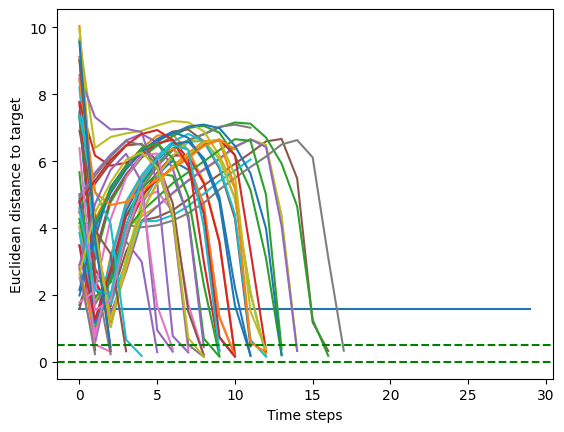

In [18]:
plt.plot(ref)
for i in range(50):
    plt.plot(euclids[i])
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('Euclidean distance to target')
plt.show()

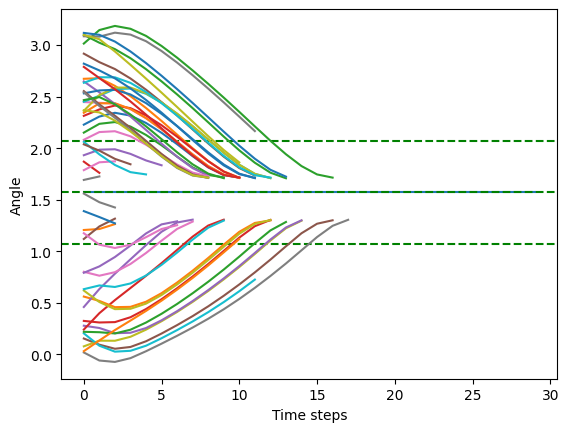

In [19]:
plt.plot(ref)
plt.axhline(y=1.07, color='g', linestyle='--')
plt.axhline(y=1.57, color='g', linestyle='--')
plt.axhline(y=2.07, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims0[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('Angle')
plt.show()

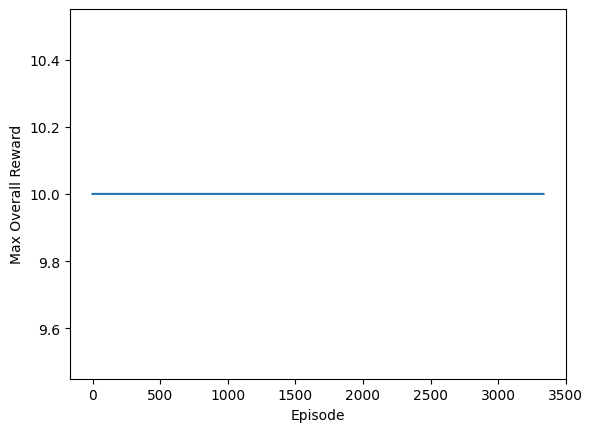

In [42]:
plt.plot(reward_history)
plt.xlabel('Episode')
plt.ylabel('Max Overall Reward')
plt.show()